In [1]:
# !pip install allensdk==2.12.4 # Note this version was used for the original paper, but needed to use most up to date version for jetplot to work
# !pip install scipy==1.6.1

!pip install allensdk
!pip install scipy==1.7.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 500)

import allensdk
from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache
import allensdk.brain_observatory.behavior.behavior_project_cache as bpc

import pkg_resources

# Confirming your allensdk version
print('allensdk version 2.10.2 or higher is required, you have {} installed'.format(pkg_resources.get_distribution("allensdk").version))

allensdk version 2.10.2 or higher is required, you have 2.13.6 installed


In [3]:
c_vals = ['firebrick', 'darkgreen', 'blue', 'darkorange', 'm', 'deeppink', 'r', 'gray', 'g', 'navy', 
                'y', 'purple', 'cyan', 'olive', 'skyblue', 'pink', 'tan']
c_vals_l = ['salmon', 'limegreen', 'cornflowerblue', 'bisque', 'plum', 'pink', 'tomato', 'lightgray', 'g', 'b', 
                      'y', 'purple', 'cyan', 'olive', 'skyblue', 'pink', 'tan']

In [3]:
# Update this to a valid directory in your filesystem
data_storage_directory = Path("content/drive/neuro_research/visual_change/visual_behavior_ophys_cache_dir")

cache = VisualBehaviorOphysProjectCache.from_s3_cache(cache_dir=data_storage_directory)

ophys_session_table.csv: 100%|██████████| 227k/227k [00:00<00:00, 1.09MMB/s] 
behavior_session_table.csv: 100%|██████████| 1.21M/1.21M [00:00<00:00, 6.21MMB/s]
ophys_experiment_table.csv: 100%|██████████| 610k/610k [00:00<00:00, 3.25MMB/s]
ophys_cells_table.csv: 100%|██████████| 4.29M/4.29M [00:00<00:00, 6.77MMB/s]


In [4]:
# To see all of the manifest files available for this dataset online
print(cache.list_manifest_file_names())
# To see the most up-to-date available manifest
cache.latest_manifest_file()
# To see the name of the most up-to-date manifest that you have already downloaded to your system
cache.latest_downloaded_manifest_file()
# List all of the manifest files currently downloaded to your system
cache.list_all_downloaded_manifests()

['visual-behavior-ophys_project_manifest_v0.1.0.json', 'visual-behavior-ophys_project_manifest_v0.2.0.json', 'visual-behavior-ophys_project_manifest_v0.3.0.json', 'visual-behavior-ophys_project_manifest_v1.0.0.json', 'visual-behavior-ophys_project_manifest_v1.0.1.json']


['visual-behavior-ophys_project_manifest_v1.0.1.json']

#### Information About All Sessions

In [ ]:
behavior_sessions = cache.get_behavior_session_table()

print(f"Total number of behavior sessions: {len(behavior_sessions)}")

behavior_sessions.head()

Total number of behavior sessions: 3572


,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,ophys_experiment_id,ophys_container_id,project_code,date_of_acquisition,session_type,file_id
behavior_session_id,,,,,,,,,,,,,,,,,,,,
870987812,BEH.D-Box1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,80.0,Sst-IRES-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-05-17 14:46:33.550,TRAINING_0_gratings_autorewards_15min,1.085368e+09
872953842,BEH.D-Box1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,84.0,Sst-IRES-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-05-21 13:22:20.613,TRAINING_1_gratings,1.085368e+09
873774125,BEH.D-Box1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,85.0,Sst-IRES-Cre,GCaMP6f,NaN,1,NaN,0,NaN,NaN,NaN,NaN,2019-05-22 13:19:52.005,TRAINING_1_gratings,1.085368e+09
874790261,BEH.D-Box1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,86.0,Sst-IRES-Cre,GCaMP6f,NaN,2,NaN,0,NaN,NaN,NaN,NaN,2019-05-23 13:40:31.405,TRAINING_1_gratings,1.085368e+09
875207834,BEH.D-Box1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,87.0,Sst-IRES-Cre,GCaMP6f,NaN,3,NaN,0,NaN,NaN,NaN,NaN,2019-05-24 11:06:39.332,TRAINING_1_gratings,1.085368e+09


In [ ]:
behavior_ophys_sessions = cache.get_ophys_session_table()

print(f"Total number of behavior + ophys sessions: {len(behavior_ophys_sessions)}")

behavior_ophys_sessions.head()

Total number of behavior + ophys sessions: 551


,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,behavior_session_id,ophys_experiment_id,ophys_container_id,project_code,date_of_acquisition,session_type
ophys_session_id,,,,,,,,,,,,,,,,,,,
951410079,MESO.1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,206.0,Sst-IRES-Cre,GCaMP6f,1.0,0,65.0,0,951520319,"[951980471, 951980473, 951980475, 951980479, 9...","[1018028339, 1018028342, 1018028345, 101802835...",VisualBehaviorMultiscope,2019-09-20 09:45:29.897856,OPHYS_1_images_A
952430817,MESO.1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,209.0,Sst-IRES-Cre,GCaMP6f,2.0,0,66.0,1,952554548,"[953659743, 953659745, 953659749, 953659752]","[1018028339, 1018028345, 1018028354, 1018028357]",VisualBehaviorMultiscope,2019-09-23 08:13:07.627573,OPHYS_2_images_A_passive
954954402,MESO.1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,210.0,Sst-IRES-Cre,GCaMP6f,3.0,0,67.0,2,953982960,"[958527464, 958527471, 958527474, 958527479, 9...","[1018028339, 1018028342, 1018028345, 101802835...",VisualBehaviorMultiscope,2019-09-24 16:00:00.000000,OPHYS_3_images_A
955775716,MESO.1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,212.0,Sst-IRES-Cre,GCaMP6f,3.0,1,68.0,3,956010809,"[956941841, 956941844, 956941846]","[1018028339, 1018028342, 1018028345]",VisualBehaviorMultiscope,2019-09-26 08:44:37.199778,OPHYS_3_images_A
957020350,MESO.1,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,457841,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],F,213.0,Sst-IRES-Cre,GCaMP6f,4.0,0,0.0,4,957032492,"[957759562, 957759564, 957759566, 957759570, 9...","[1018028339, 1018028342, 1018028345, 101802835...",VisualBehaviorMultiscope,2019-09-27 08:28:05.415005,OPHYS_4_images_B


In [6]:
def subspace_overlap(a, b):
    """ Calculates the amount of subspace overlap

    a: (n, m) matrix
    b: (n, p) matrix
    
    Returns:
    dim(a \cap b)/min[dim(a), dim(b)]
    """

    a_rank = np.linalg.matrix_rank(a)
    b_rank = np.linalg.matrix_rank(b)
    min_rank = np.min((a_rank, b_rank))

    a_b = np.concatenate((a, b), axis=1) # (n, m+k) matrix
    a_b_rank = np.linalg.matrix_rank(a_b)

    # Rank of the intersection of a and b
    a_cap_b_rank = a_rank + b_rank - a_b_rank

    return a_cap_b_rank/min_rank

def subspace_perc(A, b):
    """
    A: an N x M matrix, whose column space represents some M-dimensional subspace
    b: an N x P vector
    For each of b's columns, finds the percentage of its magnitude which lies in 
    the subspace formed by the columns of A (its columnspace). Then averages these together
    """
    if len(b.shape) == 1:
        b = b[:, np.newaxis]

    proj = np.matmul(np.matmul(A, np.linalg.inv(np.matmul(A.T, A))), A.T) # N x N matrix
    b_proj = np.matmul(proj, b) # N x P martix

    norm_perc = np.linalg.norm(b_proj, axis=0)/np.linalg.norm(b, axis=0) # P dim vector

    return np.sum(norm_perc**2)/np.min((A.shape[1], b.shape[1]))

n = 90
a_dim = 5
b_dim = 3

a = np.zeros((a_dim, n,))
b = np.zeros((b_dim, n,))

for i in range(a_dim):
    a[i, i] = 1.0
for j in range(b_dim):
    b[j, j] = 1.0

a_b = np.concatenate((a, b), axis=0)

print('a rank:', np.linalg.matrix_rank(a))
print('b rank:', np.linalg.matrix_rank(b))
print('[a b] rank:', np.linalg.matrix_rank(a_b))

overlap = subspace_overlap(a.T, b.T)
overlap_r = subspace_overlap(b.T, a.T)
print('Overlap:', overlap, ' Reversed Overlap:', overlap_r)

overlap = subspace_perc(a.T, b.T)
overlap_r = subspace_perc(b.T, a.T)
print('Overlap:', overlap, ' Reversed Overlap:', overlap_r)

a rank: 5
b rank: 3
[a b] rank: 5
Overlap: 1.0  Reversed Overlap: 1.0
Overlap: 1.0  Reversed Overlap: 1.0


#### Accessing a particular session

In [ ]:
behavior_session = cache.get_behavior_session(behavior_session_id=870987812)

behavior_session_870987812.nwb: 100%|██████████| 51.7M/51.7M [00:02<00:00, 19.9MMB/s]


In [ ]:
# List methods of the session that can be used to get data
print(behavior_session.list_data_attributes_and_methods())

['behavior_session_id', 'get_performance_metrics', 'get_reward_rate', 'get_rolling_performance_df', 'licks', 'metadata', 'raw_running_speed', 'rewards', 'running_speed', 'stimulus_presentations', 'stimulus_templates', 'stimulus_timestamps', 'task_parameters', 'trials']


In [ ]:
# Listing the different stimuli templates
behavior_session.stimulus_templates


,unwarped,warped
image_name,,
gratings_0.0,"[[127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 12...","[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
gratings_90.0,"[[127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 12...","[[255, 255, 255, 255, 255, 255, 255, 255, 255,..."
gratings_180.0,"[[127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 12...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
gratings_270.0,"[[127.0, 127.0, 127.0, 127.0, 127.0, 127.0, 12...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


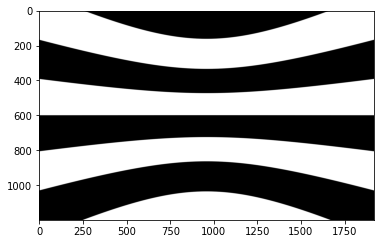

In [ ]:
# Visualizing a particular stimulus
plt.imshow(behavior_session.stimulus_templates['warped']['gratings_90.0'], cmap='gray')

In [ ]:
ophys_experiment = cache.get_behavior_ophys_experiment(ophys_experiment_id=951980471)

behavior_ophys_experiment_951980471.nwb: 100%|██████████| 264M/264M [00:10<00:00, 25.5MMB/s]


In [ ]:
print(ophys_experiment.list_data_attributes_and_methods())

['average_projection', 'behavior_session_id', 'cell_specimen_table', 'corrected_fluorescence_traces', 'dff_traces', 'events', 'eye_tracking', 'eye_tracking_rig_geometry', 'get_cell_specimen_ids', 'get_cell_specimen_indices', 'get_dff_traces', 'get_performance_metrics', 'get_reward_rate', 'get_rolling_performance_df', 'get_segmentation_mask_image', 'licks', 'max_projection', 'metadata', 'motion_correction', 'ophys_experiment_id', 'ophys_session_id', 'ophys_timestamps', 'raw_running_speed', 'rewards', 'roi_masks', 'running_speed', 'segmentation_mask_image', 'stimulus_presentations', 'stimulus_templates', 'stimulus_timestamps', 'task_parameters', 'trials']


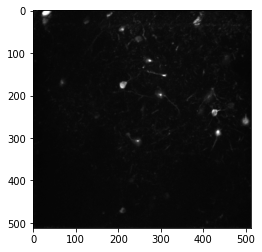

In [ ]:
plt.imshow(ophys_experiment.max_projection, cmap='gray')

### Examine full training history of one mouse

In [ ]:
# The behavior_session_table is a Pandas DataFrame with one row for every session and a collection of informative columns
# - It's important to note that this table contains every session, including sessions performed on a two-photon imaging rig 
#   (session_type starts with OPHYS_) and pre-imaging (aka 'training') sessions, (session_type starts with TRAINING_).
behavior_session_table = cache.get_behavior_session_table()   
# We can view 10 randomly selected rows of the table using the Pandas sample command.
behavior_session_table.sample(10)

,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,ophys_experiment_id,ophys_container_id,project_code,date_of_acquisition,session_type,file_id
behavior_session_id,,,,,,,,,,,,,,,,,,,,
913684329,BEH.G-Box6,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,467951,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,104.0,Vip-IRES-Cre,GCaMP6f,NaN,1,6.0,0,NaN,NaN,NaN,NaN,2019-07-29 08:57:45.094,TRAINING_5_images_B_handoff_ready,1.081704e+09
921759097,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,464207,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",F,133.0,Slc17a7-IRES2-Cre,GCaMP6f,3.0,0,22.0,2,920317769.0,[920976741],[915584942],VisualBehaviorTask1B,2019-08-09 08:50:32.723,OPHYS_3_images_B,NaN
959883227,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,479458,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,112.0,Slc17a7-IRES2-Cre,GCaMP6f,0.0,2,8.0,0,NaN,NaN,NaN,NaN,2019-10-02 11:31:03.567,OPHYS_0_images_B_habituation,1.085375e+09
847874940,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,96.0,Slc17a7-IRES2-Cre,GCaMP6f,0.0,2,10.0,0,NaN,NaN,NaN,NaN,2019-04-08 13:27:21.095,OPHYS_0_images_A_habituation,1.085362e+09
908930196,CAM2P.3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,462544,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,118.0,Slc17a7-IRES2-Cre,GCaMP6f,0.0,1,10.0,0,NaN,NaN,NaN,NaN,2019-07-18 13:30:56.027,OPHYS_0_images_B_habituation,1.085370e+09
1032086379,BEH.G-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,512458,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",F,178.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,4,9.0,0,NaN,NaN,NaN,NaN,2020-06-25 09:08:02.232,TRAINING_5_images_B_handoff_ready,1.081777e+09
939977527,BEH.G-Box6,Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,467302,Ai148(TIT2L-GC6f-ICL-tTA2),[Sst-IRES-Cre],M,145.0,Sst-IRES-Cre,GCaMP6f,NaN,0,10.0,0,NaN,NaN,NaN,NaN,2019-09-05 12:37:18.270,TRAINING_5_images_A_handoff_lapsed,1.081729e+09
813041953,CAM2P.5,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,431023,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,91.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,1,5.0,0,NaN,NaN,NaN,NaN,2019-01-24 16:14:11.439,TRAINING_4_images_A_handoff_ready,1.081577e+09
860836980,BEH.D-Box4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,450471,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",F,96.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,2,8.0,0,NaN,NaN,NaN,NaN,2019-05-01 13:39:03.813,TRAINING_5_images_A_handoff_lapsed,1.081603e+09


In [ ]:
# Randomly choose one mouse id from the full list of unique mouse IDs in the dataset
np.random.seed(5)
# mouse_id = np.random.choice(behavior_session_table['mouse_id'].unique())
mouse_id = 445002

In [ ]:
# This will return a subset of the full behavior_session_table in which the mouse_id matches our mouse_id variable (mouse 445002).
# The table should be returned in order of date of acquisition, but we'll use the Pandas command sort_values(by = 'date_of_acquisition') just to be sure.
this_mouse_table = behavior_session_table.query('mouse_id == @mouse_id').sort_values(by = 'date_of_acquisition')
# note that the following is functionally equivalent if you find the syntax easier to read: 
# this_mouse_table = behavior_session_table[behavior_session_table['mouse_id'] == mouse_id]
this_mouse_table

,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,ophys_experiment_id,ophys_container_id,project_code,date_of_acquisition,session_type,file_id
behavior_session_id,,,,,,,,,,,,,,,,,,,,
837658854,BEH.B-Box3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,72.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-03-15 14:49:24.015,TRAINING_0_gratings_autorewards_15min,1.085362e+09
838515247,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,75.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-03-18 13:44:01.474,TRAINING_1_gratings,1.085362e+09
839219841,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,76.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,1,NaN,0,NaN,NaN,NaN,NaN,2019-03-19 12:50:12.068,TRAINING_1_gratings,1.085362e+09
839565422,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,77.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,2,NaN,0,NaN,NaN,NaN,NaN,2019-03-20 13:16:44.461,TRAINING_1_gratings,1.085362e+09
839912316,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,78.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-03-21 12:54:25.388,TRAINING_2_gratings_flashed,1.081589e+09
840581827,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,79.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,1,NaN,0,NaN,NaN,NaN,NaN,2019-03-22 12:56:37.162,TRAINING_2_gratings_flashed,1.081589e+09
841426832,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,82.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,0.0,0,NaN,NaN,NaN,NaN,2019-03-25 13:33:53.275,TRAINING_3_images_A_10uL_reward,1.081589e+09
841827774,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,83.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,1,1.0,0,NaN,NaN,NaN,NaN,2019-03-26 12:43:01.470,TRAINING_3_images_A_10uL_reward,1.081590e+09
842385277,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,84.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,2,2.0,0,NaN,NaN,NaN,NaN,2019-03-27 12:13:04.923,TRAINING_3_images_A_10uL_reward,1.081591e+09


In [ ]:
""" iterate over all sessions for this mouse, build a behavior_session_dict which 
will have one behavior session object for every session that this mouse performed, 
with the key being the behavior_session_id """

behavior_session_ids = this_mouse_table.index.values
behavior_session_dict = {}
for behavior_session_id in behavior_session_ids:
    behavior_session_dict[behavior_session_id] = cache.get_behavior_session(behavior_session_id)

behavior_session_837658854.nwb: 100%|██████████| 51.7M/51.7M [00:02<00:00, 20.4MMB/s]
behavior_session_838515247.nwb: 100%|██████████| 66.9M/66.9M [00:02<00:00, 32.9MMB/s]
behavior_session_839219841.nwb: 100%|██████████| 66.7M/66.7M [00:02<00:00, 23.7MMB/s]
behavior_session_839565422.nwb: 100%|██████████| 66.7M/66.7M [00:03<00:00, 19.6MMB/s]
behavior_session_839912316.nwb: 100%|██████████| 68.0M/68.0M [00:03<00:00, 21.9MMB/s]
behavior_session_840581827.nwb: 100%|██████████| 68.0M/68.0M [00:02<00:00, 23.7MMB/s]
behavior_session_841426832.nwb: 100%|██████████| 188M/188M [00:09<00:00, 20.1MMB/s]
behavior_session_841827774.nwb: 100%|██████████| 188M/188M [00:07<00:00, 23.7MMB/s]
behavior_session_842385277.nwb: 100%|██████████| 188M/188M [00:08<00:00, 22.5MMB/s]
behavior_session_842819933.nwb: 100%|██████████| 188M/188M [00:08<00:00, 22.1MMB/s]
behavior_session_843400453.nwb: 100%|██████████| 193M/193M [00:08<00:00, 21.5MMB/s]
behavior_session_844199758.nwb: 100%|██████████| 193M/193M [00:0

In [ ]:
behavior_session_id = behavior_session_ids[-1]
behavior_session_dict[behavior_session_id].list_data_attributes_and_methods()

['behavior_session_id',
 'get_performance_metrics',
 'get_reward_rate',
 'get_rolling_performance_df',
 'licks',
 'metadata',
 'raw_running_speed',
 'rewards',
 'running_speed',
 'stimulus_presentations',
 'stimulus_templates',
 'stimulus_timestamps',
 'task_parameters',
 'trials']

In [ ]:
behavior_session = behavior_session_dict[behavior_session_id]
behavior_session.running_speed?

In [ ]:
behavior_session_dict[behavior_session_id].task_parameters

{'auto_reward_volume': 0.005,
 'blank_duration_sec': [0.5, 0.5],
 'n_stimulus_frames': 69255,
 'omitted_flash_fraction': 0.05,
 'response_window_sec': [0.15, 0.75],
 'reward_volume': 0.007,
 'session_type': 'OPHYS_5_images_B_passive',
 'stimulus': 'images',
 'stimulus_distribution': 'geometric',
 'stimulus_duration_sec': 0.25,
 'task': 'change detection'}

Look at some of the attributes of the last 'handoff ready session

In [ ]:
behavior_session_id = this_mouse_table.query('session_type == "TRAINING_5_images_A_handoff_ready"').index[-1]
# note that the following is functionally equivalent if you find the syntax easier to read: 
# behavior_session_id = this_mouse_table[this_mouse_table['session_type'] == "TRAINING_5_images_A_handoff_ready"].index[-1]
dataset = behavior_session_dict[behavior_session_id]

In [ ]:
dataset.list_data_attributes_and_methods()

['behavior_session_id',
 'get_performance_metrics',
 'get_reward_rate',
 'get_rolling_performance_df',
 'licks',
 'metadata',
 'raw_running_speed',
 'rewards',
 'running_speed',
 'stimulus_presentations',
 'stimulus_templates',
 'stimulus_timestamps',
 'task_parameters',
 'trials']

In [ ]:
# DataFrame containing trial by trial behavior response performance metrics.
roll_performance_df = dataset.get_rolling_performance_df()

In [ ]:
dataset.stimulus_presentations.head(5)

,duration,end_frame,image_index,image_name,image_set,index,omitted,start_frame,start_time,stop_time,is_change
stimulus_presentations_id,,,,,,,,,,,
0,0.250208,18000.0,0,im065,Natural_Images_Lum_Matched_set_training_2017.0...,0,False,17985.0,300.001180,300.251388,False
1,0.250228,18045.0,0,im065,Natural_Images_Lum_Matched_set_training_2017.0...,1,False,18030.0,300.751814,301.002042,False
2,0.250259,18090.0,0,im065,Natural_Images_Lum_Matched_set_training_2017.0...,2,False,18075.0,301.502388,301.752647,False
3,0.250277,18136.0,0,im065,Natural_Images_Lum_Matched_set_training_2017.0...,3,False,18121.0,302.269753,302.520030,False
4,0.250199,18181.0,0,im065,Natural_Images_Lum_Matched_set_training_2017.0...,4,False,18166.0,303.020392,303.270591,False


In [ ]:
dataset.licks.sample(5)

,timestamps,frame
1358,1711.951974,102631
1598,1973.521310,118312
1363,1724.946260,103410
503,780.270804,46777
988,1389.131275,83278


In [ ]:
dataset.rewards.sample(5)

,volume,timestamps,autorewarded
100,0.007,2041.578365,False
29,0.007,813.631992,False
6,0.007,401.736694,False
24,0.007,720.820943,False
25,0.007,761.721954,False


In [ ]:
dataset.running_speed.head()

,timestamps,speed
0,0.000000,0.010719
1,0.016554,-0.034077
2,0.033231,-0.079193
3,0.049912,-0.121338
4,0.067623,-0.156735


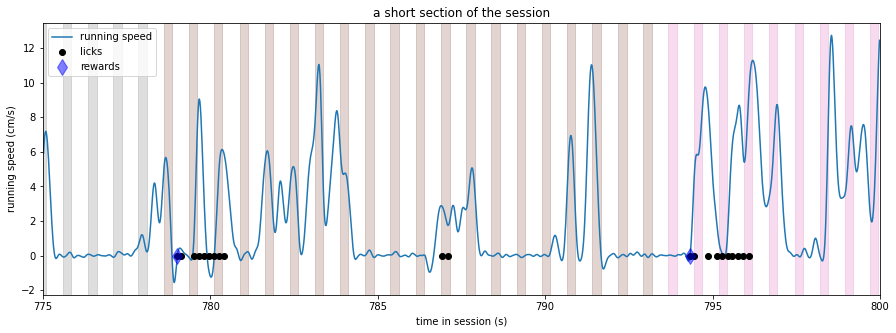

In [ ]:
# Add a column to the stimulus_presentations table that assigns a unique color to every stimulus
unique_stimuli = [stimulus for stimulus in dataset.stimulus_presentations['image_name'].unique()]
colormap = {image_name: sns.color_palette()[image_number] for image_number, image_name in enumerate(np.sort(unique_stimuli))}
dataset.stimulus_presentations['color'] = dataset.stimulus_presentations['image_name'].map(lambda image_name: colormap[image_name])

def plot_running(ax, initial_time, final_time):
    '''
    a simple function to plot running speed between two specified times on a specified axis
    inputs:
        ax: axis on which to plot
        intial_time: initial time to plot from
        final_time: final time to plot to
    '''
    running_sample = dataset.running_speed.query('timestamps >= @initial_time and timestamps <= @final_time')
    ax.plot(
        running_sample['timestamps'],
        running_sample['speed']
    )

def plot_licks(ax, initial_time, final_time):
    '''
    a simple function to plot licks as dots between two specified times on a specified axis
    inputs:
        ax: axis on which to plot
        intial_time: initial time to plot from
        final_time: final time to plot to
    '''
    licking_sample = dataset.licks.query('timestamps >= @initial_time and timestamps <= @final_time')
    ax.plot(
        licking_sample['timestamps'],
        np.zeros_like(licking_sample['timestamps']),
        marker = 'o',
        color = 'black',
        linestyle = 'none'
    )
    
def plot_rewards(ax, initial_time, final_time):
    '''
    a simple function to plot rewards between two specified times as blue diamonds on a specified axis
    inputs:
        ax: axis on which to plot
        intial_time: initial time to plot from
        final_time: final time to plot to
    '''
    rewards_sample = dataset.rewards.query('timestamps >= @initial_time and timestamps <= @final_time')
    ax.plot(
        rewards_sample['timestamps'],
        np.zeros_like(rewards_sample['timestamps']),
        marker = 'd',
        color = 'blue',
        linestyle = 'none',
        markersize = 12,
        alpha = 0.5
    )
    
def plot_stimuli(ax, ti, tf):
    '''
    a simple function to plot stimuli as colored vertical spans on a s
    inputs:
        ax: axis on which to plot
        intial_time: initial time to plot from
        final_time: final time to plot to
    '''
    stimulus_presentations_sample = dataset.stimulus_presentations.query('stop_time >= @initial_time and start_time <= @final_time')
    for idx, stimulus in stimulus_presentations_sample.iterrows():
        ax.axvspan(stimulus['start_time'], stimulus['stop_time'], color=stimulus['color'], alpha=0.25)

initial_time = 775 # initial time for plot, in seconds
final_time = 800 # final time for plot, in seconds
fig, ax = plt.subplots(figsize = (15,5))
plot_running(ax, initial_time, final_time)
plot_licks(ax, initial_time, final_time)
plot_rewards(ax, initial_time, final_time)
plot_stimuli(ax, initial_time, final_time)

ax.legend(['running speed', 'licks', 'rewards'])

ax.set_ylabel('running speed (cm/s)')
ax.set_xlabel('time in session (s)')
ax.set_xlim(initial_time, final_time)
ax.set_title('a short section of the session');

In [ ]:
# random sample of 5 trials
dataset.trials[0:30]

,start_time,stop_time,lick_times,reward_time,reward_volume,hit,false_alarm,miss,stimulus_change,aborted,go,catch,auto_rewarded,correct_reject,trial_length,response_time,change_frame,change_time,response_latency,initial_image_name,change_image_name
trials_id,,,,,,,,,,,,,,,,,,,,,
0,299.984507,301.719277,"[301.2021932383068, 301.40235704928637]",NaN,0.000,False,False,False,False,True,False,False,False,False,1.734770,NaN,NaN,NaN,NaN,im065,im065
1,302.253081,303.337323,"[302.75350365927443, 303.02039194107056]",NaN,0.000,False,False,False,False,True,False,False,False,False,1.084242,NaN,NaN,NaN,NaN,im065,im065
2,303.754343,311.794417,"[307.99121883511543, 308.30814856570214, 308.4...",307.674296,0.005,False,False,False,True,False,False,False,True,False,8.040074,307.991219,18435.0,307.528656,0.462563,im065,im061
3,312.027943,315.864614,[315.5476693692617],NaN,0.000,False,False,False,False,True,False,False,False,False,3.836671,NaN,NaN,NaN,NaN,im061,im061
4,316.565178,324.621952,"[321.16906059673056, 321.55271181836724, 321.7...",320.485227,0.005,False,False,False,True,False,False,False,True,False,8.056774,321.169061,19203.0,320.339496,0.829564,im061,im062
5,324.822127,325.389271,"[324.855505079031, 325.0723343649879]",NaN,0.000,False,False,False,False,True,False,False,False,False,0.567143,NaN,NaN,NaN,NaN,im062,im062
6,325.572769,332.862218,"[329.05898615997285, 329.1757669779472, 329.57...",328.742087,0.005,False,False,False,True,False,False,False,True,False,7.289449,329.058986,19698.0,328.596458,0.462528,im062,im061
7,333.112416,333.496065,[333.17916370369494],NaN,0.000,False,False,False,False,True,False,False,False,False,0.383649,NaN,NaN,NaN,NaN,im061,im061
8,333.863064,335.164137,[334.8471979992464],NaN,0.000,False,False,False,False,True,False,False,False,False,1.301073,NaN,NaN,NaN,NaN,im061,im061


In [ ]:
roll_performance_df[0:30]

,reward_rate,hit_rate_raw,hit_rate,false_alarm_rate_raw,false_alarm_rate,rolling_dprime
trials_id,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# We can examine one trial in some detail. Let's randomly select a hit trial.
dataset.trials.query('hit').sample(random_state=0).to_dict('records')

[{'aborted': False,
  'auto_rewarded': False,
  'catch': False,
  'change_frame': 50014.0,
  'change_image_name': 'im069',
  'change_time': 834.287206646593,
  'correct_reject': False,
  'false_alarm': False,
  'go': True,
  'hit': True,
  'initial_image_name': 'im063',
  'lick_times': array([834.69975263, 834.81651755, 835.1001309 , 835.25021287,
         835.40033855, 835.53378616, 835.68391515, 835.83403254,
         836.01752922, 836.16765357, 836.33444306, 836.51795332,
         836.6513857 ]),
  'miss': False,
  'response_latency': 0.41254598174464263,
  'response_time': 834.6997526283376,
  'reward_time': 834.6997526283376,
  'reward_volume': 0.007,
  'start_time': 831.2635398912244,
  'stimulus_change': True,
  'stop_time': 838.5529783256352,
  'trial_length': 7.28943843441084}]

In [ ]:
behavior_session_dict[behavior_session_id].rolling_performance_df?

Object `rolling_performance_df` not found.


In [ ]:
# One useful method is the get_performance_metrics method, which returns some 
# summary metrics on the session, derived from the 'rolling_performance_df'
behavior_session_dict[behavior_session_id].get_performance_metrics()

{'auto_reward_count': 5,
 'catch_trial_count': 41,
 'correct_reject_trial_count': 37,
 'earned_reward_count': 112,
 'engaged_trial_count': 286,
 'false_alarm_trial_count': 4,
 'go_trial_count': 285,
 'hit_trial_count': 112,
 'max_dprime': 2.1577849816633154,
 'max_dprime_engaged': 2.1577849816633154,
 'maximum_reward_rate': 4.538096320942588,
 'mean_dprime': 1.1510474492903153,
 'mean_dprime_engaged': 1.6017817039091797,
 'mean_false_alarm_rate': 0.149303880370626,
 'mean_false_alarm_rate_engaged': 0.26905802530802525,
 'mean_false_alarm_rate_uncorrected': 0.14679636896218598,
 'mean_hit_rate': 0.5083809219533421,
 'mean_hit_rate_engaged': 0.8257788159919642,
 'mean_hit_rate_uncorrected': 0.5117040303378002,
 'miss_trial_count': 173,
 'total_reward_count': 117,
 'total_reward_volume': 0.8090000000000003,
 'trial_count': 516}

In [ ]:
# Build out a new table that has all performance data for EVERY session (for this mouse) as follows
behavior_performance_table = pd.DataFrame(
    [behavior_session_dict[behavior_session_id].get_performance_metrics() for behavior_session_id in behavior_session_ids]
).set_index(behavior_session_ids)

In [ ]:
behavior_performance_table.head()

,trial_count,go_trial_count,catch_trial_count,hit_trial_count,miss_trial_count,false_alarm_trial_count,correct_reject_trial_count,auto_reward_count,earned_reward_count,total_reward_count,total_reward_volume,maximum_reward_rate,engaged_trial_count,mean_hit_rate,mean_hit_rate_uncorrected,mean_hit_rate_engaged,mean_false_alarm_rate,mean_false_alarm_rate_uncorrected,mean_false_alarm_rate_engaged,mean_dprime,mean_dprime_engaged,max_dprime,max_dprime_engaged
837658854,118,0,0,0,0,0,0,118,0,118,0.590,4.852157,101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
838515247,1405,133,13,106,27,6,7,5,106,111,1.085,5.294545,346,0.808946,0.819726,0.822212,0.574381,0.624039,0.421906,0.662053,1.145407,1.832280,1.832280
839219841,451,335,61,48,287,1,60,29,48,77,0.625,5.015095,49,0.231115,0.233778,0.809956,0.059502,0.025165,0.176463,0.452645,1.875796,2.288211,2.288211
839565422,683,269,41,107,162,4,37,15,107,122,1.145,5.393113,403,0.523621,0.529213,0.877314,0.192331,0.169870,0.377171,1.208391,1.599180,2.201408,2.201408
839912316,966,174,20,103,71,6,14,10,103,113,1.080,3.833645,583,0.778670,0.785813,0.919466,0.439618,0.511879,0.586558,1.164035,1.240594,1.679661,1.644854


In [ ]:
# for convenience, we should merge this with the existing table we built for this mouse
this_mouse_table = this_mouse_table.merge(
    behavior_performance_table,
    left_index = True,
    right_index = True,
)
this_mouse_table.head()


,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,ophys_experiment_id,ophys_container_id,project_code,date_of_acquisition,session_type,file_id,trial_count,go_trial_count,catch_trial_count,hit_trial_count,miss_trial_count,false_alarm_trial_count,correct_reject_trial_count,auto_reward_count,earned_reward_count,total_reward_count,total_reward_volume,maximum_reward_rate,engaged_trial_count,mean_hit_rate,mean_hit_rate_uncorrected,mean_hit_rate_engaged,mean_false_alarm_rate,mean_false_alarm_rate_uncorrected,mean_false_alarm_rate_engaged,mean_dprime,mean_dprime_engaged,max_dprime,max_dprime_engaged
behavior_session_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
837658854,BEH.B-Box3,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,72.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-03-15 14:49:24.015,TRAINING_0_gratings_autorewards_15min,1.085362e+09,118,0,0,0,0,0,0,118,0,118,0.590,4.852157,101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
838515247,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,75.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-03-18 13:44:01.474,TRAINING_1_gratings,1.085362e+09,1405,133,13,106,27,6,7,5,106,111,1.085,5.294545,346,0.808946,0.819726,0.822212,0.574381,0.624039,0.421906,0.662053,1.145407,1.832280,1.832280
839219841,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,76.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,1,NaN,0,NaN,NaN,NaN,NaN,2019-03-19 12:50:12.068,TRAINING_1_gratings,1.085362e+09,451,335,61,48,287,1,60,29,48,77,0.625,5.015095,49,0.231115,0.233778,0.809956,0.059502,0.025165,0.176463,0.452645,1.875796,2.288211,2.288211
839565422,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,77.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,2,NaN,0,NaN,NaN,NaN,NaN,2019-03-20 13:16:44.461,TRAINING_1_gratings,1.085362e+09,683,269,41,107,162,4,37,15,107,122,1.145,5.393113,403,0.523621,0.529213,0.877314,0.192331,0.169870,0.377171,1.208391,1.599180,2.201408,2.201408
839912316,BEH.B-Box1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,445002,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,78.0,Slc17a7-IRES2-Cre,GCaMP6f,NaN,0,NaN,0,NaN,NaN,NaN,NaN,2019-03-21 12:54:25.388,TRAINING_2_gratings_flashed,1.081589e+09,966,174,20,103,71,6,14,10,103,113,1.080,3.833645,583,0.778670,0.785813,0.919466,0.439618,0.511879,0.586558,1.164035,1.240594,1.679661,1.644854


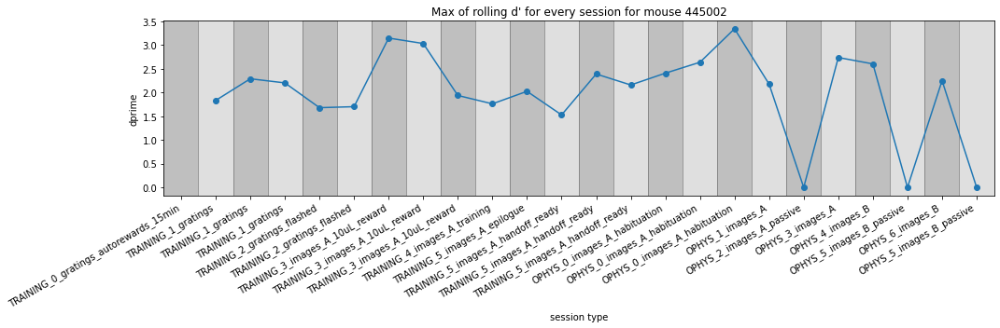

In [ ]:
#Plot the max_dprime value for every session
fig, ax = plt.subplots(figsize = (15,5))

ax.plot(
    np.arange(len(this_mouse_table)),
    this_mouse_table['max_dprime'],
    marker = 'o'
)
ax.set_xticks(range(len(this_mouse_table)))
ax.set_xticklabels(list(this_mouse_table['session_type'].values),rotation = 30, ha='right')

# make alternating black/gray vspans for visual clarity
colors = ['black', 'gray']
for ii in range(len(this_mouse_table)):
    ax.axvspan(ii - 0.5, ii + 0.5, color = colors[ii%2], alpha=0.25)

ax.set_xlim(-0.5, len(this_mouse_table) - 0.5)
ax.set_ylabel('dprime')
ax.set_xlabel('session type')
ax.set_title("Max of rolling d' for every session for mouse {}".format(mouse_id))
fig.tight_layout()

### Ophys data

In [ ]:
behavior_session_table = cache.get_behavior_session_table()  

# Collect all ophys experiments in a table
experiment_table = cache.get_ophys_experiment_table()
experiment_table.sample(5)                       

,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,imaging_depth,targeted_structure,date_of_acquisition,session_type,experience_level,passive,image_set,file_id
ophys_experiment_id,,,,,,,,,,,,,,,,,,,,,,,,,
1097813087,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,554115,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,210.0,Vip-IRES-Cre,GCaMP6f,2.0,0.0,56.0,2.0,1097660186,1097698064,1095625247,VisualBehaviorMultiscope4areasx2d,249,VISal,2021-04-19 10:42:35.121600,OPHYS_2_images_G_passive,Familiar,True,G,1120144271
964615743,MESO.1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,472271,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,154.0,Slc17a7-IRES2-Cre,GCaMP6f,6.0,0.0,2.0,5.0,963749922,964008613,1018027721,VisualBehaviorMultiscope4areasx2d,183,VISp,2019-10-09 10:44:31.238545,OPHYS_6_images_H,Novel >1,False,H,1120140412
968717796,MESO.1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,477052,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,137.0,Slc17a7-IRES2-Cre,GCaMP6f,5.0,0.0,2.0,5.0,968504496,968604937,1018028018,VisualBehaviorMultiscope4areasx2d,175,VISp,2019-10-16 13:39:06.239820,OPHYS_5_images_H_passive,Novel >1,True,H,1120140502
972760498,MESO.1,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,481295,Ai93(TITL-GCaMP6f),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",F,124.0,Slc17a7-IRES2-Cre,GCaMP6f,5.0,0.0,2.0,6.0,972297120,972433204,1018027936,VisualBehaviorMultiscope4areasx2d,187,VISp,2019-10-24 08:45:11.305568,OPHYS_5_images_H_passive,Novel >1,True,H,1120141195
1098014572,MESO.1,Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,554115,Ai148(TIT2L-GC6f-ICL-tTA2),[Vip-IRES-Cre],M,211.0,Vip-IRES-Cre,GCaMP6f,3.0,0.0,57.0,3.0,1097893149,1097923967,1095625228,VisualBehaviorMultiscope4areasx2d,165,VISp,2021-04-20 10:29:35.182636,OPHYS_3_images_G,Familiar,False,G,1120144275


In [ ]:
# Here are all of the unique session types
np.sort(experiment_table['session_type'].unique())

array(['OPHYS_1_images_A', 'OPHYS_1_images_B', 'OPHYS_1_images_G',
       'OPHYS_2_images_A_passive', 'OPHYS_2_images_B_passive',
       'OPHYS_2_images_G_passive', 'OPHYS_3_images_A', 'OPHYS_3_images_B',
       'OPHYS_3_images_G', 'OPHYS_4_images_A', 'OPHYS_4_images_B',
       'OPHYS_4_images_H', 'OPHYS_5_images_A_passive',
       'OPHYS_5_images_B_passive', 'OPHYS_5_images_H_passive',
       'OPHYS_6_images_A', 'OPHYS_6_images_B', 'OPHYS_6_images_H'],
      dtype=object)

In [ ]:
# Get specs about a particular experiment ID
print('Experiment id:', experiment_id)
experiment_table.loc[experiment_id]

NameError: ignored

##### Single experiment id

In [ ]:
# Rejected ids: 412366, 456564, 479458
# experiment_table.query('mouse_id == "533161"') # Mouse 3 (Exc)
# experiment_table.query('mouse_id == "533162"') # Mouse 6 (Exc)
# experiment_table.query('mouse_id == "425496"') # Mouse 7 (Exc)
# experiment_table.query('mouse_id == "425493"') # Mouse 8 (Exc)
# experiment_table.query('equipment_name == "CAM2P.4" and cre_line == "Slc17a7-IRES2-Cre"').sample(5)
# mouse_ids = np.sort(experiment_table.query('cre_line == "Slc17a7-IRES2-Cre"')['mouse_id'].unique())
experiment_table.query('mouse_id == "451787"')[["age_in_days", "session_type", "experience_level", "targeted_structure"]]
# experiment_table.query('mouse_id == "472271" and session_type == "OPHYS_4_images_H"').index.values

# Rejected ids: 476970, 524274
# experiment_table.query('mouse_id == "549976"') # Mouse 1 (Sst)/'
# experiment_table.query('equipment_name == "CAM2P.4" and cre_line == "Sst-IRES-Cre"').sample(5)

# Rejected ids: 429952, 467953
# experiment_table.query('mouse_id == "544261"') # Mouse 1 (Vip)
# experiment_table.query('equipment_name == "CAM2P.4" and cre_line == "Vip-IRES-Cre"').sample(5)

,age_in_days,session_type,experience_level,targeted_structure
ophys_experiment_id,,,,
881003484,125.0,OPHYS_1_images_A,Familiar,VISp
881003487,125.0,OPHYS_1_images_A,Familiar,VISp
881003496,125.0,OPHYS_1_images_A,Familiar,VISl
881003498,125.0,OPHYS_1_images_A,Familiar,VISl
881003493,125.0,OPHYS_1_images_A,Familiar,VISl
882551956,127.0,OPHYS_3_images_A,Familiar,VISp
882551966,127.0,OPHYS_3_images_A,Familiar,VISl
882551968,127.0,OPHYS_3_images_A,Familiar,VISl
882551964,127.0,OPHYS_3_images_A,Familiar,VISl


In [ ]:
# Load a single experiment_id
experiment_id = experiment_table.query('session_type == "OPHYS_4_images_A" and equipment_name == "CAM2P.4" and cre_line == "Slc17a7-IRES2-Cre"').sample(random_state=26).index[0]
experiment_id = experiment_table.query('session_type == "OPHYS_4_images_A" and equipment_name == "CAM2P.4" and cre_line == "Slc17a7-IRES2-Cre"').sample(random_state=26).index[0]

# experiment_id = 1048044013

In [ ]:
# Select an OPHYS_1_images_A experiment at random, load the experiment data
# (Note this downloads it from AWS so takes a while the first time it is run)

# experiment_id = experiment_table.query('session_type == "OPHYS_4_images_A"').sample(random_state=26).index[0]
experiment_id = 1048044013

print('Mouse ID:', experiment_table.loc[experiment_id]['mouse_id'])
print('Session type:', experiment_table.loc[experiment_id]['session_type'])
print('Cre line:', experiment_table.loc[experiment_id]['cre_line'])
print('Equipment name', experiment_table.loc[experiment_id]['equipment_name'])

print('\nGetting experiment data for experiment_id {}'.format(experiment_id))
experiment_dataset = cache.get_behavior_ophys_experiment(experiment_id)

Mouse ID: 533161
Session type: OPHYS_4_images_A
Cre line: Slc17a7-IRES2-Cre
Equipment name CAM2P.4

Getting experiment data for experiment_id 1048044013


behavior_ophys_experiment_1048044013.nwb: 100%|██████████| 936M/936M [00:33<00:00, 28.1MMB/s]


In [ ]:
# Look at the performance data
performance_metrics = experiment_dataset.get_performance_metrics()
print('Hit count:', performance_metrics['hit_trial_count'])
print('Miss count:', performance_metrics['miss_trial_count'])
print('False alarm count:', performance_metrics['false_alarm_trial_count'])
print('Correct reject count:', performance_metrics['correct_reject_trial_count'])

print('\nCell specimen ids:', len(experiment_dataset.dff_traces.reset_index()['cell_specimen_id']))

Hit count: 108
Miss count: 168
False alarm count: 4
Correct reject count: 36

Cell specimen ids: 113


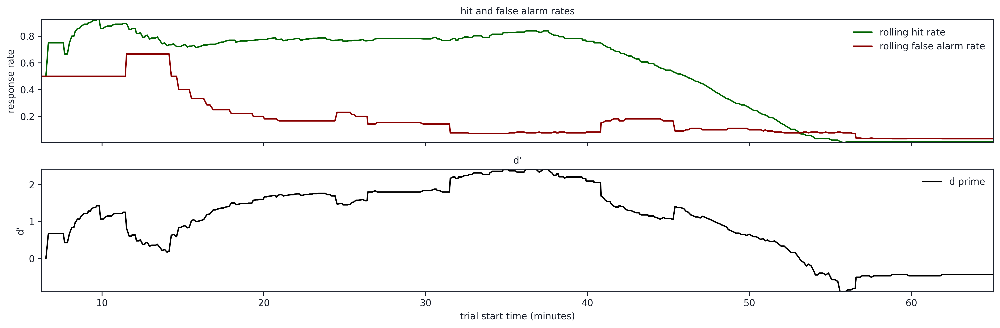

In [ ]:
""" We can build a trial dataframe that tells us about behavior events on every trial. 
This can be merged with a rolling performance dataframe, which calculates behavioral 
performance metrics over a rolling window of 100 trials (excluding aborted trials, 
or trials where the animal licks prematurely)."""

trials_df = experiment_dataset.trials.merge(
    experiment_dataset.get_rolling_performance_df().fillna(method='ffill'), # performance data is NaN on aborted trials. Fill forward to populate.
    left_index = True,
    right_index = True
)


fig, ax = plt.subplots(2, 1, figsize = (15,5), sharex=True)
ax[0].plot(
    trials_df['start_time']/60.,
    trials_df['hit_rate'],
    color='darkgreen'
)

ax[0].plot(
    trials_df['start_time']/60.,
    trials_df['false_alarm_rate'],
    color='darkred'
)

ax[0].legend(['rolling hit rate', 'rolling false alarm rate'])

ax[1].plot(
    trials_df['start_time']/60.,
    trials_df['rolling_dprime'],
    color='black'
)

ax[1].legend(['d prime'])

ax[1].set_xlabel('trial start time (minutes)')
ax[0].set_ylabel('response rate')
ax[1].set_ylabel("d'")
ax[0].set_title('hit and false alarm rates')
ax[1].set_title("d'")

fig.tight_layout()

In [ ]:
# For plotting purposes below, let's add a column that specifies a unique color for every unique image
print('Unique image names:', experiment_dataset.stimulus_presentations['image_name'].unique())
unique_stimuli = [stimulus for stimulus in experiment_dataset.stimulus_presentations['image_name'].unique() if stimulus != 'omitted']
colormap = {image_name: sns.color_palette()[image_number] for image_number, image_name in enumerate(np.sort(unique_stimuli))}
colormap['omitted'] = np.nan # assign gray to omitted

experiment_dataset.stimulus_presentations['color'] = experiment_dataset.stimulus_presentations['image_name'].map(lambda image_name: colormap[image_name])

Unique image names: ['im065' 'im061' 'omitted' 'im062' 'im077' 'im063' 'im066' 'im085' 'im069']


In [ ]:
# deltaF/F values. One row per cell, with each containing an array of deltaF/F values.
"""
dataframe columns:
        cell_specimen_id [index]: (int)
            unified id of segmented cell across experiments
            assigned after cell matching
        cell_roi_id: (int)
            experiment specific id of segmented roi,
            assigned before cell matching
        dff: (list of float)
            fluorescence fractional values relative to baseline
            (arbitrary units)
"""
experiment_dataset.dff_traces.head()

,cell_roi_id,dff
cell_specimen_id,,
1086626135,1080742305,"[0.5257051587104797, 0.19550065696239471, 0.27..."
1086632456,1080742306,"[0.34548845887184143, 0.4213186502456665, 0.12..."
1086632837,1080742307,"[0.3670087456703186, 0.30781885981559753, 0.19..."
1086621949,1080742309,"[0.3818071186542511, 0.280838280916214, 0.2819..."
1086628509,1080742322,"[0.2807539403438568, 0.15003176033496857, 0.26..."


In [ ]:
print('Shape of dataframe:', experiment_dataset.dff_traces.shape)
print('Length of single dff array:', len(experiment_dataset.dff_traces.iloc[0, 1]))

Shape of dataframe: (113, 2)
Length of single dff array: 140120


In [ ]:
# we can convert the dff_traces to long-form (aka "tidy") as follows
# (Example: For each of the 47 cell_specimen_id's, organizes the 48288 dff values by
# their corresponding timestamp. So this new DatFrame will be of size
# 47 * 48288 = 2269536.)

def get_cell_timeseries_dict(dataset, cell_specimen_id):
    '''
    for a given cell_specimen ID, this function creates a dictionary with the following keys
    * timestamps: ophys timestamps
    * cell_roi_id
    * cell_specimen_id
    * dff
    This is useful for generating a tidy dataframe
    arguments:
        session object
        cell_specimen_id
    returns
        dict
    '''
    cell_dict = {
        'timestamps': dataset.ophys_timestamps,
        'cell_roi_id': [dataset.dff_traces.loc[cell_specimen_id]['cell_roi_id']] * len(dataset.ophys_timestamps),
        'cell_specimen_id': [cell_specimen_id] * len(dataset.ophys_timestamps),
        'dff': dataset.dff_traces.loc[cell_specimen_id]['dff'],

    }
    return cell_dict

experiment_dataset.tidy_dff_traces = pd.concat(
    [pd.DataFrame(get_cell_timeseries_dict(experiment_dataset, cell_specimen_id)) for cell_specimen_id in experiment_dataset.dff_traces.reset_index()['cell_specimen_id']]
).reset_index(drop=True)

print('New DataFrame size:', experiment_dataset.tidy_dff_traces.shape)
experiment_dataset.tidy_dff_traces.head(10)

New DataFrame size: (15833560, 4)


,timestamps,cell_roi_id,cell_specimen_id,dff
0,3.07741,1080742305,1086626135,0.525705
1,3.10973,1080742305,1086626135,0.195501
2,3.14205,1080742305,1086626135,0.272024
3,3.17437,1080742305,1086626135,0.351819
4,3.20669,1080742305,1086626135,0.261235
5,3.23901,1080742305,1086626135,0.317398
6,3.27133,1080742305,1086626135,0.113132
7,3.30366,1080742305,1086626135,0.232735
8,3.33598,1080742305,1086626135,0.086090
9,3.36830,1080742305,1086626135,0.040477


In [ ]:
####  We can look at a few trials in some detail
# First define a function to plot a number of data streams
# - each stimulus as a colored vertical bar
# - running speed
# - licks/rewards
# - pupil area
# - neural responses (dF/F)
def plot_stimuli(trial, ax):
    '''
    plot stimuli as colored bars on specified axis
    '''
    stimuli = experiment_dataset.stimulus_presentations.query('stop_time >= {} and start_time <= {} and not omitted'.format(float(trial['start_time']), float(trial['stop_time'])))
    for idx, stimulus in stimuli.iterrows():
        ax.axvspan(stimulus['start_time'], stimulus['stop_time'], color=stimulus['color'], alpha=0.5)

        
def plot_running(trial, ax):
    '''
    plot running speed for trial on specified axes
    '''
    trial_running_speed = experiment_dataset.running_speed.query('timestamps >= {} and timestamps <= {} '.format(float(trial['start_time']), float(trial['stop_time'])))
    ax.plot(
        trial_running_speed['timestamps'],
        trial_running_speed['speed'],
        color='black'
    )
    ax.set_title('running speed')
    ax.set_ylabel('speed (cm/s)')
    

def plot_licks(trial, ax):
    '''
    plot licks as black dots on specified axis
    '''
    trial_licks = experiment_dataset.licks.query('timestamps >= {} and timestamps <= {} '.format(float(trial['start_time']), float(trial['stop_time'])))
    ax.plot(
        trial_licks['timestamps'],
        np.zeros_like(trial_licks['timestamps']),
        marker = 'o',
        linestyle = 'none',
        color='black'
    )
    

def plot_rewards(trial, ax):
    '''
    plot rewards as blue diamonds on specified axis
    '''
    trial_rewards = experiment_dataset.rewards.query('timestamps >= {} and timestamps <= {} '.format(float(trial['start_time']), float(trial['stop_time'])))
    ax.plot(
        trial_rewards['timestamps'],
        np.zeros_like(trial_rewards['timestamps']),
        marker = 'd',
        linestyle = 'none',
        color='blue',
        markersize = 10,
        alpha = 0.25
    )
    
def plot_pupil(trial, ax):
    '''
    plot pupil area on specified axis
    '''
    trial_eye_tracking = experiment_dataset.eye_tracking.query('timestamps >= {} and timestamps <= {} '.format(float(trial['start_time']), float(trial['stop_time'])))
    ax.plot(
        trial_eye_tracking['timestamps'],
        trial_eye_tracking['pupil_area'],
        color='black'
    )
    ax.set_title('pupil area')
    ax.set_ylabel('pupil area\n$(pixels^2)$')
    

def plot_dff(trial, ax):
    '''
    plot each cell's dff response for a given trial
    '''
    trial_dff_traces = experiment_dataset.tidy_dff_traces.query('timestamps >= {} and timestamps <= {} '.format(float(trial['start_time']), float(trial['stop_time'])))
    for cell_specimen_id in experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique():
        ax.plot(
            trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['timestamps'],
            trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['dff'],
            marker = '.', color='k'
        )
        ax.set_title('deltaF/F responses')
        ax.set_ylabel('dF/F')
    
    print('Response window: {} to {}'.format(float(trial['change_time']) + 0.150,
                                             float(trial['change_time']) + 0.750))
    ax.axvline(float(trial['change_time']) + 0.150, color='k', linestyle='dashed')
    ax.axvline(float(trial['change_time']) + 0.750, color='k', linestyle='dashed')
    # ax.axvline(float(trial['change_time']) + 0.150 - 0.750, color='k', linestyle='dashed')
    # ax.axvline(float(trial['change_time']) + 0.750 - 0.750, color='k', linestyle='dashed')


def make_trial_plot(trial):
    '''
    combine all plots for a given trial
    '''
    fig, axes = plt.subplots(4, 1, figsize = (15, 8), sharex=True)

    for ax in axes:
        plot_stimuli(trial, ax)
            
    plot_running(trial, axes[0])

    plot_licks(trial, axes[1])
    plot_rewards(trial, axes[1])
    
    axes[1].set_title('licks and rewards')
    axes[1].set_yticks([])
    axes[1].legend(['licks','rewards'])

    plot_pupil(trial, axes[2])

    plot_dff(trial, axes[3])
    
    axes[3].set_xlabel('time in session (seconds)')
    fig.tight_layout()
    return fig, axes

Response window: 405.1276688940706 to 405.72766889407063


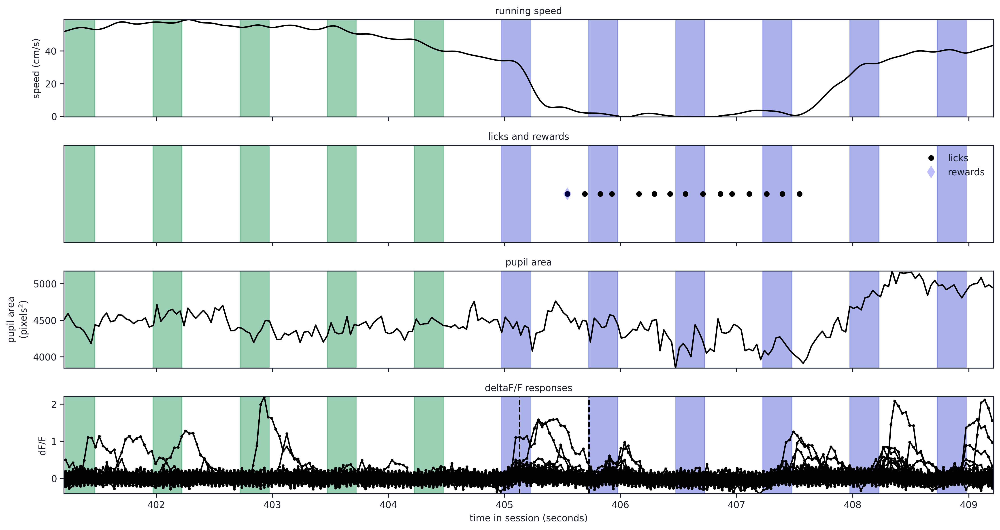

In [ ]:
# Hit trial
# trial = experiment_dataset.trials.query('hit').sample(random_state = 1)
trial = experiment_dataset.trials.query('hit').sample()
fig, axes = make_trial_plot(trial)

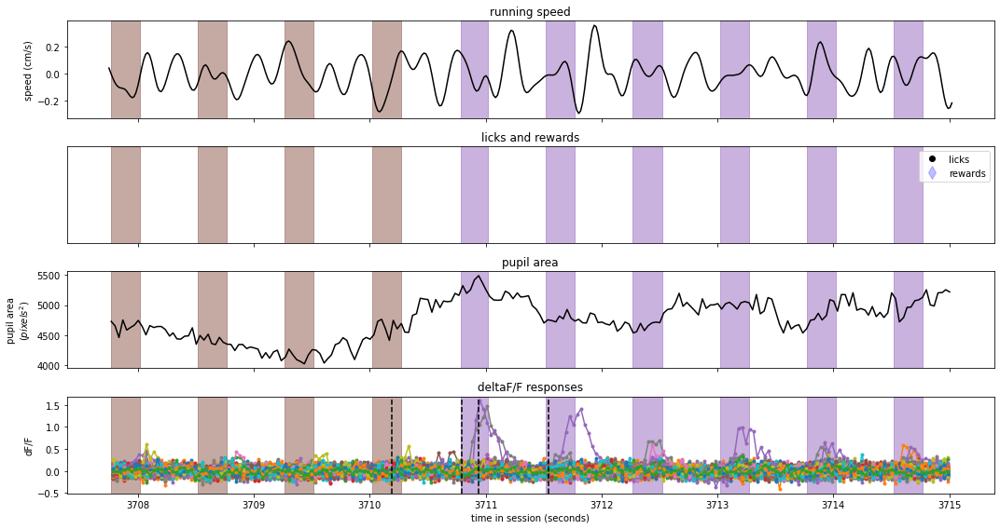

In [ ]:
# Miss trial
# trial = experiment_dataset.trials.query('miss').sample(random_state = 2)
trial = experiment_dataset.trials.query('miss').sample()
fig, axes = make_trial_plot(trial)

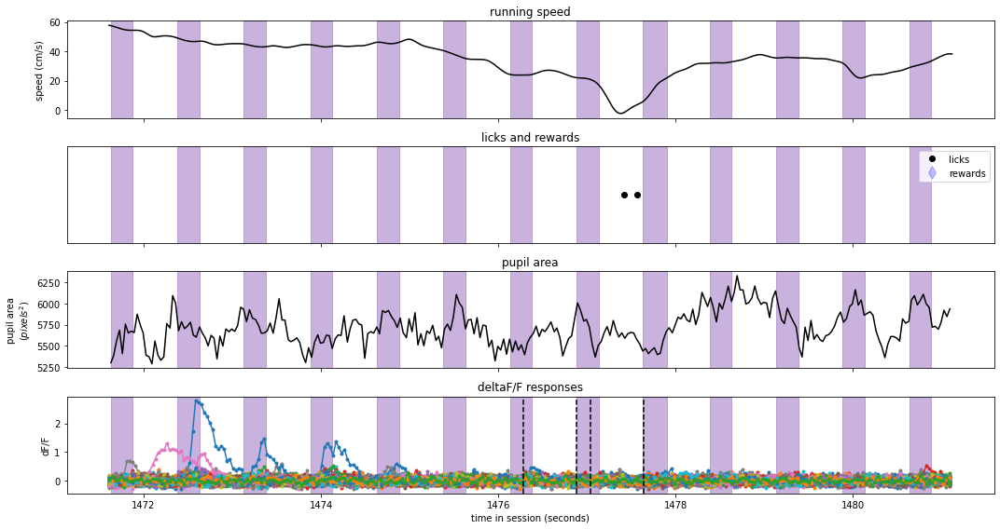

In [ ]:
# false alarm trial
# trial = experiment_dataset.trials.query('false_alarm').sample(random_state = 2)
trial = experiment_dataset.trials.query('false_alarm').sample()
fig, axes = make_trial_plot(trial)

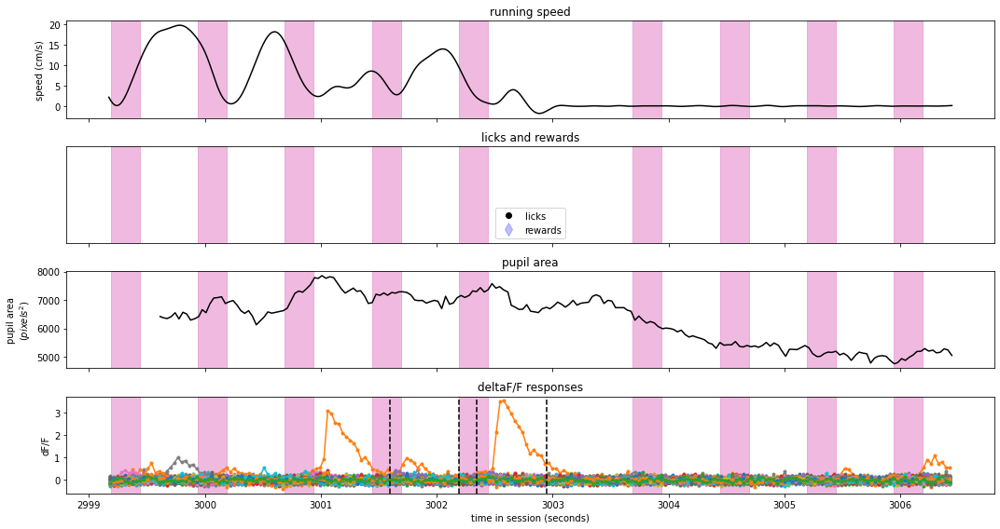

In [ ]:
# Correct rejection trial
# trial = experiment_dataset.trials.query('correct_reject').sample(random_state = 10)
trial = experiment_dataset.trials.query('correct_reject').sample()
fig, axes = make_trial_plot(trial)

Response window: 1116.8079788940706 to 1117.4079788940705


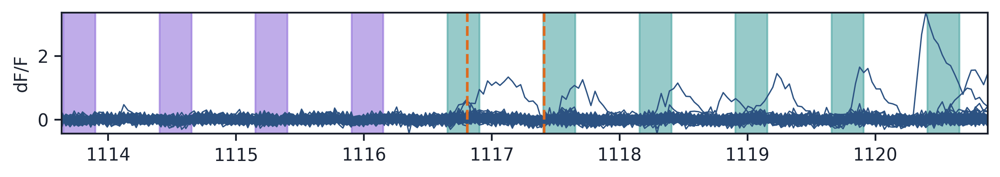

In [ ]:
####  We can look at a few trials in some detail
# First define a function to plot a number of data streams
# - each stimulus as a colored vertical bar
# - running speed
# - licks/rewards
# - pupil area
# - neural responses (dF/F)
def plot_stimuli(trial, ax):
    '''
    plot stimuli as colored bars on specified axis
    '''
    stimuli = experiment_dataset.stimulus_presentations.query('stop_time >= {} and start_time <= {} and not omitted'.format(float(trial['start_time']), float(trial['stop_time'])))
    for idx, stimulus in stimuli.iterrows():
        if stimulus['start_time'] < trial['change_time'].values[0] - 0.5:
            color_val=c_vals[3]
        else:
            color_val=c_vals[5]
        ax.axvspan(stimulus['start_time'], stimulus['stop_time'], color=color_val, alpha=0.5)


def plot_dff(trial, ax):
    '''
    plot each cell's dff response for a given trial
    '''
    trial_dff_traces = experiment_dataset.tidy_dff_traces.query('timestamps >= {} and timestamps <= {} '.format(float(trial['start_time']), float(trial['stop_time'])))
    for cell_specimen_id in experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique():
        ax.plot(
            trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['timestamps'],
            trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['dff'],
            color=c_vals_d[1], linewidth=0.75
        )
        ax.set_ylabel('dF/F')
    
    print('Response window: {} to {}'.format(float(trial['change_time']) + 0.150,
                                             float(trial['change_time']) + 0.750))
    ax.axvline(float(trial['change_time']) + 0.150, color=c_vals[4], linestyle='dashed')
    ax.axvline(float(trial['change_time']) + 0.750, color=c_vals[4], linestyle='dashed')

def make_trial_plot(trial):
    '''
    combine all plots for a given trial
    '''
    fig, ax = plt.subplots(1, 1, figsize = (8, 1.5), sharex=True)

    plot_stimuli(trial, ax)

    plot_dff(trial, ax)

    return fig, ax

# Hit trial
# trial = experiment_dataset.trials.query('hit').sample(random_state = 1)
trial = experiment_dataset.trials.query('hit').sample()
fig, axes = make_trial_plot(trial)

##### Multiple ids

In [ ]:
np.random.seed(10)
mouse_id = np.random.choice(experiment_table.query('equipment_name ==  "MESO.1"')['mouse_id'])
print('Mouse_id:', mouse_id)
print('Session types:', experiment_table.query('mouse_id == @mouse_id')['session_type'].unique())

In [ ]:
session_type = 'OPHYS_1_images_G'
experiment_ids = list(experiment_table.query('session_type == @session_type and mouse_id == @mouse_id').index)
experiment_table.query('session_type == @session_type and mouse_id == @mouse_id')

In [80]:
def get_mouse_data(mouse_ids, session_types, target_areas):
    """ 
    Given mouse_ids, a set of session types (e.g. N1 and N3), and a target_area
    (e.g. VISp) retrieves the corresponding experiment ids and a few other 
    details about the mice.

    The experiment_ids are used to load the appropriate data in later parts of 
    the code.

    Importantly, this code also handles:
    - Multiplane data: for multiplane data different areas can be targeted, so 
      filters through the numerous experiment ids to load only appropriate areas
    - Strange session labelling: Sometimes certain sessions happened over many
      days. In such cases filters the experiment ids to make sure they all 
      occured on the same day.


    RETURNS:

    mice_experiments: dictionary, with mouse_ids as keys and mouse_dict as values
        mouse_dict: dictionary with a key for each session type, whose value is the 
            corresponding experiment ids. This is used later to combine multiplane data.
    
    """
    def get_mouse_exp_ids(mouse_id, session_types, target_areas):

        mouse_dict = {}
        session_ages = np.zeros(len(session_types))
        session_behavior_ids = []

        for session_type_idx, session_type in enumerate(session_types):
            if session_type == 'F1':
                type_str = (' and ( '
                    'session_type == "OPHYS_1_images_A" or '
                    'session_type == "OPHYS_1_images_B" or '
                    'session_type == "OPHYS_1_images_G")'
                )
            elif session_type == 'F3':
                type_str = (' and ( '
                    'session_type == "OPHYS_3_images_A" or '
                    'session_type == "OPHYS_3_images_B" or '
                    'session_type == "OPHYS_3_images_G")'
                )
            elif session_type == 'N1':
                type_str = (' and ( '
                    'session_type == "OPHYS_4_images_A" or '
                    'session_type == "OPHYS_4_images_B" or '
                    'session_type == "OPHYS_4_images_H")'
                )
            elif session_type == 'N3':
                type_str = (' and ( '
                    'session_type == "OPHYS_6_images_A" or '
                    'session_type == "OPHYS_6_images_B" or '
                    'session_type == "OPHYS_6_images_H")'
                )
            else:
                raise ValueError('Session type not recognized.')
            experiment_ids = experiment_table.query('mouse_id == @mouse_id' + type_str).index.values
            # Checks to see if any experiment_ids were found
            if len(experiment_ids) == 0:
                raise ValueError(f'No experiment IDs found for mouse {mouse_id} session_type {session_type}')
            
            # Checks to make sure age was the same on all experiment ids
            age_in_days = np.array(experiment_table.loc[experiment_ids]["age_in_days"])
            if not (age_in_days == age_in_days[0]).all():
                print('    {}:  Age not the same for all sessions!'.format(session_type))
                if mouse_id == 491060: # Special case for particular mice
                    keep_idx = -1
                elif mouse_id == 539518:
                    keep_idx = -1
                elif mouse_id == 451787:
                    keep_idx = 0
                elif session_type == 'F1': # Want to keep the last F1 session
                    keep_idx = -1
                else:
                    keep_idx = 0
                print('    Filtering by age. Age of keep entry:', age_in_days[keep_idx], 
                    ' Unique ages:', np.unique(age_in_days))
                experiment_ids_new = []
                for experiment_id_idx in range(len(experiment_ids)):
                    if age_in_days[experiment_id_idx] == age_in_days[keep_idx]:
                        experiment_ids_new.append(experiment_ids[experiment_id_idx])
                print('    Keeping {}/{} experiment ids.'.format(
                    len(experiment_ids_new), len(experiment_ids)
                ))
                
                experiment_ids = experiment_ids_new
            
            age = experiment_table.loc[experiment_ids[0]]["age_in_days"]
            session_ages[session_type_idx] = age
            # This should only find one behavioral session
            behave_ids = behavior_session_table.query('mouse_id == @mouse_id and age_in_days == @age').index.values
            assert len(behave_ids) == 1
            session_behavior_ids.append(behave_ids[0])

            # Filters experiment ids for target_areas
            experiment_ids_new = []
            mouse_areas = np.array(experiment_table.loc[experiment_ids]["targeted_structure"])
            for experiment_id_idx in range(len(experiment_ids)):
                if mouse_areas[experiment_id_idx] in target_areas:
                    experiment_ids_new.append(experiment_ids[experiment_id_idx])
            if len(experiment_ids_new) != len(experiment_ids):
                print('    Target filter kept {}/{} experiment ids.'.format(
                    len(experiment_ids_new), len(experiment_ids)
                ))
                experiment_ids = experiment_ids_new

            mouse_dict[session_type] = experiment_ids

        if session_ages.shape[0] > 2:
            raise NotImplementedError('Diff not defined for more than two session types')
        age_diff = session_ages[1] - session_ages[0]

        return mouse_dict, age_diff, session_behavior_ids

    ages_diffs = []
    experiment_ids = []
    behavior_ids = []
    mice_experiments = {}
    for mouse_id in mouse_ids:
        print('Mouse: ', mouse_id)
        mouse_dict, age_diff, session_behavior_ids = get_mouse_exp_ids(mouse_id, session_types, target_areas)
        mice_experiments[mouse_id] = mouse_dict
        ages_diffs.append(age_diff)
        behavior_ids.extend(session_behavior_ids)
        for session_idx in range(len(session_types)):
            print('    {} exps: {}'.format(
                session_types[session_idx], len(
                    mouse_dict[session_types[session_idx]]),
            ))

            experiment_ids.extend(mouse_dict[session_types[session_idx]])

    return mice_experiments, experiment_ids, ages_diffs, behavior_ids

Creates experimental id list given mouse_ids (including appropriate filtering for session type and targetted area). This will also load the experimental datasets if that option is selected (this is needed if the dF/F values are to be analyzed in a new way that isn't already saved)

In [81]:
experiment_table = cache.get_ophys_experiment_table()
behavior_session_table = cache.get_behavior_session_table() 

experiment_datasets = []

load_experiments = True

# Excitatory 3: 
mouse_ids = [533161,]
# Excitatory 7 id:
# mouse_ids = [425496,]
# Excitatory 8 id:
# mouse_ids = [425493,]
# Excitatory 3 and a random multiplane mouse
# mouse_ids = [533161, 479839,]

# mouse_ids = [484408, 484627, 484631, 513630]

# experiment_ids = [1049332782,] # Exc 6, familiar images
# experiment_ids = [1050725735,] # Exc 6, novel>1 images

# experiment_ids = [1085000574,] # Sst 1, novel 1
# experiment_ids = [1085816655,] # Sst 1, novel 3
# experiment_ids = [1085000574, 1085816655,]

# experiment_ids = [1067647876,] # Vip 1, novel 1
# experiment_ids = [1071070929,] # Vip 1, novel 3
# experiment_ids = [1067647876, 1071070929,]

# experiment_datasets[0].list_data_attributes_and_methods()

# Multiplane test
# mouse_ids = [472271, 479839, 484408, 484627, 484631, 513630] # Good F1-F3
# mouse_ids = [425493, 425496, 431023, 431252, 436662, 442709, 445002, 456916, # 28 good F1-F3 (USED FOR PAPER)
#              459773, 461946, 462468, 479426, 491060, 512458, 513626,  
#              533161, 539518, 548950, 451787, 456915, 472271, 477052, 479839, 481295, 
#              484408, 484627, 484631, 513630]
# mouse_ids = [425496, 431023, 431252, 436662, 442709, 445002, 456916, # 27 good F1-F3 (FOR BEHAVIOR ANALYSIS ONLY)
#              459773, 461946, 462468, 479426, 491060, 512458, 513626,  
#              533161, 539518, 548950, 451787, 456915, 472271, 477052, 479839, 481295, 
#              484408, 484627, 484631, 513630]
# mouse_ids = [425496, 436662, 456916, 459773, 479426, 491060, 451787, 456915, # 11 best F1-F3
#              477052, 484408, 484627]
# mouse_ids = [425493, 425496, 431252, 436662, 442709, 456916, 459773, 462468, # 17 better F1-F3
#              479426, 479839, 491060, 451787, 456915, 477052, 484408, 484627, 
#              484631]

# mouse_ids = [425493, 425496, 431252, 436662, 440298, 442709, 445002, 449441, # 23 good N1-N3 (USED FOR PAPER)
#              450471, 456916, 456917, 457766, 459773, 461946, 479426, 512458, 
#              513626, 533161, 479839, 484408, 484627, 484631, 513630]
# mouse_ids = [425493, 425496, 431252, 436662, 442709, 449441, 456916, 457766, # 14 better N1-N3
#              479426, 513626, 479839, 484408, 484627, 484631]


session_types = ('N1', 'N3',)
# session_types = ('F1', 'F3',)
target_areas = ('VISp',) # 'VISl', 'VISal', 'VISam') # 'VISp', 'VISl', 'VISal', 'VISam'

# N1-N3: 10 good ones + 5 multiplane (15 total)
# mouse_ids = [425493, 425496, 442709, 445002, 456916, 457766, 459773, 461946, 
#              479426, 533161, 479839, 484408, 484627, 484631, 513630]

# F1-F3: 13 good ones
# mouse_ids = [425493, 425496, 442709, 445002, 450471, 456916, 459773, 459777, 
#              461946, 479426, 491060, 533161, 539518,]

# F1-F3: 13 good ones + multiplane (21 total)
# mouse_ids = [425493, 425496, 442709, 445002, 450471, 456916, 459773, 459777, 
#              461946, 479426, 491060, 533161, 539518, 451787, 472271, 477052, 
#              481295, 484408, 484627, 484631, 513630]

# N1-N3: No change data good ones
# mouse_ids = [425493, 425496, 442709, 445002, 456916, 459773, 461946, 479426, 
#              533161]

# F1-F3: No change data good ones
# mouse_ids = [425493, 425496, 442709, 445002, 456916, 459773, 461946, 479426, 
#              533161]

mice_experiments, experiment_ids, age_diffs, behavior_ids = get_mouse_data(mouse_ids, session_types, target_areas)

for experiment_id in experiment_ids:
    if len(experiment_ids) < 10 and load_experiments:
        print('----------- Experiment ID:', experiment_id, '-----------')
        print('\tMouse ID:', experiment_table.loc[experiment_id]['mouse_id'])
        print('\tSession type:', experiment_table.loc[experiment_id]['session_type'])
        print('\tCre line:', experiment_table.loc[experiment_id]['cre_line'])
        print('\tEquipment name', experiment_table.loc[experiment_id]['equipment_name'])
    if load_experiments:
        experiment_datasets.append(cache.get_behavior_ophys_experiment(experiment_id))

print('Done!')

Mouse:  533161
    N1 exps: 1
    N3 exps: 1
----------- Experiment ID: 1048044013 -----------
	Mouse ID: 533161
	Session type: OPHYS_4_images_A
	Cre line: Slc17a7-IRES2-Cre
	Equipment name CAM2P.4
----------- Experiment ID: 1050730726 -----------
	Mouse ID: 533161
	Session type: OPHYS_6_images_A
	Cre line: Slc17a7-IRES2-Cre
	Equipment name CAM2P.4
Done!


In [ ]:
experiment_ids = [experiment_ids[0],]
experiment_datasets = [experiment_datasets[0],]

If analyzing new data, this is a bunch of preprocessing stuff that is useful below. Includes:


*   Filtering for engagement
*   Converting dF/F traces to 'tidy'
*   Finding unique cells between experiments to match cell indexes
*   Finding a list of unique image names

Note that none of this needs to be run if the dF/F values are being loaded for analysis.

In [32]:
def get_engaged_trials(experiment_dataset):
    """ Returns a list of engaged trials """

    def check_enagement(trial_ids, rolling_performance_df):
        engaged_trial_ids = []
        not_engaged_trial_ids = []
        for trial_id in trial_ids:
            trial_reward = rolling_performance_df['reward_rate'].loc[trial_id]
            if trial_reward > 2:
                engaged_trial_ids.append(trial_id)
            else:
                not_engaged_trial_ids.append(trial_id)
        return engaged_trial_ids, not_engaged_trial_ids
        
    performance_metrics = experiment_dataset.get_performance_metrics()
    
    trial_ids = [[], [], [], []]
    eng_trial_ids = [[], [], [], []]
    not_eng_trial_ids = [[], [], [], []]
    trial_ids[0] = list(experiment_dataset.trials.query('hit == True').index)
    trial_ids[1] = list(experiment_dataset.trials.query('miss == True').index)
    trial_ids[2] = list(experiment_dataset.trials.query('false_alarm == True').index)
    trial_ids[3] = list(experiment_dataset.trials.query('correct_reject == True').index)

    rolling_performance_df = experiment_dataset.get_rolling_performance_df()
    
    print('----------- Experiment ID:', experiment_dataset.ophys_experiment_id, 
          '-----------')
    for idx in range(4):
        eng_trial_ids[idx], not_eng_trial_ids[idx] = check_enagement(trial_ids[idx], rolling_performance_df)
        print('   {} Engaged {}/{}'.format(plot_labels[idx], len(eng_trial_ids[idx]), len(trial_ids[idx])))
    print('\tTotal Engaged {}/{}'.format(np.sum([len(eng_trial_ids[idx]) for idx in range(4)]), 
                                        np.sum([len(trial_ids[idx]) for idx in range(4)])))
    
    return eng_trial_ids, not_eng_trial_ids, trial_ids

# We can convert the dff_traces to long-form (aka "tidy") as follows
# (Example: For each of the 47 cell_specimen_id's, organizes the 48288 dff values by
# their corresponding timestamp. So this new DatFrame will be of size
# 47 * 48288 = 2269536.)

def get_cell_timeseries_dict(dataset, cell_specimen_id):
    '''
    for a given cell_specimen ID, this function creates a dictionary with the following keys
    * timestamps: ophys timestamps
    * cell_roi_id
    * cell_specimen_id
    * dff
    This is useful for generating a tidy dataframe
    arguments:
        session object
        cell_specimen_id
    returns
        dict
    '''
    cell_dict = {
        'timestamps': dataset.ophys_timestamps,
        'cell_roi_id': [dataset.dff_traces.loc[cell_specimen_id]['cell_roi_id']] * len(dataset.ophys_timestamps),
        'cell_specimen_id': [cell_specimen_id] * len(dataset.ophys_timestamps),
        'dff': dataset.dff_traces.loc[cell_specimen_id]['dff'],

    }
    return cell_dict

def get_unique_cell_ids(cell_ids_experiment, verbose=False):
    """
    Finds all unique cell_ids. For each unique cell_id, creates a list of 
    corresponding indexes in datasets
    """
    unique_cell_ids = {}

    for cell_ids in cell_ids_experiment:
        if verbose:
            print('Number of cells: ', len(cell_ids))
        for cell_idx, cell_id in enumerate(cell_ids):
            if cell_id not in unique_cell_ids.keys():
                unique_cell_ids[cell_id] = []

    # For each cell_id, finds the indexes in all experimental datasets
    # (lists index as nan if not in given dataset.
    for cell_id in unique_cell_ids.keys():
        for cell_ids in cell_ids_experiment:
            if cell_id in cell_ids:
                unique_cell_ids[cell_id].append(cell_ids.index(cell_id))
            else:
                unique_cell_ids[cell_id].append(np.nan)

    return unique_cell_ids

def get_shared_cell_idxs(unique_cell_ids, verbose=True):
    """
    Finds all cell_ids shared across the datasets, and then returns a numpy 
    array which has the idx of said cell_ids in each dataset.
    """
    if len(unique_cell_ids[list(unique_cell_ids.keys())[0]]) > 2:
        raise ValueError('Double check this works for more than two datasets.')

    shared_cell_ids = []
    for cell_id in unique_cell_ids.keys():
        if np.sum(np.isnan(unique_cell_ids[cell_id])) == 0:
            shared_cell_ids.append(cell_id)

    if verbose:
        print('Shared IDs: {}/{}'.format(len(shared_cell_ids), 
                                        len(unique_cell_ids.keys())))

    # Map of shared cell_ids to cell_idxs in both datasets
    shared_cell_idxs = np.zeros((2, len(shared_cell_ids)), dtype=np.int64)
    for cell_idx, cell_id in enumerate(shared_cell_ids):
        shared_cell_idxs[:, cell_idx] = unique_cell_ids[cell_id]

    return shared_cell_idxs

def participation_ratio_vector(C):
    """Computes the participation ratio of a vector of variances."""
    return np.sum(C) ** 2 / np.sum(C*C)

# Filter out responses when mouse was not engaged
plot_labels = ['Hit', 'Miss', 'False Alarm', 'Correct Reject']
# If looking at multiplane data, same behavior session
same_behavior_session = False

eng_trial_ids_experiment = []
not_eng_trial_ids_experiment = []

if load_experiments:

    print('Filtering for engagement')
    if not same_behavior_session:
        
        for experiment_dataset in experiment_datasets: 
            eng_trial_ids, not_eng_trial_ids, trial_ids = get_engaged_trials(experiment_dataset)
            eng_trial_ids_experiment.append(eng_trial_ids)
            not_eng_trial_ids_experiment.append(not_eng_trial_ids)
    else:
        print('Using the same behavioral data for all experimental ids')
        eng_trial_ids, not_eng_trial_ids, trial_ids = get_engaged_trials(experiment_datasets[0])
        for _ in experiment_ids:
            eng_trial_ids_experiment.append(eng_trial_ids)
            not_eng_trial_ids_experiment.append(not_eng_trial_ids)

    print('\n -------------------------------------------------------------- \n')

    for ed_idx, experiment_dataset in enumerate(experiment_datasets):
        print('Converting dataset dff traces to tidy, idx:', ed_idx)
        experiment_dataset.tidy_dff_traces = pd.concat(
            [pd.DataFrame(get_cell_timeseries_dict(experiment_dataset, cell_specimen_id)) for cell_specimen_id in experiment_dataset.dff_traces.reset_index()['cell_specimen_id']]
        ).reset_index(drop=True)

    print('\n -------------------------------------------------------------- \n')

    cell_ids_experiment = []

    for ed_idx, experiment_dataset in enumerate(experiment_datasets):
        cell_ids = list(experiment_dataset.dff_traces.index)
        cell_ids_experiment.append(cell_ids)
        print(f'Experiment {ed_idx} Cell IDs:', len(cell_ids))

    unique_cell_ids = get_unique_cell_ids(cell_ids_experiment)

    print('Unique cell IDs: {}'.format(len(unique_cell_ids.keys())))

    if len(experiment_datasets) == 2:
        shared_cell_idxs = get_shared_cell_idxs(unique_cell_ids)

    print('\n -------------------------------------------------------------- \n')

    mean_response_time_experiments = []
    unique_images_experiments = []
    image_idx_dict_experiments = []

    for ed_idx, experiment_dataset in enumerate(experiment_datasets):
        response_times = []
        for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query('hit').iterrows()):
            response_times.append(float(trial['reward_time']) - float(trial['change_time']))
        mean_response_time = np.mean(response_times)
        print('Mean response time: {:.2f}'.format(mean_response_time))
        # plt.hist(response_times)
        mean_response_time_experiments.append(mean_response_time)

        unique_images = experiment_dataset.stimulus_presentations['image_name'].unique()
        unique_images.sort()
        print('Unique image names:', unique_images)
        image_idx_dict = {image: idx for idx, image in enumerate(unique_images)}
        print('Unique image to index dict:', image_idx_dict)
        unique_images_experiments.append(unique_images)
        image_idx_dict_experiments.append(image_idx_dict)


##### dF/F Summary Anaylsis

Main analysis code to get the "response vectors". Either loads previously saved values or does the analysis from scatch.

The main result of this code is a "dff_vals_experiments" which is a list of length (n_pairs*2) of all the response vector data, which is analyzed in detail below

In [65]:
import pickle

def save_data_summary(path, summary_specs, dff_values, dff_by_image, cell_ids, engage_filters):

    save_the_file = True

    if os.path.exists(path):
        print('File already exists at:', path)
        override = input('Override? (Y/N):')
        if override == 'Y':
            save_the_file = True
        else:
            save_the_file = False

    if save_the_file and summary_specs['get_no_changes']:
        with open(path, 'wb') as save_file:
            pickle.dump(dff_values, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(dff_by_image, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(cell_ids, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(engage_filters, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(dff_vals_no_change, save_file, protocol=pickle.HIGHEST_PROTOCOL)
        print('Data Saved')
    elif save_the_file:
        with open(path, 'wb') as save_file:
            pickle.dump(dff_values, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(dff_by_image, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(cell_ids, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(engage_filters, save_file, protocol=pickle.HIGHEST_PROTOCOL)
        print('Data Saved')
    else:
        print('Data Not Saved')

def load_data_summary(root_path, summary_specs):

    save_string = get_save_string_summary(summary_specs)
    path = root_path + save_string + '.pickle'

    if not os.path.exists(path):
        raise ValueError('No file at path:', path)
    elif summary_specs['get_no_changes']:
        with open(path, 'rb') as load_file:
            dff_values_load = pickle.load(load_file)
            dff_by_image_load = pickle.load(load_file)
            cell_ids_load = pickle.load(load_file)
            engage_filters_load = pickle.load(load_file)
            dff_vals_no_change_load = pickle.load(load_file)
 
        return dff_values_load, dff_by_image_load, cell_ids_load, engage_filters_load, dff_vals_no_change_load
    else:
        with open(path, 'rb') as load_file:
            dff_values_load = pickle.load(load_file)
            dff_by_image_load = pickle.load(load_file)
            cell_ids_load = pickle.load(load_file)
            engage_filters_load = pickle.load(load_file)
 
        return dff_values_load, dff_by_image_load, cell_ids_load, engage_filters_load

def get_save_string_summary(summary_specs):
    """ Returns a unique string identifier for the data """
    if summary_specs['summary_value'] == 'mean':
        save_type = 'mean_summary'
    elif summary_specs['summary_value'] == 'max':
        save_type = 'max_summary'
    elif summary_specs['summary_value'] == 'bin':
        save_type = 'bin_summary_nbins' + str(summary_specs['n_bins'])
    else:
        raise ValueError('Summary value not recognized.')
    
    if summary_specs['engaged_filter']:
        engaged_str = 'engaged'
    else:
        engaged_str = 'notengaged'

    start_str = str(int(summary_specs['rel_time_start']*1000))
    end_str = str(int(summary_specs['rel_time_end']*1000))
    
    if summary_specs['get_no_changes']:
        return (save_type + '_' + str(summary_specs['experiment_id']) + '_' + 
                engaged_str + '_' + start_str +'to' + end_str +'ms_nochange')
    else:
        return (save_type + '_' + str(summary_specs['experiment_id']) + '_' + 
                engaged_str + '_' + start_str +'to' + end_str +'ms')

The following code gets dF/F values by trying to find a single value (e.g. the amplitude, or mean) that summarizes the data in a given time window for each trial. 

It can either:


*   Load previously saved data (set load_summary_data=True, saves a bunch of time and analysis)
*   Analyze the data from scratch and optionally save it (set load_summary_data=False). Note this requires the corresponding experiments to have been downloaded above.



In [66]:
def get_dff_value_summary(experiment_dataset, start_time, end_time, summary_specs, count=1):
    """ For a given start and end time, return the desired dff value summary
    (e.g. the mean or max in a given window) as well as the corresponding
    image index.

    returns: 
    dff_values: value for each cell
    image_idx: idx of the image
    """

    value = summary_specs['summary_value']

    if summary_specs['get_no_changes']: # Change/no change case
        if value == 'bin':
            raise NotImplementedError()
        else:
            dff_values = np.zeros((count, cell_specimen_ids.shape[0],))
        # Shifts start time so that it includes more than one image change
        time_window_start_time = start_time - 0.750 * (count - 1)
        
    else:
        if value == 'bin': # For the bin value, each cell gets more than one summary metric
            n_bins = summary_specs['n_bins']
            dff_values = np.zeros((cell_specimen_ids.shape[0], n_bins))
        else:
            dff_values = np.zeros((cell_specimen_ids.shape[0],))
        time_window_start_time = start_time

    trial_dff_traces = experiment_dataset.tidy_dff_traces.query(
        'timestamps >= {} and timestamps <= {} '.format(time_window_start_time, end_time))
    
    if value == 'diff':
        trial_dff_traces_before = experiment_dataset.tidy_dff_traces.query('timestamps >= {} and timestamps <= {} '.format(start_time - 0.750, end_time - 0.750))

    # This should only give one stimuli
    stimuli = experiment_dataset.stimulus_presentations.query(
        'stop_time >= {} and stop_time <= {}'.format(start_time, end_time))
    image_name = stimuli['image_name'].iloc[0]
    image_idx = image_idx_dict_experiments[ed_idx][image_name]

    if summary_specs['get_no_changes']:
        for count_idx in range(count):
            # Shifts start and end time backward the appropriate amount
            count_start_time = start_time - 0.750 * (count - 1 - count_idx)
            count_end_time = end_time - 0.750 * (count - 1 - count_idx)
            count_dff_traces = trial_dff_traces.query(
                'timestamps >= {} and timestamps <= {} '.format(
                    count_start_time, count_end_time))
            # print('Count idx {} start {:.4f} end {:.4f}'.format(
            #     count_idx, count_start_time, count_end_time
            # ))

            for cell_specimen_id_idx, cell_specimen_id in enumerate(cell_specimen_ids):
                dff_trace_cell = count_dff_traces.query('cell_specimen_id == @cell_specimen_id')['dff']
                if value == 'mean':
                    dff_values[count_idx, cell_specimen_id_idx] = np.mean(dff_trace_cell)
                else:
                    raise NotImplementedError()
    else:
        for cell_specimen_id_idx, cell_specimen_id in enumerate(cell_specimen_ids):
            # timestamps = trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['timestamps']
            dff_trace_cell = trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['dff']

            if value == 'diff':
                dff_trace_cell_before = trial_dff_traces_before.query('cell_specimen_id == @cell_specimen_id')['dff']

            if value == 'mean':
                dff_values[cell_specimen_id_idx] = np.mean(dff_trace_cell)
            elif value == 'max':
                dff_values[cell_specimen_id_idx] = np.max(dff_trace_cell)
            elif value == 'bin':
                n_dff_points = dff_trace_cell.shape[0]
                dff_idxs = np.arange(n_dff_points)
                dff_bins = np.linspace(0, n_dff_points, n_bins+1)[:-1]
                dff_idx_bins = np.digitize(dff_idxs, dff_bins) - 1
                # Means over the bins
                dff_values[cell_specimen_id_idx] = np.array([np.mean(dff_trace_cell[dff_idx_bins == i], axis=0) for i in range(0, n_bins)])
            else:
                raise ValueError('Value type not recognized.')
        
        # dff_values[cell_specimen_id_idx] = np.max(dff_trace_cell) - np.max(dff_trace_cell_before)
        # dff_values[cell_specimen_id_idx] = np.mean(dff_trace_cell) - np.mean(dff_trace_cell_before)
        # dff_values[cell_specimen_id_idx] = np.mean(np.abs(dff_trace_cell)) - np.mean(np.abs(dff_trace_cell_before))

    return dff_values, image_idx

root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/'
# root_path = '/content/drive/MyDrive/neuro_research/'

save_summary_data = False
load_summary_data = True

summary_specs = {
    'summary_value': 'mean', # 'max' or 'mean' or 'bin'
    'engaged_filter': True,
    'rel_time_start': 0.150, #0.150,
    'rel_time_end': 0.750, #0.750,
    # 'n_bins': 6,
    'get_no_changes': True, # This has dff values for change/no change, but also for standard hit/miss. Should be True for loading most up to date data
}
print('Using {} criterion in time winodw'.format(summary_specs['summary_value']))

dff_vals_experiments = []
dff_by_image_experiments = []
cell_ids_experiment = []
eng_trial_ids_experiment = []
not_eng_trial_ids_experiment = []

dff_vals_nochange_experiments = []

# Creates fake image labels
if not load_experiments:
    unique_images = ['Img{}'.format(i) for i in range(8)]
    unique_images_experiments = [unique_images for _ in range(len(experiment_ids))]

for ed_idx in range(len(experiment_ids)):
    
    summary_specs['experiment_id'] = experiment_ids[ed_idx]

    unique_images = unique_images_experiments[ed_idx]

    if load_summary_data:
        save_string = get_save_string_summary(summary_specs)
        path = root_path + save_string + '.pickle'
        
        if os.path.exists(path):
            print('Loading from path:', path)
            if summary_specs['get_no_changes']:
                (dff_values_load, dff_by_image_load, cell_ids_load, 
                 engage_filters_load, 
                 dff_vals_no_change_load) = load_data_summary(root_path, summary_specs)
                 
                dff_vals_nochange_experiments.append(dff_vals_no_change_load)
            else:
                dff_values_load, dff_by_image_load, cell_ids_load, engage_filters_load = load_data_summary(root_path, summary_specs)
            
            dff_vals_experiments.append(dff_values_load)
            dff_by_image_experiments.append(dff_by_image_load)
            cell_ids_experiment.append(cell_ids_load)

            eng_trial_ids_load, not_eng_trial_ids_load = engage_filters_load
            eng_trial_ids_experiment.append(eng_trial_ids_load)
            not_eng_trial_ids_experiment.append(not_eng_trial_ids_load)
            
            continue # Skips rest of loop since data doesn't need to be recalculated
        else:
            print('Ed idx {}, loaded data not found at: '.format(ed_idx), path)

    if not load_experiments:
        raise ValueError('Experiments need to be loaded to continue.')
    experiment_dataset = experiment_datasets[ed_idx]
    cell_ids = list(experiment_dataset.dff_traces.index)
    eng_trial_ids, not_eng_trial_ids, trial_ids = get_engaged_trials(experiment_dataset)

    # Goes through all hit trials and collects the maximum dff value between the change_time and reward_time. 
    cell_specimen_ids = experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique()
    if summary_specs['engaged_filter']: # Just engaged trials
        dff_lens = [len(eng_trial_ids[i]) for i in range(4)]
    else: # All trials
        dff_lens = [len(eng_trial_ids[i])+len(not_eng_trial_ids[i]) for i in range(4)]
    # dff_vals = [np.zeros((dff_lens[0], cell_specimen_ids.shape[0])),
    #             np.zeros((dff_lens[1], cell_specimen_ids.shape[0])),
    #             np.zeros((dff_lens[2], cell_specimen_ids.shape[0])),
    #             np.zeros((dff_lens[3], cell_specimen_ids.shape[0]))]
    dff_vals = [[], [], [], []]
    
    dff_vals_no_change = [[], [], [], [], [], [], [], []] # Organized by times, 4-11

    dff_by_image = [[] for _ in range(len(unique_images))]

    query_string = 'hit == True'
    if summary_specs['engaged_filter']: 
        query_string += ' and trials_id in @eng_trial_ids[0]'
    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        query_string).iterrows()):

        start_time = float(trial['change_time']) + summary_specs['rel_time_start']
        end_time = float(trial['change_time']) + summary_specs['rel_time_end']
        # end_time = float(trial['reward_time'])
        
        # Number of steps before image change
        n_steps = int(round((float(trial['change_time']) - float(trial['start_time']))/0.750))

        # print('Change time: {:.4f}, n_steps: {}'.format(
        #     float(trial['change_time']), n_steps
        # ))

        dff_values, image_idx = get_dff_value_summary(
            experiment_dataset, start_time, end_time, summary_specs, 
            count= n_steps - 3)
        # dff_vals[0][trial_idx] = dff_values
        if summary_specs['get_no_changes']: # last value is response post image change
            dff_vals[0].append(dff_values[-1])
            dff_by_image[image_idx].append(dff_values[-1])
            for count_idx in range(n_steps-4): # last value not included, since change
                dff_vals_no_change[count_idx].append(dff_values[count_idx])
        else:
            dff_vals[0].append(dff_values)
            dff_by_image[image_idx].append(dff_values)

    query_string = 'miss == True'
    if summary_specs['engaged_filter']: 
        query_string += ' and trials_id in @eng_trial_ids[1]'
    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        query_string).iterrows()):
        
        start_time = float(trial['change_time']) + summary_specs['rel_time_start']
        end_time = float(trial['change_time']) + summary_specs['rel_time_end']
        # end_time = float(trial['change_time']) + 1.1 * mean_response_time
        
        # Number of steps before image change
        n_steps = int(round((float(trial['change_time']) - float(trial['start_time']))/0.750))
        
        dff_values, image_idx = get_dff_value_summary(
            experiment_dataset, start_time, end_time, summary_specs,
            count= n_steps - 3)

        if summary_specs['get_no_changes']: # last value is response post image change
            dff_vals[1].append(dff_values[-1])
            # dff_by_image[image_idx].append(dff_values[-1])
            for count_idx in range(n_steps-4): # last value not included, since change
                dff_vals_no_change[count_idx].append(dff_values[count_idx])
        else:
            dff_vals[1].append(dff_values)
            # dff_by_image[image_idx].append(dff_values)

    query_string = 'false_alarm == True'
    if summary_specs['engaged_filter']: 
        query_string += ' and trials_id in @eng_trial_ids[2]'
    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        query_string).iterrows()):
        
        start_time = float(trial['change_time']) + summary_specs['rel_time_start']
        end_time = float(trial['change_time']) + summary_specs['rel_time_end']
        # end_time = float(trial['lick_times'][0])
        
        # Number of steps before image change
        n_steps = int(round((float(trial['change_time']) - float(trial['start_time']))/0.750))
        
        dff_values, image_idx = get_dff_value_summary(
            experiment_dataset, start_time, end_time, summary_specs,
            count= n_steps - 3)
        
        if summary_specs['get_no_changes']: # last value is response post image change
            dff_vals[2].append(dff_values[-1])
            # dff_by_image[image_idx].append(dff_values[-1])
            for count_idx in range(n_steps-3): # include last value since no change
                dff_vals_no_change[count_idx].append(dff_values[count_idx])
        else:
            dff_vals[2].append(dff_values)
            # dff_by_image[image_idx].append(dff_values)
        

    query_string = 'correct_reject == True'
    if summary_specs['engaged_filter']: 
        query_string += ' and trials_id in @eng_trial_ids[3]'
    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        query_string).iterrows()):
        
        start_time = float(trial['change_time']) + summary_specs['rel_time_start']
        end_time = float(trial['change_time']) + summary_specs['rel_time_end']
        # end_time = float(trial['change_time']) + 1.1 * mean_response_time
        
        # Number of steps before image change
        n_steps = int(round((float(trial['change_time']) - float(trial['start_time']))/0.750))
        
        dff_values, image_idx = get_dff_value_summary(
            experiment_dataset, start_time, end_time, summary_specs,
            count= n_steps - 3)
        
        if summary_specs['get_no_changes']: # last value is response post image change
            dff_vals[3].append(dff_values[-1])
            # dff_by_image[image_idx].append(dff_values[-1])
            for count_idx in range(n_steps-3): # include last value since no change
                dff_vals_no_change[count_idx].append(dff_values[count_idx])
        else:
            dff_vals[3].append(dff_values)
            # dff_by_image[image_idx].append(dff_values)

    # all_dff_vals = np.concatenate(dff_vals, axis=0)
    # print('All dff values shape:', all_dff_vals.shape)
    
    for trial_idx in range(4):
        dff_vals[trial_idx] = np.array(dff_vals[trial_idx])
        print('   Trial idx {} array size: {}'.format(trial_idx, dff_vals[trial_idx].shape))

    for image_idx, dff_image in enumerate(dff_by_image):
        dff_by_image[image_idx] = np.array(dff_by_image[image_idx])
        print('   Image idx {} array size: {}'.format(image_idx, dff_by_image[image_idx].shape))
    
    if summary_specs['get_no_changes']:
        for count_idx in range(8): # 4 to 11
            dff_vals_no_change[count_idx] = np.array(dff_vals_no_change[count_idx])
            print('   Count {} array size: {}'.format(
                4+count_idx, dff_vals_no_change[count_idx].shape))
            
        dff_vals_nochange_experiments.append(dff_vals_no_change)

    dff_vals_experiments.append(dff_vals)
    dff_by_image_experiments.append(dff_by_image)
    cell_ids_experiment.append(cell_ids)
    eng_trial_ids_experiment.append(eng_trial_ids)
    not_eng_trial_ids_experiment.append(not_eng_trial_ids)

    if save_summary_data: 
        save_string = get_save_string_summary(summary_specs)
        path = root_path + save_string + '.pickle'

        print('   Saving to path:', path)
        engage_filters = eng_trial_ids, not_eng_trial_ids
        save_data_summary(path, summary_specs, dff_vals, dff_by_image, cell_ids, engage_filters)


unique_cell_ids = get_unique_cell_ids(cell_ids_experiment, verbose=False)
print('Unique cell IDs: {}'.format(len(unique_cell_ids.keys())))

if len(experiment_ids) == 2:
    shared_cell_idxs = get_shared_cell_idxs(unique_cell_ids)

Using mean criterion in time winodw
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_808619543_engaged_150to750ms_nochange.pickle
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_813083478_engaged_150to750ms_nochange.pickle
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_808621034_engaged_150to750ms_nochange.pickle
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_809501118_engaged_150to750ms_nochange.pickle
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_834279496_engaged_150to750ms_nochange.pickle
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_836258936_engaged_150to750ms_nochange.pickle
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift

For any analysis that invovles multiplane data: combines multiple imaging planes into a single package that can be analyzed in the same way as other data.

**This needs to be run even if the data is loaded!!**

This will change things like "dff_vals_experiments" so that muliple experiment ids (when they correspond to multiplane data) are concatanated together into a single item in the list.

In [67]:
def convert_multiplane_data(dff_vals_experiments, dff_by_image_experiments, 
                            cell_ids_experiment, eng_trial_ids_experiment, 
                            not_eng_trial_experiment, dff_vals_nochange_experiments):
    """
    Combines data across several experiments so it can be analyzed all at
    once (used for combining multi-plane data).

    Note this repackages things like dff_vals_experiments.

    """
    
    def combine_experimental_data(exp_idxs):
        """ 
        For multiple experiment ids, combines many quantities across experiments
        so they look like a single experiment.
        """
        # Number of cells in each experiment
        n_cells_experiment = []
        # Map of combined cell_idxs to corresponding experiments
        cell_idx_experiment_map = {}
        
        combined_dff_vals = [[] for _ in range(4)]
        combined_dff_by_image = [[] for _ in range(8)]
        combined_cell_ids = []
        combined_eng_trial_ids = []
        combined_not_eng_trial = []
        combined_dff_vals_nochange_experiments = [[] for _ in range(8)]

        for type_idx in range(4):
            for ed_idx in exp_idxs:
                if dff_vals_experiments[ed_idx][type_idx].shape[0] > 0:
                    combined_dff_vals[type_idx].append(dff_vals_experiments[ed_idx][type_idx])
                # print(f'Ed idx {ed_idx}, type_idx {type_idx}:', dff_vals_experiments[ed_idx][type_idx].shape)
            if type_idx == 0: # Constructs the map between combined cell_idxs and experiments
                cell_counts = [dff_vals_subset.shape[1] for dff_vals_subset in combined_dff_vals[type_idx]]
                cell_idx_counter = 0
                for ed_idx_idx, ed_idx in enumerate(exp_idxs):
                    cell_count = combined_dff_vals[type_idx][ed_idx_idx].shape[1]
                    n_cells_experiment.append(cell_count)
                    for cell_idx in range(cell_count):
                        cell_idx_experiment_map[cell_idx_counter+cell_idx] = ed_idx
                    cell_idx_counter += cell_count

            if len(combined_dff_vals[type_idx]) > 0:
                combined_dff_vals[type_idx] = np.concatenate(combined_dff_vals[type_idx], axis=1)

        for img_idx in range(8):
            for ed_idx in exp_idxs:
                if dff_by_image_experiments[ed_idx][img_idx].shape[0] > 0:
                    combined_dff_by_image[img_idx].append(dff_by_image_experiments[ed_idx][img_idx])
            if len(combined_dff_by_image[img_idx]) > 0:
               combined_dff_by_image[img_idx] = np.concatenate(combined_dff_by_image[img_idx], axis=1)

        for ed_idx in exp_idxs:
            combined_cell_ids.extend(cell_ids_experiment[ed_idx])


        combined_eng_trial_ids = eng_trial_ids_experiment[exp_idxs[0]]
        combined_not_eng_trial = not_eng_trial_ids_experiment[exp_idxs[0]]
        for ed_idx in exp_idxs: # Checks to see if engaged trial IDs are the same
            assert eng_trial_ids_experiment[ed_idx] == combined_eng_trial_ids
            assert not_eng_trial_ids_experiment[ed_idx] == combined_not_eng_trial

        if summary_specs['get_no_changes']:
            for time_idx in range(8):
                for ed_idx in exp_idxs:
                    if dff_vals_nochange_experiments[ed_idx][time_idx].shape[0] > 0:
                        combined_dff_vals_nochange_experiments[time_idx].append(dff_vals_nochange_experiments[ed_idx][time_idx])
                if len(combined_dff_vals_nochange_experiments[time_idx]) > 0:
                    combined_dff_vals_nochange_experiments[time_idx] = np.concatenate(combined_dff_vals_nochange_experiments[time_idx], axis=1)
                else: # Still converts empty list to array so that .shape can be used below
                    combined_dff_vals_nochange_experiments[time_idx] = np.array(combined_dff_vals_nochange_experiments[time_idx])
            combined_vals = combined_dff_vals, combined_dff_by_image, combined_cell_ids, combined_eng_trial_ids, combined_not_eng_trial, combined_dff_vals_nochange_experiments
        else: # No change data
            combined_vals = combined_dff_vals, combined_dff_by_image, combined_cell_ids, combined_eng_trial_ids, combined_not_eng_trial

        return combined_vals, n_cells_experiment, cell_idx_experiment_map

    # Everything that will be repackaged is created as a new list (with new_ prefix)
    new_dff_vals_experiment = []
    new_dff_by_image = []
    new_cell_ids = []
    new_eng_trial_ids = []
    new_not_eng_trial = []
    new_dff_vals_nochange_experiment = []

    # Prevents reruns of this. Since this code repackages dff_vals_experiments,
    # the lenght of dff_vals_experiments will be less than experiment_ids
    if len(experiment_ids) != len(dff_vals_experiments):
        raise ValueError('Might have already run this!')
    
    mice_experiments_details = {}

    # Combines data from a single mouse, so can iterate over mice
    for mouse_id in mouse_ids:
        # Using mouse_dicts created earlier to group the data together
        mouse_dict = mice_experiments[mouse_id]
        
        mice_details = {}
        
        for session_type in mouse_dict.keys(): # Iterates over the types of sessions
            # Gets session experiment ids of the corresponding session_type
            session_exp_ids = mouse_dict[session_type]
            # Creates mask to recover the appropriate experiment ids
            session_idxs = np.array([experiment_id in session_exp_ids for experiment_id in experiment_ids])
            exp_idxs = np.arange(len(experiment_ids))[session_idxs]

            print('Combining {} experiments, idxs:'.format(len(exp_idxs)), exp_idxs)
            combined_vals, n_cells_experiment, cell_idx_experiment_map = combine_experimental_data(exp_idxs)

            if summary_specs['get_no_changes']:
                combined_dff_vals, combined_dff_by_image, combined_cell_ids, combined_eng_trial_ids, combined_not_eng_trial, combined_dff_vals_nochange_experiments = combined_vals
                new_dff_vals_nochange_experiment.append(combined_dff_vals_nochange_experiments)
            else:
                combined_dff_vals, combined_dff_by_image, combined_cell_ids, combined_eng_trial_ids, combined_not_eng_trial = combined_vals
            
            new_dff_vals_experiment.append(combined_dff_vals) 
            new_dff_by_image.append(combined_dff_by_image) 
            new_cell_ids.append(combined_cell_ids) 
            new_eng_trial_ids.append(combined_eng_trial_ids) 
            new_not_eng_trial.append(combined_not_eng_trial)

            mice_details[session_type + '_sizes'] = n_cells_experiment
            mice_details[session_type + '_targets'] = cell_idx_experiment_map

        mice_experiments_details[mouse_id] = mice_details
    
    new_vals = new_dff_vals_experiment, new_dff_by_image, new_cell_ids, new_eng_trial_ids, new_not_eng_trial, new_dff_vals_nochange_experiment

    return new_vals, mice_experiments_details

new_vals, mice_experiments_details = convert_multiplane_data(
    dff_vals_experiments, dff_by_image_experiments, 
    cell_ids_experiment, eng_trial_ids_experiment, 
    not_eng_trial_ids_experiment, dff_vals_nochange_experiments)

dff_vals_experiments, dff_by_image_experiments, cell_ids_experiment, eng_trial_ids_experiment, not_eng_trial_ids_experiment, dff_vals_nochange_experiments = new_vals

Combining 1 experiments, idxs: [0]
Combining 1 experiments, idxs: [1]
Combining 1 experiments, idxs: [2]
Combining 1 experiments, idxs: [3]
Combining 1 experiments, idxs: [4]
Combining 1 experiments, idxs: [5]
Combining 1 experiments, idxs: [6]
Combining 1 experiments, idxs: [7]
Combining 1 experiments, idxs: [8]
Combining 1 experiments, idxs: [9]
Combining 1 experiments, idxs: [10]
Combining 1 experiments, idxs: [11]
Combining 1 experiments, idxs: [12]
Combining 1 experiments, idxs: [13]
Combining 1 experiments, idxs: [14]
Combining 1 experiments, idxs: [15]
Combining 1 experiments, idxs: [16]
Combining 1 experiments, idxs: [17]
Combining 1 experiments, idxs: [18]
Combining 1 experiments, idxs: [19]
Combining 1 experiments, idxs: [20]
Combining 1 experiments, idxs: [21]
Combining 1 experiments, idxs: [22]
Combining 1 experiments, idxs: [23]
Combining 1 experiments, idxs: [24]
Combining 1 experiments, idxs: [25]
Combining 1 experiments, idxs: [26]
Combining 1 experiments, idxs: [27]
Co

In [ ]:
# Switches data to compare change/no change dff values. This just 
# overrides the ordinary dff_values, which is probably not the best
# way to do it but it works.

change_type = 'hitmiss' # 'hit', 'hitmiss'

dff_vals_new_experiment = []

n_pairs = len(dff_vals_experiments)//2

for pairs_idx in range(n_pairs):
    ed_idxs = [2*pairs_idx, 2*pairs_idx+1]
    for pair_idx in range(2):
        print('Experiment idx:', ed_idxs[pair_idx])
        no_change_dff_vals = np.concatenate(
            [dff_val for dff_val in dff_vals_nochange_experiments[ed_idxs[pair_idx]] if dff_val.shape[0] > 0], 
            axis=0)
        assert len(dff_vals_experiments[ed_idxs[pair_idx]]) == 4
        if change_type == 'hitmiss': # Change data is both hits and misses
            change_dff_vals = np.concatenate([
                dff_vals_experiments[ed_idxs[pair_idx]][0],
                dff_vals_experiments[ed_idxs[pair_idx]][1]                                  
            ], axis=0)
        elif change_type == 'hit':  # Change data is ONLY hits
            change_dff_vals = dff_vals_experiments[ed_idxs[pair_idx]][0]
        print('  No change:', no_change_dff_vals.shape)
        print('  Change:', change_dff_vals.shape)
        dff_vals_new_experiment.append(
            [change_dff_vals, no_change_dff_vals]
        )

dff_vals_experiments = dff_vals_new_experiment

Experiment idx: 0
  No change: (471, 196)
  Change: (200, 196)
Experiment idx: 1
  No change: (225, 212)
  Change: (131, 212)
Experiment idx: 2
  No change: (278, 302)
  Change: (148, 302)
Experiment idx: 3
  No change: (269, 200)
  Change: (161, 200)
Experiment idx: 4
  No change: (212, 162)
  Change: (120, 162)
Experiment idx: 5
  No change: (159, 143)
  Change: (88, 143)
Experiment idx: 6
  No change: (183, 233)
  Change: (85, 233)
Experiment idx: 7
  No change: (103, 209)
  Change: (53, 209)
Experiment idx: 8
  No change: (314, 48)
  Change: (167, 48)
Experiment idx: 9
  No change: (412, 151)
  Change: (182, 151)
Experiment idx: 10
  No change: (314, 556)
  Change: (150, 556)
Experiment idx: 11
  No change: (347, 537)
  Change: (159, 537)
Experiment idx: 12
  No change: (322, 125)
  Change: (169, 125)
Experiment idx: 13
  No change: (446, 127)
  Change: (198, 127)
Experiment idx: 14
  No change: (147, 511)
  Change: (58, 511)
Experiment idx: 15
  No change: (197, 457)
  Change: (87

###### PCA on Trials and Magnitude Plotting

PCA: [0.05506518 0.05120169 0.04370809 0.0409684  0.03254461] PR: 59.264508886575044


(0.0, 1.1)

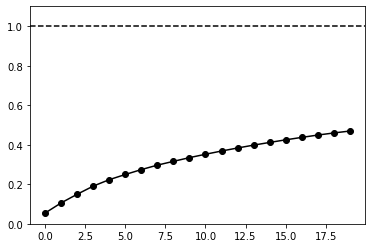

In [ ]:
from sklearn.decomposition import PCA

pc_dims = 5
n_feat_space = np.min(all_dff_vals.shape)
# Finds percentage of variance explained by top pc_dims of PCA
pca_full = PCA(n_components=n_feat_space)
all_dff_vals_pca = pca_full.fit_transform(all_dff_vals)
dff_vals_pca = []
for idx in range(len(dff_vals)):
    dff_vals_pca.append(pca_full.transform(dff_vals[idx]))
dff_by_image_pca = []
for idx in range(len(dff_by_image)):
    if dff_by_image[idx].shape[0] > 0:
        dff_by_image_pca.append(pca_full.transform(dff_by_image[idx]))
explained_var = pca_full.explained_variance_ratio_
print('PCA:', explained_var[:pc_dims], 'PR:', participation_ratio_vector(pca_full.explained_variance_))
total_exvar = []
for i in range(n_feat_space-1):
  total_exvar.append(np.sum(explained_var[:i+1]))
plt.figure()
plt.plot(total_exvar[:20], 'k-o')
plt.axhline(1.0, color='k', linestyle='dashed')
plt.ylim([0.0, 1.1])

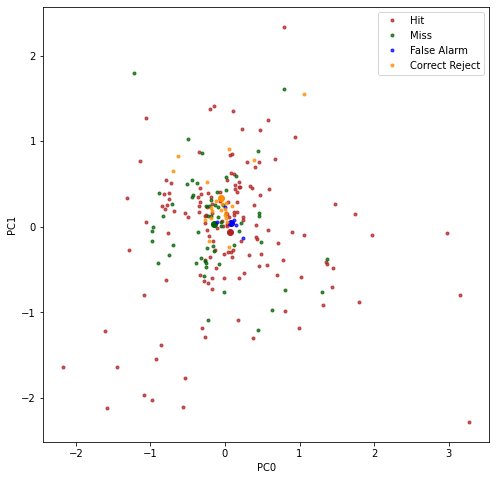

In [ ]:
# PCA by trial type (hit, miss, false alarm, correct reject)

pc0 = 0
pc1 = 1

plot_labels = ['Hit', 'Miss', 'False Alarm', 'Correct Reject']
fig, ax = plt.subplots(1, 1, figsize=(8,8))
for idx in range(4):
    ax.plot(dff_vals_pca[idx][:, pc0], dff_vals_pca[idx][:, pc1], linewidth=0,
            marker='.', label=plot_labels[idx], alpha=0.75, color=c_vals[idx])
    ax.plot(np.mean(dff_vals_pca[idx][:, pc0]), np.mean(dff_vals_pca[idx][:, pc1]), linewidth=0,
            marker='o', color=c_vals[idx])
ax.set_xlabel('PC'+str(pc0))
ax.set_ylabel('PC'+str(pc1))
ax.legend()

# plt_dim = 0.5
# ax.set_xlim([-plt_dim, plt_dim])
# ax.set_ylim([-plt_dim, plt_dim])

Text(0, 0.5, 'Mean value')

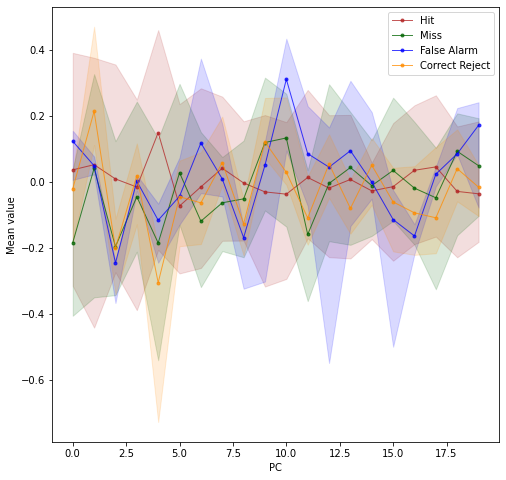

In [ ]:
pcs = 20

fig, ax = plt.subplots(1, 1, figsize=(8,8))

for idx in range(4):
    mean_pca_images = np.median(dff_vals_pca[idx], axis=0)
    ax.plot(np.arange(pcs), mean_pca_images[:pcs], linewidth=1,
            marker='.', label=plot_labels[idx], alpha=0.75, color=c_vals[idx])
    pca_image_25 = np.percentile(dff_vals_pca[idx], 25, axis=0)
    pca_image_75 = np.percentile(dff_vals_pca[idx], 75, axis=0)
    ax.fill_between(np.arange(pcs), pca_image_25[:pcs], pca_image_75[:pcs], linewidth=1,
                    alpha=0.15, color=c_vals[idx])
ax.legend()
ax.set_xlabel('PC')
ax.set_ylabel('Mean value')

Text(0, 0.5, 'Magnitude of DFF values')

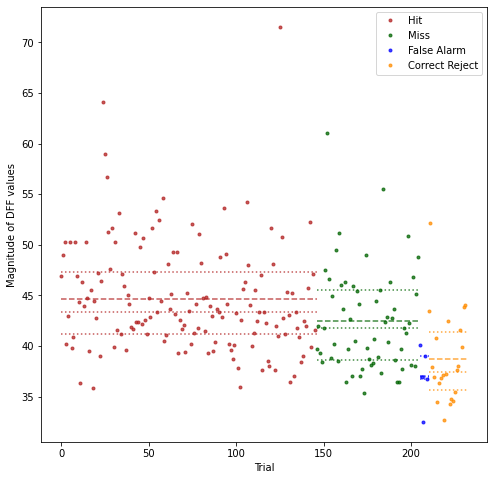

In [ ]:
plot_labels = ['Hit', 'Miss', 'False Alarm', 'Correct Reject']
fig, ax = plt.subplots(1, 1, figsize=(8,8))
counter = 0
order = 1

for idx in range(4):
    x_vals = np.arange(counter, counter+dff_vals[idx].shape[0])
    ax.plot(x_vals, np.linalg.norm(dff_vals[idx], ord=order, axis=1), linewidth=0,
            marker='.', label=plot_labels[idx], alpha=0.75, color=c_vals[idx])
    mean_val = np.mean(np.linalg.norm(dff_vals[idx], ord=order, axis=1))
    ax.plot([counter, counter+dff_vals[idx].shape[0]], [mean_val, mean_val],
            linestyle='dashed', alpha=0.75, color=c_vals[idx])
    med_val = np.percentile(np.linalg.norm(dff_vals[idx], ord=order, axis=1), 50)
    ax.plot([counter, counter+dff_vals[idx].shape[0]], [med_val, med_val],
            linestyle='dotted', alpha=0.75, color=c_vals[idx])
    med_val = np.percentile(np.linalg.norm(dff_vals[idx], ord=order, axis=1), 75)
    ax.plot([counter, counter+dff_vals[idx].shape[0]], [med_val, med_val],
            linestyle='dotted', alpha=0.75, color=c_vals[idx])
    med_val = np.percentile(np.linalg.norm(dff_vals[idx], ord=order, axis=1), 25)
    ax.plot([counter, counter+dff_vals[idx].shape[0]], [med_val, med_val],
            linestyle='dotted', alpha=0.75, color=c_vals[idx])
    counter += dff_vals[idx].shape[0]
ax.legend()
ax.set_xlabel('Trial')
ax.set_ylabel('Magnitude of DFF values')

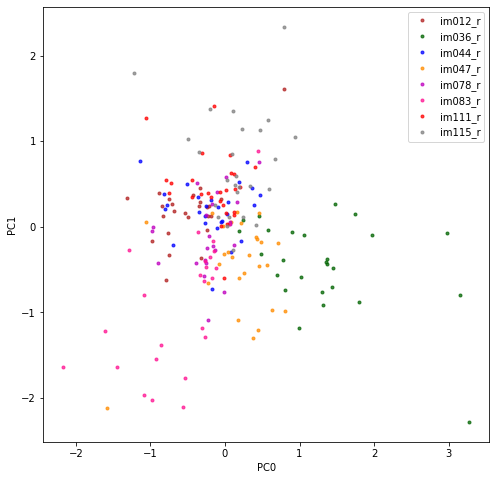

In [ ]:
# PCA by image

pc0 = 0
pc1 = 1

fig, ax = plt.subplots(1, 1, figsize=(8,8))
for idx in range(8):
    ax.plot(dff_by_image_pca[idx][:, pc0], dff_by_image_pca[idx][:, pc1], linewidth=0,
            marker='.', label=unique_images[idx], alpha=0.75, color=c_vals[idx])
    # ax.plot(np.mean(dff_by_image_pca[idx][:, pc0]), np.mean(dff_by_image_pca[idx][:, pc1]), linewidth=0,
    #         marker='o', color=c_vals[idx])
ax.set_xlabel('PC'+str(pc0))
ax.set_ylabel('PC'+str(pc1))
ax.legend()

# plt_dim = 0.5
# ax.set_xlim([-plt_dim, plt_dim])
# ax.set_ylim([-plt_dim, plt_dim])

Text(0, 0.5, 'Magnitude of DFF values')

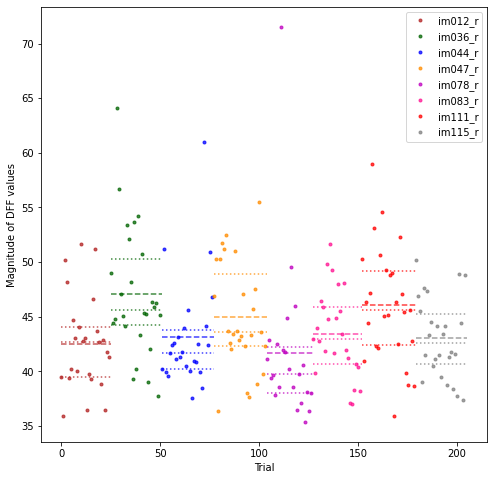

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8,8))
counter = 0
order = 1

for idx in range(8):
    x_vals = np.arange(counter, counter+dff_by_image[idx].shape[0])
    ax.plot(x_vals, np.linalg.norm(dff_by_image[idx], ord=order, axis=1), linewidth=0,
            marker='.', label=unique_images[idx], alpha=0.75, color=c_vals[idx])
    mean_val = np.mean(np.linalg.norm(dff_by_image[idx], ord=order, axis=1))
    ax.plot([counter, counter+dff_by_image[idx].shape[0]], [mean_val, mean_val],
            linestyle='dashed', alpha=0.75, color=c_vals[idx])
    med_val = np.percentile(np.linalg.norm(dff_by_image[idx], ord=order, axis=1), 50)
    ax.plot([counter, counter+dff_by_image[idx].shape[0]], [med_val, med_val],
            linestyle='dotted', alpha=0.75, color=c_vals[idx])
    med_val = np.percentile(np.linalg.norm(dff_by_image[idx], ord=order, axis=1), 75)
    ax.plot([counter, counter+dff_by_image[idx].shape[0]], [med_val, med_val],
            linestyle='dotted', alpha=0.75, color=c_vals[idx])
    med_val = np.percentile(np.linalg.norm(dff_by_image[idx], ord=order, axis=1), 25)
    ax.plot([counter, counter+dff_by_image[idx].shape[0]], [med_val, med_val],
            linestyle='dotted', alpha=0.75, color=c_vals[idx])
    counter += dff_by_image[idx].shape[0]
ax.legend()
ax.set_xlabel('Trial')
ax.set_ylabel('Magnitude of DFF values')

Text(0, 0.5, 'Mean value')

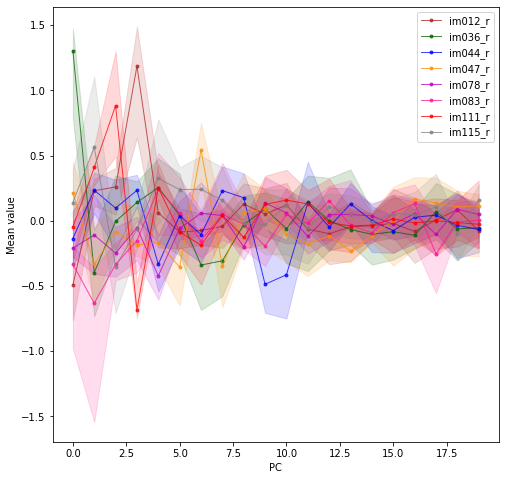

In [ ]:
pcs = 20

fig, ax = plt.subplots(1, 1, figsize=(8,8))

for idx in range(8):
    mean_pca_images = np.median(dff_by_image_pca[idx], axis=0)
    ax.plot(np.arange(pcs), mean_pca_images[:pcs], linewidth=1,
            marker='.', label=unique_images[idx], alpha=0.75, color=c_vals[idx])
    pca_image_25 = np.percentile(dff_by_image_pca[idx], 25, axis=0)
    pca_image_75 = np.percentile(dff_by_image_pca[idx], 75, axis=0)
    ax.fill_between(np.arange(pcs), pca_image_25[:pcs], pca_image_75[:pcs], linewidth=1,
                    alpha=0.15, color=c_vals[idx])
ax.legend()
ax.set_xlabel('PC')
ax.set_ylabel('Mean value')

This plots the difference between neuronal responses for engaged versus not engaged.

Experiment number: 0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: Mean of empty slice


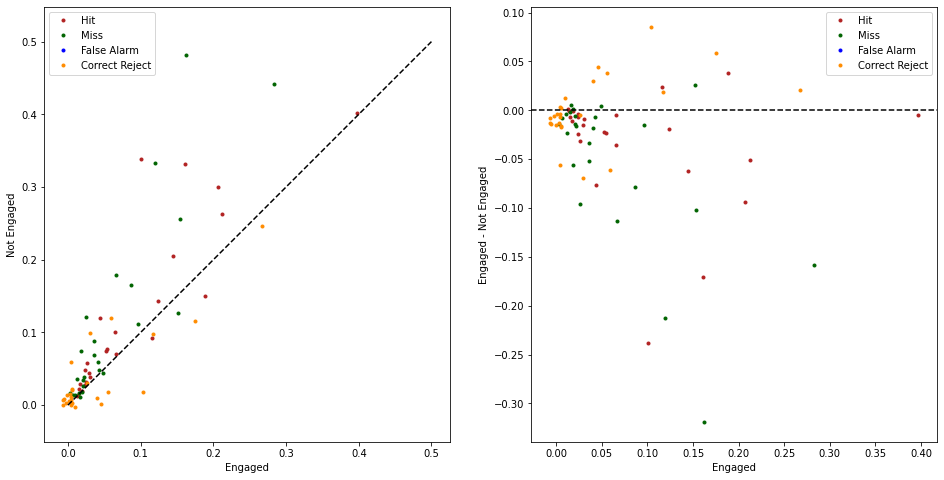

In [ ]:
ed_idx = 0

if engaged_filter:
    raise ValueError('Check if not engaged dff values were gathered')

print('Experiment number:', ed_idx)
eng_trial_ids = eng_trial_ids_experiment[ed_idx]
not_eng_trial_ids = not_eng_trial_ids_experiment[ed_idx]
experiment_dataset = experiment_datasets[ed_idx]
dff_vals = dff_vals_experiments[ed_idx]

cell_specimen_ids = experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique()

dff_vals_eng = [np.zeros((len(eng_trial_ids[0]), cell_specimen_ids.shape[0])),
                np.zeros((len(eng_trial_ids[1]), cell_specimen_ids.shape[0])),
                np.zeros((len(eng_trial_ids[2]), cell_specimen_ids.shape[0])),
                np.zeros((len(eng_trial_ids[3]), cell_specimen_ids.shape[0]))]
dff_vals_not_eng = [np.zeros((len(not_eng_trial_ids[0]), cell_specimen_ids.shape[0])),
                    np.zeros((len(not_eng_trial_ids[1]), cell_specimen_ids.shape[0])),
                    np.zeros((len(not_eng_trial_ids[2]), cell_specimen_ids.shape[0])),
                    np.zeros((len(not_eng_trial_ids[3]), cell_specimen_ids.shape[0]))]

trial_types = ['hit', 'miss', 'false_alarm', 'correct_reject']

dff_vals_cells_eng = []
dff_vals_cells_not_eng = []
for type_idx, trial_type in enumerate(trial_types):
    eng_idx = 0
    not_eng_idx = 0
    query_sring = trial_type + ' == True'
    for trial_idx, (trial_id, trial) in enumerate(experiment_dataset.trials.query(
        query_sring).iterrows()):
        
        if trial_id in eng_trial_ids[type_idx]:
            dff_vals_eng[type_idx][eng_idx] = dff_vals[type_idx][trial_idx]
            eng_idx += 1
        elif trial_id in not_eng_trial_ids[type_idx]:
            dff_vals_not_eng[type_idx][not_eng_idx] = dff_vals[type_idx][trial_idx]
            not_eng_idx += 1
        else:
            raise ValueError('Trial ID not found!')

    dff_vals_cells_eng.append(np.nanmean(dff_vals_eng[type_idx], axis=0))
    dff_vals_cells_not_eng.append(np.nanmean(dff_vals_not_eng[type_idx], axis=0))

fig, ax = plt.subplots(1, 2, figsize=(16,8))
for trial_type_idx in range(4):
    ax[0].plot(dff_vals_cells_eng[trial_type_idx],
            dff_vals_cells_not_eng[trial_type_idx],
            linewidth=0, marker='.',
            color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])
    
    dff_diff = (dff_vals_cells_eng[trial_type_idx] -
                dff_vals_cells_not_eng[trial_type_idx])
    ax[1].plot(dff_vals_cells_eng[trial_type_idx],
            dff_diff, linewidth=0, marker='.',
            color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])

ax[0].plot([0, 0.5], [0, 0.5], color='k', linestyle='dashed')
ax[0].set_aspect('equal', adjustable='datalim')
ax[1].axhline(0.0, color='k', linestyle='dashed')


ax[0].set_xlabel('Engaged')
ax[0].set_ylabel('Not Engaged')
ax[1].set_xlabel('Engaged')
ax[1].set_ylabel('Engaged - Not Engaged')
ax[0].legend()
ax[1].legend()
# ax[1].set_xlim([0, 0.05])
# ax[1].set_ylim([-0.05, 0.075])

This plots the difference in neuronal values for different times of a single session

In [ ]:
experiment_dataset.trials

,initial_image_name,change_image_name,stimulus_change,change_time,go,catch,lick_times,response_time,response_latency,reward_time,reward_volume,hit,false_alarm,miss,correct_reject,aborted,auto_rewarded,change_frame,start_time,stop_time,trial_length
trials_id,,,,,,,,,,,,,,,,,,,,,
0,im065,im065,False,NaN,False,False,"[309.31493, 309.44838]",NaN,NaN,NaN,0.000,False,False,False,False,True,False,NaN,308.59772,309.74866,1.15094
1,im065,im066,True,316.124616,False,False,"[317.00451, 317.23806, 317.37151, 317.50494, 3...",317.00451,0.879894,316.25385,0.005,False,False,False,False,False,True,18432.0,310.09892,320.35725,10.25833
2,im066,im062,True,324.381336,False,False,"[325.12781, 325.2614, 325.39469, 325.51147, 32...",325.12781,0.746474,324.52737,0.005,False,False,False,False,False,True,18927.0,320.60745,328.64733,8.03988
3,im062,im061,True,332.637826,False,False,"[333.18441, 333.31787, 333.43457, 333.56799, 3...",333.18441,0.546584,332.76747,0.005,False,False,False,False,False,True,19422.0,328.86418,336.88743,8.02325
4,im061,im061,False,NaN,False,False,"[339.80645, 339.95655]",NaN,NaN,NaN,0.000,False,False,False,False,True,False,NaN,337.12088,340.27350,3.15262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619,im061,im066,True,3873.424826,True,False,[],NaN,inf,NaN,0.000,False,False,True,False,False,False,231696.0,3868.91706,3877.67422,8.75716
620,im066,im063,True,3880.930976,True,False,[],NaN,inf,NaN,0.000,False,False,True,False,False,False,232146.0,3877.90776,3885.18033,7.27257
621,im063,im066,True,3891.439736,True,False,[],NaN,inf,NaN,0.000,False,False,True,False,False,False,232776.0,3885.41391,3895.68891,10.27500


###### Comparison Across Experiments

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

def least_squares_outlier(x_val, y_val, threshold=0.2, quiet=True):
    """ 
    Tests if eliminating a single point would improve least squares r2 value
    by given threshold. Iterates through dataset multiple times.
    """
    keep_idxs = np.arange(y_val.shape[0], dtype=np.int32)
    omitted_idxs = []

    while True:
        # Calculate full r2
        reg = LinearRegression().fit(x_val[keep_idxs, :], y_val[keep_idxs])
        y_pred = reg.predict(x_val[keep_idxs, :])
        r2_full = r2_score(y_val[keep_idxs], y_pred)

        r2_omit_values = np.zeros((len(keep_idxs), ))

        for keep_idx_idx, keep_idx in enumerate(keep_idxs):

            # Eliminates a single point and finds the r2 value
            keep_idx_copy = np.delete(np.copy(keep_idxs), keep_idx_idx, 0)

            x_copy = np.copy(x_val)[keep_idx_copy, :]
            y_copy = np.copy(y_val)[keep_idx_copy]

            reg = LinearRegression().fit(x_copy, y_copy)
            y_copy_pred= reg.predict(x_copy)
            r2_omit_values[keep_idx_idx] = r2_score(y_copy, y_copy_pred)

        max_r2_idx = np.argmax(r2_omit_values)
        if r2_omit_values[max_r2_idx] > (1 + threshold) * r2_full:
            if not quiet:
                print('Threshould exceeded: {:.2f} at idx {} (Full: {:.2f})'.format(
                    r2_omit_values[max_r2_idx], keep_idxs[max_r2_idx], r2_full))
            omitted_idxs.append(keep_idxs[max_r2_idx])
            keep_idxs = np.delete(keep_idxs, max_r2_idx)
        else:
            if not quiet:
                print('No threshold break: max {:.2f} at idx {} (Full: {:.2f})'.format(
                    r2_omit_values[max_r2_idx], keep_idxs[max_r2_idx], r2_full))
            break

    return x_val[keep_idxs, :], y_val[keep_idxs], omitted_idxs

def participation_ratio_vector(C):
    """Computes the participation ratio of a vector of variances."""
    return np.sum(C) ** 2 / np.sum(C*C)


Shared IDs: 58/188
(4, 113)
(4, 133)
Hit Diff Fit - Slope: 0.58 r2 score 0.66 outliers: 2 (thresh 0.2)
Novel 1 Hit PR: 24.53
Novel 3 Hit PR: 7.08
Miss Diff Fit - Slope: -2.85 r2 score 0.62 outliers: 3 (thresh 0.2)
Novel 1 Miss PR: 19.07
Novel 3 Miss PR: 3.37


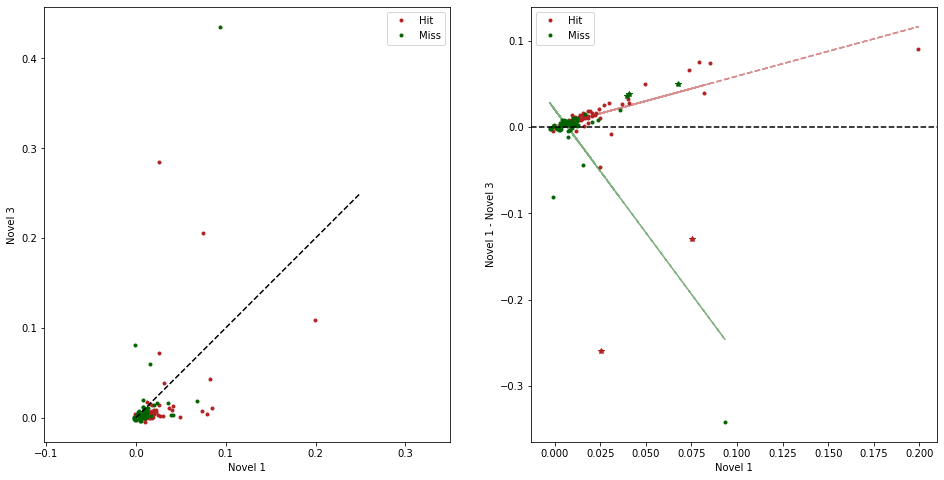

In [ ]:
if len(experiment_datasets) > 2:
    raise ValueError('Comparison only implmented for two datasets')

experiment_0_name = 'Novel 1'
experiment_1_name = 'Novel 3'
outlier_thresh = 0.2

dff_vals_cells_experiments = []
for ed_idx, experiment_dataset in enumerate(experiment_datasets):
    dff_vals_cells = np.zeros((4, dff_vals_experiments[ed_idx][0].shape[1]))
    for trial_type_idx in range(4):
        dff_vals_cells[trial_type_idx] = np.nanmean(dff_vals_experiments[ed_idx][trial_type_idx], axis=0)
    dff_vals_cells_experiments.append(dff_vals_cells)
    print(dff_vals_cells.shape)


fig, ax = plt.subplots(1, 2, figsize=(16,8))
for trial_type_idx in range(2):
    ax[0].plot(dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]],
            dff_vals_cells_experiments[1][trial_type_idx, shared_cell_idxs[1]],
            linewidth=0, marker='.',
            color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])
    
    exp_0_data = dff_vals_cells_experiments[0][
                    trial_type_idx, shared_cell_idxs[0]][:, np.newaxis]
    dff_diff = (dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]] -
                dff_vals_cells_experiments[1][trial_type_idx, shared_cell_idxs[1]])
    ax[1].plot(exp_0_data, dff_diff, linewidth=0, marker='.',
            color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])
    
    # Linear regression fit (eliminate outliers first)
    
    x_vals, y_vals, omitted_idxs = least_squares_outlier(exp_0_data, dff_diff, 
                                                         threshold=outlier_thresh)
    reg = LinearRegression().fit(x_vals, y_vals)
    dff_diff_pred = reg.predict(x_vals)
    # Plot line and outliers
    ax[1].plot(x_vals, dff_diff_pred, color=c_vals[trial_type_idx],
             linestyle='dashed', alpha=0.5)
    ax[1].plot(exp_0_data[omitted_idxs], dff_diff[omitted_idxs], linewidth=0, 
               marker='*', color=c_vals[trial_type_idx])

    print('{} Diff Fit - Slope: {:.2f} r2 score {:.2f} outliers: {} (thresh {})'.format(
         plot_labels[trial_type_idx], reg.coef_[0], 
         r2_score(y_vals, dff_diff_pred),
         len(omitted_idxs), outlier_thresh
    ))
    
    print('{} {} PR: {:.2f}'.format(
        experiment_0_name, plot_labels[trial_type_idx],
        participation_ratio_vector(dff_vals_cells_experiments[0][
            trial_type_idx, shared_cell_idxs[0]]),
                                ))
    print('{} {} PR: {:.2f}'.format(
        experiment_1_name, plot_labels[trial_type_idx],
        participation_ratio_vector(dff_vals_cells_experiments[1][
            trial_type_idx, shared_cell_idxs[1]]),
                                ))

ax[0].plot([0, 0.25], [0, 0.25], color='k', linestyle='dashed')
ax[0].set_aspect('equal', adjustable='datalim')
ax[1].axhline(0.0, color='k', linestyle='dashed')


ax[0].set_xlabel(experiment_0_name)
ax[0].set_ylabel(experiment_1_name)
ax[1].set_xlabel(experiment_0_name)
ax[1].set_ylabel('{} - {}'.format(experiment_0_name, experiment_1_name))
ax[0].legend()
ax[1].legend()
# ax[0].set_xlim([-0.05, 0.1])
# ax[0].set_ylim([-0.05, 0.1])
# ax[1].set_xlim([0.08, 0.3])
# ax[1].set_ylim([-0.1, 0.2])

NameError: ignored

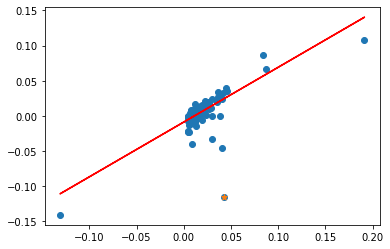

In [ ]:
threshold = 0.2
x_val_full = dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]][:, np.newaxis]
y_val_full = dff_diff
x_val, y_val, omitted_idxs = least_squares_outlier(x_val_full, y_val_full)

plt.scatter(x_val_full, y_val_full)
plt.scatter(x_val_full[omitted_idxs, :], y_val_full[omitted_idxs], marker='*')

reg = LinearRegression().fit(x_val, y_val)
y_pred = reg.predict(x_val)
plt.plot(x_val, y_pred, color='r')

# The mean squared error
print('Mean squared error: {:.2f}'.format(mean_squared_error(dff_diff, preds)))
# The coefficient of determination: 1 is perfect prediction
plt.text(0.5, 0.5, 'r2: {:.2f}'.format(r2_score(dff_diff, preds)), fontsize=10)

###### Compare Experiment Pairs

Here, we try to distinguish neuronal responses of hits and misses using an SVC as well as . We do this both for both datasets, and compare the SVCs of the two to see if they change significantly.

Unique cell IDs: 273
Shared IDs: 147/273

--------------- Trial type classification ---------------

Session N1 (Hit, Miss) Samples: (145, 50)  Features: 147
  Class weights: {0: 1.0, 1: 2.9}
  SVC - Score 0.77 (std 0.10) Raw acc 0.79 (std 0.08)
  Proto - Raw acc 0.74 (std 0.10)
Session N3 (Hit, Miss) Samples: (105, 19)  Features: 147
  Class weights: {0: 1.0, 1: 5.526315789473684}
  SVC - Score 0.72 (std 0.11) Raw acc 0.77 (std 0.10)
  Proto - Raw acc 0.69 (std 0.06)
Cross: data: N3 models: N1)
  SVC - score 0.64 (std 0.20), acc 0.75 (std 0.08), consistency perc: 0.68
  Proto - acc 0.74 (std 0.11)
Cross: data: N1 models: N3)
  SVC - score 0.67 (std 0.09), acc 0.72 (std 0.06), consistency perc: 0.57
  Proto - acc 0.56 (std 0.10)

--------------- Session classification ---------------

Hit (N1, N3) Samples: (145, 105)  Features: 147
  Class weights: {0: 1.0, 1: 1.380952380952381}
  SVC - Score 0.65 (std 0.11) Raw acc 0.66 (std 0.11)
  Proto - Raw acc 0.64 (std 0.06)
Miss (N1, N3) Sample

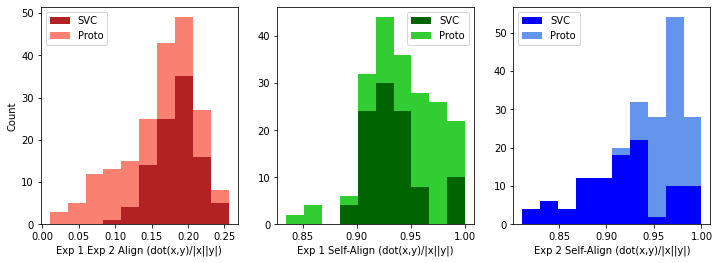

In [12]:
# Splits the data
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

def get_align(x, y):
     return np.dot(x,y)/(
         np.linalg.norm(x) * np.linalg.norm(y)
     )

def get_align_angle(x, y):
    dot = np.dot(x,y)/(
         np.linalg.norm(x) * np.linalg.norm(y)
     )
    if dot > 1.0:
         dot = 1.0
    elif dot < -1.0:
        dot = -1.0
    
    return 180/np.pi * np.arccos(dot)

def drift_classification_stats(ed_idxs, type_idxs, shared_cell_idxs, 
                               n_folds = 10, verbose=False, shared=True,
                               mode='regular'):
    """
    For two sessions specified by the ed_idxs, classifies the hits and misses
    and returns a bunch of statistics. 

    INPUTS:
    shared: Determines whether or not to only fit to shared cell IDs. Needed if directly
            comparing acorss sessions.
    mode:   'regular': actual paired sessions
            'null': even/odd (set earlier or later session below)
            'short': first/second half (set earlier or later session below)

    OUTPUTS:
    performance_metrics: np.array (6, 3, 2)
        First index: 
            0,1,2,3: Trial classification (data, model) - 00, 11, 10, 01
            4, 5: Session classification (data, model) - 00, 11
        Second index: metric - SVC score, SVC raw acc, proto raw acc
        Third index: metric type - mean, std

    cross_aligns: np.array (2, n_folds * n_folds)
        First index: 0 - SVC aligns, 1 - Proto aligns

    chance_svc_metrics: np.array(2, 2)
        First index: 0, 1: Trial classification (data, model) - 10, 01
        Second index: metric - SVC score, SVC raw acc
    """
    p_models_experiments = []
    models_experiments = []
    coefs_experiments = []
    X_data_experiments = []
    y_labels_experiments = []
    class_weights_experiments = []
    correct_incorrect = [[], []]

    cross_aligns = np.zeros((2, n_folds * n_folds))

    performance_metrics = np.zeros((6, 3, 2)) 
    chance_svc_metrics = np.zeros((2, 2))

    if verbose:
        print('\n' + 15*'-' + ' Trial type classification ' + 15*'-' + '\n')
    
    # Tries to classify based on type of trial (e.g. Hit or Miss trial)
    for pair_idx, ed_idx in enumerate(ed_idxs):

        if shared: # Only take shared IDs
            if mode == 'regular': # different types, but from same session
                dff_vals_0 = dff_vals_experiments[ed_idx][type_idxs[0]][:, shared_cell_idxs[pair_idx]]
                dff_vals_1 = dff_vals_experiments[ed_idx][type_idxs[1]][:, shared_cell_idxs[pair_idx]]
            elif mode == 'null': # pair idx now distinguishes between even/odd trials instead of sessions
                null_pair_idx = 0
                null_ed_idx = ed_idxs[null_pair_idx]
                n_samples = (dff_vals_experiments[null_ed_idx][type_idxs[0]].shape[0], 
                             dff_vals_experiments[null_ed_idx][type_idxs[1]].shape[0])
                n_samples_2 = [int(np.floor(n_sample/2)) for n_sample in n_samples]
                # Pair idx == 0 is even, pair_idx == 1 is odd
                dff_vals_0 = dff_vals_experiments[null_ed_idx][type_idxs[0]][pair_idx:2*n_samples_2[0]:2, shared_cell_idxs[null_pair_idx]]
                dff_vals_1 = dff_vals_experiments[null_ed_idx][type_idxs[1]][pair_idx:2*n_samples_2[1]:2, shared_cell_idxs[null_pair_idx]]
            elif mode == 'short': # pair idx now distinguishes between first/second half of trials instead of sessions
                short_pair_idx = 0
                short_ed_idx = ed_idxs[short_pair_idx]
                n_samples = (dff_vals_experiments[short_ed_idx][type_idxs[0]].shape[0], 
                             dff_vals_experiments[short_ed_idx][type_idxs[1]].shape[0])
                n_samples_2 = [int(np.floor(n_sample/2)) for n_sample in n_samples]
                # Pair idx == 0 is first half, pair_idx == 1 is second half
                dff_vals_0 = dff_vals_experiments[short_ed_idx][type_idxs[0]][pair_idx*n_samples_2[0]:(pair_idx+1)*n_samples_2[0], shared_cell_idxs[short_pair_idx]]
                dff_vals_1 = dff_vals_experiments[short_ed_idx][type_idxs[1]][pair_idx*n_samples_2[1]:(pair_idx+1)*n_samples_2[1], shared_cell_idxs[short_pair_idx]]

        else:
            if mode in ('null', 'short',):
                raise NotImplementedError()
            dff_vals_0 = dff_vals_experiments[ed_idx][type_idxs[0]]
            dff_vals_1 = dff_vals_experiments[ed_idx][type_idxs[1]]
        # Flattens remain dff_vals dimensions (only really matters if summary returns more than one value for each Cell ID)
        dff_vals = [dff_vals_0.reshape(-1, np.prod(dff_vals_0.shape[1:])), 
                    dff_vals_1.reshape(-1, np.prod(dff_vals_1.shape[1:]))]
        
        n_samples = (dff_vals[0].shape[0], dff_vals[1].shape[0])
        n_feats = dff_vals[0].shape[1]

        class_weights = {type_idxs[i]: np.max(n_samples)/n_samples[i] for i in range(2)}
        if verbose:
            print(f'Session {pair_names[pair_idx]} ({type_names[0]}, {type_names[1]}) Samples:', n_samples, ' Features:', n_feats)
            print('  Class weights:', class_weights)
        class_weights_experiments.append(class_weights)

        # Create the classification data 
        X_data = []
        y_labels = []

        for type_idx_idx, type_idx in enumerate(type_idxs):
            X_data.append(dff_vals[type_idx])
            y_labels.append(type_idx_idx * np.ones(
                dff_vals[type_idx].shape[0], dtype=np.int32
            ))

        X_data = np.concatenate(X_data, axis=0)
        y_labels = np.concatenate(y_labels, axis=0)

        # Shuffle the classification data
        arr_idxs = np.arange(np.sum(n_samples))
        np.random.seed(10)
        np.random.shuffle(arr_idxs)
        X_data = X_data[arr_idxs]
        y_labels = y_labels[arr_idxs]

        X_data_experiments.append(X_data)
        y_labels_experiments.append(y_labels)

        # k-Fold Cross validation, saving the model details at each step
        kf = KFold(n_splits=n_folds)

        p_raw_accs = np.zeros((n_folds, ))
        p_models = []

        models = []
        coefs = np.zeros((n_folds, n_feats))
        intercepts = np.zeros((n_folds,))
        scores = np.zeros((n_folds, ))
        raw_accs = np.zeros((n_folds, ))

        for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data)):
            X_train, X_test = X_data[train_index], X_data[test_index]
            y_train, y_test = y_labels[train_index], y_labels[test_index]
            
            # Prototype classifier
            class_means = np.zeros((2, n_feats))
            for label in range(2):
                class_means[label] = np.mean(X_train[y_train == label], axis=0)

            p_weights = class_means[1] - class_means[0]
            p_bias = np.dot(p_weights, class_means[0] + class_means[1])/2

            p_pred = np.array((np.sign(np.dot(X_test, p_weights) - p_bias)+1)//2, dtype=np.int32)

            # print('Prototype pred:', p_pred)
            p_raw_accs[fold_idx] = np.sum(p_pred == y_test) / y_test.shape[0]
            p_models.append((p_weights, p_bias))

            # SVC classifier
            # clf = svm.LinearSVC(class_weight=class_weights, fit_intercept=False)
            clf = svm.LinearSVC(class_weight='balanced', fit_intercept=True, max_iter=100000)
            # clf = svm.LinearSVC(fit_intercept=False)

            clf.fit(X_train, y_train)
            models.append(clf)
            coefs[fold_idx] = clf.coef_[0]
            # intercepts[fold_idx] = clf.intercept_[0]

            y_pred = clf.predict(X_test)
            raw_accs[fold_idx] = np.sum(y_pred == y_test) / y_test.shape[0]
            # scores[fold_idx] = clf.score(X_test, y_test)
            correct_incorrect[pair_idx].append(y_pred == y_test)
            scores[fold_idx] = (np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0]) if y_pred[i] == y_test[i]]) /
                                np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0])]))
            # print('  Acc: {:.2f}'.format(accs[fold_idx]))
        
        if verbose:
            print('  SVC - Score {:.2f} (std {:.2f}) Raw acc {:.2f} (std {:.2f})'.format(
                scores.mean(), scores.std(), raw_accs.mean(), raw_accs.std()))
            print('  Proto - Raw acc {:.2f} (std {:.2f})'.format(
                p_raw_accs.mean(), p_raw_accs.std()))
        # scores = cross_val_score(clf, X_data, y_labels, cv=n_folds)
        # print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
        
        p_models_experiments.append(p_models)

        models_experiments.append(models)
        coefs_experiments.append(coefs)

        performance_metrics[pair_idx, 0, 0] = scores.mean()
        performance_metrics[pair_idx, 0, 1] = scores.std()
        performance_metrics[pair_idx, 1, 0] = raw_accs.mean()
        performance_metrics[pair_idx, 1, 1] = raw_accs.std()
        performance_metrics[pair_idx, 2, 0] = p_raw_accs.mean()
        performance_metrics[pair_idx, 2, 1] = p_raw_accs.std()

    # Cross classification, using classifier trained on the paired dataset to classify the other dataset (e.g. N1 Hits and N3 Hits)
    if shared:

        n_trials = 10 # Number of random trials to test chance accuracies on

        for pair_idx, ed_idx in enumerate(ed_idxs):
            # Swaps the data from one experiment to the other (but uses the 
            # classification rules of ed_idx)
            if pair_idx == 0:
                data_pair_idx = 1
            elif pair_idx == 1:
                data_pair_idx = 0

            clf_d = models_experiments[data_pair_idx][fold_idx]

            class_weights = class_weights_experiments[data_pair_idx]

            X_data_cross = X_data_experiments[data_pair_idx]
            y_labels_cross = y_labels_experiments[data_pair_idx]

            p_cross_accs = np.zeros((n_folds,))

            cross_scores = np.zeros((n_folds,))
            cross_accs = np.zeros((n_folds,))
            kf = KFold(n_splits=n_folds)

            same_classification_perc = np.zeros((n_folds,))

            chance_accs = np.zeros((n_folds,))
            chance_scores = np.zeros((n_folds,))

            for fold_idx, (_, test_index) in enumerate(
                kf.split(X_data_cross)):

                X_test_cross = X_data_cross[test_index]
                y_test_cross = y_labels_cross[test_index]

                # Prototype
                p_weights, p_bias = p_models_experiments[pair_idx][fold_idx]
                p_pred_cross = np.array((np.sign(np.dot(X_test_cross, p_weights) - p_bias)+1)//2, dtype=np.int32)
                p_cross_accs[fold_idx] = np.sum(p_pred_cross == y_test_cross) / y_test_cross.shape[0]

                # SVC
                y_pred_cross = models_experiments[pair_idx][fold_idx].predict(X_test_cross)

                # How consistent is the SVC? Do the same points get classified correctly/incorrectly?
                same_classification = correct_incorrect[data_pair_idx][fold_idx] == (p_pred_cross == y_test_cross)
                same_classification_perc[fold_idx] = np.sum(same_classification)/(same_classification.shape[0]) 

                # cross_scores[fold_idx] = models_experiments[ed_idx][fold_idx].score(
                #     X_test_cross, y_test_cross)
                cross_scores[fold_idx] = (np.sum([class_weights[y_test_cross[i]] for i in range(y_test_cross.shape[0]) if y_pred_cross[i] == y_test_cross[i]]) /
                                        np.sum([class_weights[y_test_cross[i]] for i in range(y_test_cross.shape[0])]))
                cross_accs[fold_idx] = np.sum(y_pred_cross == y_test_cross) / y_test_cross.shape[0]
                
                angle_radians = np.pi/180 * get_align_angle(
                    models_experiments[pair_idx][fold_idx].coef_[0],
                    clf_d.coef_[0]
                )
                svc_unit_normal = clf_d.coef_[0]/np.linalg.norm(clf_d.coef_[0])
                rand_accs_fold = np.zeros((n_trials,))
                rand_scores_fold = np.zeros((n_trials,))

                for trial_idx in range(n_trials):
                    rand_dir = np.random.normal(size=clf_d.coef_.shape[1])
                    rand_dir = rand_dir/np.linalg.norm(rand_dir) # Unit mag
                    # Project out direction parallel to svc_normal
                    rand_dir = rand_dir - np.dot(rand_dir, svc_unit_normal) * svc_unit_normal
                    
                    rand_degree = np.cos(angle_radians) * svc_unit_normal + np.sin(angle_radians) * rand_dir
                    rand_degree = rand_degree/np.linalg.norm(rand_degree)

                    # rand_angles[trial_idx] = get_align_angle(
                    #                             clf_d.coef_[0], rand_degree
                    #                         )
                    # Scales random degree to be same length as SVC normal vector
                    rand_degree = np.linalg.norm(clf_d.coef_[0])/np.linalg.norm(rand_degree) * rand_degree
                        
                    y_pred_rand = ((np.dot(X_test_cross, rand_degree) + clf_d.intercept_) > 0).astype(int)
                    rand_accs_fold[trial_idx] = np.sum(y_pred_rand == y_test_cross) / y_test_cross.shape[0]    
                    rand_scores_fold[trial_idx] = (np.sum([class_weights[y_test_cross[i]] for i in range(y_test_cross.shape[0]) if y_pred_rand[i] == y_test_cross[i]]) /
                                            np.sum([class_weights[y_test_cross[i]] for i in range(y_test_cross.shape[0])]))

                chance_accs[fold_idx] = np.mean(rand_accs_fold)   
                chance_scores[fold_idx] = np.mean(rand_scores_fold)   
                

            if verbose:
                print('Cross: data: {} models: {})'.format(
                    pair_names[data_pair_idx], pair_names[pair_idx]))
                print('  SVC - score {:.2f} (std {:.2f}), acc {:.2f} (std {:.2f}), consistency perc: {:.2f}'.format(
                    cross_scores.mean(), cross_scores.std(), cross_accs.mean(), cross_accs.std(), same_classification_perc.mean()))
                print('  Proto - acc {:.2f} (std {:.2f})'.format(
                    p_cross_accs.mean(), p_cross_accs.std()))

            performance_metrics[pair_idx+2, 0, 0] = cross_scores.mean()
            performance_metrics[pair_idx+2, 0, 1] = cross_scores.std()
            performance_metrics[pair_idx+2, 1, 0] = cross_accs.mean()
            performance_metrics[pair_idx+2, 1, 1] = cross_accs.std()
            performance_metrics[pair_idx+2, 2, 0] = p_cross_accs.mean()
            performance_metrics[pair_idx+2, 2, 1] = p_cross_accs.std()

            chance_svc_metrics[pair_idx, 0] = chance_scores.mean()
            chance_svc_metrics[pair_idx, 1] = cross_accs.mean()

    aligments = np.zeros((n_folds, n_folds))
    p_aligments = np.zeros((n_folds, n_folds))

    self_aligns = np.zeros((2, n_folds, n_folds))
    p_self_aligns = np.zeros((2, n_folds, n_folds))

    for i in range(n_folds):
        for j in range(n_folds):
            aligments[i, j] = get_align(
                coefs_experiments[0][i], coefs_experiments[1][j])
            p_aligments[i, j] = get_align(
                p_models_experiments[0][i][0], p_models_experiments[1][j][0])
            for k in range(2):
                self_aligns[k, i, j] = get_align(
                    coefs_experiments[k][i], coefs_experiments[k][j])
                p_self_aligns[k, i, j] = get_align(
                    p_models_experiments[k][i][0], p_models_experiments[k][j][0])
    
    cross_aligns[0] = aligments.flatten()
    cross_aligns[1] = p_aligments.flatten()

    if verbose:
        fig, ax = plt.subplots(1, 3, figsize=(12,4))
        ax[0].hist([aligments.flatten(), p_aligments.flatten()], bins=10, 
                histtype='barstacked', color=(c_vals[0], c_vals_l[0]),
                label=['SVC', 'Proto'])
        ax[0].set_xlabel('Exp 1 Exp 2 Align (dot(x,y)/|x||y|)')
        ax[0].set_ylabel('Count')
        ax[1].hist([self_aligns[0].flatten(), p_self_aligns[0].flatten()], bins=10, 
                histtype='barstacked', color=(c_vals[1], c_vals_l[1]), 
                label=['SVC', 'Proto'])
        ax[1].set_xlabel('Exp 1 Self-Align (dot(x,y)/|x||y|)')
        # ax[1].set_ylabel('Count')
        ax[2].hist([self_aligns[1].flatten(), p_self_aligns[1].flatten()], bins=10, 
                histtype='barstacked', color=(c_vals[2], c_vals_l[2]), 
                label=['SVC', 'Proto'])
        ax[2].set_xlabel('Exp 2 Self-Align (dot(x,y)/|x||y|)')
        # ax[2].set_ylabel('Count')

        for i in range(3):
            ax[i].legend()

    if verbose:
        print('\n' + 15*'-' + ' Session classification ' + 15*'-' + '\n')

    # Tries to classify based on which of the pair of sessions the data came from
    # (e.g. is this a Hit trial from N1 or N3)
    for type_idx_idx, type_idx in enumerate(type_idxs):
        if shared: # Only take shared IDs
            if mode == 'regular': # dff values are from two different sessions (but same type)
                dff_vals_0 = dff_vals_experiments[ed_idxs[0]][type_idx][:, shared_cell_idxs[0]]
                dff_vals_1 = dff_vals_experiments[ed_idxs[1]][type_idx][:, shared_cell_idxs[1]]
            elif mode == 'null': # dff values are from SAME session, just uses even/odd trials
                n_samples = dff_vals_experiments[null_ed_idx][type_idx].shape[0]
                n_samples_2 = int(np.floor(n_samples/2))
                # Pair idx == 0 is even, pair_idx == 1 is odd
                dff_vals_0 = dff_vals_experiments[null_ed_idx][type_idx][0:2*n_samples_2:2, shared_cell_idxs[null_pair_idx]]
                dff_vals_1 = dff_vals_experiments[null_ed_idx][type_idx][1:2*n_samples_2:2, shared_cell_idxs[null_pair_idx]]
            elif mode == 'short': # dff values are from SAME session, just uses first/second half of trials
                n_samples = dff_vals_experiments[short_ed_idx][type_idx].shape[0]
                n_samples_2 = int(np.floor(n_samples/2))
                # Pair idx == 0 is first half, pair_idx == 1 is second half
                dff_vals_0 = dff_vals_experiments[short_ed_idx][type_idx][0:n_samples_2, shared_cell_idxs[short_pair_idx]]
                dff_vals_1 = dff_vals_experiments[short_ed_idx][type_idx][n_samples_2:2*n_samples_2, shared_cell_idxs[short_pair_idx]]
        else:
            if mode in ('null', 'short',):
                raise NotImplementedError()
            dff_vals_0 = dff_vals_experiments[ed_idxs[0]][type_idx]
            dff_vals_1 = dff_vals_experiments[ed_idxs[1]][type_idx]
            
        dff_vals = [dff_vals_0.reshape(-1, np.prod(dff_vals_0.shape[1:])), 
                    dff_vals_1.reshape(-1, np.prod(dff_vals_1.shape[1:]))]

        n_samples = (dff_vals[0].shape[0], dff_vals[1].shape[0])
        n_feats = dff_vals[0].shape[1]

        class_weights = {i: np.max(n_samples)/n_samples[i] for i in range(2)}
        if verbose:
            print(f'{type_names[type_idx_idx]} ({pair_names[0]}, {pair_names[1]}) Samples:', n_samples, ' Features:', n_feats)
            print('  Class weights:', class_weights)

        # Create the classification data 
        X_data_pair = []
        y_labels_pair = []

        for pair_idx, ed_idx in enumerate(ed_idxs):
            X_data_pair.append(dff_vals[pair_idx])
            y_labels_pair.append(pair_idx * np.ones(
                dff_vals[pair_idx].shape[0], dtype=np.int32
            ))

        X_data_pair = np.concatenate(X_data_pair, axis=0)
        y_labels_pair = np.concatenate(y_labels_pair, axis=0)

        # Shuffle the classification data
        arr_idxs = np.arange(np.sum(n_samples))
        np.random.seed(10)
        np.random.shuffle(arr_idxs)
        X_data_pair = X_data_pair[arr_idxs]
        y_labels_pair = y_labels_pair[arr_idxs]

        # k-Fold Cross validation, saving the model details at each step
        kf = KFold(n_splits=n_folds)

        p_raw_accs_pair = np.zeros((n_folds, ))
        p_models_pair = []

        models_pair = []
        coefs_pair = np.zeros((n_folds, n_feats))
        scores_pair = np.zeros((n_folds, ))
        raw_accs_pair = np.zeros((n_folds, ))

        for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data_pair)):
            X_train, X_test = X_data_pair[train_index], X_data_pair[test_index]
            y_train, y_test = y_labels_pair[train_index], y_labels_pair[test_index]
            
            # Prototype classifier
            class_means = np.zeros((2, n_feats))
            for label in range(2):
                class_means[label] = np.mean(X_train[y_train == label], axis=0)

            p_weights = class_means[1] - class_means[0]
            p_bias = np.dot(p_weights, class_means[0] + class_means[1])/2

            p_pred = np.array((np.sign(np.dot(X_test, p_weights) - p_bias)+1)//2, dtype=np.int32)

            # print('Prototype pred:', p_pred)
            p_raw_accs_pair[fold_idx] = np.sum(p_pred == y_test) / y_test.shape[0]
            p_models_pair.append((p_weights, p_bias))

            # SVC classifier
            # clf = svm.LinearSVC(class_weight=class_weights, fit_intercept=False)
            clf = svm.LinearSVC(class_weight='balanced', fit_intercept=True, max_iter=100000)
            # clf = svm.LinearSVC(fit_intercept=False)

            clf.fit(X_train, y_train)
            models_pair.append(clf)
            coefs_pair[fold_idx] = clf.coef_[0]

            y_pred = clf.predict(X_test)
            raw_accs_pair[fold_idx] = np.sum(y_pred == y_test) / y_test.shape[0]

            scores_pair[fold_idx] = (np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0]) if y_pred[i] == y_test[i]]) /
                                     np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0])]))
        
        if verbose:
            print('  SVC - Score {:.2f} (std {:.2f}) Raw acc {:.2f} (std {:.2f})'.format(
                scores_pair.mean(), scores_pair.std(), raw_accs_pair.mean(), raw_accs_pair.std()))
            print('  Proto - Raw acc {:.2f} (std {:.2f})'.format(
                p_raw_accs_pair.mean(), p_raw_accs_pair.std()))
        # scores = cross_val_score(clf, X_data, y_labels, cv=n_folds)
        # print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
        
        # p_models_experiments.append(p_models)

        # models_experiments.append(models)
        # coefs_experiments.append(coefs)

        performance_metrics[4+type_idx_idx, 0, 0] = scores_pair.mean()
        performance_metrics[4+type_idx_idx, 0, 1] = scores_pair.std()
        performance_metrics[4+type_idx_idx, 1, 0] = raw_accs_pair.mean()
        performance_metrics[4+type_idx_idx, 1, 1] = raw_accs_pair.std()
        performance_metrics[4+type_idx_idx, 2, 0] = p_raw_accs_pair.mean()
        performance_metrics[4+type_idx_idx, 2, 1] = p_raw_accs_pair.std()

    return X_data_experiments, y_labels_experiments, performance_metrics, cross_aligns, models_experiments, p_models_experiments, chance_svc_metrics

type_idxs = [0, 1]
assert len(type_idxs) == 2

pair_names = ['N1', 'N3']
if len(dff_vals_experiments[0]) == 4:
    type_names = ['Hit', 'Miss']
elif len(dff_vals_experiments[0]) == 2:
    type_names = ['Change', 'No Change']

ed_idxs = [0, 1]

if len(ed_idxs) == 2:
    cell_ids_pair = [cell_ids_experiment[ed_idxs[0]], cell_ids_experiment[ed_idxs[1]]]
    unique_cell_ids_pair = get_unique_cell_ids(cell_ids_pair)
    
    print('Unique cell IDs: {}'.format(len(unique_cell_ids_pair.keys())))
    shared_cell_idxs_pair = get_shared_cell_idxs(unique_cell_ids_pair)

verbose = True if len(ed_idxs)== 2 else False

X_data_pair, y_labels_pair, performance_metrics_pair, cross_aligns_pair, svc_models_pair, proto_models_pair, chance_svc_pair = drift_classification_stats(
    ed_idxs, type_idxs, shared_cell_idxs_pair, verbose=verbose)

X_data_experiments, y_labels_experiments = X_data_pair, y_labels_pair
svc_models_experiments, proto_models_experiments = svc_models_pair, proto_models_pair

How do other features of the datasets change across the two different sessions? This code does a whole lot of analysis on the various hit/miss populations and how they change over experiments.

In [13]:
from sklearn.decomposition import PCA

def subspace_perc(A, b):
    """
    A: an N x M matrix, whose column space represents some M-dimensional subspace
    b: an N x P vector
    For each of b's columns, finds the percentage of its magnitude which lies in 
    the subspace formed by the columns of A (its columnspace). Then averages these together
    """
    if len(b.shape) == 1:
        b = b[:, np.newaxis]

    proj = np.matmul(np.matmul(A, np.linalg.inv(np.matmul(A.T, A))), A.T) # N x N matrix
    b_proj = np.matmul(proj, b) # N x P martix

    norm_perc = np.linalg.norm(b_proj, axis=0)/np.linalg.norm(b, axis=0) # P dim vector

    return np.sum(norm_perc**2)/np.min((A.shape[1], b.shape[1]))

def subspace_overlap(a, b):
    """ Calculates the amount of subspace overlap

    a: (n, m) matrix
    b: (n, p) matrix
    
    Returns:
    dim(a \cap b)/min[dim(a), dim(b)]
    """

    a_rank = np.linalg.matrix_rank(a)
    b_rank = np.linalg.matrix_rank(b)
    min_rank = np.min((a_rank, b_rank))

    a_b = np.concatenate((a, b), axis=1) # (n, m+k) matrix
    a_b_rank = np.linalg.matrix_rank(a_b)

    # print('a_rank {}, b_rank {}, a_b_rank {}'.format(
    #     a_rank, b_rank, a_b_rank
    # ))

    # Rank of the intersection of a and b
    a_cap_b_rank = a_rank + b_rank - a_b_rank

    return a_cap_b_rank/min_rank

def pair_drift_geometry_metrics(ed_idxs, shared_cell_idxs, verbose=False, shared=True, mode='regular', classifier_metrics=True):
    """
    This code does a whole lot of analysis on the various hit/miss populations and how they change over experiments.

    INPUTS:
        mode: 'regular' or 'null' or 'short'
            regular: usual drift calculations
            null: as a null example, instead calculates drift between even/odd trial examples
            short: also a null example, instead cacluates drift between first/second half of trials 

    OUTPUTS:
    all_the_metrics: dictionary containing the following
        "means_pair": 2-fold nested list (pair idx, type_idx): mean values of type populations, each entry size: (n_cells,) 
        "means_pair_eo": 3-fold nested list (pair idx, type_idx, even/odd idx): mean values of subpopulations populations, each entry size: (n_cells/2,) 
        "means_pair_short": 3-fold nested list (pair idx, type_idx, first/second idx): mean values of subpopulations populations, each entry size: (n_cells/2,) 
        "pca_pair": 2-fold nested list (pair idx, type_idx): PCA fits 
        "pr_pair": 2-fold nested list (pair idx, type_idx): PR of PCA
        "pca_means_pair": 2-fold nested list (pair idx, type_idx): means in PCA coordinates

        "var_space_overlap": list (pair_idx): (scalar) subspace overlap between variational subspaces of hits/misses
        "var_space_perc": list (pair_idx): 2-tuple (0in1, 1in0) overlap perc between variational subspaces of hits/misses
        "var_space_perc_chance": list (pair_idx): 2-tuple (0in1, 1in0) overlap perc between variational subspaces of hits/misses for randomly oriented subspaces

        "svc_pca_aligns": 2-fold nested list (pair idx, type_idx): alignments between PCA directions and SVC bdry
        "svc_pca_perc": 2-fold nested list (pair idx, type_idx): percent of SVC bdry vector in PCA space, 2-tuple (percentage, chance)
        "svc_dist": 2-fold nested list (pair idx, type_idx): distance from mean to svc
        "svc_dist_cross": 2-fold nested list (pair idx, type_idx): distance from mean to pair's svc bdry
        "proto_pca_aligns": 2-fold nested list (pair idx, type_idx): alignments between PCA directions and prototype bdry
        "proto_pca_perc": 2-fold nested list (pair idx, type_idx): percent of proto bdry vector in PCA space, 2-tuple (percentage, chance)
        "proto_dist": 2-fold nested list (pair idx, type_idx): distance from mean to svc boundary
        "proto_dist_cross": 2-fold nested list (pair idx, type_idx): distance from mean to pair's svc bdry
        
        "pca_aligns_diff": 2-fold nested list (pair idx, type_idx): alignments between PCA directions and drift direction
        "pca_drift_perc_and_chance": list (type_idx): percent of drift in PCA space, 2-tuple (percentage, chance)

        "first_pca_explained_var": list (type_idx): variance explained vs PC dimensions of first experiment, 2-tuple (data0, data1)
        "first_pca_explained_var_c": list (type_idx): cumulative variance explained vs PC dimensions of first experiment, 2-tuple (data0, data1)
        "first_pca_means": list (type_idx): mean along PC dimensions of first experiment, 2-tuple (data0, data1)
        "first_pca_drift": list (type_idx): amount of drift along a given PC dimension 
    """
    
    all_the_metrics = {}

    means_pair = [[], []]
    total_var_pair = [[], []]
    pca_dirs_pair = [[], []]
    pca_dims_pair = [[], []]

    if verbose:
        pca_dims = 5 # Number of PCA dimensions to print

        fig, ax = plt.subplots(1, 3, figsize=(16, 4))
        fig2, ax2 = plt.subplots(1, 3, figsize=(16, 4))
        fig3, ax3 = plt.subplots(1, 3, figsize=(16, 4))

    all_the_metrics['means_pair'] = [[], []]
    all_the_metrics['means_pair_eo'] = [[[], []], [[], []]]
    all_the_metrics['means_pair_short'] = [[[], []], [[], []]]
    all_the_metrics['pca_pair'] = [[], []]
    all_the_metrics['pca_means_pair'] = [[], []]
    all_the_metrics['pr_pair'] = [[], []]

    all_the_metrics["var_space_overlap"] = []
    all_the_metrics["var_space_perc"] = []
    all_the_metrics["var_space_perc_chance"] = []

    for pair_idx, ed_idx in enumerate(ed_idxs):

        if shared: # Only take shared IDs
            if mode == 'regular': # dff values are from two different sessions
                dff_vals_0 = dff_vals_experiments[ed_idx][type_idxs[0]][:, shared_cell_idxs[pair_idx]]
                dff_vals_1 = dff_vals_experiments[ed_idx][type_idxs[1]][:, shared_cell_idxs[pair_idx]]
            elif mode == 'null': # dff values are from SAME session, just uses even/odd trials
                null_pair_idx = 0
                null_ed_idx = ed_idxs[null_pair_idx]
                n_samples = (dff_vals_experiments[null_ed_idx][type_idxs[0]].shape[0], 
                             dff_vals_experiments[null_ed_idx][type_idxs[1]].shape[0])
                n_samples_2 = [int(np.floor(n_sample/2)) for n_sample in n_samples]
                # Pair idx == 0 is even, pair_idx == 1 is odd
                dff_vals_0 = dff_vals_experiments[null_ed_idx][type_idxs[0]][pair_idx:2*n_samples_2[0]:2, shared_cell_idxs[null_pair_idx]]
                dff_vals_1 = dff_vals_experiments[null_ed_idx][type_idxs[1]][pair_idx:2*n_samples_2[1]:2, shared_cell_idxs[null_pair_idx]]
            elif mode == 'short': # pair idx now distinguishes between first/second half of trials instead of sessions
                short_pair_idx = 0
                short_ed_idx = ed_idxs[short_pair_idx]
                n_samples = (dff_vals_experiments[short_ed_idx][type_idxs[0]].shape[0], 
                             dff_vals_experiments[short_ed_idx][type_idxs[1]].shape[0])
                n_samples_2 = [int(np.floor(n_sample/2)) for n_sample in n_samples]
                # Pair idx == 0 is first half, pair_idx == 1 is second half
                dff_vals_0 = dff_vals_experiments[short_ed_idx][type_idxs[0]][pair_idx*n_samples_2[0]:(pair_idx+1)*n_samples_2[0], shared_cell_idxs[short_pair_idx]]
                dff_vals_1 = dff_vals_experiments[short_ed_idx][type_idxs[1]][pair_idx*n_samples_2[1]:(pair_idx+1)*n_samples_2[1], shared_cell_idxs[short_pair_idx]]
        else:
            if mode in ('null', 'short',):
                raise NotImplementedError()
            dff_vals_0 = dff_vals_experiments[ed_idx][type_idxs[0]]
            dff_vals_1 = dff_vals_experiments[ed_idx][type_idxs[1]]
        # Flattens remain dff_vals dimensions (only really matters if summary returns more than one value for each Cell ID)
        dff_vals = [dff_vals_0.reshape(-1, np.prod(dff_vals_0.shape[1:])), 
                    dff_vals_1.reshape(-1, np.prod(dff_vals_1.shape[1:]))]
        
        n_samples = (dff_vals[0].shape[0], dff_vals[1].shape[0])
        n_feats = dff_vals[0].shape[1]
        n_shared = len(shared_cell_idxs[pair_idx])

        if verbose:
            print(f'Exp {ed_idx} Samples:', n_samples, ' Features:', n_feats)

        for type_idx in range(2):
            # Mean across all samples, returns something of size (n_cells,)
            mean_type_response = np.mean(dff_vals[type_idx], axis=0)
            
            all_the_metrics['means_pair'][pair_idx].append(mean_type_response)
            means_pair[pair_idx].append(mean_type_response)
            
            if mode == 'regular': # No need to do this split for null/short cases already
                # Splits into even and odd trial subsets as a measure of variation
                n_samples_2 = int(np.floor(n_samples[type_idx]/2))
                # print('Full size:', dff_vals[type_idx].shape)
                
                # Evens
                all_the_metrics['means_pair_eo'][pair_idx][type_idx].append(
                    np.mean(dff_vals[type_idx][0:2*n_samples_2:2], axis=0)
                )
                # print('Even size:', dff_vals[type_idx][0:2*n_samples_2:2].shape)
                # Odds
                all_the_metrics['means_pair_eo'][pair_idx][type_idx].append(
                    np.mean(dff_vals[type_idx][1:2*n_samples_2:2], axis=0)
                )
                # print('Odd size:', dff_vals[type_idx][1:2*n_samples_2:2].shape)

                # First half
                all_the_metrics['means_pair_short'][pair_idx][type_idx].append(
                    np.mean(dff_vals[type_idx][0:n_samples_2], axis=0)
                )
                # Second half
                all_the_metrics['means_pair_short'][pair_idx][type_idx].append(
                    np.mean(dff_vals[type_idx][n_samples_2:2*n_samples_2], axis=0)
                )

            pca_type = PCA(n_components=np.min(dff_vals[type_idx].shape))
            dff_vals_type_pca = pca_type.fit_transform(dff_vals[type_idx])

            # Removes ambiguity in PCA direction by making sure all means (along PC directions) are positive
            pca_dir_signs = np.sign(np.mean(np.matmul(dff_vals[type_idx], pca_type.components_.T), axis=0))
            for pca_idx, pca_dir in enumerate(pca_type.components_):
                pca_type.components_[pca_idx, :] = pca_dir_signs[pca_idx] * pca_dir
            all_the_metrics['pca_pair'][pair_idx].append(pca_type)

            total_var_pair[pair_idx].append(np.sum(pca_type.explained_variance_))
            pca_dirs_pair[pair_idx].append(pca_type.components_)
            pca_dims_pair[pair_idx].append(participation_ratio_vector(pca_type.explained_variance_))
            
            pca_means = np.mean(np.matmul(dff_vals[type_idx], pca_type.components_.T), axis=0)
            all_the_metrics['pca_means_pair'][pair_idx].append(pca_means)

            pca_pr = participation_ratio_vector(pca_type.explained_variance_)
            all_the_metrics['pr_pair'][pair_idx].append(pca_pr)
            
            if verbose:
                plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
                ax2[0].plot(pca_means, color=plot_color,
                            label=f'Exp {pair_names[pair_idx]} - {type_names[type_idx]}')

                print(f'  Exp: {ed_idx} - {type_names[type_idx]}')
                print('    mean mag: {:.2f}, PR of mean: {:.2f}'.format(
                    np.linalg.norm(means_pair[pair_idx][type_idx]),
                    participation_ratio_vector(means_pair[pair_idx][type_idx])
                ))
                print(f'    total var: {np.sum(pca_type.explained_variance_):.2f}',
                    f'PR: {pca_pr:.2f}')
                print('    mean PCA align:', ['{:.2f}'.format(get_align(means_pair[pair_idx][type_idx],
                                                                        pca_dir)) for pca_dir in pca_dirs_pair[pair_idx][type_idx][:pca_dims]])
                print('    PCA means:', ['{:.2f}'.format(pca_mean) for pca_mean in pca_means[:pca_dims]], 
                    'PR: {:.2f}'.format(participation_ratio_vector(pca_means)))

        # Calculates measures of subspace overlap between hit and miss populations
        type0_dim = int(np.ceil(all_the_metrics['pr_pair'][pair_idx][0]))
        type0_var_space = all_the_metrics['pca_pair'][pair_idx][0].components_[:type0_dim, :]
        type1_dim = int(np.ceil(all_the_metrics['pr_pair'][pair_idx][1]))
        type1_var_space = all_the_metrics['pca_pair'][pair_idx][1].components_[:type1_dim, :]

        overlap_01 = subspace_overlap(type0_var_space.T, type1_var_space.T)
        subspace_perc_1in0 = subspace_perc(type0_var_space.T, type1_var_space.T)
        subspace_perc_0in1 = subspace_perc(type1_var_space.T, type0_var_space.T)

        all_the_metrics["var_space_overlap"].append(overlap_01)
        all_the_metrics["var_space_perc"].append((subspace_perc_0in1, subspace_perc_1in0))
        all_the_metrics["var_space_perc_chance"].append((
            np.max((type0_dim, type1_dim))/n_shared, 
            np.max((type0_dim, type1_dim))/n_shared,
        ))

        if verbose:
            print('  {}-{} Subspaces: Overlap: {:.2f}; Perc, {} in {}: {:.2f}, {} in {}: {:.2f}'.format(
                type_names[0], type_names[1], overlap_01,
                type_names[0], type_names[1], subspace_perc_0in1,
                type_names[1], type_names[0], subspace_perc_1in0,
            ))

    if verbose:
        ax2[0].legend()
        ax2[0].set_xlabel('PC')
        ax2[0].set_ylabel('Mean along PC direction')
        ax2[0].axhline(0.0, color='k', linestyle='dashed')
        ax2[1].axhline(0.0, color='k', linestyle='dashed')
        ax2[2].axhline(0.0, color='k', linestyle='dashed')
        for type_idx in range(2):
            ax2[1].axvline(pca_dims_pair[0][type_idx], color=c_vals[type_idx], linestyle='dashed')
            ax2[2].axvline(pca_dims_pair[0][type_idx], color=c_vals[type_idx], linestyle='dashed')

        print('\n', 40*'-', '\n')
    mean_diffs = np.zeros((2, n_feats))

    # Various measures of the means
    for type_idx in range(2):
        mean_diffs[type_idx] = means_pair[1][type_idx] - means_pair[0][type_idx] # True mean difference
        # mean_diffs[type_idx] = (all_the_metrics['means_pair_eo'][0][type_idx][1] - 
        #                         all_the_metrics['means_pair_eo'][0][type_idx][0]) # Testing if within-session noise also has same characteristics

        if verbose:
            print('{} - (mean {}, mean {}) align: {:.2f}'.format(
                    type_names[type_idx], pair_names[0], pair_names[1], 
                    get_align(means_pair[0][type_idx], means_pair[1][type_idx])
                    ))
            print('{} - ({} mean, mean drift) align: {:.2f}'.format(
                type_names[type_idx], pair_names[0],
                get_align(means_pair[0][type_idx], mean_diffs[type_idx])))
            print('{} - ({} mean, mean drift) align: {:.2f}'.format(
                type_names[type_idx], pair_names[1],
                get_align(means_pair[1][type_idx], mean_diffs[type_idx])))

            print('{} - mean drift mag: {:.2f} (drift/{} mag ratio: {:.2f})'.format(
                type_names[type_idx], np.linalg.norm(mean_diffs[type_idx]),
                pair_names[0], 
                np.linalg.norm(mean_diffs[type_idx])/np.linalg.norm(means_pair[0][type_idx])
                ))

    if verbose:
        print('(Hit mean drift, Miss mean drift) align: {:.2f}'.format(get_align(
            mean_diffs[0], mean_diffs[1])
        ))

        for pair_idx, ed_idx in enumerate(ed_idxs):
            print('{} - (Hit mean - Miss mean) mag: {:.2f}'.format(
                pair_names[pair_idx], np.linalg.norm(
                    means_pair[pair_idx][0]- means_pair[pair_idx][1])
                ))

        print('\n', 40*'-', '\n')

    proto_bdrys = np.zeros((2, n_feats))
    svc_fits = []

    all_the_metrics['svc_pca_aligns'] = [[], []]
    all_the_metrics['proto_pca_aligns'] = [[], []]
    all_the_metrics['svc_pca_perc'] = [[], []]
    all_the_metrics['proto_pca_perc'] = [[], []]
    all_the_metrics['svc_dist'] = [[], []]
    all_the_metrics['proto_dist'] = [[], []]
    all_the_metrics['svc_dist_cross'] = [[], []]
    all_the_metrics['proto_dist_cross'] = [[], []]

    # Classifiers (fits everything first)
    # for pair_idx, ed_idx in enumerate(ed_idxs):
        
    #     # SVC Boundary
    #     X_data = X_data_experiments[ed_idx]
    #     y_labels = y_labels_experiments[ed_idx]

    #     clf_full = svm.LinearSVC(class_weight='balanced', fit_intercept=False, max_iter=10000)

    #     clf_full.fit(X_data, y_labels)
    #     svc_fits.append(clf_full)

    #     # Prototype Boundary
    #     proto_bdrys[pair_idx] = means_pair[pair_idx][1] - means_pair[pair_idx][0]

    #     # fold_aligns = np.zeros((n_folds,))
    #     # for fold_idx in range(n_folds):
    #     #         fold_aligns[fold_idx] = get_align(
    #     #             coefs_experiments[ed_idx][fold_idx], clf_full.coef_[0]
    #     #         )
    #     # print('SVC full, SVC fold aligns: {:.2f} (std: {:.2f})'.format(
    #     #     fold_aligns.mean(), fold_aligns.std()
    #     # ))

    # Classifier metrics
    if classifier_metrics: # Can skip this if classifiers haven't been run
        for pair_idx, ed_idx in enumerate(ed_idxs):

            svc_models = svc_models_experiments[ed_idx]
            proto_models = proto_models_experiments[ed_idx]

            cross_idx = (pair_idx + 1) % 2
            svc_models_cross = svc_models_experiments[ed_idxs[cross_idx]]
            proto_models_cross = proto_models_experiments[ed_idxs[cross_idx]]
            # # SVC
            # clf_full = svc_fits[pair_idx]
            # cross_idx = (pair_idx + 1) % 2
            # clf_cross = svc_fits[cross_idx]
            
            for type_idx in range(2):
                
                n_folds = len(svc_models)
                svc_pca_aligns = []
                svc_pca_perc = np.zeros((n_folds,))
                svc_pca_perc_chance_ratio = np.zeros((n_folds,))
                svc_dist = np.zeros((n_folds,))
                svc_cross_dist = np.zeros((n_folds,))

                for fold_idx in range(n_folds):
                    
                    clf_fold = svc_models[fold_idx]
                    clf_cross = svc_models_cross[fold_idx]

                    svc_pca_aligns.append(get_align(
                        pca_dirs_pair[pair_idx][type_idx], clf_fold.coef_.T
                    ))
                
                    var_dim = int(np.ceil(pca_dims_pair[0][type_idx]))
                    svc_pca_perc[fold_idx] = subspace_perc(
                        pca_dirs_pair[pair_idx][type_idx][:var_dim].T, clf_fold.coef_.T
                    )
                    svc_pca_perc_chance_ratio[fold_idx] = svc_pca_perc[fold_idx]/np.sqrt(
                        var_dim/pca_dirs_pair[pair_idx][type_idx].shape[1])
                
                    # (Signed) Distance from mean to SVC boundary
                    svc_dist[fold_idx] = (np.dot(
                        all_the_metrics['means_pair'][pair_idx][type_idx], 
                        clf_fold.coef_.T[:, 0]
                    ) + clf_fold.intercept_) / np.linalg.norm(clf_fold.coef_.T)

                    # (Signed) Distance from mean to the crossed SVC boundary
                    svc_cross_dist[fold_idx] = (np.dot(
                        all_the_metrics['means_pair'][pair_idx][type_idx], 
                        clf_cross.coef_.T[:, 0]
                    ) + clf_cross.intercept_) / np.linalg.norm(clf_cross.coef_.T)

                # Averages metrics across all folds
                svc_pca_aligns = np.mean(np.array(svc_pca_aligns), axis=0)
                all_the_metrics['svc_pca_aligns'][pair_idx].append(
                    svc_pca_aligns)
                all_the_metrics['svc_pca_perc'][pair_idx].append((
                    np.mean(svc_pca_perc), np.mean(svc_pca_perc_chance_ratio)
                ))
                all_the_metrics['svc_dist'][pair_idx].append(np.mean(svc_dist))
                all_the_metrics['svc_dist_cross'][pair_idx].append(np.mean(svc_cross_dist))

                if verbose:
                    # plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
                    # ax3[0].plot(svc_pca_aligns, color=plot_color,
                    #         label=f'SVC {pair_names[pair_idx]} - {type_names[type_idx]}')

                    print('SVC bdry {}, {}:'.format(
                        pair_names[pair_idx], type_names[type_idx]
                    ))

                    print('  PC aligns:', 
                        ['{:.2f}'.format(align) for align in svc_pca_aligns[:pca_dims, 0]])
                    
                    # print('  Drift dir align: {:.2f}'.format(
                    #     get_align(mean_diffs[type_idx], clf_full.coef_[0])
                    # ))
                    print('  Var space perc: {:.2f}, chance ratio: {:.2f}'.format(
                        svc_pca_perc.mean(), svc_pca_perc_chance_ratio.mean()
                    ))
                    print('  Mean to SVC dist: {:.2f} Cross: {:.2f}'.format(
                        all_the_metrics['svc_dist'][pair_idx][type_idx],
                        all_the_metrics['svc_dist_cross'][pair_idx][type_idx]
                    ))

            # Prototype Boundary
            for type_idx in range(2):
                
                n_folds = len(proto_models)
                proto_pca_aligns = []
                proto_pca_perc = np.zeros((n_folds,))
                proto_pca_perc_chance_ratio = np.zeros((n_folds,))
                proto_dist = np.zeros((n_folds,))
                proto_cross_dist = np.zeros((n_folds,))

                for fold_idx in range(n_folds):
                    
                    proto_bdry = proto_models[fold_idx][0]
                    proto_bias = proto_models[fold_idx][1]
                    proto_cross = proto_models_cross[fold_idx][0]
                    proto_cross_bias = proto_models[fold_idx][1]

                    proto_pca_aligns.append(get_align(
                        pca_dirs_pair[pair_idx][type_idx], proto_bdry.T
                    ))
                
                    var_dim = int(np.ceil(pca_dims_pair[0][type_idx]))
                    proto_pca_perc[fold_idx] = subspace_perc(
                        pca_dirs_pair[pair_idx][type_idx][:var_dim].T, proto_bdry
                    )
                    proto_pca_perc_chance_ratio[fold_idx] = proto_pca_perc[fold_idx]/np.sqrt(
                        var_dim/pca_dirs_pair[pair_idx][type_idx].shape[1])
                
                    # (Signed) Distance from mean to proto boundary
                    proto_dist[fold_idx] = (np.dot(
                        all_the_metrics['means_pair'][pair_idx][type_idx], 
                        proto_bdry
                    ) - proto_bias) / np.linalg.norm(proto_bdry)

                    # (Signed) Distance from mean to the crossed proto boundary
                    proto_cross_dist[fold_idx] = (np.dot(
                        all_the_metrics['means_pair'][pair_idx][type_idx], 
                        proto_cross
                    ) - proto_cross_bias) / np.linalg.norm(proto_cross)
                
                # Averages metrics across all folds
                proto_pca_aligns = np.mean(np.array(proto_pca_aligns), axis=0)
                all_the_metrics['proto_pca_aligns'][pair_idx].append(
                    proto_pca_aligns)
                all_the_metrics['proto_pca_perc'][pair_idx].append((
                    np.mean(proto_pca_perc), np.mean(proto_pca_perc_chance_ratio)
                ))
                all_the_metrics['proto_dist'][pair_idx].append(np.mean(proto_dist))
                all_the_metrics['proto_dist_cross'][pair_idx].append(np.mean(proto_cross_dist))

                if verbose:
                    # plot_color = c_vals[type_idx+2] if pair_idx == 0 else c_vals_l[type_idx+2]
                    # ax3[0].plot(proto_pca_aligns, color=plot_color,
                    #         label=f'Proto {pair_names[pair_idx]} - {type_names[type_idx]}')
                    
                    print('Proto bdry {}, {} PC aligns:'.format(
                        pair_names[pair_idx], type_names[type_idx]
                    ))

                    print('  PC aligns:', 
                        ['{:.2f}'.format(align) for align in proto_pca_aligns[:pca_dims]])

                    # print('  Drift dir align: {:.2f}'.format(
                    #     get_align(proto_bdrys[pair_idx], mean_diffs[type_idx])
                    #     ))
                    print('  Var space perc: {:.2f}, chance ratio: {:.2f}'.format(
                        proto_pca_perc.mean(), proto_pca_perc_chance_ratio.mean()
                    ))
                    print('  Mean to proto dist: {:.2f} Cross: {:.2f}'.format(
                        all_the_metrics['proto_dist'][pair_idx][type_idx],
                        all_the_metrics['proto_dist_cross'][pair_idx][type_idx]
                    ))

    if verbose:
        print('\n', 40*'-', '\n')

    all_the_metrics['pca_aligns_diff'] = [[], []]
    all_the_metrics['pca_drift_perc_and_chance'] = []
    all_the_metrics['pca_explained_var'] = []
    all_the_metrics['first_pca_explained_var'] = []
    all_the_metrics['first_pca_explained_var_c'] = []
    all_the_metrics['first_pca_means'] = []
    all_the_metrics['first_pca_drift'] = []

    # Various PCA alignments between datasets
    for type_idx in range(2):

        pca_aligns = np.zeros((pca_dirs_pair[0][type_idx].shape[0],
                            pca_dirs_pair[1][type_idx].shape[0]))
        for exp1_idx in range(pca_dirs_pair[0][type_idx].shape[0]):
            for exp2_idx in range(pca_dirs_pair[1][type_idx].shape[0]):
                pca_aligns[exp1_idx, exp2_idx] = get_align(
                    pca_dirs_pair[0][type_idx][exp1_idx],
                    pca_dirs_pair[1][type_idx][exp2_idx]
                )
        
        if verbose:
            print('{} PCA Aligns:'.format(type_names[type_idx]))
            print(pca_aligns[:pca_dims, :pca_dims])
            cmap_plot = ax[type_idx].imshow(np.abs(pca_aligns[:20, :20]))
            ax[type_idx].set_xlabel('Exp 0 PCs')
            ax[type_idx].set_ylabel('Exp 1 PCs')
            ax[type_idx].set_title(f'{type_names[type_idx]} PC Aligns')
            fig.colorbar(cmap_plot, ax=ax[type_idx])

        for pair_idx, ed_idx in enumerate(ed_idxs):
            pca_aligns_diff = [get_align(mean_diffs[type_idx], pca_dir) 
                for pca_dir in pca_dirs_pair[pair_idx][type_idx]
            ]
            all_the_metrics['pca_aligns_diff'][pair_idx].append(pca_aligns_diff)

            if verbose:
                if pair_idx == 0:
                    ax2[1].plot(pca_aligns_diff, color=c_vals[type_idx],
                                label=f'Exp {pair_names[pair_idx]} - {type_names[type_idx]}')

                print(f'Dataset {ed_idx} {type_names[type_idx]} PCA Aligns with diff:', [
                    '{:.2f}'.format(pca_val) for pca_val in pca_aligns_diff[:pca_dims]])
                plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]

                ax[2].plot(np.abs(pca_aligns_diff), color=plot_color,
                        label=f'Exp {pair_names[pair_idx]} - {type_names[type_idx]}')

        var_dim = int(np.ceil(pca_dims_pair[0][type_idx]))
        drift_var_perc = subspace_perc(pca_dirs_pair[0][type_idx][:var_dim].T, 
                                    mean_diffs[type_idx])
        # Theoretical prediction is sqrt(var dim/neuronal_space dim)
        chance_perc = np.sqrt(var_dim/pca_dirs_pair[0][type_idx].shape[1])
        all_the_metrics['pca_drift_perc_and_chance'].append((drift_var_perc, chance_perc))

        if verbose:
            print('{} Var (dim: {}) drift percentage: {:.2f} (chance: {:.2f})'.format(
                pair_names[0], var_dim, drift_var_perc, chance_perc
            ))

        if mode == 'regular': # dff values are from two different sessions
            data0 = dff_vals_experiments[ed_idxs[0]][type_idx][:, shared_cell_idxs[0]]
            data1 = dff_vals_experiments[ed_idxs[1]][type_idx][:, shared_cell_idxs[1]]
        elif mode == 'null': # dff values are from SAME session, just uses even/odd trials
            n_samples = dff_vals_experiments[null_ed_idx][type_idx].shape[0]
            n_samples_2 = int(np.floor(n_samples/2))
            # Pair idx == 0 is even, pair_idx == 1 is odd
            data0 = dff_vals_experiments[null_ed_idx][type_idx][0:2*n_samples_2:2, shared_cell_idxs[null_pair_idx]]
            data1 = dff_vals_experiments[null_ed_idx][type_idx][1:2*n_samples_2:2, shared_cell_idxs[null_pair_idx]]
        elif mode == 'short': # dff values are from SAME session, just uses first/second half of trials
            n_samples = dff_vals_experiments[short_ed_idx][type_idx].shape[0]
            n_samples_2 = int(np.floor(n_samples/2))
            # Pair idx == 0 is first half, pair_idx == 1 is second half
            data0 = dff_vals_experiments[short_ed_idx][type_idx][0:n_samples_2, shared_cell_idxs[short_pair_idx]]
            data1 = dff_vals_experiments[short_ed_idx][type_idx][n_samples_2:2*n_samples_2, shared_cell_idxs[short_pair_idx]]

        data0 = data0.reshape(-1, np.prod(data0.shape[1:]))
        data1 = data1.reshape(-1, np.prod(data1.shape[1:]))

        pca0_data0 = np.matmul(data0, pca_dirs_pair[0][type_idx].T)
        pca0_data1 = np.matmul(data1, pca_dirs_pair[0][type_idx].T)
        
        pca_size = pca_dirs_pair[0][type_idx].shape[0]

        # pca mean drift (top: normalized, bottom: unnormalized)
        pca_mean_drift = (
            (np.mean(pca0_data1, axis=0) - np.mean(pca0_data0, axis=0)) /
            np.linalg.norm(mean_diffs[type_idx])
        )
        # pca_mean_drift = (
        #     (np.mean(pca0_data1, axis=0) - np.mean(pca0_data0, axis=0))
        # )
        pca_mean_drift_mag = np.abs(pca_mean_drift)

        pca0_data0_cov = np.cov(pca0_data0.T)
        pca0_data0_vars = np.diag(pca0_data0_cov)
        pca0_data0_vars_ratio = pca0_data0_vars/np.sum(pca0_data0_vars)
        pca0_data1_cov = np.cov(pca0_data1.T)
        pca0_data1_vars = np.diag(pca0_data1_cov)

        next_dim = 2*var_dim
        if next_dim > pca_size:
            print('Warning: PCA size too small for given subspace.')
            next_dim = pca_size

        # print(pca0_data0_cov.shape, pca0_data0_cov[:4,:4])
        total_var_00 = np.trace(np.cov(data0.T))
        total_var_01 = np.trace(np.cov(data1.T))
        if verbose:
            print('{} - {} PCA on {} data - var exp dim {:.2f} next dim {:.2f} (ratio: dim {:.2f} next dim {:.2f})'.format(
                type_names[type_idx], pair_names[0], pair_names[0],
                np.trace(pca0_data0_cov[:var_dim,:var_dim]),
                np.trace(pca0_data0_cov[var_dim:next_dim, var_dim:next_dim]),
                np.trace(pca0_data0_cov[:var_dim,:var_dim])/total_var_00,
                np.trace(pca0_data0_cov[var_dim:next_dim, var_dim:next_dim])/total_var_00
            ))
            print('{} - {} PCA on {} data - var exp dim {:.2f} next dim {:.2f} (ratio: dim {:.2f} next dim {:.2f})'.format(
                type_names[type_idx], pair_names[0], pair_names[1],
                np.trace(pca0_data1_cov[:var_dim,:var_dim]),
                np.trace(pca0_data1_cov[var_dim:next_dim, var_dim:next_dim]),
                np.trace(pca0_data1_cov[:var_dim,:var_dim])/total_var_01,
                np.trace(pca0_data1_cov[var_dim:next_dim, var_dim:next_dim])/total_var_01
            ))

        pca0_data0_total_exvar = [0.0,]
        for i in range(len(pca0_data0_vars)):
            pca0_data0_total_exvar.append(np.sum(pca0_data0_vars[:i+1])/total_var_00)
        pca0_data1_total_exvar = [0.0,]
        for i in range(len(pca0_data0_vars)):
            pca0_data1_total_exvar.append(np.sum(pca0_data1_vars[:i+1])/total_var_01)

        pca_means_exp0 = np.mean(pca0_data0, axis=0)
        pca_means_exp1 = np.mean(pca0_data1, axis=0)
        pca_mean_change = pca_means_exp1 - pca_means_exp0

        all_the_metrics['first_pca_explained_var'].append((pca0_data0_vars/total_var_00, pca0_data1_vars/total_var_01))
        all_the_metrics['first_pca_explained_var_c'].append((pca0_data0_total_exvar, pca0_data1_total_exvar))
        all_the_metrics['first_pca_means'].append((pca_means_exp0, pca_means_exp1))
        all_the_metrics['first_pca_drift'].append(pca_mean_drift)

        if verbose:
            ax3[0].plot(np.arange(pca_size), pca_mean_drift, color=c_vals[type_idx],
                        label=f'{type_names[type_idx]}')
            
            ax3[1].semilogx(pca0_data0_vars_ratio, pca_mean_drift_mag, color=c_vals[type_idx],
                        marker='.', linewidth=0, label=f'{type_names[type_idx]}')
            
            ax3[2].plot(np.arange(len(pca0_data0_vars)+1), pca0_data0_total_exvar, color=c_vals[type_idx], 
                        label='{} - {} PCA on {} data'.format(
                            type_names[type_idx], pair_names[0], pair_names[0]
                        ))
            ax3[2].plot(np.arange(len(pca0_data1_vars)+1),pca0_data1_total_exvar, color=c_vals_l[type_idx], 
                        label='{} - {} PCA on {} data'.format(
                            type_names[type_idx], pair_names[0], pair_names[1]
                        ))

            print('Change in {} PC means'.format(pair_names[0]),
                ['{:.2f}'.format(pca_mean) for pca_mean in pca_mean_change[:pca_dims]]
            )
            # ax2[2].plot(pca_mean_change, color=c_vals[type_idx], 
            #             label=f'{type_names[type_idx]}')
            ax2[2].plot(pca_means_exp0, color=c_vals[type_idx], 
                        label=f'{type_names[type_idx]}')
            ax2[2].plot(pca_means_exp1, color=c_vals_l[type_idx], 
                        label=f'{type_names[type_idx]}')

    if verbose:
        ax[2].legend()
        ax[2].set_xlabel('PCs')
        ax[2].set_ylabel('Mean Diff - PC Alignment')

        ax2[1].legend()
        ax2[1].set_xlabel('PC')
        ax2[1].set_ylabel('Alignment to mean drift')
        ax2[2].legend()
        ax2[2].set_xlabel('PC')
        ax2[2].set_ylabel('{} PC mean'.format(pair_names[0]))
        # ax2[2].set_ylabel('Change in N1 PCA mean')
        ax2[2].set_xlim([0, 30])

        ax3[0].legend()
        ax3[0].set_xlabel('PC')
        ax3[0].set_ylabel('Drift along PC direction')
        # ax3[0].set_ylabel('SVC - PC alignment')
        ax3[0].axhline(0.0, color='k', linestyle='dashed')
        ax3[1].legend()
        ax3[1].set_xlabel('% Variance Explained')
        ax3[1].set_ylabel('Mag of drift along PC direction')
        ax3[1].axhline(0.0, color='k', linestyle='dashed')
        ax3[1].set_xlim([1e-4, 1e0])
        ax3[2].set_xlabel('{} PC'.format(pair_names[0]))
        ax3[2].set_ylabel('Total Variance Ratio')
        ax3[2].set_xlim([0, 20])
        ax3[2].axhline(1.0, color='k', linestyle='dashed')
        ax3[2].legend()

    return all_the_metrics

Unique cell IDs: 188
Shared IDs: 58/188
Exp 0 Samples: (105, 31)  Features: 58
  Exp: 0 - Hit
    mean mag: 0.30, PR of mean: 24.53
    total var: 0.46 PR: 6.90
    mean PCA align: ['0.74', '0.11', '0.32', '0.43', '0.05']
    PCA means: ['0.23', '0.03', '0.10', '0.13', '0.01'] PR: 11.43
  Exp: 0 - Miss
    mean mag: 0.15, PR of mean: 19.07
    total var: 0.15 PR: 5.33
    mean PCA align: ['0.62', '0.53', '0.32', '0.04', '0.15']
    PCA means: ['0.09', '0.08', '0.05', '0.01', '0.02'] PR: 10.09
  Hit-Miss Subspaces: Overlap: 0.00; Perc, Hit in Miss: 0.59, Miss in Hit: 0.59
Exp 1 Samples: (90, 32)  Features: 58
  Exp: 1 - Hit
    mean mag: 0.38, PR of mean: 7.08
    total var: 0.99 PR: 2.88
    mean PCA align: ['0.60', '0.67', '0.39', '0.19', '0.01']
    PCA means: ['0.23', '0.25', '0.15', '0.07', '0.00'] PR: 6.10
  Exp: 1 - Miss
    mean mag: 0.45, PR of mean: 3.37
    total var: 0.52 PR: 2.06
    mean PCA align: ['0.92', '0.18', '0.34', '0.03', '0.05']
    PCA means: ['0.41', '0.08', '0

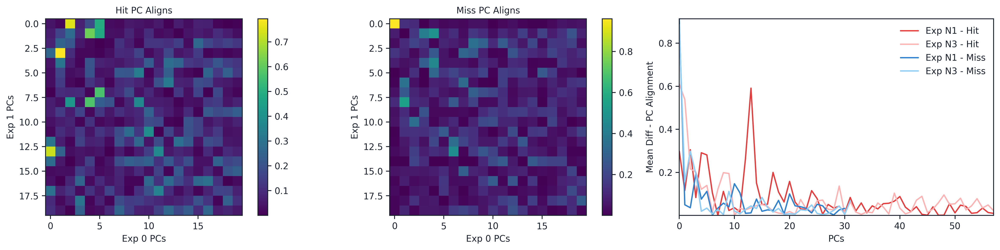

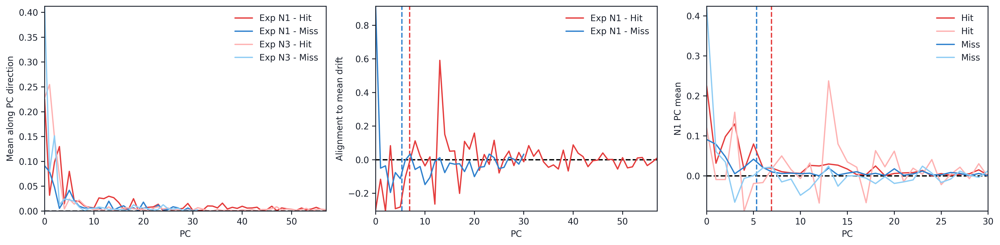

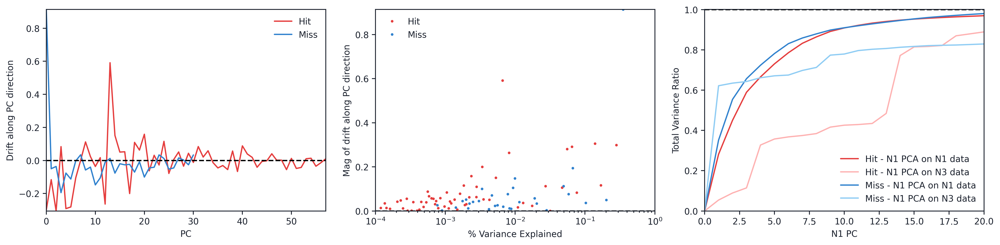

In [ ]:
ed_idxs = [0, 1]

pair_names = session_types

verbose = True if len(ed_idxs) == 2 else False
""
if len(ed_idxs) == 2:
    cell_ids_pair = [cell_ids_experiment[ed_idxs[0]], cell_ids_experiment[ed_idxs[1]]]
    unique_cell_ids_pair = get_unique_cell_ids(cell_ids_pair)
    
    print('Unique cell IDs: {}'.format(len(unique_cell_ids_pair.keys())))
    shared_cell_idxs_pair = get_shared_cell_idxs(unique_cell_ids_pair)

all_the_metrics_pair = pair_drift_geometry_metrics(ed_idxs, shared_cell_idxs_pair, verbose=verbose)

In [ ]:
n_cells = coefs_experiments[0].shape[1]

avg_coefs = np.zeros((2, n_cells))
std_coefs = np.zeros((2, n_cells))
avg_coefs[0] = np.mean(coefs_experiments[0], axis=0)
std_coefs[0] = np.std(coefs_experiments[0], axis=0)
avg_coefs[1] = np.mean(coefs_experiments[1], axis=0)
std_coefs[1] = np.std(coefs_experiments[1], axis=0)
avg_coefs.shape

cell_idxs = np.arange(n_cells)

fig, ax = plt.subplots(3, 1, figsize=(12,12), sharex=True)

for i in range(3):
    ax[i].axhline(0.0, color='k', linestyle='dashed')
    for j in range(0, n_cells, 2):
        ax[i].axvspan(j-0.5, j+0.5, color='grey', alpha=0.25)

ax[0].errorbar(cell_idxs, avg_coefs[0], std_coefs[0], linewidth=0, marker='o', 
            elinewidth = 1, color=c_vals[3], label=experiment_0_name)
ax[0].errorbar(cell_idxs, avg_coefs[1], std_coefs[1], linewidth=0, marker='o', 
            elinewidth = 1, color=c_vals[4], label=experiment_1_name)

for i in range(2):
    ax[1].plot(cell_idxs, dff_vals_cells_experiments[0][i, shared_cell_idxs[0]],
            color = c_vals[i], label='Avg '+plot_labels[i])
    ax[2].plot(cell_idxs, dff_vals_cells_experiments[1][i, shared_cell_idxs[1]],
            color = c_vals[i], label='Avg '+plot_labels[i])

ax[0].set_ylabel('SVC Coefficient')
ax[0].legend()

ax[0].set_xlim([-0.5, n_cells-0.5])

print('Data: {}, Model: {} - Hit: {:.2f} Miss: {:.2f}'.format(
    experiment_0_name, experiment_0_name,
    np.sum(dff_vals_cells_experiments[0][0, shared_cell_idxs[0]] * avg_coefs[0]),
    np.sum(dff_vals_cells_experiments[0][1, shared_cell_idxs[0]] * avg_coefs[0])
    ))
print('Data: {}, Model: {} - Hit: {:.2f} Miss: {:.2f}'.format(
    experiment_0_name, experiment_1_name,
    np.sum(dff_vals_cells_experiments[0][0, shared_cell_idxs[0]] * avg_coefs[1]),
    np.sum(dff_vals_cells_experiments[0][1, shared_cell_idxs[0]] * avg_coefs[1])
    ))
print('Data: {}, Model: {} - Hit: {:.2f} Miss: {:.2f}'.format(
    experiment_1_name, experiment_1_name,
    np.sum(dff_vals_cells_experiments[1][0, shared_cell_idxs[1]] * avg_coefs[1]),
    np.sum(dff_vals_cells_experiments[1][1, shared_cell_idxs[1]] * avg_coefs[1])
    ))
print('Data: {}, Model: {} - Hit: {:.2f} Miss: {:.2f}'.format(
    experiment_1_name, experiment_0_name,
    np.sum(dff_vals_cells_experiments[1][0, shared_cell_idxs[1]] * avg_coefs[0]),
    np.sum(dff_vals_cells_experiments[1][1, shared_cell_idxs[1]] * avg_coefs[0])
    ))

# for type_idx in range(2):

#     ax[1].plot(cell_idxs, avg_coefs[0]*dff_vals_cells_experiments[0][type_idx, shared_cell_idxs[0]],
#             linewidth=0, marker='o',  color=c_vals[type_idx], 
#             label=plot_labels[type_idx])
#     ax[2].plot(cell_idxs, avg_coefs[1]*dff_vals_cells_experiments[1][type_idx, shared_cell_idxs[1]],
#             linewidth=0, marker='o',  color=c_vals[type_idx], 
#             label=plot_labels[type_idx])
    
# ax[1].set_ylabel(experiment_0_name + ': SVC Coef * Avg Cell Val')
# ax[2].set_ylabel(experiment_1_name + ': SVC Coef * Avg Cell Val')

avg_cell_vals_diff0 = (dff_vals_cells_experiments[0][0, shared_cell_idxs[0]] -
                       dff_vals_cells_experiments[0][1, shared_cell_idxs[0]])
avg_cell_vals_diff1 = (dff_vals_cells_experiments[1][0, shared_cell_idxs[1]] -
                       dff_vals_cells_experiments[1][1, shared_cell_idxs[1]])

data_model_vals = np.zeros((2, 2, n_cells))

data_model_vals[0, 0] = avg_cell_vals_diff0 * avg_coefs[0]
data_model_vals[0, 1]  = avg_cell_vals_diff0 * avg_coefs[1]
data_model_vals[1, 0]  = avg_cell_vals_diff1 * avg_coefs[0]
data_model_vals[1, 1]  = avg_cell_vals_diff1 * avg_coefs[1]

ax[1].plot(cell_idxs, data_model_vals[0, 0],
        linewidth=0, marker='o',  color=c_vals[3], 
        label='Data: {}, Model: {}'.format(experiment_0_name, experiment_0_name))
ax[1].plot(cell_idxs, data_model_vals[0, 1],
        linewidth=0, marker='o', color=c_vals[4], 
        label='Data: {}, Model: {}'.format(experiment_0_name, experiment_1_name))
ax[2].plot(cell_idxs, data_model_vals[1, 1],
        linewidth=0, marker='o', color=c_vals[4], 
        label='Data: {}, Model: {}'.format(experiment_1_name, experiment_1_name))
ax[2].plot(cell_idxs, data_model_vals[1, 0],
        linewidth=0, marker='o',  color=c_vals[3], 
        label='Data: {}, Model: {}'.format(experiment_1_name, experiment_0_name))

ax[1].set_ylabel('Avg Cell Val &\nHit-Miss Diff: SVC Coef * Avg Cell Val')
ax[2].set_ylabel('Avg Cell Val &\nHit-Miss Diff: SVC Coef * Avg Cell Val')

ax[2].set_xlabel('Cell idx')
ax[1].legend()
ax[2].legend()

fig.tight_layout()

NameError: ignored

This pinpoints exactly which cell IDs are useful for the classification.

In [ ]:
thresh = 0.2
exp_idx_pairs = [[0, 0], [1, 1]]

for exp_idx_pair_idx, exp_idx_pair in enumerate(exp_idx_pairs):
    exp_idx_data = exp_idx_pair[0]
    exp_idx_model = exp_idx_pair[1]

    print('Data: {}, Model: {}'.format(
        experiment_names[exp_idx_data], experiment_names[exp_idx_model]))

    abs_diffs = np.abs(data_model_vals[exp_idx_data, exp_idx_model])
    print('   PR: {:.2f}'.format(participation_ratio_vector(abs_diffs)))

    idx_sort = np.argsort(abs_diffs)

    count = 1
    while True:
        if abs_diffs[idx_sort[-1-count]] > thresh * abs_diffs[idx_sort[-1]]:
            # print('   Threshold met: max {:.2f} new {:.2f}'.format(
            #     abs_diffs[idx_sort[-1]], abs_diffs[idx_sort[-1-count]]
            # ))
            count+=1
        else:
            # print('   Threshold not met: max {:.2f} new {:.2f}'.format(
            #     abs_diffs[idx_sort[-1]], abs_diffs[idx_sort[-1-count]]
            # ))
            break
    print('   Significant diffs {} (thresh: {}):\n   '.format(count, thresh),
          ['{:.2f}'.format(data_model_vals[exp_idx_data, exp_idx_model, idx_sort[-1-i]]) for i in range(count)])
    
    top_ids = np.flip(np.array(shared_cell_ids)[idx_sort[-count:]])
    top_idxs_data = np.array([unique_cell_ids[cell_id][exp_idx_data] for cell_id in top_ids])

    n_hist = np.min((3, count))

    fig, ax = plt.subplots(1, 3, figsize=(n_hist*4, 4))
    for idx in range(n_hist):
        responses = []
        for type_idx in range(2):
            responses.append(dff_vals_experiments[exp_idx_data][type_idx][:, top_idxs_data[idx]])
        # responses = np.concatenate(responses, axis=0)

        # ax[idx].hist(responses, bins=30, color=c_vals[idx])
        ax[idx].hist(responses, bins=30, histtype='barstacked',
                     color=[c_vals[idx], c_vals_l[idx]])
        
        ax[idx].set_title('Cell ID: ' + str(top_ids[idx]))
        ax[idx].set_xlabel('Mean dF/F (hits & misses)')
    ax[0].set_ylabel('Count')

    fig.tight_layout()

Data: Novel 1, Model: Novel 1


NameError: ignored

How does the variation in the trials align with the decision boundary?

PCA: ['0.19', '0.10', '0.09', '0.07', '0.05', '0.05', '0.04', '0.04'] PR: 13.996126368304495
PCA: ['0.23', '0.16', '0.13', '0.11', '0.08', '0.06', '0.05', '0.04'] PR: 7.959530864063593
PCA: ['0.19', '0.16', '0.13', '0.06', '0.05', '0.05', '0.04', '0.03'] PR: 10.785196477128792
PCA: ['0.25', '0.15', '0.12', '0.08', '0.07', '0.07', '0.05', '0.03'] PR: 8.005829796446921


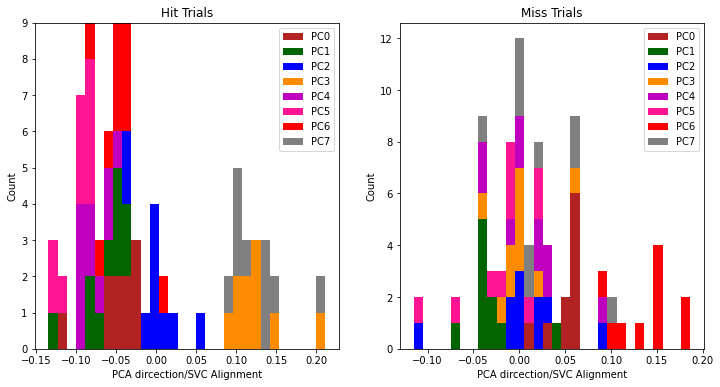

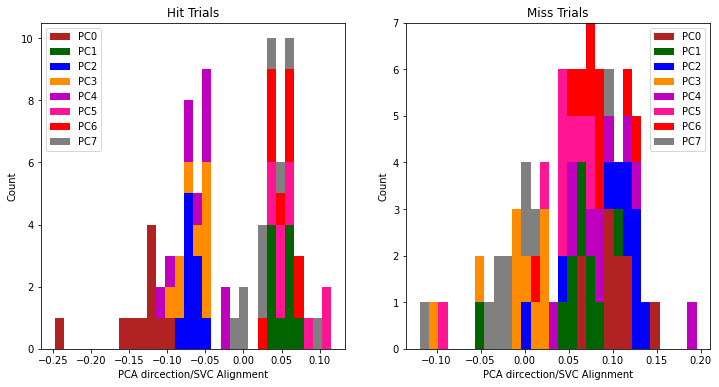

In [ ]:
from sklearn.decomposition import PCA

pc_dims = 8

for ed_idx in range(2):

    fig, ax = plt.subplots(1, 2, figsize=(12,6))

    for type_idx in range(2):

        dff_vals_shared = dff_vals_experiments[ed_idx][type_idx][:, shared_cell_idxs[ed_idx]]

        n_feat_space = np.min(dff_vals_shared.shape)

        pca_trial = PCA(n_components=n_feat_space)
        dff_vals_trial_pca = pca_trial.fit_transform(dff_vals_shared)

        explained_var = pca_trial.explained_variance_ratio_
        print('PCA:', ['{:.2f}'.format(var) for var in explained_var[:pc_dims]], 
            'PR:', participation_ratio_vector(pca_trial.explained_variance_))

        # print(pca_trial.components_.shape)

        centered_data = dff_vals_shared - np.mean(dff_vals_shared, axis=0)
        m_pca = np.matmul(centered_data, pca_trial.components_.T)

        align_vals_pca =[]
        for i in range(pc_dims):
            align_vals = np.zeros((n_folds,))
            for j in range(n_folds):
                align_vals[j] = get_align(coefs_experiments[ed_idx][j], pca_trial.components_[i])
            align_vals_pca.append(align_vals)

        ax[type_idx].hist(align_vals_pca, bins=30, histtype='barstacked', 
                        color=c_vals[:pc_dims], label=['PC{}'.format(i) for i in range(pc_dims)])

        ax[type_idx].set_title(f'{plot_labels[type_idx]} Trials')
        ax[type_idx].set_ylabel('Count')
        ax[type_idx].set_xlabel('PCA dircection/SVC Alignment')
        ax[type_idx].legend()

How does the variation within images align with variations within the whole trial?

(8, 196)
Full PCA: ['0.35', '0.29'] PR: 4.140830584559147
  0 Img PR: 7.39504469186667
  1 Img PR: 5.7676213571828185
  2 Img PR: 4.539622215699425
  3 Img PR: 9.129415395347078
  4 Img PR: 7.108276841442751
  5 Img PR: 3.3598864334488305
  6 Img PR: 3.921824766140657
  7 Img PR: 6.939034277922208
(8, 212)
Full PCA: ['0.33', '0.18'] PR: 5.147363157170865
  0 Img PR: 3.3038052368252613
  1 Img PR: 5.422497347674101
  2 Img PR: 4.240806509298203
  3 Img PR: 3.542888720533785
  4 Img PR: 3.864797502330256
  5 Img PR: 4.735984339790266
  6 Img PR: 2.2595491906134875
  7 Img PR: 4.59839002223803


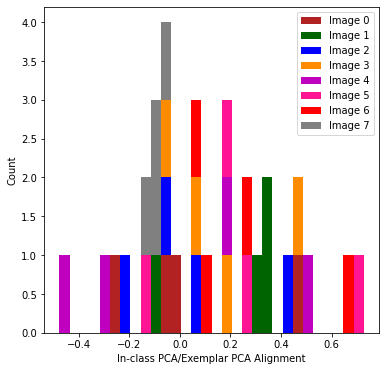

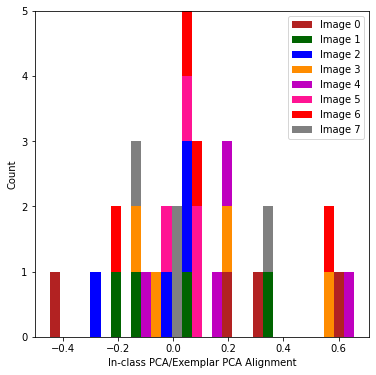

In [ ]:
from sklearn.decomposition import PCA

pc_dims = 2
type_idx = 0 # Images collected only for hits

for ed_idx in range(2):

    # Check to see if images are collected from only the given trial type
    assert (np.sum([img_dff.shape[0] for img_dff in dff_by_image_experiments[ed_idx]]) ==
            dff_vals_experiments[ed_idx][type_idx].shape[0])

    fig, ax = plt.subplots(1, 1, figsize=(6,6))

    avg_img_dff_vals = []
    for image_idx in range(len(unique_images_experiments[ed_idx])-1):
        avg_img_dff_vals.append(np.mean(dff_by_image_experiments[ed_idx][image_idx], axis=0))

    avg_img_dff_vals = np.array(avg_img_dff_vals)
    print(avg_img_dff_vals.shape)

    n_feat_space = np.min(avg_img_dff_vals.shape)

    pca_avg_image = PCA(n_components=n_feat_space)
    _ = pca_avg_image.fit_transform(avg_img_dff_vals)

    explained_var = pca_avg_image.explained_variance_ratio_
    print('Full PCA:', ['{:.2f}'.format(var) for var in explained_var[:pc_dims]], 
        'PR:', participation_ratio_vector(pca_avg_image.explained_variance_))

    align_vals_pca =[]
    for image_idx in range(len(unique_images_experiments[ed_idx])-1):
        
        dff_vals_image = dff_by_image_experiments[ed_idx][image_idx]
        
        n_feat_space = np.min(dff_vals_image.shape)

        pca_image = PCA(n_components=n_feat_space)
        _ = pca_image.fit_transform(dff_vals_image)

        print(f'  {image_idx} Img PR:', participation_ratio_vector(pca_image.explained_variance_))

        align_vals = np.zeros((pc_dims, pc_dims))
        for i in range(pc_dims):
            for j in range(pc_dims):
                align_vals[i, j] = get_align(pca_avg_image.components_[i], pca_image.components_[j])
        align_vals_pca.append(align_vals.flatten())

    ax.hist(align_vals_pca, bins=30, histtype='barstacked', 
            color=c_vals[:8], label=['Image {}'.format(i) for i in range(8)])

    ax.set_ylabel('Count')
    ax.set_xlabel('In-class PCA/Exemplar PCA Alignment')
    ax.legend()

Plot the important indices over an earlier plot (not that great)

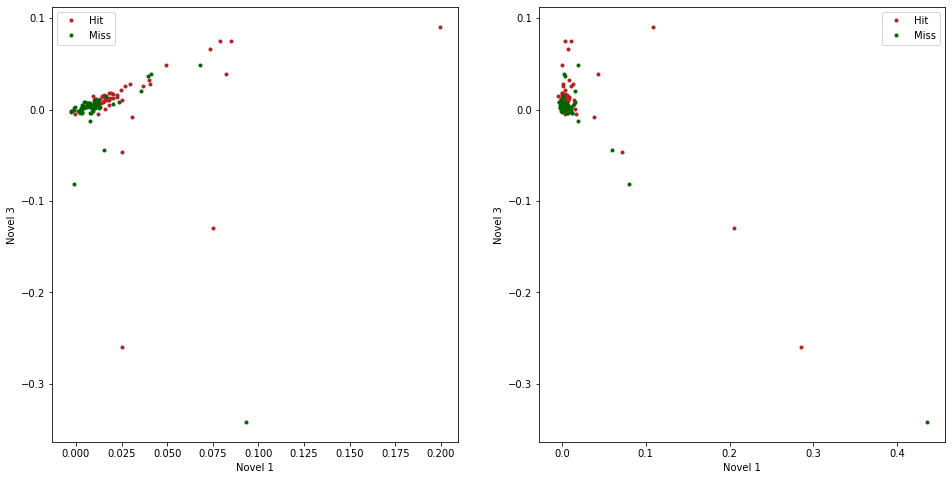

In [ ]:
n_top = 5
model0_data0_args = np.argsort(np.abs(model0_data0_vals))
model1_data1_args = np.argsort(np.abs(model1_data1_vals))

top_ids_m0d0 = np.array(shared_cell_ids)[model0_data0_args[-n_top:]]
top_idxs_m0d0_data0 = np.array([unique_cell_ids[cell_id][0] for cell_id in top_ids_m0d0])
top_idxs_m0d0_data1 = np.array([unique_cell_ids[cell_id][1] for cell_id in top_ids_m0d0])

top_ids_m1d1 = np.array(shared_cell_ids)[model1_data1_args[-n_top:]]
top_idxs_m1d1_data0  = np.array([unique_cell_ids[cell_id][0] for cell_id in top_ids_m1d1])
top_idxs_m1d1_data1  = np.array([unique_cell_ids[cell_id][1] for cell_id in top_ids_m1d1])

fig, ax = plt.subplots(1, 2, figsize=(16,8))
for trial_type_idx in range(2):
    # ax[0].plot(dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]],
    #         dff_vals_cells_experiments[1][trial_type_idx, shared_cell_idxs[1]],
    #         linewidth=0, marker='.',
    #         color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])
    # ax[0].plot(dff_vals_cells_experiments[0][trial_type_idx, top_idxs_m0d0_data0],
    #         dff_vals_cells_experiments[1][trial_type_idx, top_idxs_m0d0_data1],
    #         linewidth=0, marker='o',
    #         color=c_vals_l[trial_type_idx])
    
    # ax[1].plot(dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]],
    #         dff_vals_cells_experiments[1][trial_type_idx, shared_cell_idxs[1]],
    #         linewidth=0, marker='.',
    #         color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])
    # ax[1].plot(dff_vals_cells_experiments[0][trial_type_idx, top_idxs_m1d1_data0],
    #         dff_vals_cells_experiments[1][trial_type_idx, top_idxs_m1d1_data1],
    #         linewidth=0, marker='o',
    #         color=c_vals_l[trial_type_idx])

    exp_0_data = dff_vals_cells_experiments[0][
        trial_type_idx, shared_cell_idxs[0]][:, np.newaxis]
    dff_diff = (dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]] -
                dff_vals_cells_experiments[1][trial_type_idx, shared_cell_idxs[1]])
    ax[0].plot(exp_0_data, dff_diff, linewidth=0, marker='.',
            color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])
    
    exp_1_data = dff_vals_cells_experiments[1][
        trial_type_idx, shared_cell_idxs[1]][:, np.newaxis]
    dff_diff = (dff_vals_cells_experiments[0][trial_type_idx, shared_cell_idxs[0]] -
                dff_vals_cells_experiments[1][trial_type_idx, shared_cell_idxs[1]])
    ax[1].plot(exp_1_data, dff_diff, linewidth=0, marker='.',
            color=c_vals[trial_type_idx], label=plot_labels[trial_type_idx])


for i in range(2):
    # ax[i].plot([0, 0.5], [0, 0.5], color='k', linestyle='dashed')
    # ax[i].set_aspect('equal', adjustable='datalim')

    # ax[i].set_xlabel(experiment_0_name)
    # ax[i].set_ylabel(experiment_1_name)
    ax[i].legend()
    # ax[i].set_xlim([-0.05, 0.1])
    # ax[i].set_ylim([-0.05, 0.1])


###### Compare Experiment Pairs (average across many pairs)


In [68]:
mode = 'regular' # 'regular' or 'null' or 'short'

# Assumes pairs adjacent in list of dff_vals_experiments
assert len(dff_vals_experiments)%2 == 0 

n_pairs = len(dff_vals_experiments)//2

type_idxs = [0, 1]
type_names = ['Change', 'No change'] if len(dff_vals_experiments[0]) == 2 else ['Hit', 'Miss']
count_experiments = np.zeros((n_pairs, 2, 2))
    
assert len(type_idxs) == 2
pair_names = session_types

X_data_experiments, y_labels_experiments = [], []
svc_models_experiments, proto_models_experiments = [], []

n_shared_experiments = np.zeros((n_pairs,))

# This will catch if multiplane data hasn't been correctly processed
assert n_pairs == len(mouse_ids)

performance_metrics = np.zeros((n_pairs, 6, 3, 2))
svc_chance = np.zeros((n_pairs, 2, 2))
cross_match_ratio_metrics = np.zeros((n_pairs, 2, 3))
cross_chance_metrics = np.zeros((n_pairs, 2, 2)) #n_pairs, pair_idx, metric_idx
cross_chance_ratio_metrics = np.zeros((n_pairs, 2, 2)) #n_pairs, pair_idx, metric_idx
cross_aligns = np.zeros((n_pairs, 2))

for pairs_idx in range(n_pairs):
    ed_idxs = [2*pairs_idx, 2*pairs_idx+1]

    print(f'----- Mouse ID: {mouse_ids[pairs_idx]} Pair idxs:', ed_idxs, '-----')
    cell_ids_pair = [cell_ids_experiment[ed_idxs[0]], cell_ids_experiment[ed_idxs[1]]]
    unique_cell_ids_pair = get_unique_cell_ids(cell_ids_pair, verbose=True)

    shared_cell_idxs_pair = get_shared_cell_idxs(unique_cell_ids_pair)

    n_shared_experiments[pairs_idx] = len(shared_cell_idxs_pair[0])

    X_data_pair, y_labels_pair, performance_metrics_pair, cross_aligns_pair, svc_models_pair, proto_models_pair, svc_chance_pair = drift_classification_stats(
        ed_idxs, type_idxs, shared_cell_idxs_pair, verbose=False, mode=mode)

    X_data_experiments.extend(X_data_pair)
    y_labels_experiments.extend(y_labels_pair)
    svc_models_experiments.extend(svc_models_pair)
    proto_models_experiments.extend(proto_models_pair)
    
    performance_metrics[pairs_idx] = performance_metrics_pair
    svc_chance[pairs_idx] = svc_chance_pair

    # First of pair data (keeps data constant)
    cross_match_ratio_metrics[pairs_idx, 0, :] = (
        performance_metrics_pair[3, 0, 0]/performance_metrics_pair[0, 0, 0],
        performance_metrics_pair[3, 1, 0]/performance_metrics_pair[0, 1, 0],
        performance_metrics_pair[3, 2, 0]/performance_metrics_pair[0, 2, 0],
    )
    # Second of pair data (keeps data constant)
    cross_match_ratio_metrics[pairs_idx, 1, :] = (
        performance_metrics_pair[2, 0, 0]/performance_metrics_pair[1, 0, 0],
        performance_metrics_pair[2, 1, 0]/performance_metrics_pair[1, 1, 0],
        performance_metrics_pair[2, 2, 0]/performance_metrics_pair[1, 2, 0],
    )
    # Random rotation values, raw
    cross_chance_metrics[pairs_idx, 0, :] = (
        svc_chance_pair[1, 0], svc_chance_pair[1, 1]
    )
    cross_chance_metrics[pairs_idx, 1, :] = (
        svc_chance_pair[0, 0], svc_chance_pair[0, 1]
    )
    # Random rotation values, relative to true accs
    cross_chance_ratio_metrics[pairs_idx, 0, :] = (
        svc_chance_pair[1, 0]/performance_metrics_pair[0, 0, 0],
        svc_chance_pair[1, 1]/performance_metrics_pair[0, 1, 0]
    )
    cross_chance_ratio_metrics[pairs_idx, 1, :] = (
        svc_chance_pair[0, 0]/performance_metrics_pair[1, 0, 0],
        svc_chance_pair[0, 1]/performance_metrics_pair[1, 1, 0]
    )

    cross_aligns[pairs_idx, 0] = np.mean(cross_aligns_pair[0]) # SVC
    cross_aligns[pairs_idx, 1] = np.mean(cross_aligns_pair[1]) # Prototype

    # Number of trials of each type (both for hit/miss and change/no change)
    count_experiments[pairs_idx, 0, 0] = len(dff_vals_experiments[ed_idxs[0]][0])
    count_experiments[pairs_idx, 0, 1] = len(dff_vals_experiments[ed_idxs[0]][1])
    count_experiments[pairs_idx, 1, 0] = len(dff_vals_experiments[ed_idxs[1]][0])
    count_experiments[pairs_idx, 1, 1] = len(dff_vals_experiments[ed_idxs[1]][1])

    # print('Data {} cross/matched ratios - SVC score: {:.2f} SVC acc: {:.2f} Proto acc: {:.2f}'.format(
    #     pair_names[0],
    #     cross_match_ratio_metrics[pair_idx, 0, 0],
    #     cross_match_ratio_metrics[pair_idx, 0, 1],
    #     cross_match_ratio_metrics[pair_idx, 0, 2],
    # ))
    # print('Data {} cross/matched ratios - SVC score: {:.2f} SVC acc: {:.2f} Proto acc: {:.2f}'.format(
    #     pair_names[1],
    #     cross_match_ratio_metrics[pair_idx, 1, 0],
    #     cross_match_ratio_metrics[pair_idx, 1, 1],
    #     cross_match_ratio_metrics[pair_idx, 1, 2],
    # ))

print('\n' + 15*'-' + f' {type_names[0]}-{type_names[1]} classification' + 15*'-' + '\n')

avg_performance_metrics = np.mean(performance_metrics, axis=0)
std_performance_metrics = np.std(performance_metrics, axis=0)
for pair_idx in range(2):
    print('Session type: {}'.format(pair_names[pair_idx]))
    print('  SVC - Score {:.2f} (std {:.2f}) Raw acc {:.2f} (std {:.2f})'.format(
        avg_performance_metrics[pair_idx, 0, 0], std_performance_metrics[pair_idx, 0, 0],
        avg_performance_metrics[pair_idx, 1, 0], std_performance_metrics[pair_idx, 1, 0]))
    print('  Proto - Raw acc {:.2f} (std {:.2f})'.format(
        avg_performance_metrics[pair_idx, 2, 0], std_performance_metrics[pair_idx, 2, 0],))

print('\n' + 40*'-' + '\n')

avg_cross_match_ratio_metrics = np.mean(cross_match_ratio_metrics, axis=0)
std_cross_match_ratio_metrics = np.std(cross_match_ratio_metrics, axis=0)

print('Avg cross/matched ratios (data {}):'.format(pair_names[0])) 
print('   SVC score: {:.2f} (std: {:.2f})'.format(
    avg_cross_match_ratio_metrics[0, 0], std_cross_match_ratio_metrics[0, 0],
))
print('   SVC acc: {:.2f} (std: {:.2f})'.format(
    avg_cross_match_ratio_metrics[0, 1], std_cross_match_ratio_metrics[0, 1],
))
print('   Proto acc: {:.2f} (std: {:.2f})'.format(
    avg_cross_match_ratio_metrics[0, 2], std_cross_match_ratio_metrics[0, 2],
))

print('Avg cross/matched ratios (data {}):'.format(pair_names[1])) 
print('   SVC score: {:.2f} (std: {:.2f})'.format(
    avg_cross_match_ratio_metrics[1, 0], std_cross_match_ratio_metrics[1, 0],
))
print('   SVC acc: {:.2f} (std: {:.2f})'.format(
    avg_cross_match_ratio_metrics[1, 1], std_cross_match_ratio_metrics[1, 1],
))
print('   Proto acc: {:.2f} (std: {:.2f})'.format(
    avg_cross_match_ratio_metrics[1, 2], std_cross_match_ratio_metrics[1, 2],
))

avg_cross_aligns = np.mean(cross_aligns, axis=0)
std_cross_aligns = np.std(cross_aligns, axis=0)
print('Avg SVC alignment: {:.2f} (std: {:.2f})'.format(
    avg_cross_aligns[0], std_cross_aligns[0]
))
print('Avg prototype alignment: {:.2f} (std: {:.2f})'.format(
    avg_cross_aligns[1], std_cross_aligns[1]
))

print('\n' + 15*'-' + f' {pair_names[0]}-{pair_names[1]} classification' + 15*'-' + '\n')

for type_idx in range(2):
    print('Trial type: {}'.format(type_names[type_idx]))
    print('  SVC - Score {:.2f} (std {:.2f}) Raw acc {:.2f} (std {:.2f})'.format(
        avg_performance_metrics[4+type_idx, 0, 0], std_performance_metrics[4+type_idx, 0, 0],
        avg_performance_metrics[4+type_idx, 1, 0], std_performance_metrics[4+type_idx, 1, 0]))
    print('  Proto - Raw acc {:.2f} (std {:.2f})'.format(
        avg_performance_metrics[4+type_idx, 2, 0], std_performance_metrics[4+type_idx, 2, 0],))

# Stores differently for different types so can be aggregated together
if len(dff_vals_experiments[0]) == 2:
    change_nochange_count_experiments = count_experiments
else:
    hit_miss_count_experiments = count_experiments

----- Mouse ID: 425493 Pair idxs: [0, 1] -----
Number of cells:  196
Number of cells:  212
Shared IDs: 123/285
----- Mouse ID: 425496 Pair idxs: [2, 3] -----
Number of cells:  302
Number of cells:  200
Shared IDs: 156/346
----- Mouse ID: 431252 Pair idxs: [4, 5] -----
Number of cells:  162
Number of cells:  143
Shared IDs: 118/187
----- Mouse ID: 436662 Pair idxs: [6, 7] -----
Number of cells:  233
Number of cells:  209
Shared IDs: 102/340
----- Mouse ID: 440298 Pair idxs: [8, 9] -----
Number of cells:  48
Number of cells:  151
Shared IDs: 45/154
----- Mouse ID: 442709 Pair idxs: [10, 11] -----
Number of cells:  556
Number of cells:  537
Shared IDs: 345/748
----- Mouse ID: 445002 Pair idxs: [12, 13] -----
Number of cells:  125
Number of cells:  127
Shared IDs: 75/177
----- Mouse ID: 449441 Pair idxs: [14, 15] -----
Number of cells:  511
Number of cells:  457
Shared IDs: 326/642
----- Mouse ID: 450471 Pair idxs: [16, 17] -----
Number of cells:  83
Number of cells:  98
Shared IDs: 46/135

Average angle: 75.2 (std: 12.21)
Average cross acc: 0.97 (std: 0.11)
Chance percentages: [0.88083166 0.90798042]


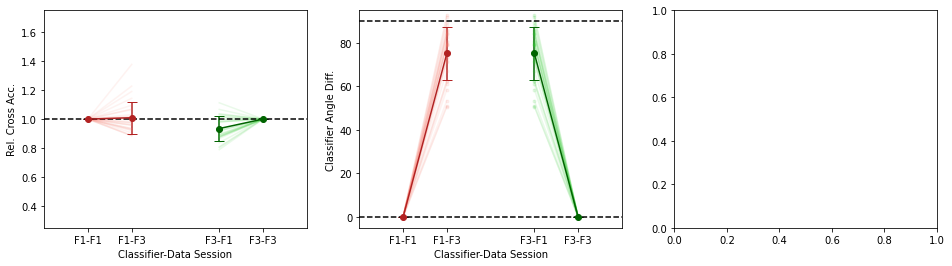

In [15]:
session_locs = [
    [0, 1,],
    [3, 4,]
]
# 0: SVC score, 1: SVC raw acc, 2: proto acc
metric_idx = 0

cross_accs = np.zeros((n_pairs, 2, 2)) # pairs_idx, classifier_idx, data_idx
cross_accs_ratio = np.zeros((n_pairs, 2, 2)) # pairs_idx, classifier_idx, data_idx
cross_angles = np.zeros((n_pairs, 2, 2)) # This is symmetric, so only need one value for each

for pairs_idx in range(n_pairs):
    for classifier_idx in range(2):
        for data_idx in range(2):
            if classifier_idx == 0 and data_idx == 0:
                perf_metric_idx = 0
            elif classifier_idx == 1 and data_idx == 0:
                perf_metric_idx = 3
            elif classifier_idx == 0 and data_idx == 1:
                perf_metric_idx = 2
            elif classifier_idx == 1 and data_idx == 1:
                perf_metric_idx = 1

            cross_accs[pairs_idx, classifier_idx, data_idx] = (
                performance_metrics[pairs_idx][perf_metric_idx, metric_idx, 0]
            )
            cross_accs_ratio[pairs_idx, classifier_idx, data_idx] = (
                performance_metrics[pairs_idx][perf_metric_idx, metric_idx, 0]/
                performance_metrics[pairs_idx][data_idx, metric_idx, 0]
            )
            angle_idx = 0 if metric_idx < 2 else 1 # SVC vs proto aligns
            if classifier_idx == data_idx:
                cross_angles[pairs_idx, classifier_idx, data_idx] = 0.0 # Fills in data for same classifier
            else:
                cross_angles[pairs_idx, classifier_idx, data_idx] = 180/np.pi * np.arccos(
                    np.mean(cross_aligns[pairs_idx, angle_idx]))

print('Average angle: {:.1f} (std: {:.2f})'.format(np.mean(cross_angles[:, 0, 1]), np.std(cross_angles[:, 0, 1])))
cross_accs_rel = []
for classifier_idx in range(2):
    for data_idx in range(2):
        if classifier_idx != data_idx: 
            cross_accs_rel.extend(cross_accs_ratio[:, classifier_idx, data_idx])
print('Average cross acc: {:.2f} (std: {:.2f})'.format(np.mean(cross_accs_rel), np.std(cross_accs_rel)))

mean_chance_accs = np.mean(cross_chance_ratio_metrics[:, :, metric_idx], axis=0)
mean_chance_accs_raw = np.mean(cross_chance_metrics[:, :, metric_idx], axis=0)

print('Chance percentages:', mean_chance_accs)
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
# fig2, ax2 = plt.subplots(1, 3, figsize=(16, 4))

avg_cross_accs_rel = np.mean(cross_accs_ratio, axis=0)
std_cross_accs_rel = np.std(cross_accs_ratio, axis=0)

avg_cross_angles = np.mean(cross_angles, axis=0)
std_cross_angles = np.std(cross_angles, axis=0)

for session_idx_c in range(2): # Classifier index
    for pairs_idx in range(n_pairs):
        ax[0].plot(session_locs[session_idx_c], 
                   cross_accs_ratio[pairs_idx, session_idx_c],
                   alpha=0.1, color=c_vals_l[session_idx_c])
        ax[1].plot(session_locs[session_idx_c], 
                   cross_angles[pairs_idx, session_idx_c],
                   marker='.', alpha=0.1, color=c_vals_l[session_idx_c])
    ax[0].errorbar(session_locs[session_idx_c], 
                    avg_cross_accs_rel[session_idx_c],
                    yerr=std_cross_accs_rel[session_idx_c],
                    color=c_vals[session_idx_c],
                    capsize=5.0, marker='o')
    ax[1].errorbar(session_locs[session_idx_c], 
                    avg_cross_angles[session_idx_c],
                    yerr=std_cross_angles[session_idx_c],
                    color=c_vals[session_idx_c],
                    capsize=5.0, marker='o')

# # Removes deltat=0 values
# deltat_filter = np.abs(cross_deltats.flatten()) > 0

# fit_X = cross_deltats.flatten()[deltat_filter]
# # fit_X = np.abs(cross_deltats.flatten()[deltat_filter])
# fit_y = cross_accs_rel_containers.flatten()[deltat_filter]

# ax2[0].scatter(fit_X, fit_y,
#                marker='.', color='lightgrey')
# reg = linregress(fit_X, fit_y)
# print('Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
#       reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
# reg_plot_X = np.linspace(np.min(fit_X), np.max(fit_X), num=50)
# reg_plot_y = reg.slope * reg_plot_X + reg.intercept
# reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
#                   (reg.intercept - n_se * reg.intercept_stderr))
# reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
#                   (reg.intercept + n_se * reg.intercept_stderr))
# ax2[0].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
#                     color=c_vals[2], alpha=0.3)
# ax2[0].plot(reg_plot_X, reg_plot_y, color=c_vals[2])

# fit_X = cross_deltats.flatten()[deltat_filter]
# # fit_X = np.abs(cross_deltats.flatten()[deltat_filter])
# fit_y = cross_angles_containers.flatten()[deltat_filter]

# ax2[1].scatter(fit_X, fit_y,
#                marker='.', color='lightgrey')
# reg = linregress(fit_X, fit_y)
# print('Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
#       reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
# reg_plot_X = np.linspace(np.min(fit_X), np.max(fit_X), num=50)
# reg_plot_y = reg.slope * reg_plot_X + reg.intercept
# reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
#                   (reg.intercept - n_se * reg.intercept_stderr))
# reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
#                   (reg.intercept + n_se * reg.intercept_stderr))
# ax2[1].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
#                     color=c_vals[2], alpha=0.3)
# ax2[1].plot(reg_plot_X, reg_plot_y, color=c_vals[2])

# ax[0].set_ylim([0, 1.1*np.max(cross_accs_rel_containers)])
ax[0].set_xlim([-1, 5])
ax[0].set_ylim([0.25, 1.75])
ax[0].axhline(1.0, color='k', linestyle='dashed')
ax[0].set_ylabel('Rel. Cross Acc.')

ax[1].set_xlim([-1, 5])
ax[1].set_ylim([-5, 95])
ax[1].axhline(0.0, color='k', linestyle='dashed')
ax[1].axhline(90.0, color='k', linestyle='dashed')
ax[1].set_ylabel('Classifier Angle Diff.')

for ax_it in (ax[0], ax[1]):
    ax_it.set_xticks([0, 1, 3, 4])
    ax_it.set_xticklabels(['{}-{}'.format(session_types[0], session_types[0]), 
                           '{}-{}'.format(session_types[0], session_types[1]),
                           '{}-{}'.format(session_types[1], session_types[0]),
                           '{}-{}'.format(session_types[1], session_types[1]),
                           ])
    ax_it.set_xlabel('Classifier-Data Session')

# ax2[0].set_xlabel('Classifier Age - Data Age')
# ax2[0].set_ylabel('Rel. Cross Acc.')
# ax2[0].axhline(1.0, color='k', linestyle='dashed')

# ax2[1].set_xlabel('Classifier Age - Data Age')
# ax2[1].set_ylabel('Classifier Angle Diff.')
# ax2[1].axhline(90.0, color='k', linestyle='dashed')


----- Pair idxs: [0, 1] -----
Shared IDs: 123/285
----- Pair idxs: [2, 3] -----
Shared IDs: 156/346
----- Pair idxs: [4, 5] -----
Shared IDs: 118/187
----- Pair idxs: [6, 7] -----
Shared IDs: 102/340
----- Pair idxs: [8, 9] -----
Shared IDs: 45/154
----- Pair idxs: [10, 11] -----
Shared IDs: 345/748
----- Pair idxs: [12, 13] -----
Shared IDs: 75/177
----- Pair idxs: [14, 15] -----
Shared IDs: 326/642
----- Pair idxs: [16, 17] -----
Shared IDs: 46/135
----- Pair idxs: [18, 19] -----
Shared IDs: 143/356
----- Pair idxs: [20, 21] -----
Shared IDs: 100/192
----- Pair idxs: [22, 23] -----
Shared IDs: 238/733
----- Pair idxs: [24, 25] -----
Shared IDs: 67/233
----- Pair idxs: [26, 27] -----
Shared IDs: 78/171
----- Pair idxs: [28, 29] -----
Shared IDs: 300/772
----- Pair idxs: [30, 31] -----
Shared IDs: 99/203
----- Pair idxs: [32, 33] -----
Shared IDs: 115/269
----- Pair idxs: [34, 35] -----
Shared IDs: 58/188
----- Pair idxs: [36, 37] -----
Shared IDs: 141/378
----- Pair idxs: [38, 39] ---

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:409: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:410: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:411: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:434: RuntimeWarning: Mean of empty slice


Text(0, 0.5, 'Variance Explained')

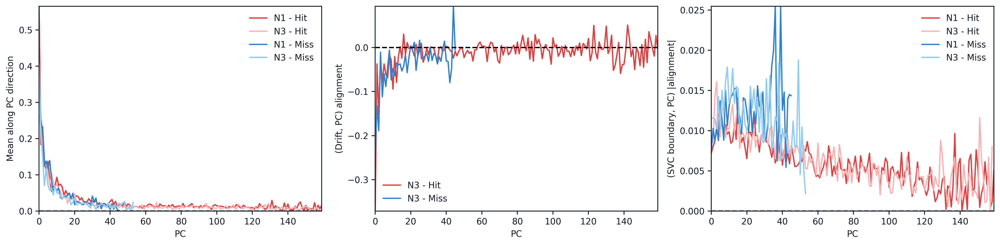

behavior_ophys_experiment_806455766.nwb:   2%|▏         | 28.5M/1.51G [03:12<2:46:41, 148kMB/s]


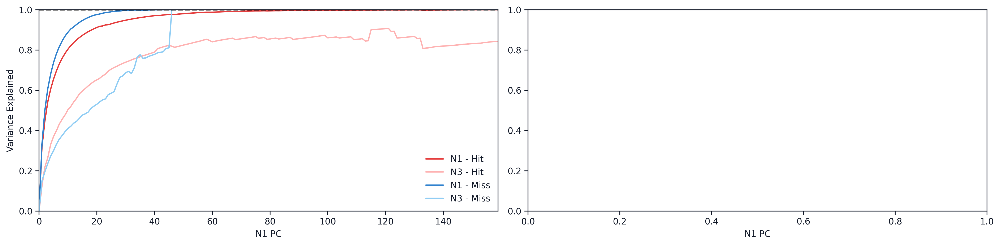

In [69]:
type_idxs = [0, 1]
assert len(type_idxs) == 2

pair_names = session_types
# pair_names = ['F1', 'F3']

# Assumes pairs adjacent in list of dff_vals_experiments
assert len(dff_vals_experiments)%2 == 0 

n_pairs = len(dff_vals_experiments)//2

guess_max_pca_dim = 400 if summary_specs['get_no_changes'] else 200

means_mag = np.zeros((n_pairs, 2, 2))
norm_means_mag = np.zeros((n_pairs, 2, 2))
means_diff_mag = np.zeros((n_pairs, 2))
norm_means_diff_mag = np.zeros((n_pairs, 2))
norm_vars = np.zeros((n_pairs, 2, 2))

var_space_overlaps = np.zeros((n_pairs, 2))
var_space_percs = np.zeros((n_pairs, 2, 2))
var_space_percs_chance = np.zeros((n_pairs, 2, 2))
var_explained_var_space = np.zeros((n_pairs, 2, 2))

drift_distance = np.zeros((n_pairs, 2))
drift_distance_ratio = np.zeros((n_pairs, 2))
mean_align = np.zeros((n_pairs, 2))
mean_angle = np.zeros((n_pairs, 2))
drifts_align = np.zeros((n_pairs,))
drifts_angle = np.zeros((n_pairs,))
var_ratio =  np.zeros((n_pairs, 2, 2))
delta_pr = np.zeros((n_pairs, 2))
pr_ratio = np.zeros((n_pairs, 2))
drift_perc = np.zeros((n_pairs, 2))
drift_perc_chance_ratio = np.zeros((n_pairs, 2))

# Even/odd or first/second half metrics
eo_var_drift_ratio = np.zeros((n_pairs, 2)) 
short_var_drift_ratio = np.zeros((n_pairs, 2))
eo_mean_rv_change = np.zeros((n_pairs, 2, 2)) # change in RV for each type and session pair
short_mean_rv_change = np.zeros((n_pairs, 2, 2))

pca_exp_var_ratio = np.empty((n_pairs, 2, 2, guess_max_pca_dim))
pca_exp_var_ratio[:] = np.nan
pca_means = np.empty((n_pairs, 2, 2, guess_max_pca_dim))
pca_means[:] = np.nan
# alignment between top PC dimensions (not printed out)
pca_aligns = np.empty((n_pairs, 2,))
pca_drift_aligns = np.empty((n_pairs, 2, 2, guess_max_pca_dim))
pca_drift_aligns[:] = np.nan

pca_svc_percs = np.empty((n_pairs, 2, 2, 2))
pca_proto_percs = np.empty((n_pairs, 2, 2, 2))
pca_svc_aligns = np.empty((n_pairs, 2, 2, guess_max_pca_dim))
pca_svc_aligns[:] = np.nan
norm_svc_dists = np.zeros((n_pairs, 2, 2,))
norm_proto_dists = np.zeros((n_pairs, 2, 2,))
norm_svc_delta_dists = np.zeros((n_pairs, 2, 2,))
norm_proto_delta_dists = np.zeros((n_pairs, 2, 2,))

first_pca_exp_var = np.empty((n_pairs, 2, 2, guess_max_pca_dim))
first_pca_exp_var[:] = np.nan
first_pca_exp_var_c = np.empty((n_pairs, 2, 2, guess_max_pca_dim))
first_pca_exp_var_c[:] = np.nan

first_pca_drift = np.empty((n_pairs, 2, guess_max_pca_dim))
first_pca_drift[:] = np.nan

max_pca_dim = 0

for pairs_idx in range(n_pairs):
    ed_idxs = [2*pairs_idx, 2*pairs_idx+1]

    print('----- Pair idxs:', ed_idxs, '-----')
    cell_ids_pair = [cell_ids_experiment[ed_idxs[0]], cell_ids_experiment[ed_idxs[1]]]
    unique_cell_ids_pair = get_unique_cell_ids(cell_ids_pair)

    shared_cell_idxs_pair = get_shared_cell_idxs(unique_cell_ids_pair)

    all_the_metrics_pair = pair_drift_geometry_metrics(ed_idxs, shared_cell_idxs_pair, verbose=False, mode=mode)

    for type_idx in range(2):
        delta_pr[pairs_idx, type_idx] = (
            all_the_metrics_pair['pr_pair'][1][type_idx] - 
            all_the_metrics_pair['pr_pair'][0][type_idx])
        pr_ratio[pairs_idx, type_idx] = (
            all_the_metrics_pair['pr_pair'][1][type_idx] / 
            all_the_metrics_pair['pr_pair'][0][type_idx])
        for pair_idx in range(2):
            n_cells = X_data_experiments[ed_idxs[pair_idx]].shape[1]
            
            assert all_the_metrics_pair['means_pair'][pair_idx][type_idx].shape[0] == n_cells

            means_mag[pairs_idx, pair_idx, type_idx] = np.linalg.norm(
                all_the_metrics_pair['means_pair'][pair_idx][type_idx])
            norm_means_mag[pairs_idx, pair_idx, type_idx] = np.linalg.norm(
                all_the_metrics_pair['means_pair'][pair_idx][type_idx]) / np.sqrt(n_cells)
            norm_vars[pairs_idx, pair_idx, type_idx] = (np.sum(
                all_the_metrics_pair['pca_pair'][pair_idx][type_idx].explained_variance_   
            ) / n_cells)
            var_ratio[pairs_idx, pair_idx, type_idx] = (
                all_the_metrics_pair['pr_pair'][pair_idx][type_idx] /
                n_cells)

            # Normalized distance from boundaries
            norm_svc_dists[pairs_idx, pair_idx, type_idx] = (
                all_the_metrics_pair['svc_dist'][pair_idx][type_idx] /
                np.sqrt(n_cells)
            )
            norm_proto_dists[pairs_idx, pair_idx, type_idx] = (
                all_the_metrics_pair['proto_dist'][pair_idx][type_idx] /
                np.sqrt(n_cells)
            )
            cross_idx = (pair_idx + 1) % 2
            # Change in distance from boundaries (crossed - matched)
            
            # Interested in drifted mean's distance from SAME bdry, so use cross_idx
            # to access crossed mean's distance
            norm_svc_delta_dists[pairs_idx, pair_idx, type_idx] = (
                (all_the_metrics_pair['svc_dist_cross'][cross_idx][type_idx] -
                 all_the_metrics_pair['svc_dist'][pair_idx][type_idx]) /
                all_the_metrics_pair['svc_dist'][pair_idx][type_idx]
            )
            norm_proto_delta_dists[pairs_idx, pair_idx, type_idx] = (
                (all_the_metrics_pair['proto_dist_cross'][cross_idx][type_idx] -
                 all_the_metrics_pair['proto_dist'][pair_idx][type_idx]) /
                all_the_metrics_pair['proto_dist'][pair_idx][type_idx]
            )

            # Amount of variance in variational space
            var_space_dim = int(np.ceil(all_the_metrics_pair['pr_pair'][pair_idx][type_idx]))
            var_explained_var_space[pairs_idx, pair_idx, type_idx] = np.sum(
                all_the_metrics_pair['pca_pair'][pair_idx][type_idx].explained_variance_ratio_[:var_space_dim]
            )

        drift_dir = (all_the_metrics_pair['means_pair'][1][type_idx] -
                     all_the_metrics_pair['means_pair'][0][type_idx])
        drift_distance[pairs_idx, type_idx] = np.linalg.norm(drift_dir)
        drift_distance_ratio[pairs_idx, type_idx] = (
            np.linalg.norm(drift_dir)/ np.linalg.norm(
                all_the_metrics_pair['means_pair'][0][type_idx])
        ) 
        if mode == 'regular': # No need to do this if using null/short mode
            eo_diff_mags = np.mean(
                (np.linalg.norm(
                    all_the_metrics_pair['means_pair_eo'][0][type_idx][0]
                    - all_the_metrics_pair['means_pair_eo'][0][type_idx][1]),
                np.linalg.norm(
                    all_the_metrics_pair['means_pair_eo'][1][type_idx][0]
                    - all_the_metrics_pair['means_pair_eo'][1][type_idx][1])
                ))

            eo_var_drift_ratio[pairs_idx, type_idx] = (
                eo_diff_mags / np.linalg.norm(drift_dir)
            ) 

            short_diff_mags = np.mean(
                (np.linalg.norm(
                    all_the_metrics_pair['means_pair_short'][0][type_idx][0]
                    - all_the_metrics_pair['means_pair_short'][0][type_idx][1]),
                np.linalg.norm(
                    all_the_metrics_pair['means_pair_short'][1][type_idx][0]
                    - all_the_metrics_pair['means_pair_short'][1][type_idx][1])
                ))

            short_var_drift_ratio[pairs_idx, type_idx] = (
                short_diff_mags / np.linalg.norm(drift_dir)
            ) 

            # Checks stability of response vector if half of data is held out.
            for pair_idx in range(2):
                delta_rv_e =  np.linalg.norm(
                    all_the_metrics_pair['means_pair_eo'][pair_idx][type_idx][0] -
                    all_the_metrics_pair['means_pair'][pair_idx][type_idx]
                ) 
                delta_rv_o =  np.linalg.norm(
                    all_the_metrics_pair['means_pair_eo'][pair_idx][type_idx][1] -
                    all_the_metrics_pair['means_pair'][pair_idx][type_idx]
                ) 
                # Averages over even/odd changes
                eo_mean_rv_change[pairs_idx, pair_idx, type_idx] = (
                    np.mean((delta_rv_e, delta_rv_o)) / 
                    np.linalg.norm(all_the_metrics_pair['means_pair'][pair_idx][type_idx])
                )

                delta_rv_f =  np.linalg.norm(
                    all_the_metrics_pair['means_pair_short'][pair_idx][type_idx][0] -
                    all_the_metrics_pair['means_pair'][pair_idx][type_idx]
                ) 
                delta_rv_s =  np.linalg.norm(
                    all_the_metrics_pair['means_pair_short'][pair_idx][type_idx][1] -
                    all_the_metrics_pair['means_pair'][pair_idx][type_idx]
                ) 
                short_mean_rv_change[pairs_idx, pair_idx, type_idx] = (
                    np.mean((delta_rv_f, delta_rv_s)) / 
                    np.linalg.norm(all_the_metrics_pair['means_pair'][pair_idx][type_idx])
                )

        mean_align[pairs_idx, type_idx] = (
            get_align(all_the_metrics_pair['means_pair'][0][type_idx],
                      all_the_metrics_pair['means_pair'][1][type_idx])
        )
        mean_angle[pairs_idx, type_idx] = (
            get_align_angle(all_the_metrics_pair['means_pair'][0][type_idx],
                            all_the_metrics_pair['means_pair'][1][type_idx])
        )
    drifts_align[pairs_idx] = (
            get_align((all_the_metrics_pair['means_pair'][1][0] -
                       all_the_metrics_pair['means_pair'][0][0]),
                      (all_the_metrics_pair['means_pair'][1][1] -
                       all_the_metrics_pair['means_pair'][0][1])
        ))
    drifts_angle[pairs_idx] = (
            get_align_angle((all_the_metrics_pair['means_pair'][1][0] -
                             all_the_metrics_pair['means_pair'][0][0]),
                            (all_the_metrics_pair['means_pair'][1][1] -
                             all_the_metrics_pair['means_pair'][0][1])
        ))
        

    drift_perc[pairs_idx] = np.array(all_the_metrics_pair['pca_drift_perc_and_chance'])[:, 0]
    drift_perc_chance_ratio[pairs_idx] = (
        np.array(all_the_metrics_pair['pca_drift_perc_and_chance'])[:, 0] / 
        np.array(all_the_metrics_pair['pca_drift_perc_and_chance'])[:, 1])

    for pair_idx in range(2):
        
        means_diff_mag[pairs_idx, pair_idx] = np.linalg.norm(
                all_the_metrics_pair['means_pair'][pair_idx][0] -
                all_the_metrics_pair['means_pair'][pair_idx][1])

        norm_means_diff_mag[pairs_idx, pair_idx] = means_diff_mag[pairs_idx, pair_idx] / np.sqrt(
                    X_data_experiments[ed_idxs[pair_idx]].shape[1])

        var_space_overlaps[pairs_idx, pair_idx] = all_the_metrics_pair['var_space_overlap'][pair_idx]
        var_space_percs[pairs_idx, pair_idx] = all_the_metrics_pair['var_space_perc'][pair_idx]
        var_space_percs_chance[pairs_idx, pair_idx] = all_the_metrics_pair['var_space_perc_chance'][pair_idx]

        pca_aligns[pairs_idx, pair_idx] = get_align(
            all_the_metrics_pair['pca_pair'][pair_idx][0].components_[0, :],
            all_the_metrics_pair['pca_pair'][pair_idx][1].components_[0, :]
        )

        for type_idx in range(2):
            n_pcas = all_the_metrics_pair['pca_means_pair'][pair_idx][type_idx].shape[0]
            if n_pcas > max_pca_dim:
                max_pca_dim = n_pcas
            pca_exp_var_ratio[pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['pca_pair'][pair_idx][type_idx].explained_variance_ratio_    
            pca_means[pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['pca_means_pair'][pair_idx][type_idx]
            pca_drift_aligns[pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['pca_aligns_diff'][pair_idx][type_idx]
            
            pca_svc_percs[pairs_idx, pair_idx, type_idx] = all_the_metrics_pair['svc_pca_perc'][pair_idx][type_idx]
            pca_proto_percs[pairs_idx, pair_idx, type_idx] = all_the_metrics_pair['proto_pca_perc'][pair_idx][type_idx]
            pca_svc_aligns[pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['svc_pca_aligns'][pair_idx][type_idx][:, 0]

            n_pcas = len(all_the_metrics_pair['first_pca_explained_var'][type_idx][0]) # Uses first pair PCA dimensions for both
            first_pca_exp_var[pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['first_pca_explained_var'][type_idx][pair_idx]
            # +1 needed because starts with 0.0 by default
            first_pca_exp_var_c[pairs_idx, pair_idx, type_idx, :(n_pcas+1)] = all_the_metrics_pair['first_pca_explained_var_c'][type_idx][pair_idx]
            first_pca_drift[pairs_idx, type_idx, :n_pcas] = all_the_metrics_pair['first_pca_drift'][type_idx]

print('\n' + 40*'-' + '\n')

avg_norm_mean_mag = np.mean(norm_means_mag, axis=0)
std_norm_mean_mag = np.std(norm_means_mag, axis=0)
avg_norm_vars = np.mean(norm_vars, axis=0)
std_norm_vars = np.std(norm_vars, axis=0)

avg_var_ratio =  np.mean(var_ratio, axis=0)
std_var_ratio =  np.std(var_ratio, axis=0)
for type_idx in range(2):
    for pair_idx in range(2):
        print('{} - {}:'.format(pair_names[pair_idx], type_names[type_idx]))
        print('    normalized mean magnitude: {:.3f} (std {:.3f}) total variance {:.3f} (std {:.3f})'.format(
            avg_norm_mean_mag[pair_idx, type_idx], std_norm_mean_mag[pair_idx, type_idx],
            avg_norm_vars[pair_idx, type_idx], std_norm_vars[pair_idx, type_idx]
        ))
        print('    PR/Neuronal space ratio: {:.3f} (std {:.3f})'.format(
            avg_var_ratio[pair_idx, type_idx], std_var_ratio[pair_idx, type_idx]
        ))


avg_overlap = np.mean(var_space_overlaps, axis=0)
std_overlap = np.std(var_space_overlaps, axis=0)
avg_var_perc = np.mean(var_space_percs, axis=0)
std_var_perc = np.std(var_space_percs, axis=0)
avg_mean_diff_mag = np.mean(norm_means_diff_mag, axis=0)
std_mean_diff_mag = np.var(norm_means_diff_mag, axis=0)

for pair_idx in range(2):
    print('Experiment {}:'.format(pair_names[pair_idx]))
    print('    {}-{} Normalized Mean Diff Mag: {:.3f} (std {:.3f})'.format(
        type_names[0], type_names[1], avg_mean_diff_mag[pair_idx], 
        std_mean_diff_mag[pair_idx]
    ))
    print('    {}-{} Overlap: {:.3f} (std {:.3f})'.format(
        type_names[0], type_names[1], avg_overlap[pair_idx], std_overlap[pair_idx]
    ))
    print('    {} in {} Perc: {:.3f} (std {:.3f}), {} in {} Perc: {:.3f} (std {:.3f})'.format(
        type_names[0], type_names[1], avg_var_perc[pair_idx, 0], std_var_perc[pair_idx, 0],
        type_names[1], type_names[0], avg_var_perc[pair_idx, 1], std_var_perc[pair_idx, 1],
    ))

delta_means_diff_mag = means_diff_mag[:, 1] - means_diff_mag[:, 0]
mean_mag = np.mean(means_mag) # Average over sessions and both populations

# Metrics averages across sessions and types 
print('All sessions/populations:'.format(pair_names[pair_idx]))
print('    Change in mean diff mag/|mean|: {:.3f} (std {:.3f})'.format(
        delta_means_diff_mag.mean()/mean_mag, delta_means_diff_mag.std()/mean_mag
    ))
print('    PR/Neuronal space ratio: {:.3f} (std {:.3f})'.format(
        var_ratio.mean(), var_ratio.std()
    ))
print('    Variance in variational space: {:.2f} (std {:.2f})'.format(
        var_explained_var_space.mean(), var_explained_var_space.std()
    ))

avg_pr_ratio = np.mean(pr_ratio, axis=0)
std_pr_ratio = np.std(pr_ratio, axis=0)

print('\n' + 40*'-' + '\n')

avg_drift_distance_ratio = np.mean(drift_distance_ratio, axis=0)
std_drift_distance_ratio = np.std(drift_distance_ratio, axis=0)
avg_eo_var_drift_ratio = np.mean(eo_var_drift_ratio, axis=0)
std_eo_var_drift_ratio = np.std(eo_var_drift_ratio, axis=0)
avg_mean_align = np.mean(mean_align, axis=0)
std_mean_align = np.std(mean_align, axis=0)
avg_drift_perc = np.mean(drift_perc, axis=0)
std_drift_perc = np.std(drift_perc, axis=0)
avg_drift_perc_chance_ratio = np.mean(drift_perc_chance_ratio, axis=0)
std_drift_perc_chance_ratio  = np.std(drift_perc_chance_ratio, axis=0)
avg_drift_angle = np.mean(drifts_angle, axis=0)
std_drift_angle = np.std(drifts_angle, axis=0)

for type_idx in range(2):
    print('{} Trials {} to {} statistics:'.format(
        type_names[type_idx], pair_names[0], pair_names[1],
    ))
    print('    ({} mean, {} mean) alignment: {:.2f} (std: {:.2f})'.format(
        pair_names[0], pair_names[1],
        avg_mean_align[type_idx], std_mean_align[type_idx]
    )) 
    print('    mag(drift)/mag({} mean): {:.2f} (std {:.2f})'.format(
        pair_names[0],
        avg_drift_distance_ratio[type_idx], std_drift_distance_ratio[type_idx]
    ))
    print('    mag({} even-odd)/mag(drift): {:.2f} (std {:.2f})'.format(
        pair_names[0],
        avg_eo_var_drift_ratio[type_idx], std_eo_var_drift_ratio[type_idx]
    ))
    print('    Avg PR ratio {}/{}: {:.2f} (std: {:.2f})'.format(
        pair_names[1], pair_names[0],
        avg_pr_ratio[type_idx], std_pr_ratio[type_idx]
    )) 
    print('    Avg drift perc in variation space: {:.2f} (std: {:.2f}) ratio to chance: {:.2f} (std: {:.2f})'.format(
        avg_drift_perc[type_idx], std_drift_perc[type_idx], 
        avg_drift_perc_chance_ratio[type_idx], std_drift_perc_chance_ratio[type_idx]
    )) 

print('Avg ({} drift, {} drift) angle: {:.2f} (std: {:.2f})'.format(
    type_names[0], type_names[1],
    avg_drift_angle, std_drift_angle
))

print('\n' + 40*'-' + '\n')

avg_pca_svc_percs = np.mean(pca_svc_percs, axis=0)
std_pca_svc_percs = np.std(pca_svc_percs, axis=0)
avg_pca_proto_percs = np.mean(pca_proto_percs, axis=0)
std_pca_proto_percs = np.std(pca_proto_percs, axis=0)

avg_norm_svc_delta_dist = np.mean(norm_svc_delta_dists, axis=0)
std_norm_svc_delta_dist = np.std(norm_svc_delta_dists, axis=0)
avg_norm_proto_delta_dist = np.mean(norm_proto_delta_dists, axis=0)
std_norm_proto_delta_dist = np.std(norm_proto_delta_dists, axis=0)

for pair_idx in range(2):
    print('{} SVC Boundary'.format(pair_names[pair_idx]))
    for type_idx in range(2):
        print('    {} Var space, bdry vector perc {:.2f} (std: {:.2f}) ratio to chance: {:.2f} (std: {:.2f})'.format(
            type_names[type_idx], 
            avg_pca_svc_percs[pair_idx, type_idx, 0], std_pca_svc_percs[pair_idx, type_idx, 0], 
            avg_pca_svc_percs[pair_idx, type_idx, 1], std_pca_svc_percs[pair_idx, type_idx, 1], 
        ))
    print('    (Delta distance)/distance, mean to {} bdry, {} {:.2f} (std: {:.2f}), {} {:.2f} (std: {:.2f})'.format(
        pair_names[pair_idx], type_names[0], 
        avg_norm_svc_delta_dist[pair_idx, 0], std_norm_svc_delta_dist[pair_idx, 0],
        type_names[1], 
        avg_norm_svc_delta_dist[pair_idx, 1], std_norm_svc_delta_dist[pair_idx, 1],
    ))
    print('{} Proto Boundary'.format(pair_names[pair_idx]))
    for type_idx in range(2):
        print('    {} Var space, bdry vector perc {:.2f} (std: {:.2f}) ratio to chance: {:.2f} (std: {:.2f})'.format(
            type_names[type_idx], 
            avg_pca_proto_percs[pair_idx, type_idx, 0], std_pca_proto_percs[pair_idx, type_idx, 0], 
            avg_pca_proto_percs[pair_idx, type_idx, 1], std_pca_proto_percs[pair_idx, type_idx, 1], 
        ))
    print('    (Delta distance)/distance, mean to {} bdry, {} {:.2f} (std: {:.2f}), {} {:.2f} (std: {:.4f})'.format(
        pair_names[pair_idx], type_names[0], 
        avg_norm_proto_delta_dist[pair_idx, 0], std_norm_proto_delta_dist[pair_idx, 0],
        type_names[1], 
        avg_norm_proto_delta_dist[pair_idx, 1], std_norm_proto_delta_dist[pair_idx, 1],
    ))


fig, ax = plt.subplots(1, 3, figsize=(16,4))
avg_pca_means_pair = np.nanmean(pca_means[:, :, :, :max_pca_dim], axis=0)
avg_pca_drift_aligns = np.nanmean(pca_drift_aligns[:, :, :, :max_pca_dim], axis=0)
avg_svc_pca_align_mags = np.nanmean(np.abs(pca_svc_aligns[:, :, :, :max_pca_dim]), axis=0)

for type_idx in range(2):
    for pair_idx in range(2):
        plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
        ax[0].plot(avg_pca_means_pair[pair_idx][type_idx], color=plot_color,
                label=f'{pair_names[pair_idx]} - {type_names[type_idx]}')
        ax[2].plot(avg_svc_pca_align_mags[pair_idx][type_idx], color=plot_color,
                label=f'{pair_names[pair_idx]} - {type_names[type_idx]}')
    ax[1].plot(avg_pca_drift_aligns[0][type_idx], color=c_vals[type_idx],
            label=f'{pair_names[pair_idx]} - {type_names[type_idx]}')


for i in range(3):    
    ax[i].legend()
    ax[i].axhline(0.0, color='k', linestyle='dashed')
    ax[i].set_xlabel('PC')
    # ax[i].set_xlim([-1,30])
ax[0].set_ylabel('Mean along PC direction')
ax[1].set_ylabel('(Drift, PC) alignment')
ax[2].set_ylabel('(SVC boundary, PC) |alignment|')

fig2, ax2 = plt.subplots(1, 2, figsize=(16,4))
avg_first_pca_exp_var_c = np.nanmean(first_pca_exp_var_c[:, :, :, :max_pca_dim], axis=0)

for type_idx in range(2):
    for pair_idx in range(2):
        plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
        ax2[0].plot(avg_first_pca_exp_var_c[pair_idx][type_idx], color=plot_color,
                    label=f'{pair_names[pair_idx]} - {type_names[type_idx]}')
        
for i in range(2):    
    ax2[i].legend()
    ax2[i].set_xlabel('{} PC'.format(pair_names[0]))
    # ax[i].set_xlim([-1,30])
ax2[0].axhline(1.0, color='k', linestyle='dashed')

ax2[0].set_ylabel('Variance Explained')

In [ ]:
for type_idx in range(2):
    print('{}:'.format(type_names[type_idx]))
    print('  Even/odd change in RV: {:.3f}'.format(np.mean(eo_mean_rv_change[:, :, type_idx])))
    print('  First/second half change in RV: {:.3f}'.format(np.mean(short_mean_rv_change[:, :, type_idx])))

Hit:
  Even/odd change in RV: 0.211
  First/second half change in RV: 0.274
Miss:
  Even/odd change in RV: 0.431
  First/second half change in RV: 0.464


Bins the data and plots it

Bins values: [2.32385745e-01 1.18885490e-01 6.08202526e-02 3.11148411e-02
 1.59179434e-02 8.14341041e-03 4.16606163e-03 2.13130232e-03
 1.09034623e-03 5.57806786e-04 2.85366613e-04 1.45989805e-04
 7.46864637e-05 3.82086123e-05 1.95470234e-05]
Bins values: [2.53071316e-01 1.28734039e-01 6.54853069e-02 3.33115115e-02
 1.69451263e-02 8.61976216e-03 4.38475926e-03 2.23046918e-03
 1.13461024e-03 5.77161256e-04 2.93594315e-04 1.49347554e-04
 7.59711298e-05 3.86455112e-05 1.96584616e-05]
Bins values: [2.23823014e-01 1.14791859e-01 5.88731728e-02 3.01942184e-02
 1.54856751e-02 7.94212089e-03 4.07326668e-03 2.08905173e-03
 1.07140963e-03 5.49492661e-04 2.81817687e-04 1.44535523e-04
 7.41277722e-05 3.80178278e-05 1.94981609e-05]
Bins values: [3.80908082e-01 1.88552448e-01 9.33349207e-02 4.62015079e-02
 2.28701039e-02 1.13208784e-02 5.60392240e-03 2.77398495e-03
 1.37314401e-03 6.79716911e-04 3.36465130e-04 1.66552843e-04
 8.24449459e-05 4.08108862e-05 2.02017044e-05]
Bin counts, N1 - Hit: [ 30. 

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:49: RuntimeWarning: invalid value encountered in long_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:148: RuntimeWarning: invalid value encountered in sqrt
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:149: RuntimeWarning: invalid value encountered in sqrt
No handles with labels found to put in legend.


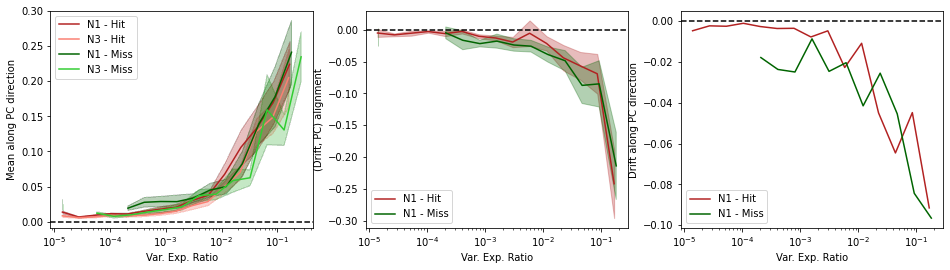

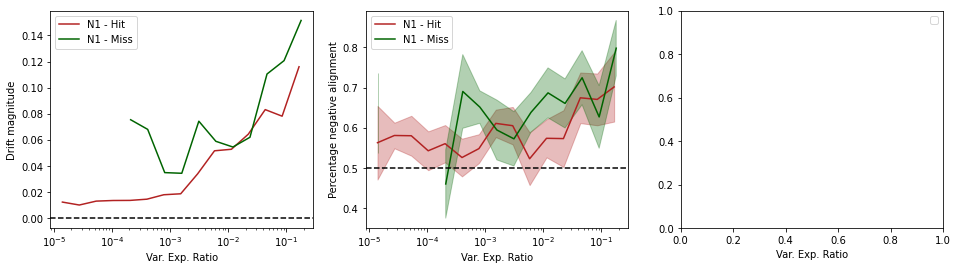

In [ ]:
n_bins_var_ratio = 15
min_var_explained_ratio = 1e-5

n_mice = len(mouse_ids)

var_ratio_bins = np.zeros((2, 2, n_bins_var_ratio))
var_ratio_bins_mid = np.zeros((2, 2, n_bins_var_ratio)) # Used for plotting only
bin_counts = np.zeros((2, 2, n_bins_var_ratio))

pca_means_bins = [[[[] for _ in range(n_bins_var_ratio)] for _ in range(2)] for _ in range(2)]
pca_means_bins_var = np.empty((2, 2, n_bins_var_ratio))
pca_drift_aligns_bins = [[[[] for _ in range(n_bins_var_ratio)] for _ in range(2)] for _ in range(2)]
pca_drift_aligns_bins_var = np.empty((2, 2, n_bins_var_ratio))
pca_drift_align_percs_bins = [[[[] for _ in range(n_bins_var_ratio)] for _ in range(2)] for _ in range(2)]
pca_drift_align_percs_bins_var = np.empty((2, 2, n_bins_var_ratio))

first_pca_drift_bins = [[[] for _ in range(n_bins_var_ratio)] for _ in range(2)]
first_pca_drift_mag_bins = [[[] for _ in range(n_bins_var_ratio)] for _ in range(2)]

for pair_idx in range(2):
    for type_idx in range(2):
        max_var_explained_ratio = np.nanmax(pca_exp_var_ratio[pair_idx, type_idx])
        var_ratio_bins[pair_idx, type_idx] = np.logspace(
            np.log10(max_var_explained_ratio), 
            np.log10(min_var_explained_ratio), 
            num=n_bins_var_ratio+1)[:-1]
        var_ratio_bins_mid[pair_idx, type_idx] = np.logspace(
            np.log10(max_var_explained_ratio), 
            np.log10(min_var_explained_ratio), 
            num=2*n_bins_var_ratio+1)[1:-1][::2]

        print('Bins values:', var_ratio_bins[pair_idx, type_idx])

# Puts variatio ratios into bins.
# Note this means all data from a given mouse before actually putting it in the bin,
# so data in bins is averaged over mice and not all examples in a given bin
for pairs_idx in range(n_pairs):
    for pair_idx in range(2):
        for type_idx in range(2):
            var_explained = pca_exp_var_ratio[pairs_idx][pair_idx][type_idx]
            pca_var_ratio_bins = np.digitize(var_explained, var_ratio_bins[pair_idx, type_idx]) - 1
            for bin_idx in range(n_bins_var_ratio):
                pca_idxs_bin = np.array(pca_var_ratio_bins == bin_idx)

                pca_means_bins[pair_idx][type_idx][bin_idx].append(np.mean(pca_means[pairs_idx, pair_idx, type_idx, pca_idxs_bin]))
                pca_drift_aligns_bins[pair_idx][type_idx][bin_idx].append(np.mean(pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin]))                
                pca_drift_align_percs_bins[pair_idx][type_idx][bin_idx].append(
                    np.sum(pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin] < 0)/
                    pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin].shape[0])
                # print('Val:', np.sum(pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin] < 0)/
                #     pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin].shape[0])
                # print(' <0:', np.sum(pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin] < 0))
                # print(' count', pca_drift_aligns[pairs_idx, pair_idx, type_idx, pca_idxs_bin].shape[0])
                # if bin_idx == n_bins_var_ratio - 1:
                #     print(sfds)
                if pair_idx == 0:
                    first_pca_drift_bins[type_idx][bin_idx].append(np.mean(first_pca_drift[pairs_idx, type_idx, pca_idxs_bin]))
                    first_pca_drift_mag_bins[type_idx][bin_idx].append(np.mean(np.abs(first_pca_drift[pairs_idx, type_idx, pca_idxs_bin])))

                bin_counts[pair_idx, type_idx, bin_idx] += np.sum(pca_idxs_bin)

n_min_bin = 10

for pair_idx in range(2):
    for type_idx in range(2):
        print('Bin counts, {} - {}:'.format(
            pair_names[pair_idx], type_names[type_idx],
        ), bin_counts[pair_idx, type_idx])
        for bin_idx in range(n_bins_var_ratio):
            if bin_counts[pair_idx, type_idx, bin_idx] > n_min_bin:
                pca_means_bins_var[pair_idx, type_idx, bin_idx] = np.nanvar(pca_means_bins[pair_idx][type_idx][bin_idx])
                pca_means_bins[pair_idx][type_idx][bin_idx] = np.nanmean(pca_means_bins[pair_idx][type_idx][bin_idx])
            else:
                pca_means_bins_var[pair_idx, type_idx, bin_idx] = np.nan
                pca_means_bins[pair_idx][type_idx][bin_idx] = np.nan
            if bin_counts[pair_idx, type_idx, bin_idx] > n_min_bin:
                pca_drift_aligns_bins_var[pair_idx][type_idx][bin_idx] = np.nanvar(pca_drift_aligns_bins[pair_idx][type_idx][bin_idx])
                pca_drift_aligns_bins[pair_idx][type_idx][bin_idx] = np.nanmean(pca_drift_aligns_bins[pair_idx][type_idx][bin_idx])
                pca_drift_align_percs_bins_var[pair_idx][type_idx][bin_idx] = np.nanvar(pca_drift_align_percs_bins[pair_idx][type_idx][bin_idx])
                pca_drift_align_percs_bins[pair_idx][type_idx][bin_idx] = np.nanmean(pca_drift_align_percs_bins[pair_idx][type_idx][bin_idx])
            else:
                pca_drift_aligns_bins[pair_idx][type_idx][bin_idx] = np.nan
                pca_drift_align_percs_bins[pair_idx][type_idx][bin_idx] = np.nan
            if pair_idx == 0:
                # print(f'Type_idx {type_idx} bin_idx {bin_idx}: ', len(first_pca_drift_bins[type_idx][bin_idx]))
                if bin_counts[pair_idx, type_idx, bin_idx] > n_min_bin:
                    first_pca_drift_bins[type_idx][bin_idx] = np.nanmean(first_pca_drift_bins[type_idx][bin_idx])
                    first_pca_drift_mag_bins[type_idx][bin_idx] = np.nanmean(first_pca_drift_mag_bins[type_idx][bin_idx])
                else:
                    first_pca_drift_bins[type_idx][bin_idx] = np.nan
                    first_pca_drift_mag_bins[type_idx][bin_idx] = np.nan

pca_means_bins = np.array(pca_means_bins)
pca_drift_aligns_bins = np.array(pca_drift_aligns_bins)
pca_drift_align_percs_bins = np.array(pca_drift_align_percs_bins)
first_pca_drift_mag_bins = np.array(first_pca_drift_mag_bins)

fig, ax = plt.subplots(1, 3, figsize=(16,4))
fig2, ax2 = plt.subplots(1, 3, figsize=(16,4))

# avg_pca_means_pair = np.nanmean(pca_means[:, :, :, :max_pca_dim], axis=0)
# avg_pca_drift_aligns = np.nanmean(pca_drift_aligns[:, :, :, :max_pca_dim], axis=0)
# avg_svc_pca_align_mags = np.nanmean(np.abs(pca_svc_aligns[:, :, :, :max_pca_dim]), axis=0)

for pairs_idx in range(n_pairs):
    for pair_idx in range(2):
        for type_idx in range(2):
            plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
            # Plots all datapoints as background for the given plot
            # ax[0].semilogx(pca_exp_var_ratio[pairs_idx][pair_idx][type_idx], 
            #                pca_means[pairs_idx, pair_idx, type_idx], 
            #                color=plot_color, alpha = 0.1,
            #                marker='.', linewidth=0)

            # Plots variance
            ax[0].fill_between(var_ratio_bins_mid[pair_idx, type_idx], 
                               pca_means_bins[pair_idx, type_idx]-np.sqrt(pca_means_bins_var[pair_idx, type_idx]/n_mice),
                               pca_means_bins[pair_idx, type_idx]+np.sqrt(pca_means_bins_var[pair_idx, type_idx]/n_mice),
                               color=plot_color, alpha=0.01)


for type_idx in range(2):
    for pair_idx in range(2):
        plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
        ax[0].plot(var_ratio_bins_mid[pair_idx, type_idx], pca_means_bins[pair_idx, type_idx], 
                       color=plot_color, 
                       label=f'{pair_names[pair_idx]} - {type_names[type_idx]}')
   
    ax[1].fill_between(var_ratio_bins_mid[0, type_idx], 
                       pca_drift_aligns_bins[0, type_idx]-np.sqrt(pca_drift_aligns_bins_var[0, type_idx]/n_mice),
                       pca_drift_aligns_bins[0, type_idx]+np.sqrt(pca_drift_aligns_bins_var[0, type_idx]/n_mice),
                       color=c_vals[type_idx], alpha=0.3)

    ax[1].plot(var_ratio_bins_mid[0, type_idx], 
               pca_drift_aligns_bins[0, type_idx], 
               color=c_vals[type_idx],
               label=f'{pair_names[0]} - {type_names[type_idx]}')
    ax[2].semilogx(var_ratio_bins_mid[0, type_idx], 
                   first_pca_drift_bins[type_idx], 
                   color=c_vals[type_idx],
                   label=f'{pair_names[0]} - {type_names[type_idx]}')
    ax2[0].semilogx(var_ratio_bins_mid[0, type_idx], 
                   first_pca_drift_mag_bins[type_idx], 
                   color=c_vals[type_idx],
                   label=f'{pair_names[0]} - {type_names[type_idx]}')
    
    ax2[1].fill_between(var_ratio_bins_mid[0, type_idx], 
                       pca_drift_align_percs_bins[0, type_idx]-np.sqrt(pca_drift_align_percs_bins_var[0, type_idx]/n_mice),
                       pca_drift_align_percs_bins[0, type_idx]+np.sqrt(pca_drift_align_percs_bins_var[0, type_idx]/n_mice),
                       color=c_vals[type_idx], alpha=0.3)
    ax2[1].plot(var_ratio_bins_mid[0, type_idx], 
               pca_drift_align_percs_bins[0, type_idx], 
               color=c_vals[type_idx],
               label=f'{pair_names[0]} - {type_names[type_idx]}')

ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax2[1].set_xscale('log')

for i in range(3):    
    ax[i].legend()
    ax[i].axhline(0.0, color='k', linestyle='dashed')
    ax[i].set_xlabel('Var. Exp. Ratio')
    ax2[i].legend()
    ax2[i].set_xlabel('Var. Exp. Ratio')
    # ax[i].set_xlim([-1,30])
ax[0].set_ylabel('Mean along PC direction')
# ax[0].set_xlim((1e-5, 1e0))
# ax[0].set_ylim((0, 0.3))

ax[1].set_ylabel('(Drift, PC) alignment')
ax[2].set_ylabel('Drift along PC direction')
ax2[0].set_ylabel('Drift magnitude')
ax2[1].set_ylabel('Percentage negative alignment')

ax2[0].axhline(0.0, color='k', linestyle='dashed')
ax2[1].axhline(0.5, color='k', linestyle='dashed')


# fig2, ax2 = plt.subplots(1, 2, figsize=(16,4))
# avg_first_pca_exp_var = np.nanmean(first_pca_exp_var[:, :, :, :max_pca_dim], axis=0)

# for type_idx in range(2):
#     for pair_idx in range(2):
#         plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
#         ax2[0].plot(avg_first_pca_exp_var[pair_idx][type_idx], color=plot_color,
#                     label=f'{pair_names[pair_idx]} - {type_names[type_idx]}')
        
# for i in range(2):    
#     ax2[i].legend()
#     ax2[i].set_xlabel('{} PC'.format(pair_names[0]))
#     # ax[i].set_xlim([-1,30])
# ax2[0].axhline(1.0, color='k', linestyle='dashed')

# ax2[0].set_ylabel('Variance Explained')

Instead of binning the data, this just creates a scatter plot of the data and does a linear fit. 

Angle, a: 43.9 (std: 58.3)
Angle, r: 0.30 (std: 0.38)
Var flow, a: 0.40 (std: 0.16)
Var flow, r: 0.75 (std: 0.17)
Drift magnitudes:
  Hit - Slope: 1.08 (se: 0.03), r: 0.59 p: 1.88e-240
  Alt - Hit - Slope: 0.02 (se: 0.00), r: 0.49 p: 5.78e-155
  Rtest, mean: 0.59 (std: 0.016)
  Miss - Slope: 0.87 (se: 0.04), r: 0.55 p: 2.01e-94
  Alt - Miss - Slope: 0.03 (se: 0.00), r: 0.54 p: 3.00e-90
  Rtest, mean: 0.55 (std: 0.025)
Drift angle
  Hit - Slope: 44.32 (se: 2.54), r: 0.32 p: 1.63e-64
  Alt - Hit - Slope: 0.49 (se: 0.06), r: 0.16 p: 4.82e-17
  Rtest, mean: 0.33 (std: 0.019)
  Miss - Slope: 25.40 (se: 3.43), r: 0.21 p: 2.53e-13
  Alt - Miss - Slope: 0.89 (se: 0.13), r: 0.19 p: 3.85e-11
  Rtest, mean: 0.22 (std: 0.029)
Change in variance
  Hit - Slope: 0.38 (se: 0.01), r: 0.70 p: 0.00e+00
  Rtest, mean: 0.70 (std: 0.015)
  Miss - Slope: 0.44 (se: 0.01), r: 0.67 p: 7.68e-151
  Rtest, mean: 0.68 (std: 0.025)


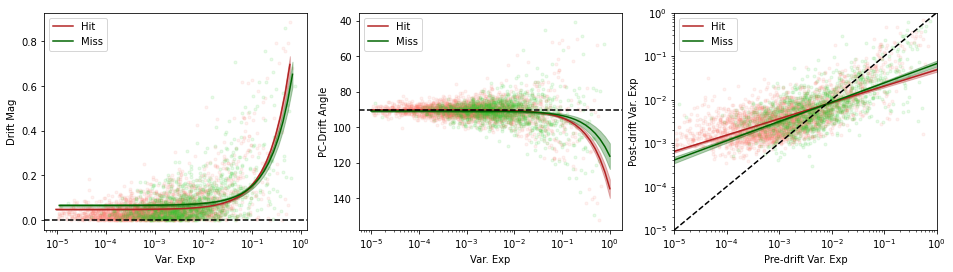

In [17]:
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress

def predict_rdist(X, y, reg, n_trials = 1000):
    r_vals = []
    sst = np.sum((y - np.mean(y))**2)
    sst = np.sum((y - np.mean(y))**2)
    for _ in range(n_trials):
        rand_slope = np.random.normal(reg.slope, reg.stderr)
        rand_intercept = np.random.normal(reg.intercept, reg.intercept_stderr)
        y_pred = rand_slope * X + rand_intercept
        ssreg = np.sum((y_pred - np.mean(y))**2)
        r_vals.append(np.sqrt(ssreg/sst))

    print('  Rtest, mean: {:.2f} (std: {:.3f})'.format(np.mean(r_vals), np.std(r_vals)))

    return np.mean(r_vals), np.std(r_vals)

min_var_exp = 1e-5
n_se = 1.97

var_exps_fit = [[], []] # Keeps types separate still
pca_mean_fit = [[], []]
pca_drift_mags_fit = [[], []]
pca_drift_angles_fit = [[], []]
pca0_var_exp1_fit = [[], []]
Xs = []
y1s = []
y2s = []
y3s = []

for pairs_idx in range(n_pairs):
    pair_idx = 0 # Taking the value of the first session b/c want earlier variance explained
    for type_idx in range(2):
        # Filters for a minimum variance explained
        var_exp_filter = pca_exp_var_ratio[pairs_idx][pair_idx][type_idx] > min_var_exp
        
        pca_drift_mags_fit[type_idx].append(
            np.abs(first_pca_drift[pairs_idx, type_idx, var_exp_filter]))

        pca_mean_fit[type_idx].append(
           pca_means[pairs_idx, pair_idx, type_idx, var_exp_filter])

        # Filters AND converts to angles
        pca_drift_angles_fit[type_idx].append(
            180/np.pi * np.arccos(
                pca_drift_aligns[pairs_idx, pair_idx, type_idx, var_exp_filter]))

        # For this we want the second pair_idx because it is data1 wrt pca0
        pca0_var_exp1_fit[type_idx].append(
            first_pca_exp_var[pairs_idx][1][type_idx][var_exp_filter])

        var_exps_fit[type_idx].append(
            pca_exp_var_ratio[pairs_idx][pair_idx][type_idx][var_exp_filter])

    Xs.append(np.concatenate((
        pca_exp_var_ratio[pairs_idx][pair_idx][0][var_exp_filter],
        pca_exp_var_ratio[pairs_idx][pair_idx][1][var_exp_filter]
    )))
    y1s.append(np.concatenate((
        np.abs(first_pca_drift[pairs_idx, 0, var_exp_filter]),
        np.abs(first_pca_drift[pairs_idx, 1, var_exp_filter])
    )))
    y2s.append(np.concatenate((
        180/np.pi * np.arccos(pca_drift_aligns[pairs_idx, pair_idx, 0, var_exp_filter]),
        180/np.pi * np.arccos(pca_drift_aligns[pairs_idx, pair_idx, 1, var_exp_filter])
    )))      
    y3s.append(np.concatenate((
        first_pca_exp_var[pairs_idx][1][0][var_exp_filter],
        first_pca_exp_var[pairs_idx][1][1][var_exp_filter]
    )))
    
# First does a fit for each mouse, this is used for matching the ANN data
mouse_angles_a = np.zeros((2, n_pairs,))
mouse_angles_r = np.zeros((2, n_pairs,))
mouse_varflow_a = np.zeros((2, n_pairs,))
mouse_varflow_r = np.zeros((2, n_pairs,))
for type_idx in range(2):
    for pairs_idx in range(n_pairs):
        reg = linregress(
            var_exps_fit[type_idx][pairs_idx], pca_drift_angles_fit[type_idx][pairs_idx])
        # reg = linregress(Xs[pairs_idx], y2s[pairs_idx])
        mouse_angles_a[type_idx, pairs_idx] = reg.slope
        mouse_angles_r[type_idx, pairs_idx] = reg.rvalue
        reg = linregress(
            np.log(var_exps_fit[type_idx][pairs_idx]), np.log(pca0_var_exp1_fit[type_idx][pairs_idx]))
        # reg = linregress(np.log(Xs[pairs_idx]), np.log(y3s[pairs_idx]))
        mouse_varflow_a[type_idx, pairs_idx] = reg.slope
        mouse_varflow_r[type_idx, pairs_idx] = reg.rvalue

type_idx = 0 # Prints data for the hits
print('Angle, a: {:.1f} (std: {:.1f})'.format(np.nanmean(mouse_angles_a[type_idx]), np.nanstd(mouse_angles_a[type_idx])))
print('Angle, r: {:.2f} (std: {:.2f})'.format(np.nanmean(mouse_angles_r[type_idx]), np.nanstd(mouse_angles_r[type_idx])))
print('Var flow, a: {:.2f} (std: {:.2f})'.format(np.nanmean(mouse_varflow_a[type_idx]), np.nanstd(mouse_varflow_a[type_idx])))
print('Var flow, r: {:.2f} (std: {:.2f})'.format(np.nanmean(mouse_varflow_r[type_idx]), np.nanstd(mouse_varflow_r[type_idx])))

# Merges list into big vector to fit all mouse data
for type_idx in range(2):
    pca_drift_mags_fit[type_idx] = np.concatenate(
        pca_drift_mags_fit[type_idx], axis=0)
    pca_drift_angles_fit[type_idx] = np.concatenate(
        pca_drift_angles_fit[type_idx], axis=0)
    pca0_var_exp1_fit[type_idx] = np.concatenate(
        pca0_var_exp1_fit[type_idx], axis=0)
    var_exps_fit[type_idx] = np.concatenate(
        var_exps_fit[type_idx], axis=0)

fig, ax = plt.subplots(1, 3, figsize=(16,4))

regs1 = []
regs2 = []
regs3 = []
reg1_rstds = []
reg2_rstds = []
reg3_rstds = []

print('Drift magnitudes:')
for type_idx in range(2):
    ax[0].scatter(var_exps_fit[type_idx], pca_drift_mags_fit[type_idx],
                         marker='.', color=c_vals_l[type_idx], 
                         alpha=0.1)

    reg = linregress(
        var_exps_fit[type_idx], pca_drift_mags_fit[type_idx])
    regs1.append(reg)
    print('  {} - Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
         type_names[type_idx], reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    alt_reg = linregress(
        np.log(var_exps_fit[type_idx]), pca_drift_mags_fit[type_idx])
    print('  Alt - {} - Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
         type_names[type_idx], alt_reg.slope, alt_reg.stderr, alt_reg.rvalue, alt_reg.pvalue))
    reg_plot_X = np.logspace(np.log10(0.9 * np.min(var_exps_fit[type_idx])), 
                             np.log10(0.9 * np.max(var_exps_fit[type_idx])), num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                      (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                      (reg.intercept + n_se * reg.intercept_stderr))
    ax[0].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=c_vals[type_idx], alpha=0.3)
    ax[0].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
               label=type_names[type_idx],)
    _, reg1_rstd = predict_rdist(var_exps_fit[type_idx], pca_drift_mags_fit[type_idx], reg)
    reg1_rstds.append(reg1_rstd)

print('Drift angle')    
for type_idx in range(2):   
    ax[1].scatter(var_exps_fit[type_idx], pca_drift_angles_fit[type_idx],
                         marker='.', color=c_vals_l[type_idx], 
                         alpha=0.1)

    reg = linregress(
        var_exps_fit[type_idx], pca_drift_angles_fit[type_idx])
    regs2.append(reg)
    print('  {} - Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
         type_names[type_idx], reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    alt_reg = linregress(
        np.log(var_exps_fit[type_idx]), pca_drift_angles_fit[type_idx])
    print('  Alt - {} - Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
         type_names[type_idx], alt_reg.slope, alt_reg.stderr, alt_reg.rvalue, alt_reg.pvalue))
        
    reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                      (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                      (reg.intercept + n_se * reg.intercept_stderr))
    ax[1].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=c_vals[type_idx], alpha=0.3)
    ax[1].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
               label=type_names[type_idx],)
    _, reg2_rstd = predict_rdist(var_exps_fit[type_idx], pca_drift_angles_fit[type_idx], reg)
    reg2_rstds.append(reg2_rstd)

print('Change in variance')
for type_idx in range(2):   
    ax[2].scatter(var_exps_fit[type_idx], pca0_var_exp1_fit[type_idx],
                         marker='.', color=c_vals_l[type_idx], 
                         alpha=0.1)

    reg = linregress(
        np.log(var_exps_fit[type_idx]), np.log(pca0_var_exp1_fit[type_idx]))
    regs3.append(reg)
    print('  {} - Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
         type_names[type_idx], reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
    reg_plot_y = np.exp(reg.slope * np.log(reg_plot_X) + reg.intercept)
    reg_plot_min_y = np.exp((reg.slope - n_se* reg.stderr) * np.log(reg_plot_X) + 
                            (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = np.exp((reg.slope + n_se * reg.stderr) * np.log(reg_plot_X) + 
                            (reg.intercept + n_se * reg.intercept_stderr))
    ax[2].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=c_vals[type_idx], alpha=0.3)
    ax[2].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
               label=type_names[type_idx],)
    _, reg3_rstd = predict_rdist( np.log(var_exps_fit[type_idx]), np.log(pca0_var_exp1_fit[type_idx]), reg)
    reg3_rstds.append(reg3_rstd)

    # reg = LinearRegression().fit(np.log(var_exps_fit[type_idx][:, np.newaxis]), 
    #                              np.log(pca0_var_exp1_fit[type_idx]))
    # reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)[:, np.newaxis]
    # reg_plot_y = reg.predict(np.log(reg_plot_X))
    # ax[2].plot(reg_plot_X, np.exp(reg_plot_y), color=c_vals[type_idx], 
    #            label=type_names[type_idx],)
    # print('Reg coef:', reg.coef_)

ax[0].axhline(0.0, color='k', linestyle='dashed')
ax[0].set_xlabel('Var. Exp')
ax[0].set_ylabel('Drift Mag')
ax[0].set_xscale('log')
ax[0].legend()

ax[1].axhline(90.0, color='k', linestyle='dashed')
ax[1].set_xlabel('Var. Exp')
ax[1].set_ylabel('PC-Drift Angle')
ax[1].set_xscale('log')
ax[1].invert_yaxis()
ax[1].legend()

ax[2].plot(reg_plot_X, reg_plot_X, color='k', linestyle='dashed')
ax[2].set_xlabel('Pre-drift Var. Exp')
ax[2].set_ylabel('Post-drift Var. Exp')
ax[2].set_xlim([min_var_exp, 1.0])
ax[2].set_ylim([min_var_exp, 1.0])
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[2].legend()

###### Fits as a function of Delta t

Raw avg, Drift mag: 0.72 (std 0.328)
Raw avg, Drift perc: 0.52 (std 0.204)
Magnitudes:
  Hit - Slope: -0.00 (se: 0.03), r: -0.01 p: 9.56e-01
  Miss - Slope: 0.00 (se: 0.05), r: 0.01 p: 9.70e-01
PR ratios:
  Hit - Slope: -0.21 (se: 0.13), r: -0.31 p: 1.13e-01
  Miss - Slope: -0.06 (se: 0.06), r: -0.20 p: 3.17e-01
Drift variation perc:
  Hit - Slope: 0.01 (se: 0.03), r: 0.06 p: 7.47e-01
  Miss - Slope: -0.00 (se: 0.02), r: -0.02 p: 9.31e-01
Mean angle:
  Hit - Slope: 0.79 (se: 1.18), r: 0.13 p: 5.11e-01
  Miss - Slope: -0.59 (se: 1.67), r: -0.07 p: 7.26e-01
Reg coef: [0.00022354]
Reg coef: [-0.13322065]
Reg coef: [0.00319432]
Reg coef: [0.09843424]


NameError: ignored

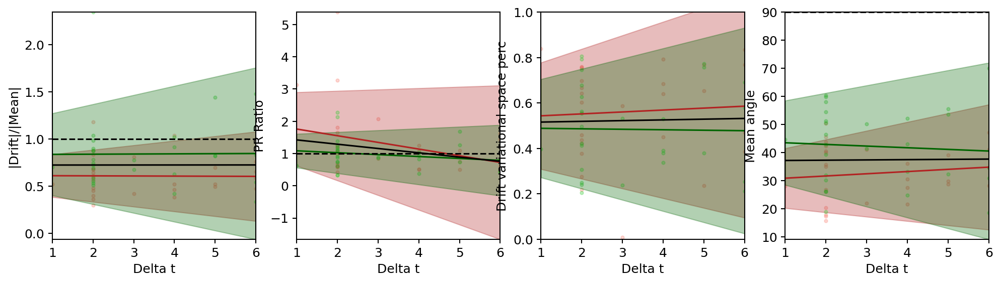

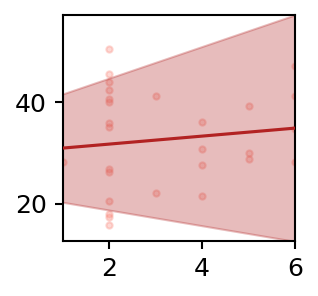

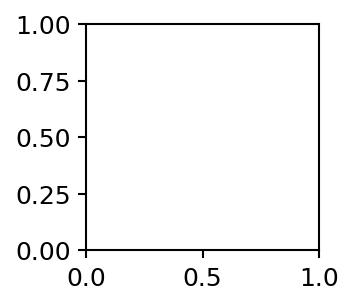

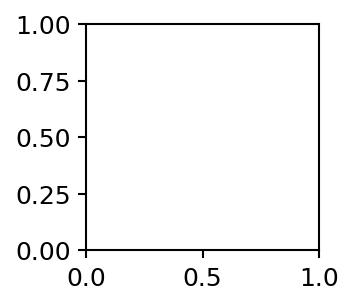

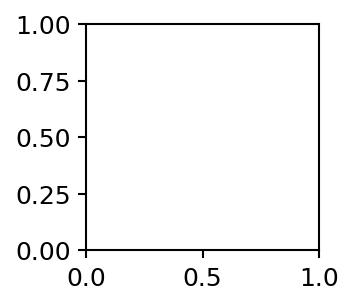

In [25]:
age_diffs = np.array(age_diffs)

def plot_deltat_data(X, y, ax, color_idx=None):
    regs = []
    for type_idx in range(2):        
        reg = linregress(X, y[:, type_idx])
        regs.append(reg)
        reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)
        reg_plot_y = reg.slope * reg_plot_X + reg.intercept
        reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                        (reg.intercept - n_se * reg.intercept_stderr))
        reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                        (reg.intercept + n_se * reg.intercept_stderr))
        if color_idx is None:
            print('  {} - Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
                type_names[type_idx], reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
            ax.scatter(X, y[:, type_idx],
                   marker='.', color=c_vals_l[type_idx], alpha=0.3)
            ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                        color=c_vals[type_idx], alpha=0.3)
            ax.plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
                    label=type_names[type_idx],)
        else:
            if type_idx == 0:
                plot_c_l = c_vals_l[color_idx]
                plot_c = c_vals[color_idx]
            else:
                plot_c_l = c_vals[color_idx]
                plot_c = c_vals_d[color_idx]

            ax.scatter(X, y[:, type_idx], marker='.', 
                       color=plot_c_l, alpha=0.3,
                       zorder=-5)
            ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                        color=plot_c, alpha=0.3, zorder=0)
            ax.plot(reg_plot_X, reg_plot_y, color=plot_c, 
                    label=type_names[type_idx], zorder=5)
            
            if type_idx == 1:
                # Class average
                reg = linregress(X, np.mean(y, axis=-1))
                regs.append(reg)
                reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)
                reg_plot_y = reg.slope * reg_plot_X + reg.intercept
                ax.plot(reg_plot_X, reg_plot_y, color=plot_c, linestyle='dotted')
    
    return regs
# for pairs_idx in range(n_pairs):
    
fig, ax = plt.subplots(1, 4, figsize=(16,4))

print('Raw avg, Drift mag: {:.2f} (std {:.3f})'.format(np.mean(drift_distance_ratio), np.std(drift_distance_ratio)))
print('Raw avg, Drift perc: {:.2f} (std {:.3f})'.format(np.mean(drift_perc), np.std(drift_perc)))

print('Magnitudes:')
regs4 = plot_deltat_data(age_diffs, drift_distance_ratio, ax[0])
print('PR ratios:')
regs5 = plot_deltat_data(age_diffs, pr_ratio, ax[1])
print('Drift variation perc:')
regs6 = plot_deltat_data(age_diffs, drift_perc, ax[2])
print('Mean angle:')
regs7 = plot_deltat_data(age_diffs, mean_angle, ax[3])

# for type_idx in range(2):
    
#     ax[0].scatter(age_diffs, drift_distance_ratio[:, type_idx],
#                   marker='.', color=c_vals_l[type_idx])

#     reg = LinearRegression().fit(age_diffs[:, np.newaxis],
#                                  drift_distance_ratio[:, type_idx])
#     reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
#     reg_plot_y = reg.predict(reg_plot_X)
#     ax[0].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
#                label=type_names[type_idx])
#     print('Reg coef:', reg.coef_)

#     ax[1].scatter(age_diffs, pr_ratio[:, type_idx],
#                   marker='.', color=c_vals_l[type_idx])

#     reg = LinearRegression().fit(age_diffs[:, np.newaxis],
#                                  pr_ratio[:, type_idx])
#     reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
#     reg_plot_y = reg.predict(reg_plot_X)
#     ax[1].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
#                label=type_names[type_idx])
#     print('Reg coef:', reg.coef_)

#     ax[2].scatter(age_diffs, drift_perc[:, type_idx],
#                   marker='.', color=c_vals_l[type_idx])

#     reg = LinearRegression().fit(age_diffs[:, np.newaxis],
#                                  drift_perc[:, type_idx])
#     reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
#     reg_plot_y = reg.predict(reg_plot_X)
#     ax[2].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
#                label=type_names[type_idx])
#     print('Reg coef:', reg.coef_)

# Plots of the average across classes:
reg = LinearRegression().fit(age_diffs[:, np.newaxis],
                             np.mean(drift_distance_ratio, axis=-1))
reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
reg_plot_y = reg.predict(reg_plot_X)
ax[0].plot(reg_plot_X, reg_plot_y, color='k', 
            label=type_names[type_idx])
print('Reg coef:', reg.coef_)

reg = LinearRegression().fit(age_diffs[:, np.newaxis],
                                np.mean(pr_ratio, axis=-1))
reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
reg_plot_y = reg.predict(reg_plot_X)
ax[1].plot(reg_plot_X, reg_plot_y, color='k', 
            label=type_names[type_idx])
print('Reg coef:', reg.coef_)

reg = LinearRegression().fit(age_diffs[:, np.newaxis],
                             np.mean(drift_perc, axis=-1))
reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
reg_plot_y = reg.predict(reg_plot_X)
ax[2].plot(reg_plot_X, reg_plot_y, color='k', 
            label=type_names[type_idx])
print('Reg coef:', reg.coef_)

reg = LinearRegression().fit(age_diffs[:, np.newaxis],
                             np.mean(mean_angle, axis=-1))
reg_plot_X = np.linspace(np.min(age_diffs), np.max(age_diffs), num=50)[:, np.newaxis]
reg_plot_y = reg.predict(reg_plot_X)
ax[3].plot(reg_plot_X, reg_plot_y, color='k', 
            label=type_names[type_idx])
print('Reg coef:', reg.coef_)


ax[0].set_xlabel('Delta t')
ax[0].set_ylabel('|Drift|/|Mean|')
ax[0].axhline(1.0, color='k', linestyle='dashed')

ax[1].set_xlabel('Delta t')
ax[1].set_ylabel('PR Ratio')
ax[1].axhline(1.0, color='k', linestyle='dashed')
# ax[1].set_ylim([-10, 10])

ax[2].set_xlabel('Delta t')
ax[2].set_ylabel('Drift variational space perc')
ax[2].set_ylim([0.0, 1.0])

ax[3].set_xlabel('Delta t')
ax[3].set_ylabel('Mean angle')
ax[3].axhline(90.0, color='k', linestyle='dashed')

#### Final Plots ####

max_delta_t = 6

fig0, ax0 = plt.subplots(1, 1, figsize=(2,2))
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))

regs7 = plot_deltat_data(age_diffs, mean_angle, ax0, color_idx=0)
regs4 = plot_deltat_data(age_diffs, drift_distance_ratio, ax1, color_idx=1)
regs5 = plot_deltat_data(age_diffs, pr_ratio, ax2, color_idx=2)
regs6 = plot_deltat_data(age_diffs, drift_perc, ax3, color_idx=3)

ax0.set_xlabel('$\Delta$t (days)')
ax0.set_ylabel('$\Delta$(RV Angle)')
ax0.set_ylim([0, 90.0])
ax0.set_xlim([1, max_delta_t])
ax0.set_yticks([0, 45.0, 90.0])
ax0.set_xticks([1, max_delta_t])
ax0.text(0.5, 1.0, 'Hit: r = {:.2f}, a = {:.2f}'.format(regs7[0].rvalue, regs7[0].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals_d[0], fontsize=6, transform=ax0.transAxes)
ax0.text(0.5, 0.9, 'Miss: r = {:.2f}, a = {:.2f}'.format(regs7[1].rvalue, regs7[1].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals[0], fontsize=6, transform=ax0.transAxes)

ax1.set_xlabel('$\Delta$t (days)')
ax1.set_ylabel('|Drift|/|RV|')
ax1.axhline(1.0, color='k', linestyle='dashed')
ax1.set_ylim([0, 3])
ax1.set_xlim([1, max_delta_t])
ax1.set_yticks([0, 1, 2, 3,])
ax1.set_yticklabels([0, 1, None, 3])
ax1.set_xticks([1, max_delta_t])
ax1.text(0.5, 1.0, 'Hit: r = {:.2f}, a = {:.1e}'.format(regs4[0].rvalue, regs4[0].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals_d[1], fontsize=6, transform=ax1.transAxes)
ax1.text(0.5, 0.9, 'Miss: r = {:.2f}, a = {:.1e}'.format(regs4[1].rvalue, regs4[1].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals[1], fontsize=6, transform=ax1.transAxes)

ax2.set_xlabel('$\Delta$t (days)')
ax2.set_ylabel('$D_{later}/D_{earlier}$')
ax2.axhline(1.0, color='k', linestyle='dashed')
ax2.set_ylim([-1, 4])
ax2.set_xlim([1, max_delta_t])
ax2.set_yticks([-1, 0, 1, 2, 3, 4])
ax2.set_yticklabels([-1, None, 1, None, None, 4])
ax2.set_xticks([1, max_delta_t])
ax2.text(0.5, 1.0, 'Hit: r = {:.2f}, a = {:.2f}'.format(regs5[0].rvalue, regs5[0].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals_d[2], fontsize=6, transform=ax2.transAxes)
ax2.text(0.5, 0.9, 'Miss: r = {:.2f}, a = {:.2f}'.format(regs5[1].rvalue, regs5[1].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals[2], fontsize=6, transform=ax2.transAxes)

ax3.set_xlabel('$\Delta$t (days)')
ax3.set_ylabel('Drift in Var. Ratio')
ax3.set_ylim([0, 1])
ax3.set_xlim([1, max_delta_t])
ax3.set_yticks([0, 0.5, 1])
ax3.set_yticklabels([0, None, 1])
ax3.set_xticks([1, max_delta_t])
ax3.text(0.5, 0.2, 'Hit: r = {:.2f}, a = {:.1e}'.format(regs6[0].rvalue, regs6[0].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals_d[3], fontsize=6, transform=ax3.transAxes)
ax3.text(0.5, 0.1, 'Miss: r = {:.2f}, a = {:.1e}'.format(regs6[1].rvalue, regs6[1].slope), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals[3], fontsize=6, transform=ax3.transAxes)

try:
    jetplot.breathe(ax=ax0)
    jetplot.breathe(ax=ax1)
    jetplot.breathe(ax=ax2)
    jetplot.breathe(ax=ax3)
except NameError:
    pass

###### Save/load data across different comparisons

In [5]:
def save_plot_data(path, type_idx, rebuttal=False):

    save_the_file = True

    if os.path.exists(path):
        print('File already exists at:', path)
        override = input('Override? (Y/N):')
        if override == 'Y':
            save_the_file = True
        else:
            save_the_file = False

    if save_the_file:
        with open(path, 'wb') as save_file:
            # Variance explained plots
            print(first_pca_drift[:, type_idx, :].shape)
            print(pca_drift_aligns[:, 0, type_idx, :].shape)
            print(first_pca_exp_var[:, 1, type_idx, :].shape)
            print(pca_exp_var_ratio[:, 0, type_idx, :].shape)
            pickle.dump(first_pca_drift[:, type_idx, :], save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(pca_drift_aligns[:, 0, type_idx, :], save_file, protocol=pickle.HIGHEST_PROTOCOL) # 0 to take alignments of initial session
            pickle.dump(first_pca_exp_var[:, 1, type_idx, :], save_file, protocol=pickle.HIGHEST_PROTOCOL) # 1 to take final session in first PCA
            pickle.dump(pca_exp_var_ratio[:, 0, type_idx, :], save_file, protocol=pickle.HIGHEST_PROTOCOL) # 0 to take initial session var exp values

            # pickle.dump(pca_means[:, 0, type_idx, :], save_file, protocol=pickle.HIGHEST_PROTOCOL) # 0 to take initial session
            # pickle.dump(pca_drift_mags_fit[type_idx], save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump(pca_drift_angles_fit[type_idx], save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump(pca0_var_exp1_fit[type_idx], save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump(var_exps_fit[type_idx], save_file, protocol=pickle.HIGHEST_PROTOCOL)

            # Cross accs/cross angles
            pickle.dump(var_space_percs, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(var_space_percs_chance, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(cross_accs_ratio, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(cross_angles, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(mean_chance_accs, save_file, protocol=pickle.HIGHEST_PROTOCOL)

            if rebuttal:
                 pickle.dump(cross_accs, save_file, protocol=pickle.HIGHEST_PROTOCOL)
                 pickle.dump(mean_chance_accs_raw, save_file, protocol=pickle.HIGHEST_PROTOCOL)
        print('Data Saved')
    else:
        print('Data Not Saved')

def load_plot_data(path, rebuttal=False):

    if not os.path.exists(path):
        raise ValueError('No file at path:', path)
    else:
        with open(path, 'rb') as load_file:
            pca_drift_mags_fit = pickle.load(load_file)
            pca_drift_angles_fit = pickle.load(load_file)
            pca0_var_exp1_fit = pickle.load(load_file)
            var_exps_fit = pickle.load(load_file)
            # pca_means = pickle.load(load_file)

            var_space_percs = pickle.load(load_file)
            var_space_percs_chance = pickle.load(load_file)
            cross_accs_ratio = pickle.load(load_file)
            cross_angles = pickle.load(load_file)
            mean_chance_accs = pickle.load(load_file)

            if rebuttal:
                cross_accs = pickle.load(load_file)
                mean_chance_accs_raw = pickle.load(load_file)

        if rebuttal:
            return (
                pca_drift_mags_fit,
                pca_drift_angles_fit,
                pca0_var_exp1_fit,
                var_exps_fit,
                # pca_means,
                var_space_percs,
                var_space_percs_chance,
                cross_accs_ratio,
                cross_angles,
                mean_chance_accs,
                cross_accs,
                mean_chance_accs_raw,
            )
        else:
            return (
                pca_drift_mags_fit,
                pca_drift_angles_fit,
                pca0_var_exp1_fit,
                var_exps_fit,
                # pca_means,
                var_space_percs,
                var_space_percs_chance,
                cross_accs_ratio,
                cross_angles,
                mean_chance_accs,
            )

def load_behave(path):

    if not os.path.exists(path):
        raise ValueError('No file at path:', path)
    else:
        with open(path, 'rb') as load_file:
            behavior_dicts = pickle.load(load_file)
            mean_dprimes = pickle.load(load_file)

        return (behavior_dicts, mean_dprimes,)

def save_model_comparison(path, type_idx):
    """ For comparison with ANNs"""

    save_the_file = True

    if os.path.exists(path):
        print('File already exists at:', path)
        override = input('Override? (Y/N):')
        if override == 'Y':
            save_the_file = True
        else:
            save_the_file = False

    if save_the_file:
        reg2 = regs2[type_idx]
        reg3 = regs3[type_idx]
        reg2_rstd = reg2_rstds[type_idx]
        reg3_rstd = reg3_rstds[type_idx]
        reg4 = regs4[type_idx]
        reg6 = regs6[type_idx]
        with open(path, 'wb') as save_file:
            # # Angle fit
            # pickle.dump((reg2.slope, reg2.stderr), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump((reg2.rvalue, reg2_rstd), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # # Variance flow fit
            # pickle.dump((reg3.slope, reg3.stderr), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump((reg3.rvalue, reg3_rstd), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # # Magntidue fit
            # pickle.dump((reg4.intercept, reg4.intercept_stderr), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump((reg4.slope, reg4.stderr), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # # Var fit
            # pickle.dump((reg6.intercept, reg6.intercept_stderr), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # pickle.dump((reg6.slope, reg6.stderr), save_file, protocol=pickle.HIGHEST_PROTOCOL)

            # Angle fit
            pickle.dump((np.nanmean(mouse_angles_a[type_idx]), np.nanstd(mouse_angles_a[type_idx])), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump((np.nanmean(mouse_angles_r[type_idx]), np.nanstd(mouse_angles_r[type_idx])), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # Variance flow fit
            pickle.dump((np.nanmean(mouse_varflow_a[type_idx]), np.nanstd(mouse_varflow_a[type_idx])), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump((np.nanmean(mouse_varflow_r[type_idx]), np.nanstd(mouse_varflow_r[type_idx])), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # Magntidue fit
            pickle.dump((np.mean(drift_distance_ratio[:, type_idx]), np.std(drift_distance_ratio[:, type_idx])), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump((np.nan, np.nan), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # Var fit
            pickle.dump((np.mean(drift_perc[:, type_idx]), np.std(drift_perc[:, type_idx])), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump((np.nan, np.nan), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            # SVC
            pickle.dump((np.mean(cross_accs_rel), np.std(cross_accs_rel)), save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump((np.mean(cross_angles[:, 0, 1]), np.std(cross_angles[:, 0, 1])), save_file, protocol=pickle.HIGHEST_PROTOCOL)

    else:
        print('Data Not Saved')

In [20]:
# Save data for final plots
type_idx = 1

# path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/change_finalplot_data_novel.pickle'
# save_plot_data(path, type_idx)

# For rebuttal 
path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/miss_rebuttal_data_familiar.pickle'
save_plot_data(path, type_idx, rebuttal=True)

(28, 400)
(28, 400)
(28, 400)
(28, 400)
Data Saved


In [31]:
# Save data for matching to ANNs
type_idx = 0

path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_finalmatch_data_familiar.pickle'
save_model_comparison(path, type_idx)

TypeError: ignored

Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_finalplot_data_familiar.pickle
Drift magnitudes:
  Slope: 0.27 (se: 0.01), r: 0.37 p: 4.55e-85
Drift angle
  Slope: 44.32 (se: 2.54), r: 0.32 p: 1.63e-64
Change in variance
  Slope: 0.38 (se: 0.01), r: 0.70 p: 0.00e+00
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_finalplot_data_novel.pickle


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in greater


Drift magnitudes:
  Slope: 1.50 (se: 0.04), r: 0.62 p: 2.02e-205
Drift angle
  Slope: 61.79 (se: 2.94), r: 0.43 p: 2.88e-88
Change in variance
  Slope: 0.47 (se: 0.01), r: 0.82 p: 0.00e+00


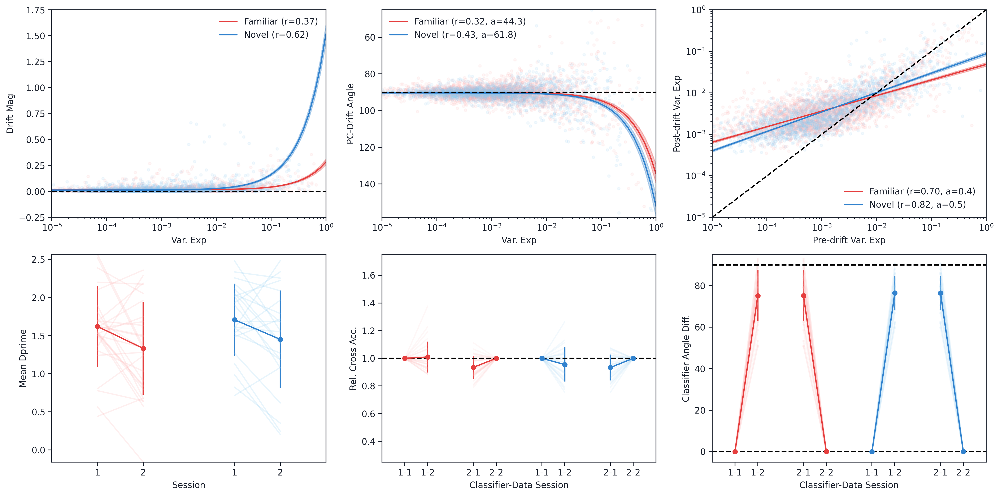

In [ ]:
import pickle
from scipy.stats import linregress

min_var_exp = 1e-5
n_se = 1.97

plot_types = ['familiar', 'novel']
plot_labels = ['Familiar', 'Novel']

fig, ax = plt.subplots(2, 3, figsize=(16,8))

session_locs = [
    [[0, 1,],
    [3, 4,]],

    [[6, 7,],
    [9, 10,]]
]

# Hit/Miss
root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_finalplot_data_'
# Old plot data (need to change )
# root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/nochange_plot_data_'
# Change/No Change
behave_root = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/behave_data_'

for type_idx in range(len(plot_types)):

    path = root_path + plot_types[type_idx] + '.pickle'
    behave_path = behave_root + plot_types[type_idx] + '.pickle'
    print('Loading from path:', path)
    drift_mags, drift_angles, var_exp1, var_exps, var_percs, var_percs_chance, cross_accs, cross_angles, rand_accs = load_plot_data(path)
    behavior_dicts, mean_dprimes = load_behave(behave_path)

    # Concatenates data pairs and filters for variance explained
    var_exps_fit = [] 
    pca_drift_mags_fit = []
    pca_drift_angles_fit = []
    pca0_var_exp1_fit = []

    n_pairs = drift_mags.shape[0]

    for pairs_idx in range(n_pairs):
        # Filters for a minimum variance explained
        var_exp_filter = var_exps[pairs_idx] > min_var_exp
            
        pca_drift_mags_fit.append(
            np.abs(drift_mags[pairs_idx, var_exp_filter]))
        # Filters AND converts to angles
        pca_drift_angles_fit.append(
            180/np.pi * np.arccos(drift_angles[pairs_idx, var_exp_filter]))
        pca0_var_exp1_fit.append(var_exp1[pairs_idx, var_exp_filter])
        var_exps_fit.append(var_exps[pairs_idx, var_exp_filter])
        
    drift_mags = np.concatenate(pca_drift_mags_fit, axis=0)
    drift_angles = np.concatenate(pca_drift_angles_fit, axis=0)
    var_exp1 = np.concatenate(pca0_var_exp1_fit, axis=0)
    var_exps = np.concatenate(var_exps_fit, axis=0)

    print('Drift magnitudes:')
    ax[0, 0].scatter(var_exps, drift_mags,
                         marker='.', color=c_vals_l[type_idx], 
                         alpha=0.1)

    reg = linregress(var_exps, drift_mags)
    print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
          reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                      (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                      (reg.intercept + n_se * reg.intercept_stderr))
    ax[0, 0].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=c_vals[type_idx], alpha=0.3)
    ax[0, 0].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
               label=plot_labels[type_idx]+' (r={:.2f})'.format(reg.rvalue))

    print('Drift angle')    
    ax[0, 1].scatter(var_exps, drift_angles,
                         marker='.', color=c_vals_l[type_idx], 
                         alpha=0.1)

    reg = linregress(var_exps, drift_angles)
    print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
          reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                      (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                      (reg.intercept + n_se * reg.intercept_stderr))
    ax[0, 1].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=c_vals[type_idx], alpha=0.3)
    ax[0, 1].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
               label=plot_labels[type_idx]+' (r={:.2f}, a={:.1f}) '.format(
                   reg.rvalue, reg.slope))

    print('Change in variance')
    ax[0, 2].scatter(var_exps, var_exp1,
                         marker='.', color=c_vals_l[type_idx], 
                         alpha=0.1)

    reg = linregress(
        np.log(var_exps), np.log(var_exp1))
    print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
          reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
    reg_plot_y = np.exp(reg.slope * np.log(reg_plot_X) + reg.intercept)
    reg_plot_min_y = np.exp((reg.slope - n_se* reg.stderr) * np.log(reg_plot_X) + 
                            (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = np.exp((reg.slope + n_se * reg.stderr) * np.log(reg_plot_X) + 
                            (reg.intercept + n_se * reg.intercept_stderr))
    ax[0, 2].fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=c_vals[type_idx], alpha=0.3)
    ax[0, 2].plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx], 
               label=plot_labels[type_idx]+' (r={:.2f}, a={:.1f}) '.format(
                   reg.rvalue, reg.slope))
    
    avg_dprimes = np.mean(np.array(mean_dprimes), axis=-1)
    std_dprimes = np.std(np.array(mean_dprimes), axis=-1)

    avg_cross_accs_rel = np.mean(cross_accs, axis=0)
    std_cross_accs_rel = np.std(cross_accs, axis=0)

    avg_cross_angles = np.mean(cross_angles, axis=0)
    std_cross_angles = np.std(cross_angles, axis=0)

    for session_idx_c in range(2): # Classifier index
        for pairs_idx in range(cross_accs.shape[0]):
            ax[1, 1].plot(session_locs[type_idx][session_idx_c], 
                    cross_accs[pairs_idx, session_idx_c],
                    alpha=0.1, color=c_vals_l[type_idx])
            ax[1, 2].plot(session_locs[type_idx][session_idx_c], 
                    cross_angles[pairs_idx, session_idx_c],
                    marker='.', alpha=0.1, color=c_vals_l[type_idx])
            if session_idx_c == 0: # Behavior plot
                ax[1, 0].plot(session_locs[0][type_idx], 
                              np.array(mean_dprimes)[:, pairs_idx],
                              alpha=0.2, color=c_vals_l[type_idx])


        ax[1, 1].errorbar(session_locs[type_idx][session_idx_c], 
                        avg_cross_accs_rel[session_idx_c],
                        yerr=std_cross_accs_rel[session_idx_c],
                        color=c_vals[type_idx],
                        capsize=5.0, marker='o')
        ax[1, 2].errorbar(session_locs[type_idx][session_idx_c], 
                        avg_cross_angles[session_idx_c],
                        yerr=std_cross_angles[session_idx_c],
                        color=c_vals[type_idx],
                        capsize=5.0, marker='o')
        if session_idx_c == 0:
            ax[1, 0].errorbar(session_locs[0][type_idx], 
                              avg_dprimes, yerr=std_dprimes,
                              color=c_vals[type_idx],
                              capsize=5.0, marker='o')

ax[0, 0].axhline(0.0, color='k', linestyle='dashed')
ax[0, 0].set_xlabel('Var. Exp')
ax[0, 0].set_ylabel('Drift Mag')
ax[0, 0].set_ylim([-0.25, 1.75])
ax[0, 0].set_xscale('log')
ax[0, 0].legend()

ax[0, 1].axhline(90.0, color='k', linestyle='dashed')
ax[0, 1].set_xlabel('Var. Exp')
ax[0, 1].set_ylabel('PC-Drift Angle')
ax[0, 1].set_xscale('log')
ax[0, 1].invert_yaxis()
ax[0, 1].legend()

ax[0, 2].plot(reg_plot_X, reg_plot_X, color='k', linestyle='dashed')
ax[0, 2].set_xlabel('Pre-drift Var. Exp')
ax[0, 2].set_ylabel('Post-drift Var. Exp')
ax[0, 2].set_xlim([min_var_exp, 1.0])
ax[0, 2].set_ylim([min_var_exp, 1.0])
ax[0, 2].set_xscale('log')
ax[0, 2].set_yscale('log')
ax[0, 2].legend()

ax[1, 0].set_xlim([-1, 5])
# ax[1, 0].set_ylim([0.25, 1.75])
ax[1, 0].set_ylabel('Mean Dprime')
ax[1, 0].set_xticks([0, 1, 3, 4])
ax[1, 0].set_xticklabels(['1', '2', '1', '2',])
ax[1, 0].set_xlabel('Session')

ax[1, 1].set_xlim([-1, 11])
ax[1, 1].set_ylim([0.25, 1.75])
ax[1, 1].axhline(1.0, color='k', linestyle='dashed')
ax[1, 1].set_ylabel('Rel. Cross Acc.')

ax[1, 2].set_xlim([-1, 11])
ax[1, 2].set_ylim([-5, 95])
ax[1, 2].axhline(0.0, color='k', linestyle='dashed')
ax[1, 2].axhline(90.0, color='k', linestyle='dashed')
ax[1, 2].set_ylabel('Classifier Angle Diff.')


for ax_it in (ax[1, 1], ax[1, 2]):
    ax_it.set_xticks([0, 1, 3, 4, 6, 7, 9, 10])
    ax_it.set_xticklabels(['1-1', '1-2', '2-1', '2-2',
                           '1-1', '1-2', '2-1', '2-2',
                           ])
    ax_it.set_xlabel('Classifier-Data Session')

Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_rebuttal_data_familiar.pickle
  Slope: 1.08 (se: 0.03), r: 0.59 p: 1.88e-240
  Slope: 44.32 (se: 2.54), r: 0.32 p: 1.63e-64
  Slope: 0.38 (se: 0.01), r: 0.70 p: 0.00e+00
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_rebuttal_data_novel.pickle
  Slope: 1.18 (se: 0.04), r: 0.60 p: 8.03e-187
  Slope: 61.79 (se: 2.94), r: 0.43 p: 2.88e-88
  Slope: 0.47 (se: 0.01), r: 0.82 p: 0.00e+00


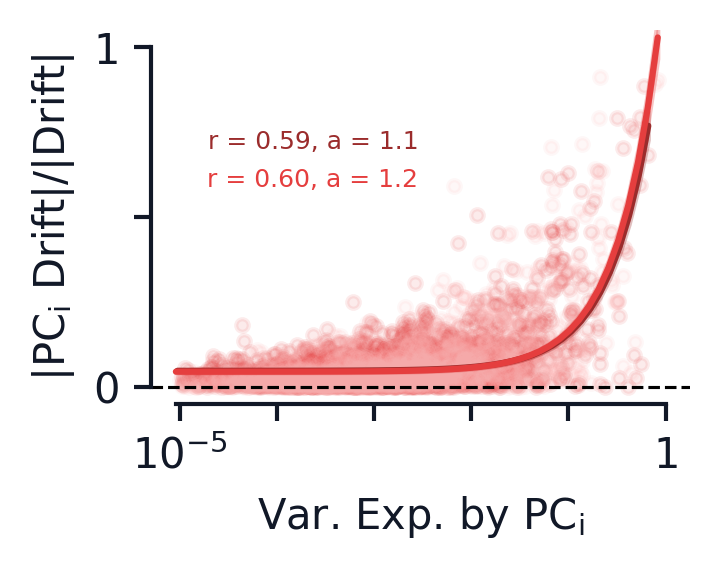

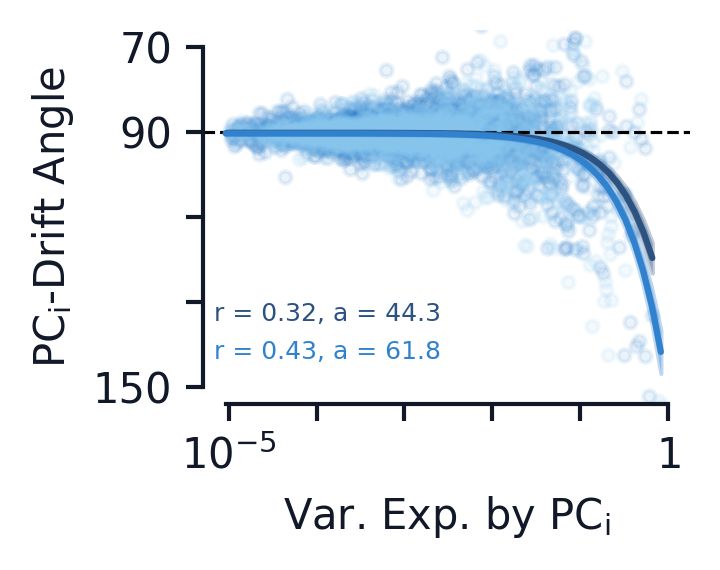

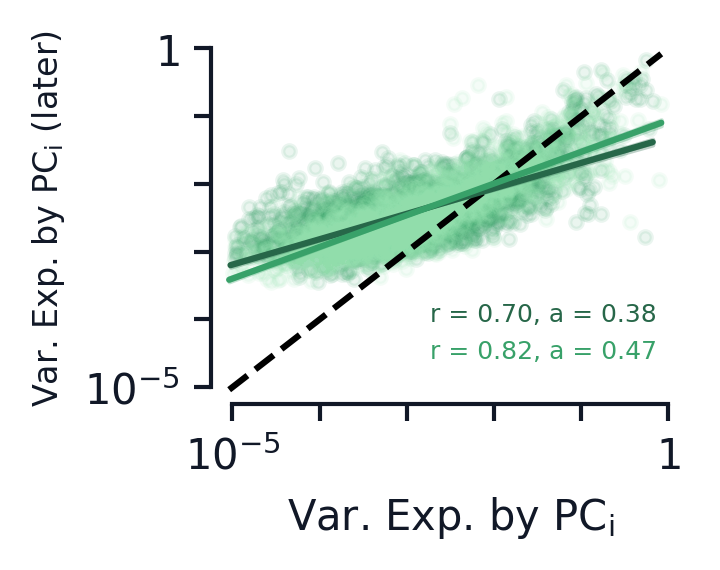

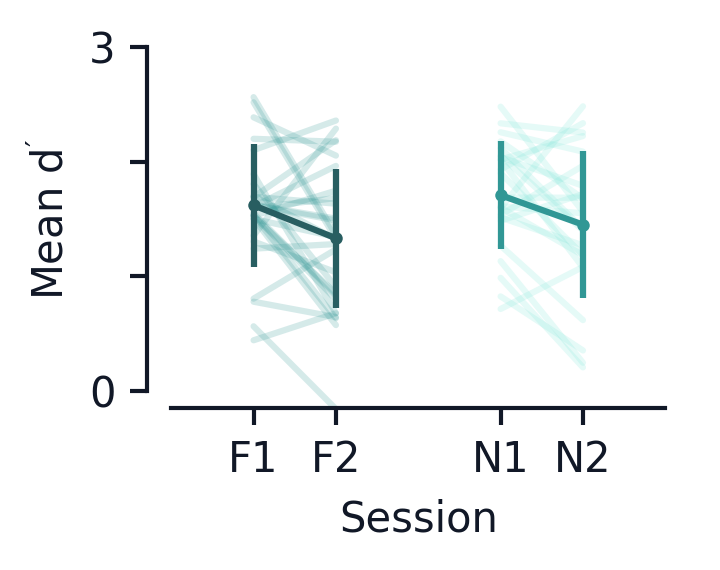

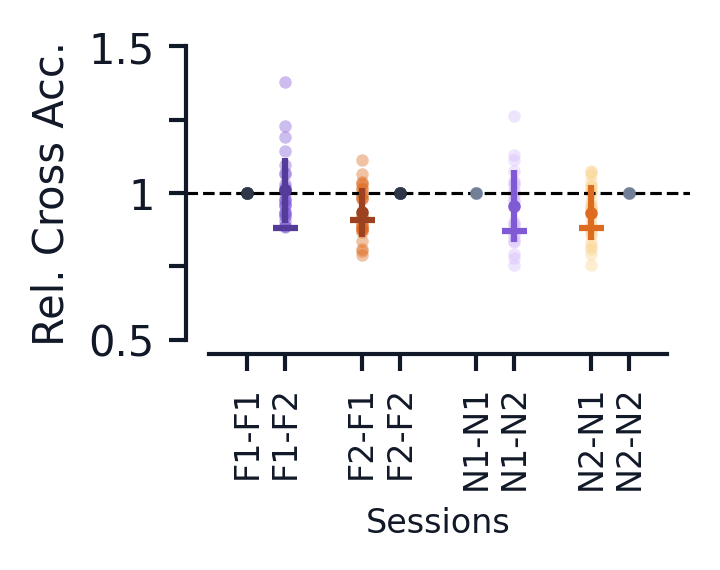

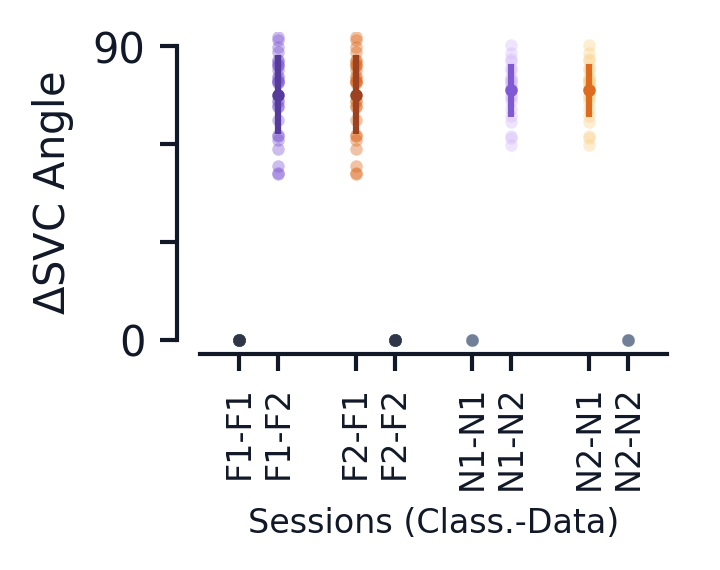

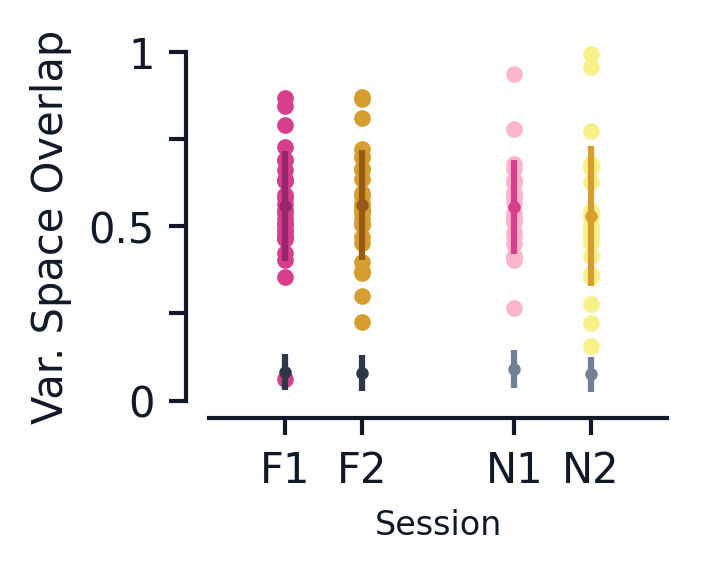

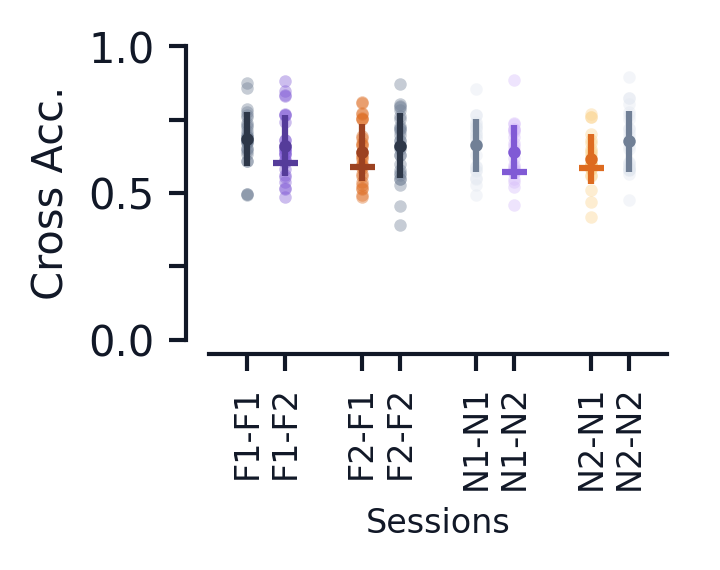

In [11]:
import pickle
from scipy.stats import linregress

min_var_exp = 1e-5
n_se = 1.97

plot_types = ['familiar', 'novel']
plot_labels = ['Familiar', 'Novel']

session_locs = [
    [[0, 1,],
    [3, 4,]],

    [[6, 7,],
    [9, 10,]]
]

session_colors = [
    [6, 3],
    [4, 6]
]

#### Hit/Miss ####
# root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/nochange_plot_data_'
# root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_finalplot_data_' # For paper
# rebuttal = False

root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_rebuttal_data_' # For rebuttal
rebuttal = True

#### Change/No Change ####
# root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/nochange_plot_data_'

behave_root = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/behave_data_'

# Variance explained plots
fig, ax = plt.subplots(1, 1, figsize=(2.5,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2.5,2))
fig4, ax4 = plt.subplots(1, 1, figsize=(2.5,2))
# fig5, ax5 = plt.subplots(1, 1, figsize=(2.5,2))
# Performance/SVC plots
fig0, ax0 = plt.subplots(1, 1, figsize=(2.5,2))
fig1, ax1 = plt.subplots(1, 1, figsize=(2.5,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2.5,2))
fig6, ax6 = plt.subplots(1, 1, figsize=(2.5,2))
fig7, ax7 = plt.subplots(1, 1, figsize=(2.5,2))

for type_idx in range(len(plot_types)):
    color_idx = 0 
    plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
    plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]

    path = root_path + plot_types[type_idx] + '.pickle'
    behave_path = behave_root + plot_types[type_idx] + '.pickle'
    print('Loading from path:', path)
    if rebuttal:
        (drift_mags, drift_angles, var_exp1, var_exps, var_percs, var_percs_chance, 
         cross_accs, cross_angles, rand_accs, cross_accs_raw, 
         mean_chance_accs_raw) = load_plot_data(path, rebuttal=rebuttal)
    else:
        drift_mags, drift_angles, var_exp1, var_exps, var_percs, var_percs_chance, cross_accs, cross_angles, rand_accs = load_plot_data(path)
    # drift_mags, drift_angles, var_exp1, var_exps, pca_means, cross_accs, cross_angles = load_plot_data(path)
    behavior_dicts, mean_dprimes = load_behave(behave_path)

    # Concatenates data pairs and filters for variance explained
    var_exps_fit = [] 
    pca_drift_mags_fit = []
    pca_drift_angles_fit = []
    pca0_var_exp1_fit = []

    # pca_means_fit = []

    n_pairs = drift_mags.shape[0]

    for pairs_idx in range(n_pairs):
        # Filters for a minimum variance explained
        var_exp_filter = var_exps[pairs_idx] > min_var_exp
            
        pca_drift_mags_fit.append(
            np.abs(drift_mags[pairs_idx, var_exp_filter]))
        # Filters AND converts to angles
        pca_drift_angles_fit.append(
            180/np.pi * np.arccos(drift_angles[pairs_idx, var_exp_filter]))
        pca0_var_exp1_fit.append(var_exp1[pairs_idx, var_exp_filter])
        # pca_means_fit.append(pca_means[pairs_idx, var_exp_filter])
        var_exps_fit.append(var_exps[pairs_idx, var_exp_filter])

        
    drift_mags = np.concatenate(pca_drift_mags_fit, axis=0)
    drift_angles = np.concatenate(pca_drift_angles_fit, axis=0)
    var_exp1 = np.concatenate(pca0_var_exp1_fit, axis=0)
    var_exps = np.concatenate(var_exps_fit, axis=0)
    # pca_means = np.concatenate(pca_means_fit, axis=0)

    ##### Drift mag plots #######
    ax.scatter(var_exps, drift_mags,
                         marker='.', color=plot_color, 
                         alpha=0.1, zorder=-5)

    reg = linregress(var_exps, drift_mags)
    print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
          reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(0.9*np.min(var_exps)), 
                             np.log10(1.0*np.max(var_exps)), 
                             num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                      (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                      (reg.intercept + n_se * reg.intercept_stderr))
    ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=plot_color_d, alpha=0.3, zorder=0)
    ax.plot(reg_plot_X, reg_plot_y, color=plot_color_d, 
               label=plot_labels[type_idx]+' (r={:.2f})'.format(reg.rvalue),
            zorder=5)
    ax.text(0.3, 0.7-type_idx*0.1, 'r = {:.2f}, a = {:.1f}'.format(reg.rvalue, reg.slope), 
            horizontalalignment='center', verticalalignment='center', 
            color=plot_color_d, fontsize=6, transform=ax.transAxes)


    ##### Drift angle plots #######
    color_idx = 1
    plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
    plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]
 
    ax3.scatter(var_exps, drift_angles,
                         marker='.', color=plot_color, 
                         alpha=0.1, zorder=-5)

    reg = linregress(var_exps, drift_angles)
    print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
          reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(0.9*np.min(var_exps)), 
                             np.log10(1.0*np.max(var_exps)), 
                             num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                      (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                      (reg.intercept + n_se * reg.intercept_stderr))
    ax3.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=plot_color_d, alpha=0.3, zorder=0)
    ax3.plot(reg_plot_X, reg_plot_y, color=plot_color_d, 
               label=plot_labels[type_idx]+' (r={:.2f}, a={:.1f}) '.format(
                   reg.rvalue, reg.slope), zorder=5)
    ax3.text(0.3, 0.2-type_idx*0.1, 'r = {:.2f}, a = {:.1f}'.format(reg.rvalue, reg.slope), 
           horizontalalignment='center', verticalalignment='center', 
           color=plot_color_d, fontsize=6, transform=ax.transAxes)
                    

    ##### Change in variance plots #######
    color_idx = 2
    plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
    plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]

    ax4.scatter(var_exps, var_exp1,
                         marker='.', color=plot_color, 
                         alpha=0.1, zorder=-5)

    reg = linregress(
        np.log(var_exps), np.log(var_exp1))
    print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
          reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    reg_plot_X = np.logspace(np.log10(0.9*np.min(var_exps)), 
                             np.log10(1.0*np.max(var_exps)), 
                             num=50)
    reg_plot_y = np.exp(reg.slope * np.log(reg_plot_X) + reg.intercept)
    reg_plot_min_y = np.exp((reg.slope - n_se* reg.stderr) * np.log(reg_plot_X) + 
                            (reg.intercept - n_se * reg.intercept_stderr))
    reg_plot_max_y = np.exp((reg.slope + n_se * reg.stderr) * np.log(reg_plot_X) + 
                            (reg.intercept + n_se * reg.intercept_stderr))
    ax4.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                       color=plot_color_d, alpha=0.3, zorder=0)
    ax4.plot(reg_plot_X, reg_plot_y, color=plot_color_d, 
               label=plot_labels[type_idx]+' (r={:.2f}, a={:.1f}) '.format(
                   reg.rvalue, reg.slope), zorder=5)
    
    ax4.text(0.7, 0.2-type_idx*0.1, 'r = {:.2f}, a = {:.2f}'.format(reg.rvalue, reg.slope), 
           horizontalalignment='center', verticalalignment='center', 
           color=plot_color_d, fontsize=6, transform=ax.transAxes)

    ##### PCA means plot #######
    # color_idx = 3
    # plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
    # plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]

    # ax5.scatter(var_exps, pca_means,
    #                      marker='.', color=plot_color, 
    #                      alpha=0.1, zorder=-5)

    # reg = linregress(
    #     np.log(var_exps), np.log(pca_means))
    # print('  Slope: {:.2f} (se: {:.2f}), r: {:.2f} p: {:.2e}'.format(
    #       reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    # reg_plot_X = np.logspace(np.log10(0.9*np.min(var_exps)), 
    #                          np.log10(1.0*np.max(var_exps)), 
    #                          num=50)
    # reg_plot_y = np.exp(reg.slope * np.log(reg_plot_X) + reg.intercept)
    # reg_plot_min_y = np.exp((reg.slope - n_se* reg.stderr) * np.log(reg_plot_X) + 
    #                         (reg.intercept - n_se * reg.intercept_stderr))
    # reg_plot_max_y = np.exp((reg.slope + n_se * reg.stderr) * np.log(reg_plot_X) + 
    #                         (reg.intercept + n_se * reg.intercept_stderr))
    # ax5.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
    #                    color=plot_color_d, alpha=0.3, zorder=0)
    # ax5.plot(reg_plot_X, reg_plot_y, color=plot_color_d, 
    #            label=plot_labels[type_idx]+' (r={:.2f}, a={:.1f}) '.format(
    #                reg.rvalue, reg.slope), zorder=5)
    
    # ax5.text(0.7, 0.2-type_idx*0.1, 'r = {:.2f}, a = {:.2f}'.format(reg.rvalue, reg.slope), 
    #        horizontalalignment='center', verticalalignment='center', 
    #        color=plot_color_d, fontsize=6, transform=ax5.transAxes)
    
    ##### Behave/SVC plots #######

    avg_dprimes = np.mean(np.array(mean_dprimes), axis=-1)
    std_dprimes = np.std(np.array(mean_dprimes), axis=-1)

    avg_cross_accs_rel = np.mean(cross_accs, axis=0)
    std_cross_accs_rel = np.std(cross_accs, axis=0)

    avg_cross_angles = np.mean(cross_angles, axis=0)
    std_cross_angles = np.std(cross_angles, axis=0)

    for session_idx_c in range(2): # Classifier index
        for session_idx_d in range(2): # Classifier index
            color_idx = session_colors[session_idx_c][session_idx_d]
            plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
            plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]

            for pairs_idx in range(cross_accs.shape[0]):
                ax1.plot(session_locs[type_idx][session_idx_c][session_idx_d], 
                        cross_accs[pairs_idx, session_idx_c, session_idx_d],
                        marker='.', alpha=0.4, color=plot_color, zorder=-5)
                ax2.plot(session_locs[type_idx][session_idx_c][session_idx_d], 
                        cross_angles[pairs_idx, session_idx_c, session_idx_d],
                        marker='.', alpha=0.4, color=plot_color,
                        zorder=-5)
                if session_idx_c == 0  and session_idx_d == 0: # Behavior plot
                    behave_color = c_vals[5] if type_idx == 0 else c_vals_l[5]
                    ax0.plot(session_locs[0][type_idx], 
                                np.array(mean_dprimes)[:, pairs_idx],
                                alpha=0.2, color=behave_color,
                            zorder=-5)


            ax1.errorbar(session_locs[type_idx][session_idx_c][session_idx_d], 
                            avg_cross_accs_rel[session_idx_c, session_idx_d],
                            yerr=std_cross_accs_rel[session_idx_c, session_idx_d],
                            color=plot_color_d,
                            capsize=5.0, marker='.', zorder=5)
            ax2.errorbar(session_locs[type_idx][session_idx_c][session_idx_d], 
                            avg_cross_angles[session_idx_c, session_idx_d],
                            yerr=std_cross_angles[session_idx_c, session_idx_d],
                            color=plot_color_d,
                            capsize=5.0, marker='.', zorder=5)
            if session_idx_c == 0 and session_idx_d == 0:
                behave_color = c_vals_d[5] if type_idx == 0 else c_vals[5]
                ax0.errorbar(session_locs[0][type_idx], 
                                avg_dprimes, yerr=std_dprimes,
                                color=behave_color,
                                capsize=5.0, marker='.',
                            zorder=5)
            if session_idx_c != session_idx_d: # Chance accuracies
                ax1.scatter(session_locs[type_idx][session_idx_c][session_idx_d],
                           rand_accs[session_idx_c], color=plot_color_d,
                           marker='_', zorder=5)

    ##### Raw Accs Plot #######
    if rebuttal:
        avg_cross_accs = np.mean(cross_accs_raw, axis=0)
        std_cross_accs = np.std(cross_accs_raw, axis=0)

        for session_idx_c in range(2): # Classifier index
            for session_idx_d in range(2): # Classifier index
                color_idx = session_colors[session_idx_c][session_idx_d]
                plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
                plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]

                for pairs_idx in range(cross_accs_raw.shape[0]):
                    ax7.plot(session_locs[type_idx][session_idx_c][session_idx_d], 
                            cross_accs_raw[pairs_idx, session_idx_c, session_idx_d],
                            marker='.', alpha=0.4, color=plot_color, zorder=-5)


                ax7.errorbar(session_locs[type_idx][session_idx_c][session_idx_d], 
                                avg_cross_accs[session_idx_c, session_idx_d],
                                yerr=std_cross_accs[session_idx_c, session_idx_d],
                                color=plot_color_d,
                                capsize=5.0, marker='.', zorder=5)
                
                if session_idx_c != session_idx_d: # Chance accuracies
                    ax7.scatter(session_locs[type_idx][session_idx_c][session_idx_d],
                            mean_chance_accs_raw[session_idx_c], color=plot_color_d,
                            marker='_', zorder=5)
        
        ax7.set_xlim([-1, 11])
        ax7.set_ylim([0.0, 1.0])
        ax7.set_yticks([0.0, 0.25, 0.5, 0.75, 1.0])
        ax7.set_yticklabels([0.0, None, 0.5, None, 1.0])
        # ax7.axhline(1.0, color='k', linestyle='dashed', linewidth=0.75)
        ax7.set_ylabel('Cross Acc.')
        ax7.set_xlabel('Sessions', fontsize=8)
    ##### Var space overlap plot #####

    plot_locs = [
        [0, 1],
        [3, 4]
    ]

    var_percs = var_percs[:, :, 0] # Last index is identical with new def, so just take first one
    avg_var_overlap = np.mean(var_percs, axis=0)
    std_var_overlap = np.std(var_percs, axis=0)
    avg_var_overlap_chance = np.mean(var_percs_chance[:, :, 0], axis=0)
    std_var_overlap_chance = np.std(var_percs_chance[:, :, 0], axis=0)

    for session_idx in range(2):
        plot_color = c_vals[session_idx+7] if type_idx == 0 else c_vals_l[session_idx+7]
        plot_color_d = c_vals_d[session_idx+7] if type_idx == 0 else c_vals[session_idx+7]
        plot_color_chance = c_vals_d[6] if type_idx == 0 else c_vals[6]

        n_samples = var_percs.shape[0]
        ax6.scatter(plot_locs[type_idx][session_idx]*np.ones((n_samples,)),
                    var_percs[:, session_idx],
                    marker='.', color=plot_color)
        ax6.errorbar(plot_locs[type_idx][session_idx],
                     avg_var_overlap[session_idx],
                     yerr = std_var_overlap[session_idx],
                     color=plot_color_d,
                     capsize=5.0, marker='.', zorder=5)
        ax6.errorbar(plot_locs[type_idx][session_idx],
                     avg_var_overlap_chance[session_idx],
                     yerr = std_var_overlap_chance[session_idx],
                     color=plot_color_chance, capsize=5.0,
                     marker='.', zorder=5)




ax.axhline(0.0, color='k', linestyle='dashed', linewidth=0.75)
ax.set_xlabel('Var. Exp. by PC$_i$')
ax.set_ylabel('|PC$_i$ Drift|/|Drift|')
ax.set_ylim([0, 1])
ax.set_xscale('log')
ax.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
ax.set_xticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
ax.set_yticks([0, 0.5, 1,])
ax.set_yticklabels([0, None, 1,])
jetplot.breathe(ax=ax)

ax3.axhline(90.0, color='k', linestyle='dashed', linewidth=0.75)
ax3.set_xlabel('Var. Exp. by PC$_i$')
ax3.set_ylabel('PC$_i$-Drift Angle')
ax3.set_xscale('log')
ax3.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
ax3.set_xticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
ax3.set_ylim([70, 150])
ax3.set_yticks([70, 90, 110, 130, 150])
ax3.set_yticklabels([70, 90, None, None, 150])
ax3.invert_yaxis()
jetplot.breathe(ax=ax3)

ax4.plot(reg_plot_X, reg_plot_X, color='k', linestyle='dashed')
ax4.set_xlabel('Var. Exp. by PC$_i$')
ax4.set_ylabel('Var. Exp. by PC$_i$ (later)', fontsize=8)
ax4.set_xlim([min_var_exp, 1.0])
ax4.set_ylim([min_var_exp, 1.0])
ax4.set_xscale('log')
ax4.set_yscale('log')
ax4.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
ax4.set_xticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
ax4.set_yticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
ax4.set_yticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
jetplot.breathe(ax=ax4)

# ax5.set_xlabel('Var. Exp.')
# ax5.set_ylabel('Mean value')
# ax4.set_xlim([min_var_exp, 1.0])
# ax5.set_ylim([min_var_exp, 1.0])
# ax5.set_xscale('log')
# ax5.set_yscale('log')
# ax5.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
# ax5.set_xticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
# ax5.set_yticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
# ax5.set_yticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
# jetplot.breathe(ax=ax5)

ax0.set_xlim([-1, 5])
ax0.set_ylim([0, 3])
ax0.set_yticks([0, 1, 2, 3])
ax0.set_yticklabels([0, None, None, 3])
ax0.set_ylabel('Mean $d^\prime$')
ax0.set_xticks([0, 1, 3, 4])
ax0.set_xticklabels(['F1', 'F2', 'N1', 'N2',])
ax0.set_xlabel('Session')

ax1.set_xlim([-1, 11])
ax1.set_ylim([0.5, 1.5])
ax1.set_yticks([0.5, 0.75, 1, 1.25, 1.5])
ax1.set_yticklabels([0.5, None, 1, None, 1.5])
ax1.axhline(1.0, color='k', linestyle='dashed', linewidth=0.75)
ax1.set_ylabel('Rel. Cross Acc.')
ax1.set_xlabel('Sessions', fontsize=8)

ax2.set_xlim([-1, 11])
ax2.set_ylim([0, 90])
ax2.set_yticks([0, 30, 60, 90])
ax2.set_yticklabels([0, None, None, 90])
# ax2.axhline(0.0, color='k', linestyle='dashed')
# ax2.axhline(90.0, color='k', linestyle='dashed')
ax2.set_ylabel('$\Delta$SVC Angle')
ax2.set_xlabel('Sessions (Class.-Data)', fontsize=8)


for ax_it in (ax1, ax2, ax7):
    ax_it.set_xticks([0, 1, 3, 4, 6, 7, 9, 10])
    ax_it.xaxis.set_tick_params(rotation=90)
    ax_it.set_xticklabels(['F1-F1', 'F1-F2', 'F2-F1', 'F2-F2', 
                           'N1-N1', 'N1-N2', 'N2-N1', 'N2-N2'], fontsize=8)
    
ax6.set_xlim([-1, 5])
ax6.set_xticks([0, 1, 3, 4])
ax6.set_xticklabels(['F1', 'F2', 'N1', 'N2'])
ax6.set_ylim([0, 1])
ax6.set_yticks([0, 0.25, 0.5, 0.75, 1])
ax6.set_yticklabels([0, None, 0.5, None, 1])
ax6.set_ylabel('Var. Space Overlap')
ax6.set_xlabel('Session', fontsize=8)

jetplot.breathe(ax=ax0)
jetplot.breathe(ax=ax1)
jetplot.breathe(ax=ax2)
jetplot.breathe(ax=ax6)
jetplot.breathe(ax=ax7)

In [14]:
print('Mean cross angle: {:.1f}'.format(np.mean((np.mean(cross_angles[:, 0, 1]), np.mean(cross_angles[:, 1, 0])))))

Mean cross angle: 76.5


Plot of number of shared cells and trial count

Shared Cells val: 118 (quartile 76 - 192)
F1 Hits val: 121 (quartile 95 - 135)
F2 Hits val: 99 (quartile 73 - 137)
F1 Misses val: 32 (quartile 26 - 34)
F2 Misses val: 32 (quartile 20 - 41)
F1 Change val: 148 (quartile 125 - 166)
F2 Change val: 141 (quartile 104 - 160)
F1 No Change val: 297 (quartile 232 - 324)
F2 No Change val: 268 (quartile 212 - 342)


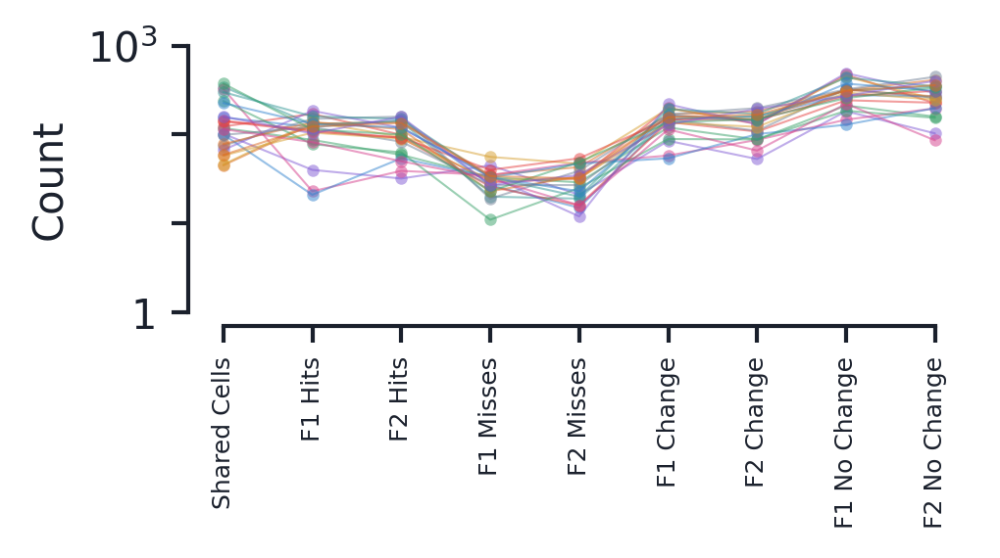

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(3.5,2))

plot_vec = np.zeros((n_pairs, 9))

for pairs_idx in range(n_pairs):
    plot_vec[pairs_idx] = (
        n_shared_experiments[pairs_idx],
        hit_miss_count_experiments[pairs_idx, 0, 0],
        hit_miss_count_experiments[pairs_idx, 1, 0],
        hit_miss_count_experiments[pairs_idx, 0, 1],
        hit_miss_count_experiments[pairs_idx, 1, 1],
        change_nochange_count_experiments[pairs_idx, 0, 0],
        change_nochange_count_experiments[pairs_idx, 1, 0],
        change_nochange_count_experiments[pairs_idx, 0, 1],
        change_nochange_count_experiments[pairs_idx, 1, 1],
    )
    ax.plot(np.arange(9), plot_vec[pairs_idx], marker='.', alpha=0.5, linewidth=0.5, color=c_vals[pairs_idx % 9])

labels = ['Shared Cells', 'F1 Hits', 'F2 Hits', 
                     'F1 Misses', 'F2 Misses', 
                     'F1 Change', 'F2 Change', 
                     'F1 No Change', 'F2 No Change',]

for idx in range(9):
    # print('{} val: {:.0f} (std {:.0f})'.format(
    #     labels[idx],
    #     plot_vec[:, idx].mean(), plot_vec[:, idx].std(),))
    print('{} val: {:.0f} (quartile {:.0f} - {:.0f})'.format(
        labels[idx],
        np.median(plot_vec[:, idx]), np.percentile(plot_vec[:, idx], 25),
        np.percentile(plot_vec[:, idx], 75)))

ax.set_xlim([0, 8])
ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax.set_xticklabels(['Shared Cells', 'F1 Hits', 'F2 Hits', 
                     'F1 Misses', 'F2 Misses', 
                     'F1 Change', 'F2 Change', 
                     'F1 No Change', 'F2 No Change',], fontsize=6)
# ax.set_xticklabels(['Shared Cells', 'N1 Hits', 'N2 Hits', 
#                      'N1 Misses', 'N2 Misses', 
#                      'N1 Change', 'N2 Change', 
#                      'N1 No Change', 'N2 No Change',], fontsize=6)
ax.xaxis.set_tick_params(rotation=90)
ax.set_ylabel('Count')
ax.set_ylim([1, 1000])
ax.set_yscale('log')
ax.set_yticks([1, 10, 100, 1000])
ax.set_yticklabels([1, None, None, '$10^3$'])

jetplot.breathe(ax=ax)

Plots by PC dimension

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


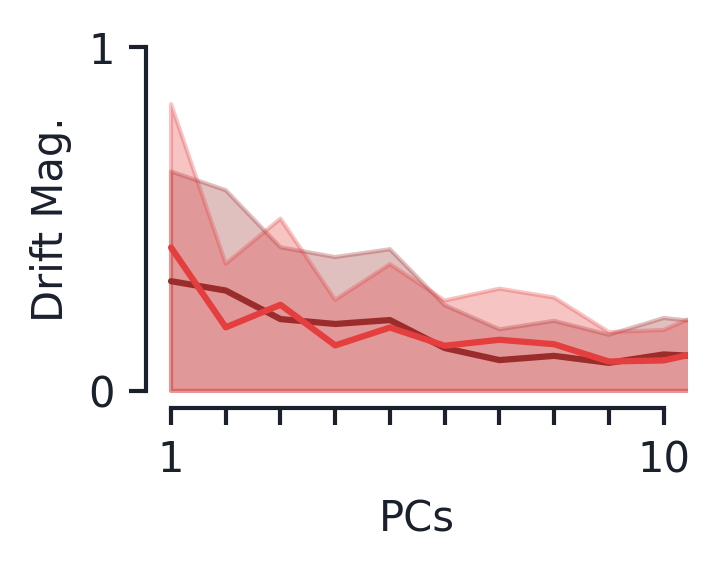

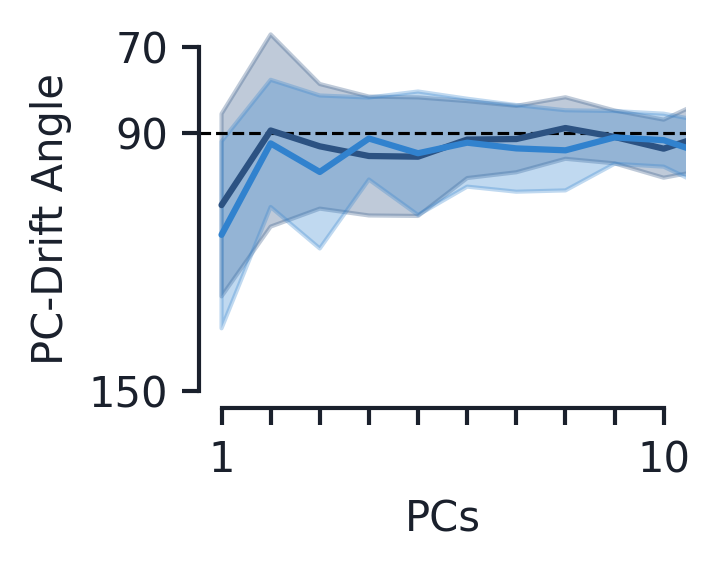

In [ ]:
import pickle
from scipy.stats import linregress

min_var_exp = 1e-5
n_se = 1.97

plot_types = ['familiar', 'novel']
plot_labels = ['Familiar', 'Novel']

session_locs = [
    [[0, 1,],
    [3, 4,]],

    [[6, 7,],
    [9, 10,]]
]

n_pc_plot = 20

# Hit/Miss
root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/hit_finalplot_data_'

# Change/No Change
# root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/nochange_plot_data_'
behave_root = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/behave_data_'

# Variance explained plots
fig, ax = plt.subplots(1, 1, figsize=(2.5,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2.5,2))

for type_idx in range(len(plot_types)):
    color_idx = 0 
    plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
    plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]

    path = root_path + plot_types[type_idx] + '.pickle'
    behave_path = behave_root + plot_types[type_idx] + '.pickle'
    drift_mags, drift_angles, var_exp1, var_exps, var_percs, var_percs_chance, cross_accs, cross_angles, rand_accs = load_plot_data(path)
    behavior_dicts, mean_dprimes = load_behave(behave_path)
    
    pcs_plot = np.arange(1, n_pc_plot+1)

    ##### Drift mag plots #######

    avg_drift_mag = np.nanmean(np.abs(drift_mags), axis=0)[:n_pc_plot]
    std_drift_mag = np.nanmean(np.abs(drift_mags), axis=0)[:n_pc_plot]

    # ax.scatter(pcs_plot, drift_mags,
    #                      marker='.', color=plot_color, 
    #                      alpha=0.01, zorder=-5)

    ax.fill_between(pcs_plot, avg_drift_mag-std_drift_mag, 
                    avg_drift_mag+std_drift_mag, 
                       color=plot_color_d, alpha=0.3, zorder=0)
    ax.plot(pcs_plot, avg_drift_mag, color=plot_color_d, 
            label=plot_labels[type_idx]+' (r={:.2f})'.format(reg.rvalue),
            zorder=5)

    ##### Drift angle plots #######

    drift_angles = 180/np.pi * np.arccos(drift_angles)

    color_idx = 1
    plot_color = c_vals[color_idx] if type_idx == 0 else c_vals_l[color_idx]
    plot_color_d = c_vals_d[color_idx] if type_idx == 0 else c_vals[color_idx]
 
    avg_drift_angle = np.nanmean(drift_angles, axis=0)[:n_pc_plot]
    std_drift_angle = np.nanstd(drift_angles, axis=0)[:n_pc_plot]
    
    # ax3.scatter(var_exps, drift_angles,
    #                      marker='.', color=plot_color, 
    #                      alpha=0.01, zorder=-5)

    ax3.fill_between(pcs_plot, avg_drift_angle-std_drift_angle,
                     avg_drift_angle+std_drift_angle, 
                     color=plot_color_d, alpha=0.3, zorder=0)
    ax3.plot(pcs_plot, avg_drift_angle, color=plot_color_d, 
               label=plot_labels[type_idx]+' (r={:.2f}, a={:.1f}) '.format(
                   reg.rvalue, reg.slope), zorder=5)

# ax.axhline(0.0, color='k', linestyle='dashed', linewidth=0.75)
ax.set_xlabel('PCs')
ax.set_ylabel('Drift Mag.')
ax.set_ylim([0, 1])
ax.set_xlim([1, 10])
ax.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax.set_xticklabels([1, None, None, None, None, None, None, None, None, 10])
ax.set_yticks([0, 1])
jetplot.breathe(ax=ax)

ax3.axhline(90.0, color='k', linestyle='dashed', linewidth=0.75)
ax3.set_xlabel('PCs')
ax3.set_ylabel('PC-Drift Angle')
ax3.set_xlim([1, 10])
ax3.set_xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
ax3.set_xticklabels([1, None, None, None, None, None, None, None, None, 10])
ax3.set_ylim([70, 150])
ax3.set_yticks([70, 90, 150])
ax3.invert_yaxis()
jetplot.breathe(ax=ax3)

###### Behavior Analysis

In [ ]:
behavior_session_dict = {}
for behavior_id in behavior_ids:
    behavior_session_dict[behavior_id] = cache.get_behavior_session(behavior_id)

behavior_ophys_experiment_806456687.nwb: 100%|██████████| 1.30G/1.30G [01:08<00:00, 18.8MMB/s]
behavior_ophys_experiment_807752719.nwb: 100%|██████████| 1.18G/1.18G [00:58<00:00, 20.3MMB/s]
behavior_ophys_experiment_806455766.nwb: 100%|██████████| 1.51G/1.51G [01:17<00:00, 19.4MMB/s]
behavior_ophys_experiment_807753334.nwb: 100%|██████████| 1.56G/1.56G [01:16<00:00, 20.3MMB/s]
behavior_ophys_experiment_822647135.nwb: 100%|██████████| 1.40G/1.40G [01:08<00:00, 20.5MMB/s]
behavior_ophys_experiment_825130141.nwb: 100%|██████████| 812M/812M [00:38<00:00, 20.8MMB/s]
behavior_ophys_experiment_830700781.nwb: 100%|██████████| 915M/915M [00:42<00:00, 21.3MMB/s]
behavior_ophys_experiment_833629926.nwb: 100%|██████████| 942M/942M [00:45<00:00, 20.8MMB/s]
behavior_ophys_experiment_848692970.nwb: 100%|██████████| 1.15G/1.15G [00:57<00:00, 20.0MMB/s]
behavior_ophys_experiment_850489605.nwb: 100%|██████████| 1.40G/1.40G [01:14<00:00, 18.6MMB/s]
behavior_ophys_experiment_842975542.nwb: 100%|██████████

In [ ]:
behavior_dicts = []
mean_dprimes = [[], []]
for behavior_idx, behavior_id in enumerate(behavior_ids):
    behavior_dicts.append(behavior_session_dict[behavior_id].get_performance_metrics()) 
    mean_dprime = behavior_dicts[behavior_idx]['mean_dprime_engaged']
    if behavior_idx % 2 == 0:
        mean_dprimes[0].append(mean_dprime)
    else:
        mean_dprimes[1].append(mean_dprime)

In [ ]:
import pickle

def save_behave(path):

    save_the_file = True

    if os.path.exists(path):
        print('File already exists at:', path)
        override = input('Override? (Y/N):')
        if override == 'Y':
            save_the_file = True
        else:
            save_the_file = False

    if save_the_file:
        with open(path, 'wb') as save_file:
            # Variance explained plots
            pickle.dump(behavior_dicts, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(mean_dprimes, save_file, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        print('Data Not Saved')

In [ ]:
path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/behave_data_familiar.pickle'
save_behave(path)

File already exists at: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/behave_data_familiar.pickle
Override? (Y/N):Y


###### Analyze the multi-plane data

This code is specifically used for analyzing multi-plane data, where measurements come from different portions of the brain


----- Pair idxs: [0, 1] -----
Shared IDs: 265/1149
----- Pair idxs: [2, 3] -----
Shared IDs: 194/511
----- Pair idxs: [4, 5] -----
Shared IDs: 407/1057
----- Pair idxs: [6, 7] -----
Shared IDs: 133/832
----- Pair idxs: [8, 9] -----
Shared IDs: 656/1447
----- Pair idxs: [10, 11] -----
Shared IDs: 533/1347
----- Pair idxs: [12, 13] -----
Shared IDs: 386/811
----- Pair idxs: [14, 15] -----
Shared IDs: 351/839
[[  0.   0. 100. 165.]
 [ 59.  14.  45.  76.]
 [139.  33. 109. 126.]
 [ 26.  20.  33.  54.]
 [134. 108. 198. 216.]
 [  0.   0. 156. 377.]
 [ 74. 102.  85. 125.]
 [119.  11. 121. 100.]]


Text(0, 0.5, 'Shared cell count')

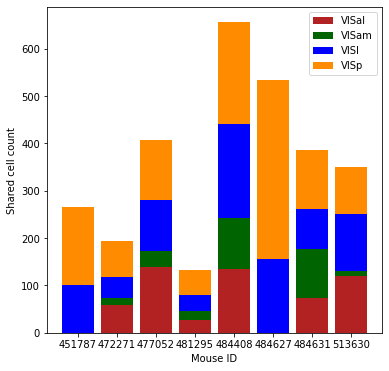

In [ ]:
# Gets count of number of shared cells for each structure
unique_structures = np.sort(list(experiment_table.loc[experiment_ids]['targeted_structure'].unique()))

shared_cells_count = np.zeros((len(mouse_ids), len(unique_structures),))

session_structures = list(experiment_table.loc[experiment_ids]['targeted_structure'])

for pairs_idx, mouse_id in enumerate(mouse_ids):
    mouse_details = mice_experiments_details[mouse_id]
    # Gets IDs for first of the session types (# of cells should be same for all sessions b/c using shared)
    # mouse_experiment_ids = mice_experiments[mouse_id][session_types[0]]
    # Structures labels for the given mouse's multi-plane images
    
    ed_idxs = [2*pairs_idx, 2*pairs_idx+1]
    print('----- Pair idxs:', ed_idxs, '-----')
    cell_ids_pair = [cell_ids_experiment[ed_idxs[0]], cell_ids_experiment[ed_idxs[1]]]
    unique_cell_ids_pair = get_unique_cell_ids(cell_ids_pair)
    shared_cell_idxs_pair = get_shared_cell_idxs(unique_cell_ids_pair)

    for _, shared_idx in enumerate(shared_cell_idxs_pair[0]):
        # Experiment idx which the given cell comes from
        raw_ed_idx = mouse_details['{}_targets'.format(session_types[0])][shared_idx]
        # Targeted area of corresponding experiment
        ed_idx_target = np.where(unique_structures == session_structures[raw_ed_idx])[0][0]
       
        shared_cells_count[pairs_idx, ed_idx_target] += 1

print(shared_cells_count)
fig, ax = plt.subplots(1, 1, figsize=(6,6))

count = np.zeros((len(mouse_ids),))
mouse_labels = [str(mouse_id) for mouse_id in mouse_ids]

for area_idx, area_vals in enumerate(shared_cells_count.T):
    ax.bar(mouse_labels, area_vals, bottom=count, color=c_vals[area_idx],
           label = unique_structures[area_idx])
    count += area_vals

ax.legend()
ax.set_xlabel('Mouse ID')
ax.set_ylabel('Shared cell count')

In [ ]:
mouse_id = mouse_ids[0]

mouse_experiments =  mice_experiments[mouse_id]
mouse_details = mice_experiments_details[mouse_id]
# For the given mouse, experiment index between session types
split_idx = len(mouse_experiments[session_types[0]])

unique_structures =np.sort(list(experiment_table.loc[experiment_ids]['targeted_structure'].unique()))
print('Unique structures:', unique_structures)
print('{} structures:'.format(session_types[0]), 
      list(experiment_table.loc[experiment_ids[:split_idx]]['targeted_structure']))
print('{} structures:'.format(session_types[1]),
      list(experiment_table.loc[experiment_ids[split_idx:]]['targeted_structure']))

n_shared_cells = len(shared_cell_idxs_pair[0])
exp_targets = np.zeros((2, 2, n_shared_cells), dtype=np.int32)
# Structures labels for the given mouse's multi-plane images
pair_structures = list(experiment_table.loc[experiment_ids]['targeted_structure'])
shared_counts = np.zeros((len(experiment_ids),))

mean_values_by_target = [[] for _ in range(len(unique_structures))]

for pair_idx in range(2):
    shared_idxs = shared_cell_idxs_pair[pair_idx]
    for shared_idx_idx, shared_idx in enumerate(shared_idxs):
        for type_idx in range(2):
            # Experiment idx which the given cell comes from
            ed_idx = mouse_details['{}_targets'.format(session_types[pair_idx])][shared_idx]
            # Targeted area of corresponding experiment
            ed_idx_target = np.where(unique_structures == pair_structures[ed_idx])[0][0]
            exp_targets[pair_idx, type_idx, shared_idx_idx] = ed_idx_target
            mean_values_by_target[ed_idx_target].append(all_the_metrics_pair['means_pair'][pair_idx][type_idx][shared_idx_idx])

        shared_counts[ed_idx] += 1

norm_mags_by_target = np.array([np.linalg.norm(vals)/np.sqrt(len(vals)) for vals in mean_values_by_target])
mean_values_by_target = np.array([np.mean(vals) for vals in mean_values_by_target])

print(shared_counts[:7])
print(shared_counts[7:])


Unique structures: ['VISal' 'VISam' 'VISl' 'VISp']
N1 structures: ['VISam', 'VISal', 'VISal', 'VISl', 'VISp', 'VISam', 'VISl']
N3 structures: ['VISal', 'VISl', 'VISp', 'VISam', 'VISam', 'VISal', 'VISp', 'VISl']
[13. 14. 19. 30. 20. 14. 30.]
[19. 30. 20. 14. 13. 14.  0. 30.]


VISal mean value: 0.0333
VISam mean value: 0.1330
VISl mean value: 0.0270
VISp mean value: 0.0289
VISal normalized mag: 0.0807
VISam normalized mag: 0.3667
VISl normalized mag: 0.0524
VISp normalized mag: 0.0402


Text(0.5, 0, 'Shared cell idx')

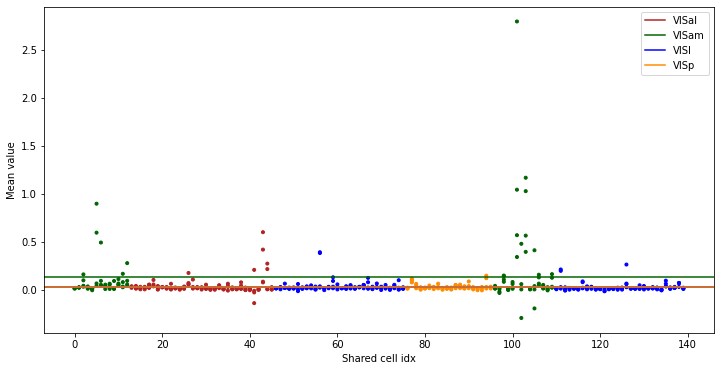

In [ ]:
# How does the mean change as a function of cell_idx?

fig, ax = plt.subplots(1, 1, figsize=(12,6))

for i in range(len(unique_structures)):
    ax.axhline(mean_values_by_target[i], color=c_vals[i])
    print('{} mean value: {:.4f}'.format(
        unique_structures[i], mean_values_by_target[i]
    ))
ax.legend(unique_structures)
for i in range(len(unique_structures)):
    print('{} normalized mag: {:.4f}'.format(
        unique_structures[i], norm_mags_by_target[i]
    ))

for pair_idx in range(2):
    for type_idx in range(2):
        # plot_color = c_vals[type_idx] if pair_idx == 0 else c_vals_l[type_idx]
        plot_color = [c_vals[target_idx] for target_idx in exp_targets[pair_idx, type_idx]]
        ax.scatter(np.arange(140), all_the_metrics_pair['means_pair'][pair_idx][type_idx], 
                   marker='.', linewidth=1.0, color=plot_color)
        
ax.set_ylabel('Mean value')
ax.set_xlabel('Shared cell idx')

###### Drift in a single session


Experiment number: 0
hit time split - early: 30 late: 75
Hit Diff Fit - Slope: 0.68 r2 score 0.81 outliers: 0
Hit 1st Half PR: 33.54 2nd Half PR: 59.40
miss time split - early: 12 late: 19
Miss Diff Fit - Slope: 0.54 r2 score 0.36 outliers: 3
Miss 1st Half PR: 18.74 2nd Half PR: 40.30
false_alarm time split - early: 2 late: 1
False Alarm Diff Fit - Slope: 0.97 r2 score 0.74 outliers: 0
False Alarm 1st Half PR: 0.88 2nd Half PR: 0.03
correct_reject time split - early: 4 late: 13
Correct Reject Diff Fit - Slope: 0.86 r2 score 0.95 outliers: 0
Correct Reject 1st Half PR: 4.23 2nd Half PR: 19.50


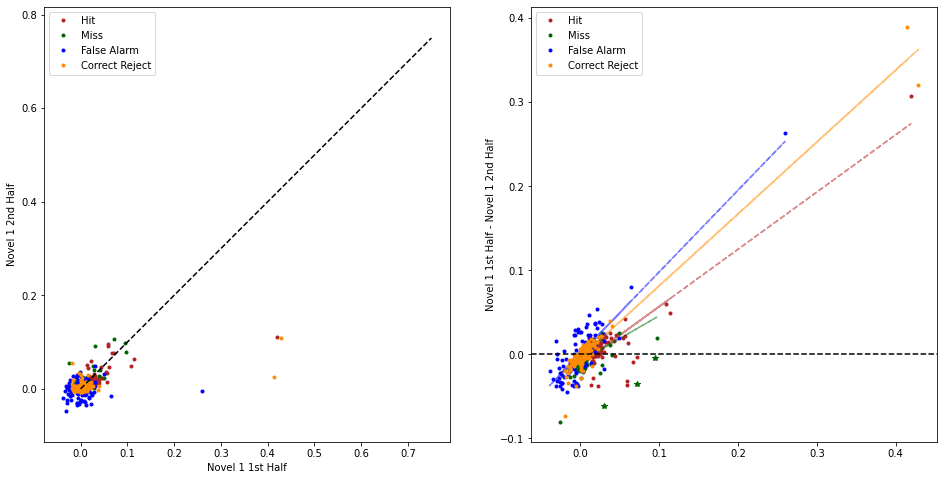

In [ ]:
ed_idx = 0

print('Experiment number:', ed_idx)
experiment_name = 'Novel 1'

experiment_dataset = experiment_datasets[ed_idx]
eng_trial_ids = eng_trial_ids_experiment[ed_idx]
not_eng_trial_ids = not_eng_trial_ids_experiment[ed_idx]
unique_images = unique_images_experiments[ed_idx]

trial_types = ['hit', 'miss', 'false_alarm', 'correct_reject']

fig, ax = plt.subplots(1, 2, figsize=(16,8))

type_idx = 0

for type_idx in range(4):

    query_string = trial_types[type_idx] + ' == True'
    if engaged_filter: 
        query_string += ' and trials_id in @eng_trial_ids[{}]'.format(type_idx)
    
    # Sets time threshold on hits
    if type_idx == 0:
        start_time = experiment_dataset.trials.query(query_string).head(1)['start_time'].iloc[0]
        end_time = experiment_dataset.trials.query(query_string).tail(1)['start_time'].iloc[0]
        time_thresh = (end_time - start_time)/2

    dff_vals_early = []
    dff_vals_late = []

    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        query_string).iterrows()):

        if trial['start_time'] < time_thresh:
            dff_vals_early.append(dff_vals_experiments[ed_idx][type_idx][trial_idx])
        else:
            dff_vals_late.append(dff_vals_experiments[ed_idx][type_idx][trial_idx])

    dff_vals_early = np.array(dff_vals_early)
    dff_vals_late = np.array(dff_vals_late)
    print('{} time split - early: {} late: {}'.format(
        trial_types[type_idx], dff_vals_early.shape[0], dff_vals_late.shape[0]
    ))

    dff_vals_early_cell = np.nanmean(dff_vals_early, axis=0)
    dff_vals_late_cell = np.nanmean(dff_vals_late, axis=0)

    ax[0].plot(dff_vals_early_cell, dff_vals_late_cell,
                linewidth=0, marker='.',
                color=c_vals[type_idx], label=plot_labels[type_idx])  
    dff_diff = dff_vals_early_cell - dff_vals_late_cell
    ax[1].plot(dff_vals_early_cell, dff_diff, linewidth=0, marker='.',
            color=c_vals[type_idx], label=plot_labels[type_idx])

    # Linear regression fit (eliminate outliers first)
    x_vals, y_vals, omitted_idxs = least_squares_outlier(dff_vals_early_cell[:, np.newaxis], dff_diff)
    reg = LinearRegression().fit(x_vals, y_vals)
    dff_diff_pred = reg.predict(x_vals)
    # Plot line and outliers
    ax[1].plot(x_vals, dff_diff_pred, color=c_vals[type_idx],
                linestyle='dashed', alpha=0.5)
    ax[1].plot(dff_vals_early_cell[omitted_idxs], dff_diff[omitted_idxs], linewidth=0, 
                marker='*', color=c_vals[type_idx])

    print('{} Diff Fit - Slope: {:.2f} r2 score {:.2f} outliers: {}'.format(
            plot_labels[type_idx], reg.coef_[0], 
            r2_score(y_vals, dff_diff_pred),
            len(omitted_idxs)
    ))
    print('{} 1st Half PR: {:.2f} 2nd Half PR: {:.2f}'.format(
        plot_labels[type_idx],
        participation_ratio_vector(dff_vals_early_cell),
        participation_ratio_vector(dff_vals_late_cell),
        ))
    
ax[0].plot([0, 0.75], [0, 0.75], color='k', linestyle='dashed')
ax[0].set_aspect('equal', adjustable='datalim')
ax[1].axhline(0.0, color='k', linestyle='dashed')

ax[0].set_xlabel(experiment_name + ' 1st Half')
ax[0].set_ylabel(experiment_name + ' 2nd Half')
ax[0].set_xlabel(experiment_name + ' 1st Half')
ax[1].set_ylabel('{} 1st Half - {} 2nd Half'.format(
    experiment_name, experiment_name))
ax[0].legend()
ax[1].legend()
# ax[0].set_xlim([-0.05, 0.1])
# ax[0].set_ylim([-0.05, 0.1])
# ax[1].set_xlim([-0.05, 0.1])
# ax[1].set_ylim([-0.05, 0.1])

Test of drift using Pearson's correlation coeffficient across images

Min images: 4, Max images: 18
Min images: 5, Max images: 14


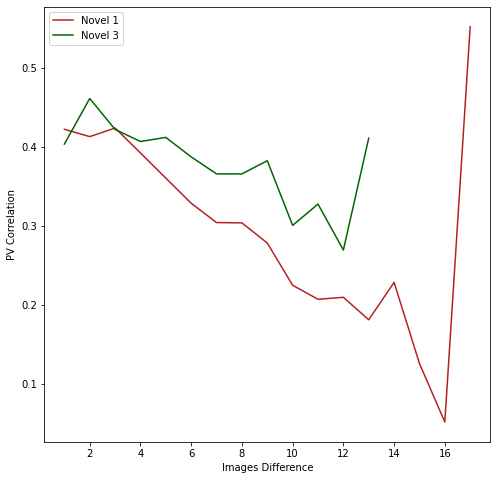

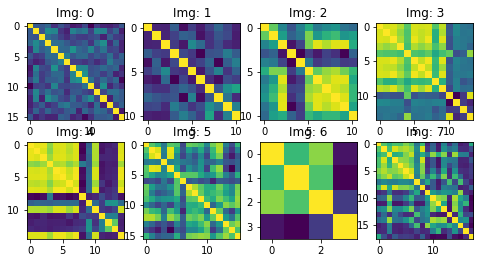

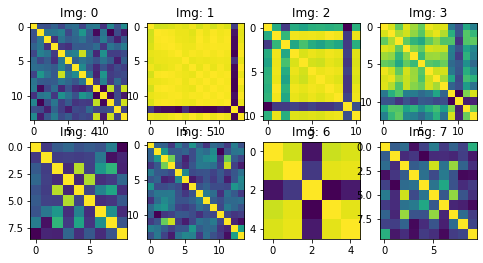

In [ ]:
def get_corr_coeff(x, y):
    x_mean = np.mean(x, axis=-1)[:, np.newaxis]
    y_mean = np.mean(y, axis=-1)[:, np.newaxis]
    x_std = np.std(x, axis=-1)
    y_std = np.std(y, axis=-1)

    return np.matmul(x-x_mean, (y-y_mean).T)/(x.shape[-1]*np.outer(x_std, y_std))

type_idx = 0

fig, ax = plt.subplots(1, 1, figsize=(8,8))

for ed_idx in range(2):

    n_images = [dff_by_image_experiments[ed_idx][img_idx].shape[0] for img_idx in range(8)]
    min_images = np.min(n_images)
    max_images = np.max(n_images)
    print(f'Min images: {min_images}, Max images: {max_images}')

    img_corrs = np.zeros((8, min_images, min_images))

    time_corrs = [[] for _ in range(max_images)]

    fig2, ax2 = plt.subplots(2, 4, figsize=(8,4))
    for img_idx in range(8):
        corrs = get_corr_coeff(
                    dff_by_image_experiments[ed_idx][img_idx][:, shared_cell_idxs[ed_idx]],
                    dff_by_image_experiments[ed_idx][img_idx][:, shared_cell_idxs[ed_idx]])
        ax2[img_idx // 4, img_idx % 4].imshow(corrs)
        ax2[img_idx // 4, img_idx % 4].set_title(f'Img: {img_idx}')
        img_corrs[img_idx] = corrs[:min_images, :min_images]

        for i in range(corrs.shape[0]):
            for j in range(corrs.shape[0]):
                time_corrs[np.abs(i-j)].append(corrs[i, j])

    # fig, ax = plt.subplots(1, 1, figsize=(8,8))
    # ax.imshow(get_corr_coeff(dff_vals_experiments[ed_idx][type_idx],
    #                          dff_vals_experiments[ed_idx][type_idx],))

    mean_corrs = [np.mean(corr_vals) for corr_vals in time_corrs]
    # for idx, corr_vals in enumerate(time_corrs[1:]):
    #     ax.plot((idx+1)*np.ones((len(corr_vals),)), corr_vals, color=c_vals_l[ed_idx],
    #             linewidth=0, marker='.')

    ax.plot(np.arange(1, max_images), mean_corrs[1:], color=c_vals[ed_idx],
            label=experiment_names[ed_idx])
    
    
ax.set_xlabel('Images Difference')
ax.set_ylabel('PV Correlation')
ax.legend()

Test of drift using SVC alignment

Experiment number: 0
Shared IDs: 58/188
hit time split - early: 54 late: 51 - features: 58 (time split: 0.7)
miss time split - early: 16 late: 15 - features: 58 (time split: 0.7)
  Class weights: {0: 1.0, 1: 3.375}
  Score 0.77 (std 0.18)
  Class weights: {0: 1.0, 1: 3.4}
  Score 0.72 (std 0.13)
Cross score (data: Late, models: Early) 0.70 (std 0.16)
Cross score (data: Early, models: Late) 0.51 (std 0.28)


Text(0.5, 0, 'Late Self-Align (dot(x,y)/|x||y|)')

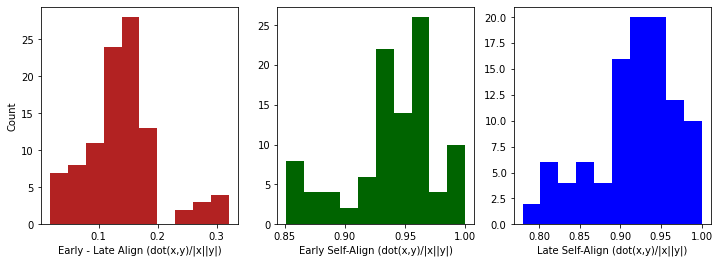

In [ ]:
from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

def get_align(x, y):
     return np.dot(x,y)/(
         np.linalg.norm(x) * np.linalg.norm(y)
     )

ed_idx = 0
type_idx = 0
engaged_filter = True
shared = True

time_split = 0.7
time_names = ['Early', 'Late']

type_idxs = [0, 1]
assert len(type_idxs) == 2
n_folds = 10

print('Experiment number:', ed_idx)
experiment_name = 'Novel 1'

experiment_dataset = experiment_datasets[ed_idx]
eng_trial_ids = eng_trial_ids_experiment[ed_idx]
unique_images = unique_images_experiments[ed_idx]

dff_vals_time = [[], []]

if shared: # Only classifies based on shared cell_ids
    shared_cell_ids = []
    for cell_id in unique_cell_ids.keys():
        if np.sum(np.isnan(unique_cell_ids[cell_id])) == 0:
            shared_cell_ids.append(cell_id)

    print('Shared IDs: {}/{}'.format(len(shared_cell_ids), 
                                    len(unique_cell_ids.keys())))

    # Map of shared cell_ids to cell_idxs in both datasets
    shared_cell_idxs = np.zeros((2, len(shared_cell_ids)), dtype=np.int64)
    for cell_idx, cell_id in enumerate(shared_cell_ids):
        shared_cell_idxs[:, cell_idx] = unique_cell_ids[cell_id]

for type_idx in type_idxs:

    query_string = trial_types[type_idx] + ' == True'
    if engaged_filter: 
        query_string += ' and trials_id in @eng_trial_ids[{}]'.format(type_idx)

    # Sets time threshold on hits
    if type_idx == 0:
        start_time = experiment_dataset.trials.query(query_string).head(1)['start_time'].iloc[0]
        end_time = experiment_dataset.trials.query(query_string).tail(1)['start_time'].iloc[0]
        time_thresh = (end_time - start_time) * time_split

    dff_vals_early, dff_vals_late = [], []

    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        query_string).iterrows()):

        if trial['start_time'] < time_thresh:
            if shared:
                dff_vals_early.append(
                    dff_vals_experiments[ed_idx][type_idx][trial_idx, shared_cell_idxs[ed_idx]])
            else:
                dff_vals_early.append(dff_vals_experiments[ed_idx][type_idx][trial_idx])
        else:
            if shared:
                dff_vals_late.append(
                    dff_vals_experiments[ed_idx][type_idx][trial_idx, shared_cell_idxs[ed_idx]])
            else:
                dff_vals_late.append(dff_vals_experiments[ed_idx][type_idx][trial_idx])

    dff_vals_time[0].append(np.array(dff_vals_early))
    dff_vals_time[1].append(np.array(dff_vals_late))

    print('{} time split - early: {} late: {} - features: {} (time split: {})'.format(
        trial_types[type_idx], len(dff_vals_early), 
        len(dff_vals_late), dff_vals_early[0].shape[0], time_split
    ))

models_time = []
coefs_time= []
intercepts_time = []
X_data_time = []
y_labels_time = []

for time_idx in range(2):

    dff_vals = [dff_vals_time[time_idx][type_idxs[0]],
                dff_vals_time[time_idx][type_idxs[1]]]

    n_samples = (dff_vals[0].shape[0], dff_vals[1].shape[0])
    n_feats = dff_vals[0].shape[1]

    class_weights = {type_idxs[i]: np.max(n_samples)/n_samples[i] for i in range(2)}
    print('  Class weights:', class_weights)

    # Create the classification data 
    X_data = []
    y_labels = []

    for type_idx_idx, type_idx in enumerate(type_idxs):
        X_data.append(dff_vals[type_idx])
        y_labels.append(type_idx_idx * np.ones(
            dff_vals[type_idx].shape[0], dtype=np.int32
        ))

    X_data = np.concatenate(X_data, axis=0)
    y_labels = np.concatenate(y_labels, axis=0)

    # Shuffle the classification data
    arr_idxs = np.arange(np.sum(n_samples))
    np.random.seed(10)
    np.random.shuffle(arr_idxs)
    X_data = X_data[arr_idxs]
    y_labels = y_labels[arr_idxs]

    X_data_time.append(X_data)
    y_labels_time.append(y_labels)

    # k-Fold Cross validation, saving the model details at each step
    kf = KFold(n_splits=n_folds)

    models = []
    coefs = np.zeros((n_folds, n_feats))
    intercepts = np.zeros((n_folds,))
    scores = np.zeros((n_folds))

    for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data)):
        X_train, X_test = X_data[train_index], X_data[test_index]
        y_train, y_test = y_labels[train_index], y_labels[test_index]

        # clf = svm.LinearSVC(class_weight=class_weights, fit_intercept=False)
        clf = svm.LinearSVC(class_weight='balanced', fit_intercept=False)
        # clf = svm.LinearSVC(fit_intercept=False)

        clf.fit(X_train, y_train)
        models.append(clf)
        coefs[fold_idx] = clf.coef_[0]
        # intercepts[fold_idx] = clf.intercept_[0]

        y_pred = clf.predict(X_test)
        raw_acc = np.sum(y_pred == y_test) / y_test.shape[0]
        scores[fold_idx] = clf.score(X_test, y_test)

        # scores[fold_idx] = (np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0]) if y_pred[i] == y_test[i]]) /
        #                     np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0])]))
        # print('  Acc: {:.2f}'.format(accs[fold_idx]))

    print('  Score {:.2f} (std {:.2f})'.format(
        scores.mean(), scores.std()))
    # scores = cross_val_score(clf, X_data, y_labels, cv=n_folds)
    # print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
    
    models_time.append(models)
    coefs_time.append(coefs)
    intercepts_time.append(intercepts)

for time_idx in range(2):
    # Swaps the data from one time to the other
    if time_idx == 0:
        data_time_idx = 1
    elif time_idx == 1:
        data_time_idx = 0

    X_data_cross = X_data_time[data_time_idx]
    y_labels_cross = y_labels_time[data_time_idx]

    cross_scores = np.zeros((n_folds,))
    kf = KFold(n_splits=n_folds)

    for fold_idx, (_, test_index) in enumerate(
        kf.split(X_data_cross)):

        X_test_cross = X_data_cross[test_index]
        y_test_cross = y_labels_cross[test_index]

        cross_scores[fold_idx] = models_time[time_idx][fold_idx].score(
            X_test_cross, y_test_cross)

    print('Cross score (data: {}, models: {}) {:.2f} (std {:.2f})'.format(
        time_names[data_time_idx], time_names[time_idx],
        cross_scores.mean(), cross_scores.std()))

aligments = np.zeros((n_folds, n_folds))
self_aligns = np.zeros((2, n_folds, n_folds))

fig, ax = plt.subplots(1, 3, figsize=(12,4))

for i in range(n_folds):
    for j in range(n_folds):
        aligments[i, j] = get_align(
            coefs_time[0][i], coefs_time[1][j])
        for k in range(2):
            self_aligns[k, i, j] = get_align(
                coefs_time[k][i], coefs_time[k][j])

ax[0].hist(aligments.flatten(), bins=10, color=c_vals[0]
         )
ax[0].set_xlabel('{} - {} Align (dot(x,y)/|x||y|)'.format(
    time_names[0], time_names[1]
))
ax[0].set_ylabel('Count')
ax[1].hist(self_aligns[0].flatten(), bins=10, color=c_vals[1]
         )
ax[1].set_xlabel('{} Self-Align (dot(x,y)/|x||y|)'.format(time_names[0]))
# ax[1].set_ylabel('Count')
ax[2].hist(self_aligns[1].flatten(), bins=10, color=c_vals[2]
         )
ax[2].set_xlabel('{} Self-Align (dot(x,y)/|x||y|)'.format(time_names[1]))
# ax[2].set_ylabel('Count')

In [ ]:


if shared:
    shared_cell_ids = []
    for cell_id in unique_cell_ids.keys():
        if np.sum(np.isnan(unique_cell_ids[cell_id])) == 0:
            shared_cell_ids.append(cell_id)

    print('Shared IDs: {}/{}'.format(len(shared_cell_ids), 
                                    len(unique_cell_ids.keys())))

    # Map of shared cell_ids to cell_idxs in both datasets
    shared_cell_idxs = np.zeros((2, len(shared_cell_ids)), dtype=np.int64)
    for cell_idx, cell_id in enumerate(shared_cell_ids):
        shared_cell_idxs[:, cell_idx] = unique_cell_ids[cell_id]

models_experiments = []
coefs_experiments = []
X_data_experiments = []
y_labels_experiments = []

for ed_idx, experiment_dataset in enumerate(experiment_datasets):

    if shared: # Only take shared IDs
        dff_vals = [dff_vals_experiments[ed_idx][type_idxs[0]][:, shared_cell_idxs[ed_idx]],
                    dff_vals_experiments[ed_idx][type_idxs[1]][:, shared_cell_idxs[ed_idx]]]
    else:
        dff_vals = [dff_vals_experiments[ed_idx][type_idxs[0]],
                    dff_vals_experiments[ed_idx][type_idxs[1]]]
    
    n_samples = (dff_vals[0].shape[0], dff_vals[1].shape[0])
    n_feats = dff_vals[0].shape[1]
    print(f'Exp {ed_idx} Samples:', n_samples, ' Features:', n_feats)

    class_weights = {type_idxs[i]: np.max(n_samples)/n_samples[i] for i in range(2)}
    print('  Class weights:', class_weights)

    # Create the classification data 
    X_data = []
    y_labels = []

    for type_idx_idx, type_idx in enumerate(type_idxs):
        X_data.append(dff_vals[type_idx])
        y_labels.append(type_idx_idx * np.ones(
            dff_vals[type_idx].shape[0], dtype=np.int32
        ))

    X_data = np.concatenate(X_data, axis=0)
    y_labels = np.concatenate(y_labels, axis=0)

    # Shuffle the classification data
    arr_idxs = np.arange(np.sum(n_samples))
    np.random.seed(10)
    np.random.shuffle(arr_idxs)
    X_data = X_data[arr_idxs]
    y_labels = y_labels[arr_idxs]

    X_data_experiments.append(X_data)
    y_labels_experiments.append(y_labels)

    # k-Fold Cross validation, saving the model details at each step
    kf = KFold(n_splits=n_folds)

    models = []
    coefs = np.zeros((n_folds, n_feats))
    intercepts = np.zeros((n_folds,))
    scores = np.zeros((n_folds))

    for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data)):
        X_train, X_test = X_data[train_index], X_data[test_index]
        y_train, y_test = y_labels[train_index], y_labels[test_index]

        # clf = svm.LinearSVC(class_weight=class_weights, fit_intercept=False)
        clf = svm.LinearSVC(class_weight='balanced', fit_intercept=False)
        # clf = svm.LinearSVC(fit_intercept=False)

        clf.fit(X_train, y_train)
        models.append(clf)
        coefs[fold_idx] = clf.coef_[0]

        y_pred = clf.predict(X_test)
        raw_acc = np.sum(y_pred == y_test) / y_test.shape[0]
        scores[fold_idx] = clf.score(X_test, y_test)

        # scores[fold_idx] = (np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0]) if y_pred[i] == y_test[i]]) /
        #                     np.sum([class_weights[y_test[i]] for i in range(y_test.shape[0])]))
        # print('  Acc: {:.2f}'.format(accs[fold_idx]))

    print('  Score {:.2f} (std {:.2f})'.format(
        scores.mean(), scores.std()))
    # scores = cross_val_score(clf, X_data, y_labels, cv=n_folds)
    # print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))
    
    models_experiments.append(models)
    coefs_experiments.append(coefs)

if shared:
    for ed_idx, experiment_dataset in enumerate(experiment_datasets):
        # Swaps the data from one experiment to the other
        if ed_idx == 0:
            data_ed_idx = 1
        elif ed_idx == 1:
            data_ed_idx = 0

        X_data_cross = X_data_experiments[data_ed_idx]
        y_labels_cross = y_labels_experiments[data_ed_idx]

        cross_scores = np.zeros((n_folds,))
        kf = KFold(n_splits=n_folds)

        for fold_idx, (_, test_index) in enumerate(
            kf.split(X_data_cross)):

            X_test_cross = X_data_cross[test_index]
            y_test_cross = y_labels_cross[test_index]

            cross_scores[fold_idx] = models_experiments[ed_idx][fold_idx].score(
                X_test_cross, y_test_cross)

        print('Cross score (data: {} models: {}) {:.2f} (std {:.2f})'.format(
            experiment_names[data_ed_idx], experiment_names[ed_idx],
            cross_scores.mean(), cross_scores.std()))

aligments = np.zeros((n_folds, n_folds))
self_aligns = np.zeros((2, n_folds, n_folds))

fig, ax = plt.subplots(1, 3, figsize=(12,4))

for i in range(n_folds):
    for j in range(n_folds):
        aligments[i, j] = get_align(
            coefs_experiments[0][i], coefs_experiments[1][j])
        for k in range(2):
            self_aligns[k, i, j] = get_align(
                coefs_experiments[k][i], coefs_experiments[k][j])

ax[0].hist(aligments.flatten(), bins=10, color=c_vals[0]
         )
ax[0].set_xlabel('Exp 1 Exp 2 Align (dot(x,y)/|x||y|)')
ax[0].set_ylabel('Count')
ax[1].hist(self_aligns[0].flatten(), bins=10, color=c_vals[1]
         )
ax[1].set_xlabel('Exp 1 Self-Align (dot(x,y)/|x||y|)')
# ax[1].set_ylabel('Count')
ax[2].hist(self_aligns[1].flatten(), bins=10, color=c_vals[2]
         )
ax[2].set_xlabel('Exp 2 Self-Align (dot(x,y)/|x||y|)')
# ax[2].set_ylabel('Count')

#### Checks on Imaging Data

In [ ]:
import pickle

def get_max_align(roi_mask0, roi_mask1, dims0, dims1, loc0, loc1):
    """ Sacns the two masks over one another to get the maximum alignment """

    mask0 = roi_mask0[loc0[1]:loc0[1]+dims0[1], loc0[0]:loc0[0]+dims0[0]]
    
    mask1 = roi_mask1[loc1[1]:loc1[1]+dims1[1], loc1[0]:loc1[0]+dims1[0]]

    # x_width = 2*np.max((dims0[0], dims1[0])) + np.min((dims0[0], dims1[0])) - 1
    # y_width = 2*np.max((dims0[1], dims1[1])) + np.min((dims0[1], dims1[1])) - 1
    x_width = 2*dims0[0] + dims1[0] - 1
    y_width = 2*dims0[1] + dims1[1] - 1
    dots = np.zeros((dims0[0]+dims1[0]-1, dims0[1]+dims1[1]-1,))

    # Mask 1 stays stationary as mask 0 moves over it to find maximum dot product
    temp_1_mask = np.zeros((y_width, x_width,))
    temp_1_mask[dims0[1]-1:dims0[1]-1+dims1[1], dims0[0]-1:dims0[0]-1+dims1[0]] = np.copy(mask1)

    for x_offset in range(dims0[0]+dims1[0]-1):
        for y_offset in range(dims0[1]+dims1[1]-1): 
            temp_0_mask = np.zeros((y_width, x_width,))
            temp_0_mask[y_offset:y_offset+dims0[1], x_offset:x_offset+dims0[0]] = mask0

            dots[x_offset, y_offset] = np.dot(temp_0_mask.flatten(), temp_1_mask.flatten())

    return np.max(dots) / (np.linalg.norm(mask0) * np.linalg.norm(mask1))

def save_cell_specimen_table(root_path, experiment_id, cell_spec_table):

    path = root_path + 'cell_specimen_table_expid_{}.pickle'.format(str(experiment_id))
    save_the_file = True

    if os.path.exists(path):
        print('File already exists at:', path)
        override = input('Override? (Y/N):')
        if override == 'Y':
            save_the_file = True
        else:
            save_the_file = False

    if save_the_file:
        print('Saving cell_specimen_table for exp_id: {}'.format(experiment_id))
        with open(path, 'wb') as save_file:
            # Variance explained plots
            pickle.dump(cell_spec_table, save_file, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        print('Data Not Saved')

def load_cell_specimen_table(root_path, experiment_id):
    
    path = root_path + 'cell_specimen_table_expid_{}.pickle'.format(str(experiment_id))

    if os.path.exists(path):
        print('Loading cell_specimen_table for exp_id: {}'.format(experiment_id))
        with open(path, 'rb') as load_file:
            cell_spec_table = pickle.load(load_file)
        return cell_spec_table
    else:
        raise ValueError('No file at path:', path)

In [ ]:
root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/'

for ed_idx, experiment_id in enumerate(experiment_ids):
    save_cell_specimen_table(root_path, experiment_id, 
                             experiment_datasets[ed_idx].cell_specimen_table)

File already exists at: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/cell_specimen_table_expid_1048044013.pickle
Override? (Y/N):Y
Saving cell_specimen_table for exp_id: 1048044013
File already exists at: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/cell_specimen_table_expid_1050730726.pickle
Override? (Y/N):Y
Saving cell_specimen_table for exp_id: 1050730726


In [ ]:
import scipy.stats
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress
import copy

mode = 'regular'
min_cell_count = 20

n_pairs = len(mouse_ids)

type_idxs = [0, 1]
# type_names = ['Change', 'No change'] if len(dff_vals_experiments[0]) == 2 else ['Hit', 'Miss']

assert len(type_idxs) == 2
pair_names = session_types

assert len(dff_vals_experiments)//2 == len(mouse_ids)

p1s = []
p2s = []
p3s = [[], []] # One for each type index
p4s = [[], []] # One for each type index
p5s = [[], []] # One for each type index
p6s = [[], []] # One for each type index

avg_area_diffs = []
avg_max_aligns = []
avg_drift_mags = [[], []] # One for each type index

# Drift metrics to collect
guess_max_pca_dim = 400 if summary_specs['get_no_changes'] else 200

# First index on all of these now corresponds to:
# 0: Original all shared cell fits
# 1: Well matched shared cell fits

pca_exp_var_ratio = np.empty((2, n_pairs, 2, 2, guess_max_pca_dim))
pca_exp_var_ratio[:] = np.nan

pca_drift_aligns = np.empty((2, n_pairs, 2, 2, guess_max_pca_dim))
pca_drift_aligns[:] = np.nan

first_pca_exp_var = np.empty((2, n_pairs, 2, 2, guess_max_pca_dim))
first_pca_exp_var[:] = np.nan

first_pca_drift = np.empty((2, n_pairs, 2, guess_max_pca_dim))
first_pca_drift[:] = np.nan

n_shared_cells = np.zeros((2, n_pairs))

max_pca_dim = 0

for pairs_idx, mouse_id in enumerate(mice_experiments):
    ed_idxs = [2*pairs_idx, 2*pairs_idx+1]

    print(f'----- Mouse ID: {mouse_ids[pairs_idx]} Pair idxs:', ed_idxs, '-----')
    cell_ids_pair = [cell_ids_experiment[ed_idxs[0]], cell_ids_experiment[ed_idxs[1]]]
    unique_cell_ids_pair = get_unique_cell_ids(cell_ids_pair, verbose=True)

    shared_cell_idxs_pair = get_shared_cell_idxs(unique_cell_ids_pair)

    # Loads the correspond cell_spec_table(s)
    cell_spec_table0s = []
    cell_spec_table1s = []

    # Loads all cell_spec_tables associated with current mouse
    for experiment_id in mice_experiments[mouse_id][session_types[0]]:
        cell_spec_table0s.append(load_cell_specimen_table(root_path, experiment_id))
    for experiment_id in mice_experiments[mouse_id][session_types[1]]:
        cell_spec_table1s.append(load_cell_specimen_table(root_path, experiment_id))
    
    # cell_spec_table0 = load_cell_specimen_table(root_path, experiment_ids[ed_idxs[0]])
    # cell_spec_table1 = load_cell_specimen_table(root_path, experiment_ids[ed_idxs[1]])

    # Nested list for each different plane in session_types[1]
    area_diffs_planes = [[] for _ in range(len(cell_spec_table1s))]
    max_aligns_planes = [[] for _ in range(len(cell_spec_table1s))]
    roi0s_planes = [[] for _ in range(len(cell_spec_table1s))]
    roi1s_planes = [[] for _ in range(len(cell_spec_table1s))]
    loc0s_planes = [[] for _ in range(len(cell_spec_table1s))]
    loc1s_planes = [[] for _ in range(len(cell_spec_table1s))]
    dim0s_planes = [[] for _ in range(len(cell_spec_table1s))]
    dim1s_planes = [[] for _ in range(len(cell_spec_table1s))]
    
    # This is used later to filter the drift into cells belonding to the different session 1 planes
    plane_1_filters = []

    # area_diffs = []
    # max_aligns = []
    # roi0s = []
    # roi1s = []
    # loc0s = []
    # loc1s = []
    # dim0s = []
    # dim1s = []

    # Searches for matched cells with good matching
    unique_cell_ids_pair_match = copy.deepcopy(unique_cell_ids_pair)
    area_diff_thresh = 0.15
    align_thresh = 0.15

    for cell_id in unique_cell_ids_pair:
        # Skip any cell_id that is not in both datasets
        if np.sum(np.isnan(unique_cell_ids_pair[cell_id])) > 0:
            unique_cell_ids_pair_match.pop(cell_id)
            continue

        # For the current cell_id, gets corresponding idx in corresponding sessino
        cell_idx0 = unique_cell_ids_pair[cell_id][0]
        # Uses the cell_idx to find the corresponding cell_spec_table of the cell
        plane_idx0 = mice_experiments_details[mouse_id][f'{session_types[0]}_targets'][cell_idx0]
        # Shifts the plane_idx to match order in cell_spec_table0s list
        plane_idx0 = plane_idx0 - min(mice_experiments_details[mouse_id][f'{session_types[0]}_targets'].values())
        cell_spec_table0 = cell_spec_table0s[plane_idx0]

        loc0 = cell_spec_table0.loc[cell_id]['x'], cell_spec_table0.loc[cell_id]['y']
        dim0 = cell_spec_table0.loc[cell_id]['width'], cell_spec_table0.loc[cell_id]['height']
        roi_mask0 = np.array(cell_spec_table0.loc[cell_id]['roi_mask'], dtype=np.int32)

        # Same mapping used above to find appropriate cell_spec_table
        cell_idx1 = unique_cell_ids_pair[cell_id][1]
        plane_idx1 = mice_experiments_details[mouse_id][f'{session_types[1]}_targets'][cell_idx1]
        plane_idx1 = plane_idx1 - min(mice_experiments_details[mouse_id][f'{session_types[1]}_targets'].values())
        cell_spec_table1 = cell_spec_table1s[plane_idx1]
        plane_1_filters.append(plane_idx1)

        loc1 = cell_spec_table1.loc[cell_id]['x'], cell_spec_table1.loc[cell_id]['y']
        dim1 = cell_spec_table1.loc[cell_id]['width'], cell_spec_table1.loc[cell_id]['height']
        roi_mask1 = np.array(cell_spec_table1.loc[cell_id]['roi_mask'], dtype=np.int32)
        
        roi0s_planes[plane_idx1].append(roi_mask0)
        loc0s_planes[plane_idx1].append(loc0)
        dim0s_planes[plane_idx1].append(dim0)
        roi1s_planes[plane_idx1].append(roi_mask1)
        loc1s_planes[plane_idx1].append(loc1)
        dim1s_planes[plane_idx1].append(dim1)

        max_align = get_max_align(roi_mask0, roi_mask1, dim0, dim1, loc0, loc1)
        area_diff = (np.sum(roi_mask1) - np.sum(roi_mask0))/np.sum(roi_mask0)
        max_aligns_planes[plane_idx1].append(max_align)
        area_diffs_planes[plane_idx1].append(area_diff)

        # Eliminate cell that don't meet thresholds
        if np.abs(area_diff) > area_diff_thresh or (1-max_align) > align_thresh:
            unique_cell_ids_pair_match.pop(cell_id)
        # area_diffs.append((np.sum(roi_mask1) - np.sum(roi_mask0))

    for plane_idx1 in range(len(cell_spec_table1s)):
        loc1s_planes[plane_idx1] = np.array(loc1s_planes[plane_idx1])
        area_diffs_planes[plane_idx1] = np.array(area_diffs_planes[plane_idx1])
        max_aligns_planes[plane_idx1] = np.array(max_aligns_planes[plane_idx1])

    # Averages across all planes and cells
    avg_area_diffs.append(np.mean(np.abs(np.concatenate(area_diffs_planes, axis=0))))
    avg_max_aligns.append(np.mean(np.concatenate(max_aligns_planes, axis=0)))

    shared_cell_idxs_pair_match = get_shared_cell_idxs(unique_cell_ids_pair_match, verbose=False)

    print('Good matches: {}/{}'.format(shared_cell_idxs_pair_match.shape[-1],
                                       shared_cell_idxs_pair.shape[-1]))
    n_shared_cells[0, pairs_idx] = shared_cell_idxs_pair.shape[-1]
    n_shared_cells[1, pairs_idx] = shared_cell_idxs_pair_match.shape[-1]
    # print('Loc1s:', loc1s[:5], len(loc1s))
    # print('Max aligns:', max_aligns[:5], len(max_aligns), np.isnan(max_aligns).any())
    # print('Area diffs:', area_diffs[:5],len(area_diffs), np.isnan(area_diffs).any())

    ### Now that a bunch of spatial data is collected, runs various analyses ###

    # Fits X-Y data to area diffs and alignments to see if there is any spatial trend
    p1s.append([]) # List for various planes
    p2s.append([])
    for plane_idx1 in range(len(cell_spec_table1s)):
        n_samples = area_diffs_planes[plane_idx1].shape[0]
        if n_samples == 0: # Case where plane has nothing, can happen for multiplane matching
            p1s[-1].append(np.nan)
            p2s[-1].append(np.nan)
            continue
        reg1 = LinearRegression().fit(loc1s_planes[plane_idx1], 
                                      area_diffs_planes[plane_idx1])
        reg2 = LinearRegression().fit(loc1s_planes[plane_idx1], 
                                      max_aligns_planes[plane_idx1])

        reg1_null = LinearRegression().fit(np.zeros_like(loc1s_planes[plane_idx1]), 
                                           area_diffs_planes[plane_idx1])
        rss1 = np.sum((area_diffs_planes[plane_idx1] - 
                       reg1.predict(loc1s_planes[plane_idx1]))**2)
        rss1_null = np.sum((area_diffs_planes[plane_idx1] - 
                            reg1_null.predict(loc1s_planes[plane_idx1]))**2)
        # print(rss1)
        # print(rss1_null)
        # print(sdfsd)
        
        F1 = ((rss1_null-rss1)/2)/(rss1/(n_samples-2-1))
        p1 = 1-scipy.stats.f.cdf(F1, 2, n_samples-2-1)
        if len(loc1s_planes[plane_idx1]) > min_cell_count:
            p1s[-1].append(p1)
        else:
            p1s[-1].append(np.nan)

        reg2_null = LinearRegression().fit(np.zeros_like(loc1s_planes[plane_idx1]),
                                           max_aligns_planes[plane_idx1])
        rss2 = np.sum((max_aligns_planes[plane_idx1] - 
                       reg2.predict(loc1s_planes[plane_idx1]))**2)
        rss2_null = np.sum((max_aligns_planes[plane_idx1] - 
                            reg2_null.predict(loc1s_planes[plane_idx1]))**2)
        F2 = ((rss2_null-rss2)/2)/(rss2/(n_samples-2-1))
        p2 = 1-scipy.stats.f.cdf(F2, 2, n_samples-2-1)
        if len(loc1s_planes[plane_idx1]) > min_cell_count:
            p2s[-1].append(p2)
        else:
            p2s[-1].append(np.nan)
    # print('Area diff p-value (f-test): {:.2e}'.format(p1))
    # print('Align p-value (f-test): {:.2e}'.format(p2))

    area_diffs_flat = np.concatenate(area_diffs_planes, axis=0)

    # Now does some fits for drift as a function of X-Y locations
    for match_idx in range(2): # 0: all shared, 1: well-matched shared

        if match_idx == 0:
            all_the_metrics_pair = pair_drift_geometry_metrics(ed_idxs, shared_cell_idxs_pair, verbose=False, mode=mode, classifier_metrics=False)
        elif match_idx == 1:
            all_the_metrics_pair = pair_drift_geometry_metrics(ed_idxs, shared_cell_idxs_pair_match, verbose=False, mode=mode, classifier_metrics=False)

        # Can measure drift for each type index
        for type_idx in type_idxs:

            if match_idx == 0: # These only need to be done for all shared cells
                drift = all_the_metrics_pair['means_pair'][1][type_idx] - all_the_metrics_pair['means_pair'][0][type_idx]
                avg_drift_mags[type_idx].append(np.linalg.norm(drift)/np.sqrt(drift.shape[0]))

                p3s[type_idx].append([])
                p4s[type_idx].append([])
                p5s[type_idx].append([])
                p6s[type_idx].append([])
                for plane_idx1 in range(len(cell_spec_table1s)):
                    # Looks only at cells in the corresponding plane
                    drift_plane = drift[np.array(plane_1_filters)==plane_idx1]
                    n_samples = area_diffs_planes[plane_idx1].shape[0]
                    if n_samples == 0: # Case where plane has nothing, can happen for multiplane matching
                        p3s[type_idx][-1].append(np.nan)
                        p4s[type_idx][-1].append(np.nan)
                        p5s[type_idx][-1].append(np.nan)
                        p6s[type_idx][-1].append(np.nan)
                        continue
                    # Can area difference explain drift?
                    reg3 = linregress(area_diffs_planes[plane_idx1], drift_plane)
                    # print('Left plot - Slope: {:.2e} (se: {:.2e}), r: {:.2f} p: {:.2e}'.format(
                   
                    #     reg3.slope, reg3.stderr, reg3.rvalue, reg3.pvalue))
                    # Can area difference explain magnitude of drift?
                    reg4 = linregress(area_diffs_planes[plane_idx1], np.abs(drift_plane))
                    # print('Right plot - Slope: {:.2e} (se: {:.2e}), r: {:.2f} p: {:.2e}'.format(
                    #     reg4.slope, reg4.stderr, reg4.rvalue, reg4.pvalue))

                    # Can locations explain drift?
                    reg5 = LinearRegression().fit(loc1s_planes[plane_idx1], drift_plane)
                    reg5_null = LinearRegression().fit(
                        np.zeros_like(loc1s_planes[plane_idx1]), drift_plane)
                    rss5 = np.sum((drift_plane - 
                                   reg5.predict(loc1s_planes[plane_idx1]))**2)
                    rss5_null = np.sum((drift_plane - 
                                        reg5_null.predict(loc1s_planes[plane_idx1]))**2)
                    F5 = ((rss5_null-rss5)/2)/(rss5/(n_samples-2-1))
                    p5 = 1-scipy.stats.f.cdf(F5, 2, n_samples-2-1)

                    reg6 = LinearRegression().fit(loc1s_planes[plane_idx1], np.abs(drift_plane))
                    reg6_null = LinearRegression().fit(
                        np.zeros_like(loc1s_planes[plane_idx1]), np.abs(drift_plane))
                    rss6 = np.sum((np.abs(drift_plane) - 
                                   reg6.predict(loc1s_planes[plane_idx1]))**2)
                    rss6_null = np.sum((np.abs(drift_plane) - 
                                        reg6_null.predict(loc1s_planes[plane_idx1]))**2)
                    F6 = ((rss6_null-rss6)/2)/(rss6/(n_samples-2-1))
                    p6 = 1-scipy.stats.f.cdf(F6, 2, n_samples-2-1)
                    # print('Count:', len(loc1s_planes[plane_idx1]), 'Reg 3 val', reg3.pvalue, 'p5', p5)
                    if len(loc1s_planes[plane_idx1]) > min_cell_count:
                        p3s[type_idx][-1].append(reg3.pvalue)
                        p4s[type_idx][-1].append(reg4.pvalue)
                        p5s[type_idx][-1].append(p5)
                        p6s[type_idx][-1].append(p6)
                    else:
                        print('Plane rejected, too few cells')
                        p3s[type_idx][-1].append(np.nan)
                        p4s[type_idx][-1].append(np.nan)
                        p5s[type_idx][-1].append(np.nan)
                        p6s[type_idx][-1].append(np.nan)
                    print('  Plane idx {} cell count: {} p5: {:.4f}'.format(plane_idx1, len(loc1s_planes[plane_idx1]), p5))


            # Metrics for matching drift
            for pair_idx in range(2):
                n_pcas = all_the_metrics_pair['pca_means_pair'][pair_idx][type_idx].shape[0]
                if n_pcas > max_pca_dim:
                    max_pca_dim = n_pcas
                pca_exp_var_ratio[match_idx, pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['pca_pair'][pair_idx][type_idx].explained_variance_ratio_    
                pca_drift_aligns[match_idx, pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['pca_aligns_diff'][pair_idx][type_idx]

                n_pcas = len(all_the_metrics_pair['first_pca_explained_var'][type_idx][0]) # Uses first pair PCA dimensions for both
                first_pca_exp_var[match_idx, pairs_idx, pair_idx, type_idx, :n_pcas] = all_the_metrics_pair['first_pca_explained_var'][type_idx][pair_idx]
                first_pca_drift[match_idx, pairs_idx, type_idx, :n_pcas] = all_the_metrics_pair['first_pca_drift'][type_idx]
print('Done!')

----- Mouse ID: 425493 Pair idxs: [0, 1] -----
Number of cells:  226
Number of cells:  194
Shared IDs: 147/273
Loading cell_specimen_table for exp_id: 806456687
Loading cell_specimen_table for exp_id: 807752719
Good matches: 87/147
  Plane idx 0 cell count: 147 p5: 0.8016
  Plane idx 0 cell count: 147 p5: 0.6684
----- Mouse ID: 425496 Pair idxs: [2, 3] -----
Number of cells:  251
Number of cells:  286
Shared IDs: 149/388
Loading cell_specimen_table for exp_id: 806455766
Loading cell_specimen_table for exp_id: 807753334
Good matches: 61/149
  Plane idx 0 cell count: 149 p5: 0.1940
  Plane idx 0 cell count: 149 p5: 0.7253
----- Mouse ID: 431023 Pair idxs: [4, 5] -----
Number of cells:  167
Number of cells:  110
Shared IDs: 70/207
Loading cell_specimen_table for exp_id: 822647135
Loading cell_specimen_table for exp_id: 825130141
Good matches: 25/70
  Plane idx 0 cell count: 70 p5: 0.1689
  Plane idx 0 cell count: 70 p5: 0.3286
----- Mouse ID: 431252 Pair idxs: [6, 7] -----
Number of cells

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:206: RuntimeWarning: divide by zero encountered in double_scalars


  Plane idx 0 cell count: 97 p5: 0.9189
  Plane idx 1 cell count: 65 p5: 0.0505
Plane rejected, too few cells
  Plane idx 2 cell count: 2 p5: nan
  Plane idx 0 cell count: 97 p5: 0.1922
  Plane idx 1 cell count: 65 p5: 0.1230
Plane rejected, too few cells
  Plane idx 2 cell count: 2 p5: nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:264: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:274: RuntimeWarning: divide by zero encountered in double_scalars


----- Mouse ID: 472271 Pair idxs: [40, 41] -----
Number of cells:  112
Number of cells:  139
Shared IDs: 76/175
Loading cell_specimen_table for exp_id: 959389424
Loading cell_specimen_table for exp_id: 959389426
Loading cell_specimen_table for exp_id: 960995095
Loading cell_specimen_table for exp_id: 960995093
Good matches: 38/76
  Plane idx 0 cell count: 38 p5: 0.4838
  Plane idx 1 cell count: 38 p5: 0.8753
  Plane idx 0 cell count: 38 p5: 0.4477
  Plane idx 1 cell count: 38 p5: 0.7675
----- Mouse ID: 477052 Pair idxs: [42, 43] -----
Number of cells:  209
Number of cells:  255
Shared IDs: 126/338
Loading cell_specimen_table for exp_id: 964615767
Loading cell_specimen_table for exp_id: 964615769
Loading cell_specimen_table for exp_id: 965980147
Loading cell_specimen_table for exp_id: 965980150
Good matches: 45/126
  Plane idx 0 cell count: 55 p5: 0.4158
  Plane idx 1 cell count: 71 p5: 0.3700
  Plane idx 0 cell count: 55 p5: 0.9360
  Plane idx 1 cell count: 71 p5: 0.8114
----- Mouse ID

Bins: [0.001      0.00143845 0.00206914 0.00297635 0.00428133 0.00615848
 0.00885867 0.01274275 0.01832981 0.02636651 0.0379269  0.05455595
 0.078476   0.11288379 0.16237767 0.23357215 0.33598183 0.48329302
 0.6951928  1.        ]


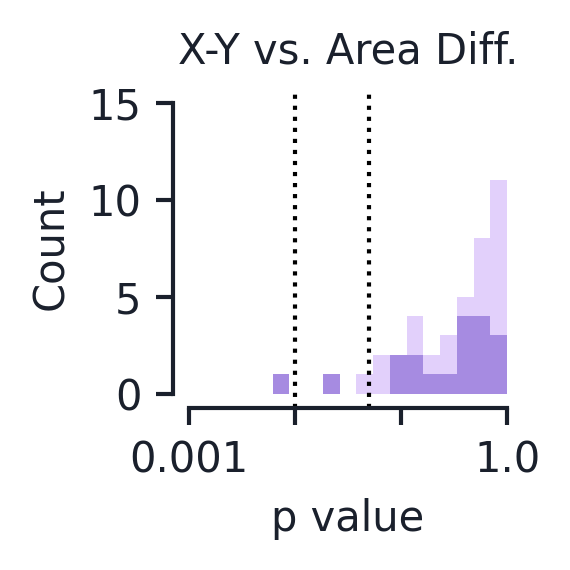

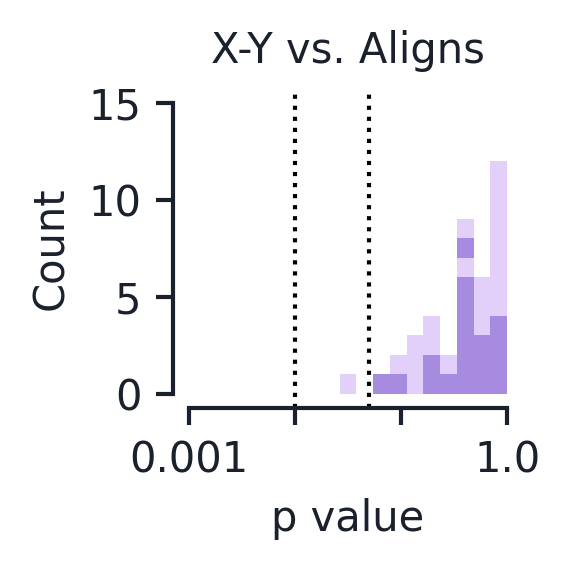

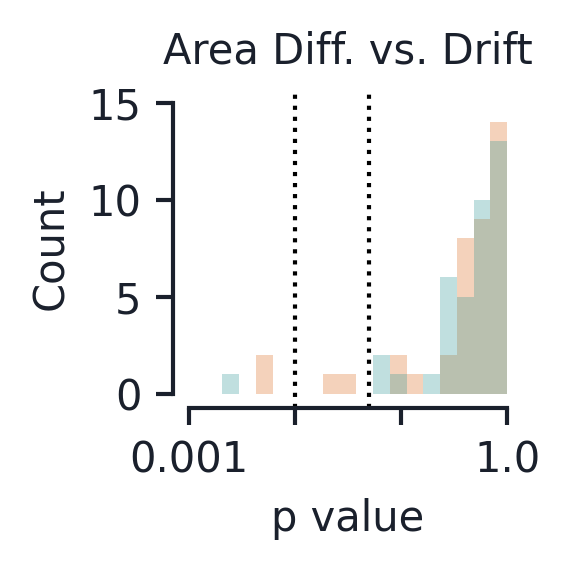

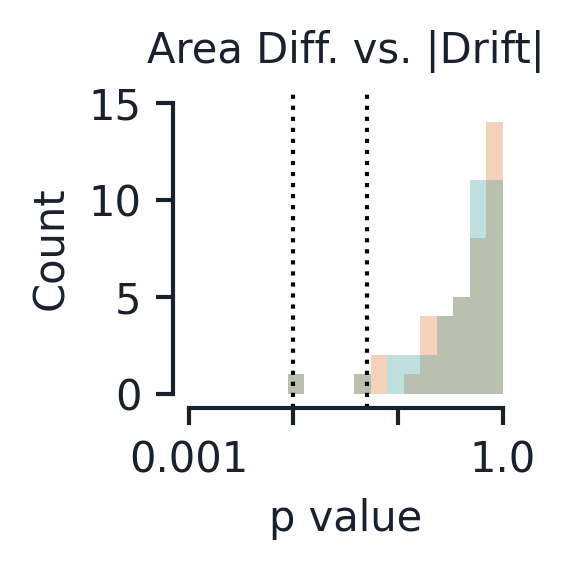

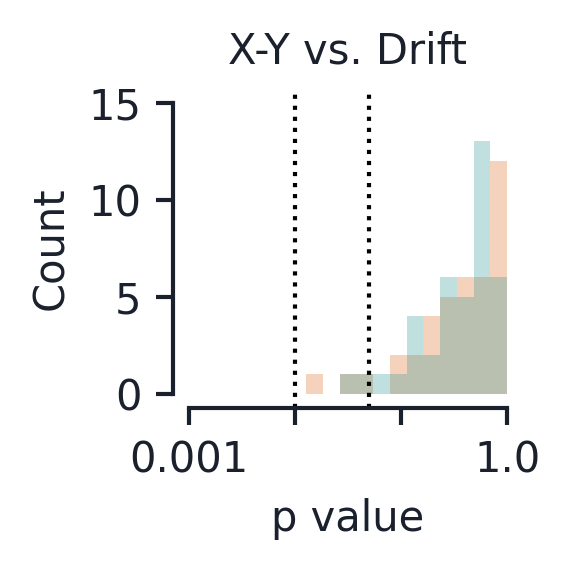

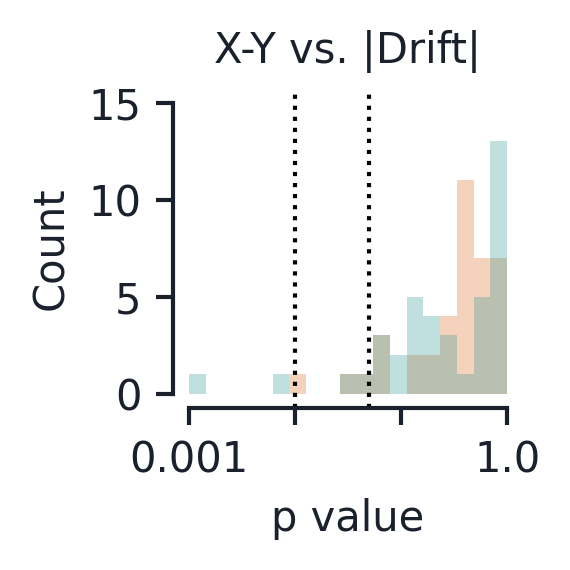

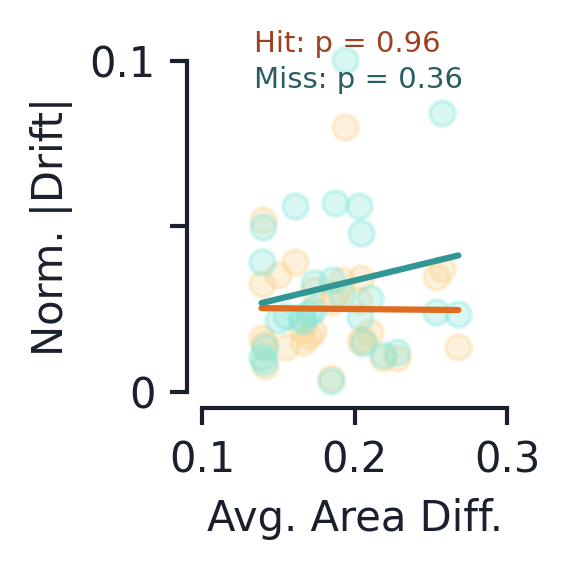

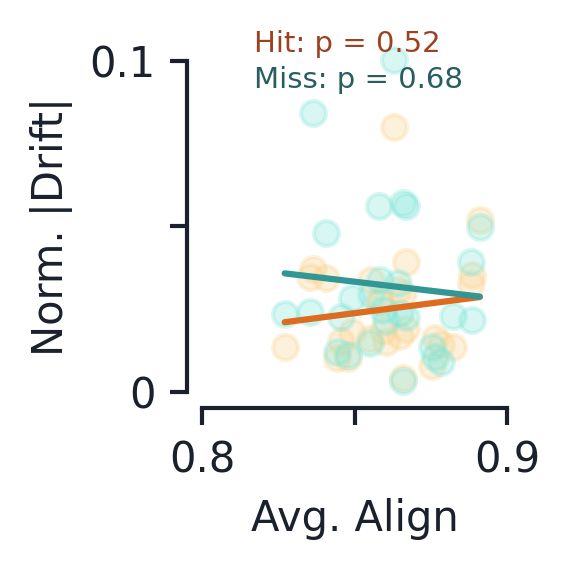

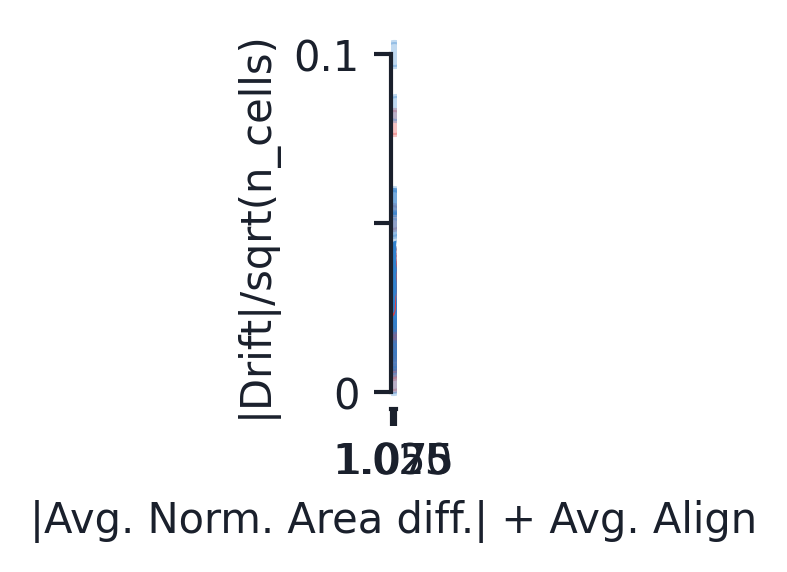

In [ ]:
type_names = ['Change', 'No change'] if len(dff_vals_experiments[0]) == 2 else ['Hit', 'Miss']

# fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16, 8))
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
fig4, ax4 = plt.subplots(1, 1, figsize=(2,2))
fig5, ax5 = plt.subplots(1, 1, figsize=(2,2))
fig6, ax6 = plt.subplots(1, 1, figsize=(2,2))

bins = 10**(np.linspace(-3, 0, 20))
print('Bins:', bins)

bar_colors = [c_vals[3] if len(ps) == 1 else c_vals_l[3] for ps in p1s]

ax1.hist(p1s, bins=bins, color=bar_colors, alpha=0.7, stacked=True)
# ax1.axvline(np.mean(p1s), color=c_vals[2])
ax1.set_xscale('log')
ax1.set_title('X-Y vs. Area Diff.')
# ax1.set_xlabel('p value')

ax2.hist(p2s, bins=bins, color=bar_colors, alpha=0.7, stacked=True)
# ax2.axvline(np.mean(p2s), color=c_vals[2])
ax2.set_xscale('log')
ax2.set_title('X-Y vs. Aligns')
# ax2.set_xlabel('p value')


for type_idx in type_idxs:
    bar_colors = [c_vals[type_idx+4] if len(ps) == 1 else c_vals[type_idx+4] for ps in p1s]

    ax3.hist(p3s[type_idx], bins=bins, color=bar_colors, alpha=0.3,
             label=type_names[type_idx], stacked=True)
    # ax3.axvline(np.mean(p3s[type_idx]), color=c_vals[type_idx])
    ax4.hist(p4s[type_idx], bins=bins, color=bar_colors, alpha=0.3,
             label=type_names[type_idx], stacked=True)
    # ax4.axvline(np.mean(p4s[type_idx]), color=c_vals[type_idx])
    ax5.hist(p5s[type_idx], bins=bins, color=bar_colors, alpha=0.3,
             label=type_names[type_idx], stacked=True)
    # ax5.axvline(np.mean(p5s[type_idx]), color=c_vals[type_idx])
    ax6.hist(p6s[type_idx], bins=bins, color=bar_colors, alpha=0.3,
             label=type_names[type_idx], stacked=True)

ax3.set_xscale('log')
ax3.set_title('Area Diff. vs. Drift')
# ax3.legend()
# ax3.set_xlabel('p value')

ax4.set_xscale('log')
ax4.set_title('Area Diff. vs. |Drift|')
# ax4.set_xlabel('p value')

ax5.set_xscale('log')
ax5.set_title('X-Y vs. Drift')
# ax5.set_xlabel('p value')

ax6.set_xscale('log')
ax6.set_title('X-Y vs. |Drift|')

for ax in (ax1, ax2, ax3, ax4, ax5, ax6):
    ax.axvline(0.05, color='k', linestyle='dotted', linewidth=1.0)
    ax.axvline(0.01, color='k', linestyle='dotted', linewidth=1.0)
    ax.set_xlabel('p value')
    ax.set_ylabel('Count')
    
    ax.set_xlim((0.001, 1.0))
    ax.set_xticks((0.001, 0.01, 0.1, 1.0))
    ax.set_xticklabels((0.001, None, None, 1.0))

    ax.set_ylim((0, 15))
    ax.set_yticks((0, 5, 10, 15))

    jetplot.breathe(ax=ax)

# fig, (ax7, ax8, ax9) = plt.subplots(1, 3, figsize=(16, 4))

fig7, ax7 = plt.subplots(1, 1, figsize=(2,2))
fig8, ax8 = plt.subplots(1, 1, figsize=(2,2))
fig9, ax9 = plt.subplots(1, 1, figsize=(2,2))

type_names = ('Hit', 'Miss')
for type_idx in type_idxs:
    reg7 = linregress(avg_area_diffs, avg_drift_mags[type_idx])
    ax7.scatter(avg_area_diffs, avg_drift_mags[type_idx], color=c_vals_l[type_idx+4], 
             alpha=0.3)
    reg_plot_X = np.linspace(np.min(avg_area_diffs), np.max(avg_area_diffs), num=10)
    reg_plot_y = reg7.slope * reg_plot_X + reg7.intercept
    ax7.plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx+4],
             label=type_names[type_idx] + '(p={:.1e})'.format(reg7.pvalue))
    
    ax7.text(0.2, 1.0-0.1*type_idx, '{}: p = {:.2f}'.format(type_names[type_idx], reg7.pvalue), 
        horizontalalignment='left', verticalalignment='center', 
        color=c_vals_d[type_idx+4], fontsize=7, transform=ax7.transAxes)
    
    reg8 = linregress(avg_max_aligns, avg_drift_mags[type_idx])
    ax8.scatter(avg_max_aligns, avg_drift_mags[type_idx], color=c_vals_l[type_idx+4], 
             alpha=0.3)
    reg_plot_X = np.linspace(np.min(avg_max_aligns), np.max(avg_max_aligns), num=10)
    reg_plot_y = reg8.slope * reg_plot_X + reg8.intercept
    ax8.plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx+4],
             label=type_names[type_idx] + '(p={:.1e})'.format(reg8.pvalue))
    
    ax8.text(0.2, 1.0-0.1*type_idx, '{}: p = {:.2f}'.format(type_names[type_idx], reg8.pvalue), 
        horizontalalignment='left', verticalalignment='center', 
        color=c_vals_d[type_idx+4], fontsize=7, transform=ax8.transAxes)
    
    reg9 = linregress(np.abs(avg_area_diffs)+avg_max_aligns, avg_drift_mags[type_idx])
    ax9.scatter(np.abs(avg_area_diffs)+avg_max_aligns, avg_drift_mags[type_idx], 
                color=c_vals[type_idx], alpha=0.3)
    reg_plot_X = np.linspace(np.min(np.abs(avg_area_diffs)+avg_max_aligns), 
                             np.max(np.abs(avg_area_diffs)+avg_max_aligns), num=10)
    reg_plot_y = reg9.slope * reg_plot_X + reg9.intercept
    ax9.plot(reg_plot_X, reg_plot_y, color=c_vals[type_idx],
             label=type_names[type_idx] + '(p={:.1e})'.format(reg9.pvalue))
    
# ax7.legend()
ax7.set_xlabel('Avg. Area Diff.')
ax7.set_ylabel('Norm. |Drift|')
ax7.set_xlim((0.1, 0.3))
ax7.set_xticks((0.1, 0.2, 0.3))
ax7.set_xticklabels((0.1, 0.2, 0.3))


# ax8.legend()
ax8.set_xlabel('Avg. Align')
ax8.set_ylabel('Norm. |Drift|')
ax8.set_xlim((0.8, 0.9))
ax8.set_xticks((0.8, 0.85, 0.9))
ax8.set_xticklabels((0.8, None, 0.9))


# ax9.legend()
ax9.set_xlabel('|Avg. Norm. Area diff.| + Avg. Align')
ax9.set_ylabel('|Drift|/sqrt(n_cells)')

for ax in (ax7, ax8, ax9):
    ax.set_ylim((0, 0.1))
    ax.set_yticks((0, 0.05, 0.1,))
    ax.set_yticklabels((0, None, 0.1))
    jetplot.breathe(ax=ax)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in greater


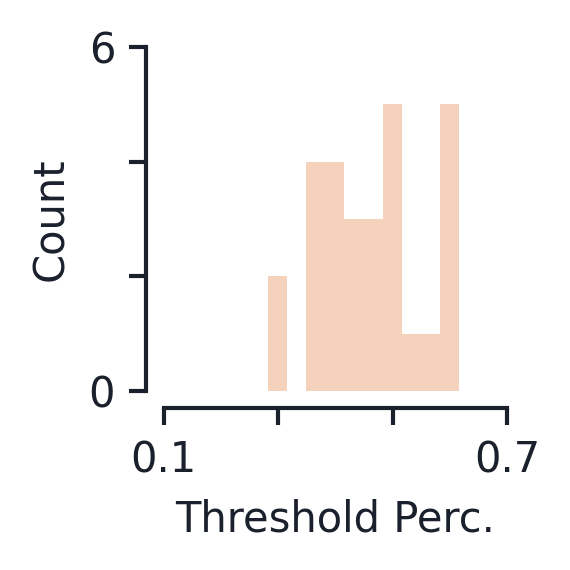

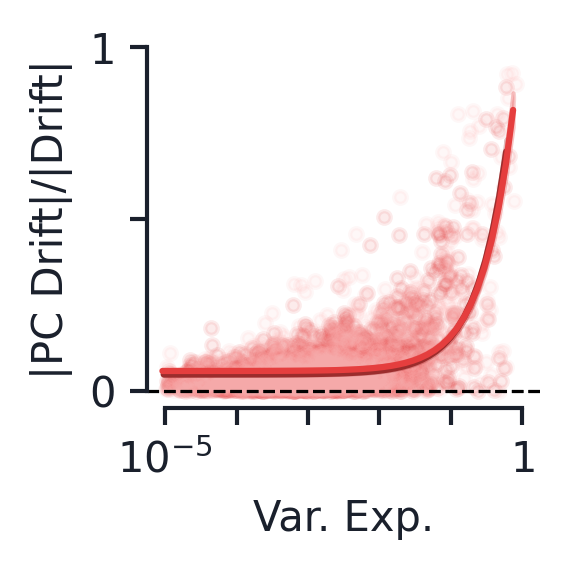

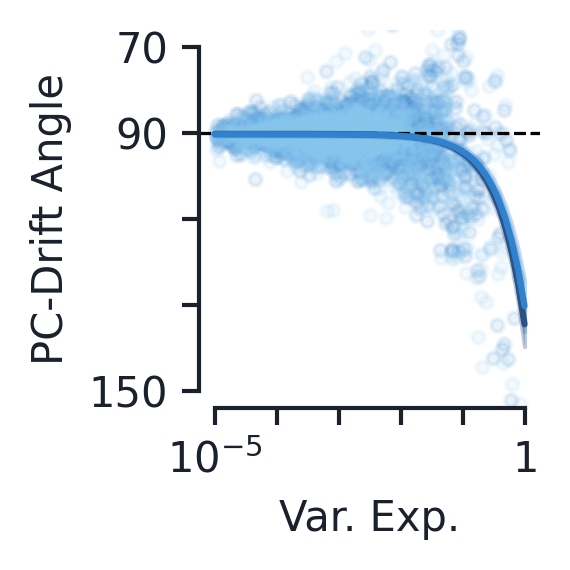

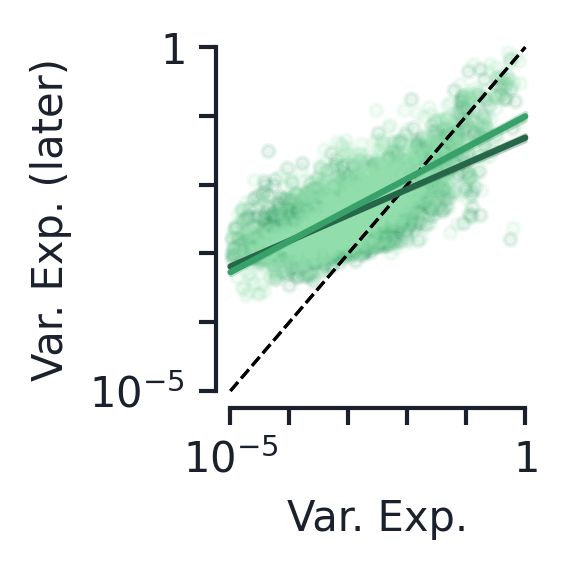

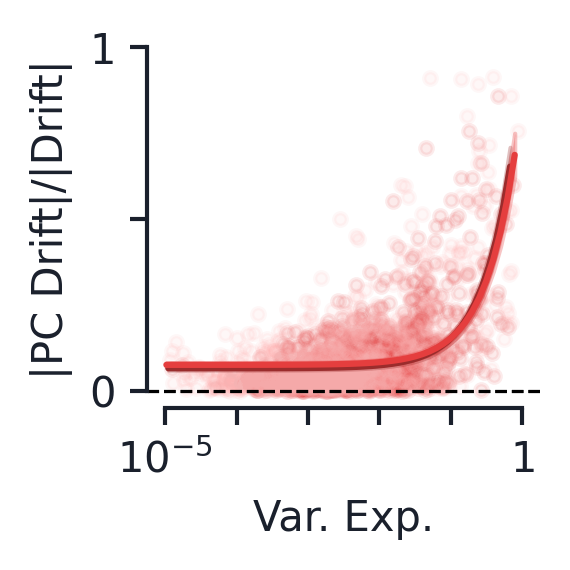

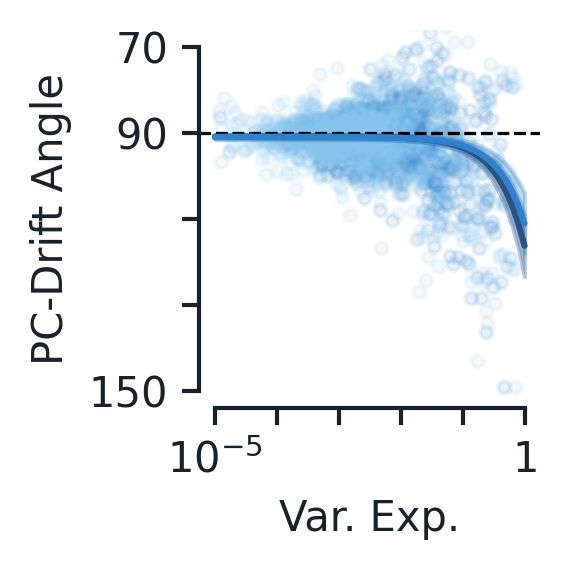

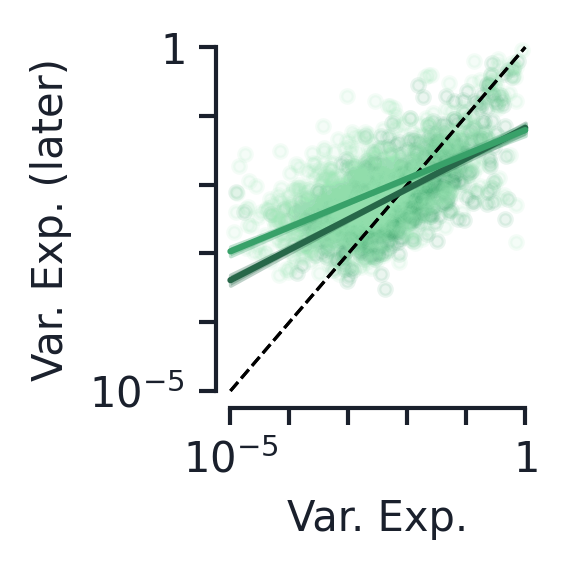

In [ ]:
min_var_exp = 1e-5
n_se = 1.97

# fig, ax7 = plt.subplots(1, 1, figsize=(6, 4))
fig7, ax7 = plt.subplots(1, 1, figsize=(2,2))

ax7.hist(n_shared_cells[1]/n_shared_cells[0], color=c_vals[4], alpha=0.3)
ax7.set_xlabel('Threshold Perc.')
ax7.set_ylabel('Count')

ax7.set_xlim((0.1, 0.7))
ax7.set_xticks((0.1, 0.3, 0.5, 0.7))
ax7.set_xticklabels((0.1, None, None, 0.7))
ax7.set_ylim((0, 6))
ax7.set_yticks((0, 2, 4, 6))
ax7.set_yticklabels((0, None, None, 6))

jetplot.breathe(ax=ax7)

# fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16,8))
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
fig4, ax4 = plt.subplots(1, 1, figsize=(2,2))
fig5, ax5 = plt.subplots(1, 1, figsize=(2,2))
fig6, ax6 = plt.subplots(1, 1, figsize=(2,2))

match_names = (' - all shared', ' - well-matched')

for match_idx in range(2): # 0: all shared cells, 1: well-matched shared cells
    
    var_exps_fit = [[], []] # Keeps types separate still
    pca_mean_fit = [[], []]
    pca_drift_mags_fit = [[], []]
    pca_drift_angles_fit = [[], []]
    pca0_var_exp1_fit = [[], []]
    
    for pairs_idx in range(n_pairs):
        pair_idx = 0 # Taking the value of the first session b/c want earlier variance explained
        for type_idx in range(2):
            # Filters for a minimum variance explained
            var_exp_filter = pca_exp_var_ratio[match_idx][pairs_idx][pair_idx][type_idx] > min_var_exp
            
            pca_drift_mags_fit[type_idx].append(
                np.abs(first_pca_drift[match_idx][pairs_idx, type_idx, var_exp_filter]))

            # Filters AND converts to angles
            pca_drift_angles_fit[type_idx].append(
                180/np.pi * np.arccos(
                    pca_drift_aligns[match_idx][pairs_idx, pair_idx, type_idx, var_exp_filter]))

            # For this we want the second pair_idx because it is data1 wrt pca0
            pca0_var_exp1_fit[type_idx].append(
                first_pca_exp_var[match_idx][pairs_idx][1][type_idx][var_exp_filter])

            var_exps_fit[type_idx].append(
                pca_exp_var_ratio[match_idx][pairs_idx][pair_idx][type_idx][var_exp_filter])

    # Merges list into big vector to fit all mouse data
    for type_idx in range(2):
        pca_drift_mags_fit[type_idx] = np.concatenate(
            pca_drift_mags_fit[type_idx], axis=0)
        pca_drift_angles_fit[type_idx] = np.concatenate(
            pca_drift_angles_fit[type_idx], axis=0)
        pca0_var_exp1_fit[type_idx] = np.concatenate(
            pca0_var_exp1_fit[type_idx], axis=0)
        var_exps_fit[type_idx] = np.concatenate(
            var_exps_fit[type_idx], axis=0)

    regs1 = []
    regs2 = []
    regs3 = []
    reg1_rstds = []
    reg2_rstds = []
    reg3_rstds = []

    # Drift magnitudes: 
    for type_idx, ax in zip(range(2), (ax1, ax4)):
        if match_idx == 1:
            color_light = c_vals_l[0]
            color_dark = c_vals[0]
        else:
            color_light = c_vals[0]
            color_dark = c_vals_d[0]
        
        ax.scatter(var_exps_fit[type_idx], pca_drift_mags_fit[type_idx],
                            marker='.', color=color_light, 
                            alpha=0.1, zorder=-5)

        reg = linregress(
            var_exps_fit[type_idx], pca_drift_mags_fit[type_idx])
        regs1.append(reg)
        
        reg_plot_X = np.logspace(np.log10(0.9 * np.min(var_exps_fit[type_idx])), 
                                np.log10(0.9 * np.max(var_exps_fit[type_idx])), num=50)
        reg_plot_y = reg.slope * reg_plot_X + reg.intercept
        reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                        (reg.intercept - n_se * reg.intercept_stderr))
        reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                        (reg.intercept + n_se * reg.intercept_stderr))
        ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                        color=color_dark, alpha=0.3, zorder=0)
        ax.plot(reg_plot_X, reg_plot_y, color=color_dark, 
                label=type_names[type_idx]+match_names[match_idx], zorder=5)

        # ax.set_xlabel('Var. Exp')
        ax.set_ylabel('|PC Drift|/|Drift|')
        ax.set_ylim((0.0, 1.0))
        ax.set_xscale('log')
        # ax.legend()
        ax.axhline(0.0, color='k', linestyle='dashed', linewidth=0.75)
        ax.set_yticks([0, 0.5, 1,])
        ax.set_yticklabels([0, None, 1,])

    # Drift angle  
    for type_idx, ax in zip(range(2), (ax2, ax5)): 
        if match_idx == 1:
            color_light = c_vals_l[1]
            color_dark = c_vals[1]
        else:
            color_light = c_vals[1]
            color_dark = c_vals_d[1]
        ax.scatter(var_exps_fit[type_idx], pca_drift_angles_fit[type_idx],
                            marker='.', color=color_light, 
                            alpha=0.1, zorder=-5)

        reg = linregress(
            var_exps_fit[type_idx], pca_drift_angles_fit[type_idx])
        regs2.append(reg)
        
        reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
        reg_plot_y = reg.slope * reg_plot_X + reg.intercept
        reg_plot_min_y = ((reg.slope - n_se* reg.stderr) * reg_plot_X + 
                        (reg.intercept - n_se * reg.intercept_stderr))
        reg_plot_max_y = ((reg.slope + n_se * reg.stderr) * reg_plot_X + 
                        (reg.intercept + n_se * reg.intercept_stderr))
        ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                        color=color_dark, alpha=0.3, zorder=0)
        ax.plot(reg_plot_X, reg_plot_y, color=color_dark, 
                label=type_names[type_idx]+match_names[match_idx], zorder=5)
        
        ax.set_xscale('log')
        # ax.legend()
        ax.axhline(90.0, color='k', linestyle='dashed', linewidth=0.75)
        ax.set_ylabel('PC-Drift Angle')
        ax.set_ylim([70, 150])
        ax.set_yticks([70, 90, 110, 130, 150])
        ax.set_yticklabels([70, 90, None, None, 150])

    # Change in variance
    for type_idx, ax in zip(range(2), (ax3, ax6)):  
        if match_idx == 1:
            color_light = c_vals_l[2]
            color_dark = c_vals[2]
        else:
            color_light = c_vals[2]
            color_dark = c_vals_d[2]
        ax.scatter(var_exps_fit[type_idx], pca0_var_exp1_fit[type_idx],
                            marker='.', color=color_light, 
                            alpha=0.1, zorder=-5)

        reg = linregress(
            np.log(var_exps_fit[type_idx]), np.log(pca0_var_exp1_fit[type_idx]))
        regs3.append(reg)
        
        reg_plot_X = np.logspace(np.log10(min_var_exp), 0, num=50)
        reg_plot_y = np.exp(reg.slope * np.log(reg_plot_X) + reg.intercept)
        reg_plot_min_y = np.exp((reg.slope - n_se* reg.stderr) * np.log(reg_plot_X) + 
                                (reg.intercept - n_se * reg.intercept_stderr))
        reg_plot_max_y = np.exp((reg.slope + n_se * reg.stderr) * np.log(reg_plot_X) + 
                                (reg.intercept + n_se * reg.intercept_stderr))
        ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                        color=color_dark, alpha=0.3, zorder=0)
        ax.plot(reg_plot_X, reg_plot_y, color=color_dark, 
                label=type_names[type_idx]+match_names[match_idx], zorder=5)

        ax.plot(reg_plot_X, reg_plot_X, color='k', linestyle='dashed', linewidth=0.75)
        # ax.set_xlabel('Pre-drift Var. Exp')
        ax.set_ylabel('Var. Exp. (later)')
        ax.set_xlim([min_var_exp, 1.0])
        ax.set_ylim([min_var_exp, 1.0])
        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_yticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
        ax.set_yticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
        # ax.legend()

ax2.invert_yaxis()
ax5.invert_yaxis()

for ax in (ax1, ax2, ax3, ax4, ax5, ax6):
    ax.set_xlabel('Var. Exp.')
    ax.set_xlim((1e-5, 1e0))
    ax.set_xticks([1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1e0])
    ax.set_xticklabels(['$10^{-5}$', None, None, None, None, '$1$'])
    jetplot.breathe(ax=ax)

The following code is for looking at a single mouse's data. Doesn't work for multi-plane data. Need to load the experiments for this to work

In [ ]:
experiment_datasets

In [ ]:
cell_ids_experiment = []
cell_spec_tables = []

for ed_idx, experiment_dataset in enumerate(experiment_datasets):
    cell_ids = list(experiment_dataset.dff_traces.index)
    cell_ids_experiment.append(cell_ids)
    print(f'Experiment {ed_idx} Cell IDs:', len(cell_ids))

unique_cell_ids = get_unique_cell_ids(cell_ids_experiment)

print('Unique cell IDs: {}'.format(len(unique_cell_ids.keys())))

if len(experiment_datasets) == 2:
    shared_cell_idxs = get_shared_cell_idxs(unique_cell_ids)

# Loads the correspond cell_spec_tables
for experiment_id in experiment_ids:
    cell_spec_tables.append(load_cell_specimen_table(root_path, experiment_id))

cell_spec_table0 = cell_spec_tables[0]
cell_spec_table1 = cell_spec_tables[1]

area_diffs = []
max_aligns = []
roi0s = []
roi1s = []
loc0s = []
loc1s = []
dim0s = []
dim1s = []

for cell_id in unique_cell_ids:
    if np.sum(np.isnan(unique_cell_ids[cell_id])) > 0:
        continue

    loc0 = cell_spec_table0.loc[cell_id]['x'], cell_spec_table0.loc[cell_id]['y']
    dim0 = cell_spec_table0.loc[cell_id]['width'], cell_spec_table0.loc[cell_id]['height']
    roi_mask0 = np.array(cell_spec_table0.loc[cell_id]['roi_mask'], dtype=np.int32)
    roi0s.append(roi_mask0)
    loc0s.append(loc0)
    dim0s.append(dim0)

    loc1 = cell_spec_table1.loc[cell_id]['x'], cell_spec_table1.loc[cell_id]['y']
    dim1 = cell_spec_table1.loc[cell_id]['width'], cell_spec_table1.loc[cell_id]['height']
    roi_mask1 = np.array(cell_spec_table1.loc[cell_id]['roi_mask'], dtype=np.int32)
    roi1s.append(roi_mask1)
    loc1s.append(loc1)
    dim1s.append(dim1)

    max_aligns.append(get_max_align(roi_mask0, roi_mask1, dim0, dim1, loc0, loc1))
    area_diffs.append((np.sum(roi_mask1) - np.sum(roi_mask0))/np.sum(roi_mask0))
    # area_diffs.append((np.sum(roi_mask1) - np.sum(roi_mask0))

area_diffs = np.array(area_diffs)
loc1s = np.array(loc1s)

Experiment 0 Cell IDs: 113
Experiment 1 Cell IDs: 133
Unique cell IDs: 188
Shared IDs: 58/188
Loading cell_specimen_table for exp_id: 1048044013
Loading cell_specimen_table for exp_id: 1050730726


Area diff/std(area) fit: [-0.00031847  0.00166901]
Align/std(align) fit: [ 0.00027324 -0.00119445]
Area diff p-value (f-test): 3.53e-01
Align p-value (f-test): 5.89e-01


Text(0.75, 0.1, 'p = 0.59')

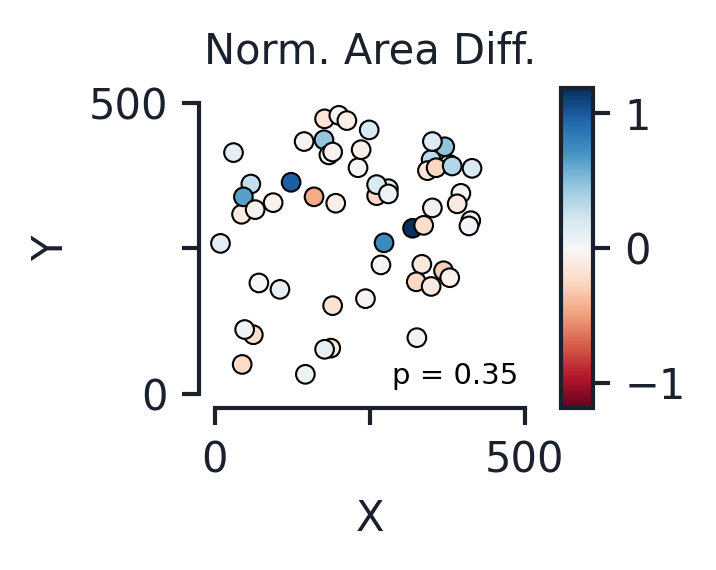

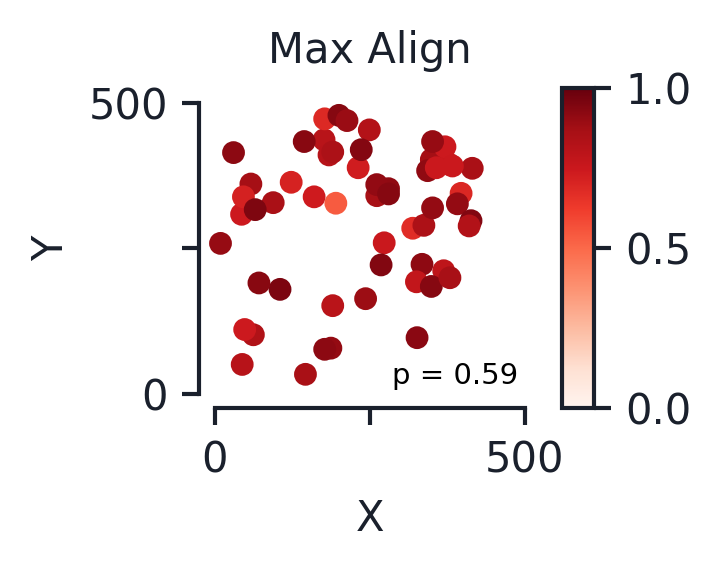

In [ ]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
fig1, ax1 = plt.subplots(1, 1, figsize=(2.5, 2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2.5, 2))

max_diff = np.max(np.abs(area_diffs))
cax1 = ax1.scatter(loc1s[:, 0], loc1s[:, 1], 20,
                  area_diffs, vmin=-max_diff, vmax=max_diff, cmap='RdBu',
                  linewidth=0.5, edgecolor='black')
fig1.colorbar(cax1, ax=ax1, aspect=10)

ax1.set_title('Norm. Area Diff.')

cax2 = ax2.scatter(loc1s[:, 0], loc1s[:, 1], 20,
                  max_aligns, vmin=0, vmax=1.0, cmap='Reds')
fig2.colorbar(cax2, ax=ax2, aspect=10)

ax2.set_title('Max Align')

for ax in (ax1, ax2):
    ax.set_xlabel('X')
    ax.set_ylabel('Y')

    ax.set_xlim((0, 500))
    ax.set_xticks((0, 250, 500))
    ax.set_xticklabels((0, None, 500))

    ax.set_ylim((0, 500))
    ax.set_yticks((0, 250, 500))
    ax.set_yticklabels((0, None, 500))
    jetplot.breathe(ax=ax)

import scipy.stats
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress

n_samples = area_diffs.shape[0]

reg1 = LinearRegression().fit(loc1s, area_diffs)
reg2 = LinearRegression().fit(loc1s, max_aligns)

reg1_null = LinearRegression().fit(np.zeros_like(loc1s), area_diffs)
rss1 = np.sum((area_diffs - reg1.predict(loc1s))**2)
rss1_null = np.sum((area_diffs - reg1_null.predict(loc1s))**2)
F1 = ((rss1_null-rss1)/2)/(rss1/(n_samples-2-1))
p1 = 1-scipy.stats.f.cdf(F1, 2, n_samples-2-1)

reg2_null = LinearRegression().fit(np.zeros_like(loc1s), max_aligns)
rss2 = np.sum((max_aligns - reg2.predict(loc1s))**2)
rss2_null = np.sum((max_aligns - reg2_null.predict(loc1s))**2)
F2 = ((rss2_null-rss2)/2)/(rss2/(n_samples-2-1))
p2 = 1-scipy.stats.f.cdf(F2, 2, n_samples-2-1)

print('Area diff/std(area) fit:', reg1.coef_/np.std(area_diffs))
print('Align/std(align) fit:', reg2.coef_/np.std(max_aligns))

print('Area diff p-value (f-test): {:.2e}'.format(p1))
print('Align p-value (f-test): {:.2e}'.format(p2))

ax1.text(0.75, 0.1, 'p = {:.2f}'.format(p1), 
        horizontalalignment='center', verticalalignment='center', 
        color='k', fontsize=7, transform=ax1.transAxes)

ax2.text(0.75, 0.1, 'p = {:.2f}'.format(p2), 
        horizontalalignment='center', verticalalignment='center', 
        color='k', fontsize=7, transform=ax2.transAxes)

(234.0, 355.0)

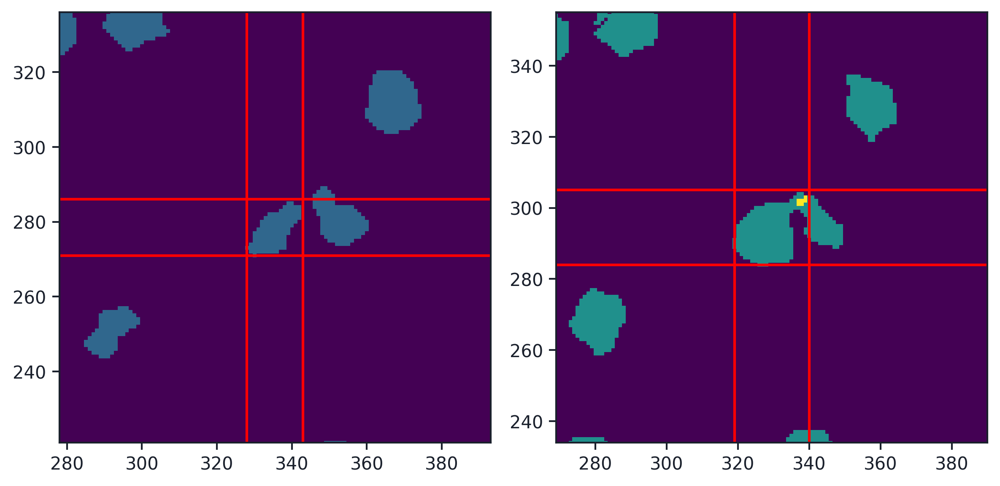

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))

cell_idx = 15

roi0_sum = np.sum(np.array(roi0s), axis=0)
roi1_sum = np.sum(np.array(roi1s), axis=0)

buffer = 50

ax1.imshow(roi0_sum)
ax1.axvline(loc0s[cell_idx][0], color='r')
ax1.axhline(loc0s[cell_idx][1], color='r')
ax1.axvline(loc0s[cell_idx][0]+dim0s[cell_idx][0], color='r')
ax1.axhline(loc0s[cell_idx][1]+dim0s[cell_idx][1], color='r')
ax1.set_xlim((loc0s[cell_idx][0]-buffer, loc0s[cell_idx][0]+dim0s[cell_idx][0]+buffer))
ax1.set_ylim((loc0s[cell_idx][1]-buffer, loc0s[cell_idx][1]+dim0s[cell_idx][1]+buffer))

ax2.imshow(roi1_sum)
ax2.axvline(loc1s[cell_idx][0], color='r')
ax2.axhline(loc1s[cell_idx][1], color='r')
ax2.axvline(loc1s[cell_idx][0]+dim1s[cell_idx][0], color='r')
ax2.axhline(loc1s[cell_idx][1]+dim1s[cell_idx][1], color='r')
ax2.set_xlim((loc1s[cell_idx][0]-buffer, loc1s[cell_idx][0]+dim1s[cell_idx][0]+buffer))
ax2.set_ylim((loc1s[cell_idx][1]-buffer, loc1s[cell_idx][1]+dim1s[cell_idx][1]+buffer))

This code uses some drift quantities. So need to run code in section "Compare Experiment Pairs" for this to work

2
2
(58,)
Left plot - Slope: 1.72e-02 (se: 2.07e-02), r: 0.11 p: 4.08e-01
Right plot - Slope: 8.46e-03 (se: 1.80e-02), r: 0.06 p: 6.40e-01


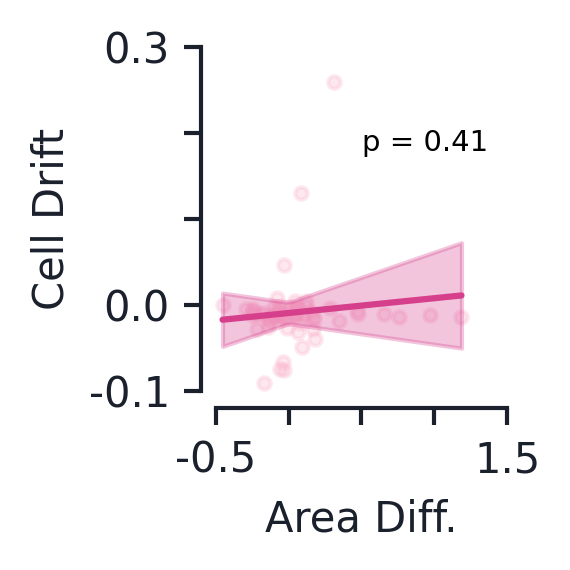

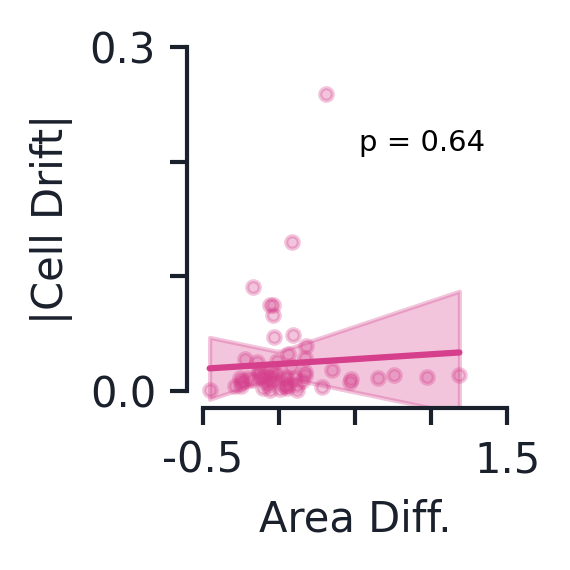

In [ ]:
# Nested list (pair idx, type_idx)
print(len(all_the_metrics_pair['means_pair']))
print(len(all_the_metrics_pair['means_pair'][0]))
print(all_the_metrics_pair['means_pair'][0][0].shape)

type_idx = 0
n_se = 2

signs_vals = ((1, 1,), (1, -1,), (-1, 1,), (-1, -1,))

drift = all_the_metrics_pair['means_pair'][1][type_idx] - all_the_metrics_pair['means_pair'][0][type_idx]

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4))
fig1, ax1 = plt.subplots(1, 1, figsize=(2, 2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2, 2))

ax1.scatter(area_diffs, drift, color=c_vals_l[7], alpha=0.3, marker='.')
reg = linregress(area_diffs, drift)
reg_plot_X = np.linspace(np.min(area_diffs), np.max(area_diffs), num=50)
reg_plot_y = reg.slope * reg_plot_X + reg.intercept
reg_plot_y_vals = np.zeros((4, reg_plot_X.shape[0]))
for idx, signs in enumerate(signs_vals):
    reg_plot_y_vals[idx] = ((reg.slope + signs[0]*n_se* reg.stderr) * reg_plot_X + 
                            (reg.intercept + signs[1]*n_se * reg.intercept_stderr))
reg_plot_min_y = np.min(reg_plot_y_vals, axis=0)
reg_plot_max_y = np.max(reg_plot_y_vals, axis=0)
print('Left plot - Slope: {:.2e} (se: {:.2e}), r: {:.2f} p: {:.2e}'.format(
    reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
ax1.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
            color=c_vals[7], alpha=0.3)
ax1.plot(reg_plot_X, reg_plot_y, color=c_vals[7], 
        label=type_names[type_idx],)

ax1.set_xlabel('Area Diff.')
ax1.set_ylabel('Cell Drift')
ax1.set_xlim((-0.5, 1.25))
ax1.set_xticks((-0.5, 0.0, 0.5, 1.0, 1.5))
ax1.set_xticklabels((-0.5, None, None, None, 1.5))

ax1.set_ylim((-0.1, 0.3))
ax1.set_yticks((-0.1, 0.0, 0.1, 0.2, 0.3))
ax1.set_yticklabels((-0.1, 0.0, None, None, 0.3))

ax1.text(0.7, 0.7, 'p = {:.2f}'.format(reg.pvalue), 
        horizontalalignment='center', verticalalignment='center', 
        color='k', fontsize=7, transform=ax1.transAxes)

jetplot.breathe(ax=ax1)

# ax2.scatter(np.abs(area_diffs), drift, color=c_vals[type_idx], alpha=0.3)
# reg = linregress(np.abs(area_diffs), drift)
# reg_plot_X = np.linspace(np.min(np.abs(area_diffs)), np.max(np.abs(area_diffs)), num=50)
ax2.scatter(area_diffs, np.abs(drift), color=c_vals[7], alpha=0.3, marker='.')
reg = linregress(area_diffs, np.abs(drift))
reg_plot_X = np.linspace(np.min(area_diffs), np.max(area_diffs), num=50)
reg_plot_y = reg.slope * reg_plot_X + reg.intercept
reg_plot_y_vals = np.zeros((4, reg_plot_X.shape[0]))
for idx, signs in enumerate(signs_vals):
    reg_plot_y_vals[idx] = ((reg.slope + signs[0]*n_se* reg.stderr) * reg_plot_X + 
                            (reg.intercept + signs[1]*n_se * reg.intercept_stderr))
reg_plot_min_y = np.min(reg_plot_y_vals, axis=0)
reg_plot_max_y = np.max(reg_plot_y_vals, axis=0)
print('Right plot - Slope: {:.2e} (se: {:.2e}), r: {:.2f} p: {:.2e}'.format(
    reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
ax2.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
            color=c_vals[7], alpha=0.3)
ax2.plot(reg_plot_X, reg_plot_y, color=c_vals[7], 
        label=type_names[type_idx],)

ax2.set_xlabel('Area Diff.')
ax2.set_ylabel('|Cell Drift|')

ax2.set_xlim((-0.5, 1.5))
ax2.set_xticks((-0.5, 0.0, 0.5, 1.0, 1.5))
ax2.set_xticklabels((-0.5, None, None, None, 1.5))

ax2.set_ylim((0.0, 0.3))
ax2.set_yticks((0.0, 0.1, 0.2, 0.3))
ax2.set_yticklabels((0.0, None, None, 0.3))

ax2.text(0.7, 0.7, 'p = {:.2f}'.format(reg.pvalue), 
        horizontalalignment='center', verticalalignment='center', 
        color='k', fontsize=7, transform=ax2.transAxes)

jetplot.breathe(ax=ax2)

Drift fit/std drift: [ 0.00024441 -0.00120477]
Drift fit p-value (f-test): 5.84e-01
|Drift| fit/std drift: [0.00039546 0.00138209]
Drift fit p-value (f-test): 4.12e-01


Text(0.75, 0.1, 'p = 0.41')

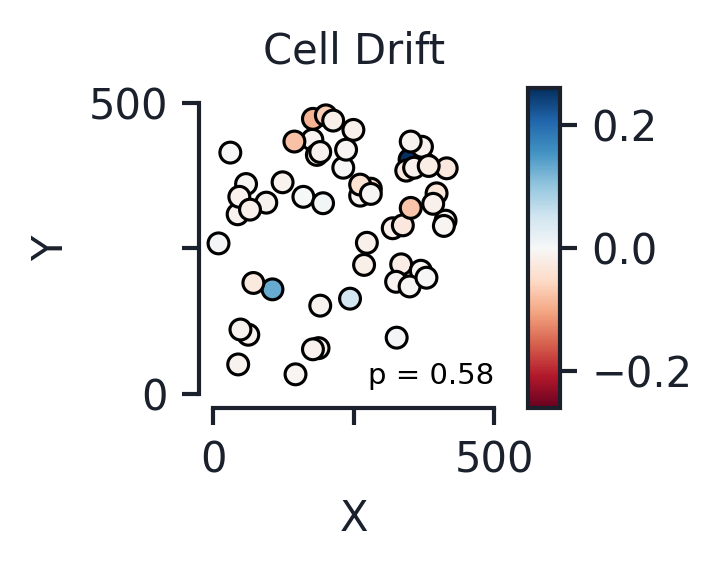

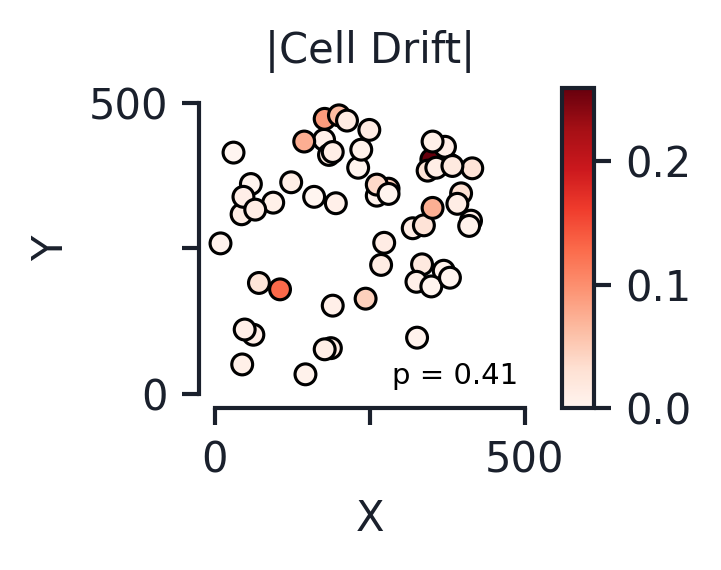

In [ ]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2.5, 2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2.5, 2))

max_drift = np.max(np.abs(drift))
cax1 = ax1.scatter(loc1s[:, 0], loc1s[:, 1], 25, 
                  drift, vmin=-max_drift, vmax=max_drift, cmap='RdBu',
                  linewidth=0.75, edgecolor='black')
fig1.colorbar(cax1, ax=ax1, aspect=10)

reg1 = LinearRegression().fit(loc1s, drift)
reg1_null = LinearRegression().fit(np.zeros_like(loc1s), drift)
rss1 = np.sum((drift - reg1.predict(loc1s))**2)
rss1_null = np.sum((drift - reg1_null.predict(loc1s))**2)
F1 = ((rss1_null-rss1)/2)/(rss1/(n_samples-2-1))
p1 = 1-scipy.stats.f.cdf(F1, 2, n_samples-2-1)

print('Drift fit/std drift:', reg1.coef_/np.std(drift))
print('Drift fit p-value (f-test): {:.2e}'.format(p1))

ax1.set_title('Cell Drift')

cax2 = ax2.scatter(loc1s[:, 0], loc1s[:, 1], 25, 
                  np.abs(drift), vmin=0, vmax=max_drift, cmap='Reds',
                  linewidth=0.75, edgecolor='black')
fig2.colorbar(cax2, ax=ax2, aspect=10)

reg2 = LinearRegression().fit(loc1s, np.abs(drift))
reg2_null = LinearRegression().fit(np.zeros_like(loc1s), np.abs(drift))
rss2 = np.sum((np.abs(drift) - reg2.predict(loc1s))**2)
rss2_null = np.sum((np.abs(drift) - reg2_null.predict(loc1s))**2)
F2 = ((rss2_null-rss2)/2)/(rss2/(n_samples-2-1))
p2 = 1-scipy.stats.f.cdf(F2, 2, n_samples-2-1)

print('|Drift| fit/std drift:', reg2.coef_/np.std(np.abs(drift)))
print('Drift fit p-value (f-test): {:.2e}'.format(p2))

ax2.set_title('|Cell Drift|')

for ax in (ax1, ax2):
    ax.set_xlabel('X')
    ax.set_ylabel('Y')

    ax.set_xlim((0, 500))
    ax.set_xticks((0, 250, 500))
    ax.set_xticklabels((0, None, 500))

    ax.set_ylim((0, 500))
    ax.set_yticks((0, 250, 500))
    ax.set_yticklabels((0, None, 500))
    jetplot.breathe(ax=ax)

ax1.text(0.75, 0.1, 'p = {:.2f}'.format(p1), 
        horizontalalignment='center', verticalalignment='center', 
        color='k', fontsize=7, transform=ax1.transAxes)

ax2.text(0.75, 0.1, 'p = {:.2f}'.format(p2), 
        horizontalalignment='center', verticalalignment='center', 
        color='k', fontsize=7, transform=ax2.transAxes)

#### Checks on Behavioral Data

This code builds behavior metrics and dff values for all experiments. This is used to either gather behavior metrics directly from the data or load them from saved files. 

Note that this doesn't actually load dff_vals_experiments for comparison below, this needs to be loaded in the usual way since it needs to account for multiplane data.

In [70]:
def save_behavioral_data(root_path, experiment_id, speeds_experiment, 
                         pupil_area_experiment, eye_pos_experiment):

    path = root_path + 'behavioral_data_behaveid_{}.pickle'.format(str(experiment_id))
    save_the_file = True

    if os.path.exists(path):
        print('File already exists at:', path)
        override = input('Override? (Y/N):')
        if override == 'Y':
            save_the_file = True
        else:
            save_the_file = False

    if save_the_file:
        print('Saving behavioral for behave_id: {}'.format(experiment_id))
        with open(path, 'wb') as save_file:
            # Variance explained plots
            pickle.dump(speeds_experiment, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(pupil_area_experiment, save_file, protocol=pickle.HIGHEST_PROTOCOL)
            pickle.dump(eye_pos_experiment, save_file, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        print('Data Not Saved')

def load_behavioral_data(root_path, experiment_id):
    
    path = root_path + 'behavioral_data_behaveid_{}.pickle'.format(str(experiment_id))

    if os.path.exists(path):
        print('Loading behavioral data for behave_id: {}'.format(experiment_id))
        with open(path, 'rb') as load_file:
            speeds_experiment = pickle.load(load_file)
            pupil_area_experiment = pickle.load(load_file)
            eye_pos_experiment = pickle.load(load_file)
        return speeds_experiment, pupil_area_experiment, eye_pos_experiment
    else:
        raise ValueError('No file at path:', path)

def get_behavioral_summary(behavior_session, experiment_session, start_time, end_time, behavior_specs):
    """ 
    For a given start and end time, return the desired behavioral quantities.

    experiment_session is only used if eye data is needed
    """

    running_sample = behavior_session.running_speed.query(
        'timestamps >= {} and timestamps <= {} '.format(start_time, end_time))
    
    if behavior_specs['eye_data']:
        eye_data = experiment_session.eye_tracking.query(
            'timestamps >= {} and timestamps <= {} '.format(start_time, end_time)
        )   
        
        return (running_sample['timestamps'], running_sample['speed'], eye_data['timestamps'],
                eye_data['eye_center_x'], eye_data['eye_center_y'], eye_data['pupil_area'])

    else:
        return running_sample['timestamps'], running_sample['speed']

root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/'
# root_path = '/content/drive/MyDrive/neuro_research/'

load_summary_data = True
load_behave_data = True
save_behave_data = False

behavior_specs = {
    'rel_time_start': 0.150, #0.150,
    'rel_time_end': 0.750, #0.750,
    # The following are not used in getting behavioral data, but are needed to load correct files
    'summary_value': 'mean', # 'max' or 'mean' or 'bin'
    'engaged_filter': True,
    'get_no_changes': True, # No change data
    'eye_data': True, 
}

# dff_vals_experiments = []
speeds_experiments = []
pupil_area_experiments = []
eye_pos_experiments = []

behave_idx = -1 # Iterates below
ed_idx = 0
for mouse_idx, mouse_id in enumerate(mouse_ids):
    for session_type in session_types:
        behave_idx += 1 # Note this only iterates twice per mouse, this is for keeping track of behavior idx
        # For multiplane data, takes experiment id to be the first out of the experiments
        experiment_id = mice_experiments[mouse_id][session_type][0]
        behavior_id = behavior_ids[behave_idx]

        behavior_specs['experiment_id'] = experiment_id

        print('---- Behave idx: {} ----'.format(behave_idx))

        speeds_experiment = []
        pupil_area_experiment = []
        eye_pos_experiment = []

        # Load in the engaged trial ids and dff values (for multiplane, loads
        # first experiment)
        if load_summary_data:
            save_string = get_save_string_summary(behavior_specs)
            path = root_path + save_string + '.pickle'
            
            if os.path.exists(path):
                print('Loading from path:', path)
                _, _, _, engage_filters_load, _ = load_data_summary(root_path, behavior_specs)
                eng_trial_ids, not_eng_trial_ids = engage_filters_load
            else:
                print('Loaded data not found at: ', path)
        else:
            raise NotImplementedError()

        if load_behave_data:
            speeds_experiment, pupil_area_experiment, eye_pos_experiment = load_behavioral_data(root_path, behavior_id)
        else: 
            behavior_session = cache.get_behavior_session(behavior_id)
            experiment_dataset = experiment_datasets[ed_idx]
        
            for type_idx in range(2): # Iterates over hits and misses

                mean_speeds_exp_type = []
                mean_pupil_area_exp_type = []
                mean_eye_pos_exp_type = []

                query_string = 'trials_id in @eng_trial_ids[{}]'.format(type_idx)
                for trial_idx, (_, trial) in enumerate(behavior_session.trials.query(
                    query_string).iterrows()):

                    start_time = float(trial['change_time']) + behavior_specs['rel_time_start']
                    end_time = float(trial['change_time']) + behavior_specs['rel_time_end']

                    behavior_outs = get_behavioral_summary(behavior_session, experiment_dataset, start_time, end_time, behavior_specs)

                    (speed_timestamps_trial, speeds_trial, eye_timestamps_trial,
                        eye_pos_x_trial, eye_pos_y_trial, pupil_area_trial) = behavior_outs

                    mean_pupil_area_exp_type.append(np.mean(np.array(pupil_area_trial)))
                    mean_eye_pos_exp_type.append(np.mean(np.array((eye_pos_x_trial, eye_pos_y_trial)), axis=-1))
                    mean_speeds_exp_type.append(np.mean(np.array(speeds_trial)))

                assert len(eng_trial_ids[type_idx]) == len(mean_speeds_exp_type)
                assert len(eng_trial_ids[type_idx]) == len(mean_pupil_area_exp_type)
                assert len(eng_trial_ids[type_idx]) == len(mean_eye_pos_exp_type)
                speeds_experiment.append(np.array(mean_speeds_exp_type))
                pupil_area_experiment.append(np.array(mean_pupil_area_exp_type))
                eye_pos_experiment.append(np.array(mean_eye_pos_exp_type))

            if save_behave_data:
                save_behavioral_data(root_path, behavior_id, speeds_experiment, 
                            pupil_area_experiment, eye_pos_experiment)

        speeds_experiments.append(speeds_experiment)
        pupil_area_experiments.append(pupil_area_experiment)
        eye_pos_experiments.append(eye_pos_experiment)

        # Iterates experiment idx accoring to how many experiment ids were in list
        ed_idx += len(mice_experiments[mouse_id][session_type])

---- Behave idx: 0 ----
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_808619543_engaged_150to750ms_nochange.pickle
Loading behavioral data for behave_id: 808324301
---- Behave idx: 1 ----
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_813083478_engaged_150to750ms_nochange.pickle
Loading behavioral data for behave_id: 812955256
---- Behave idx: 2 ----
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_808621034_engaged_150to750ms_nochange.pickle
Loading behavioral data for behave_id: 808432167
---- Behave idx: 3 ----
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_809501118_engaged_150to750ms_nochange.pickle
Loading behavioral data for behave_id: 809427293
---- Behave idx: 4 ----
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/me

For the above loaded data, gets all the p-values for the various fits and also trains the SVC to distinguish sessions

In [71]:
import scipy.stats
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress

from sklearn import svm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold

def regress_and_plot_1d(x, y, ax, color_idx, label):

    signs_vals = ((1, 1,), (1, -1,), (-1, 1,), (-1, -1,))
    n_se = 1.97
    
    # Mask for nan values
    nan_mask = np.logical_not(np.isnan(x))
    if not nan_mask.all():
        print('  1d regress - Using nan mask')
        x = x[nan_mask]
        y = y[nan_mask]

    ax.scatter(x, y, color=c_vals[color_idx], zorder=0, marker='.')

    reg = linregress(x, y)
    reg_plot_X = np.linspace(np.min(x), np.max(x), num=50)
    reg_plot_y = reg.slope * reg_plot_X + reg.intercept
    reg_plot_y_vals = np.zeros((4, reg_plot_X.shape[0]))
    for idx, signs in enumerate(signs_vals):
        reg_plot_y_vals[idx] = ((reg.slope + signs[0]*n_se* reg.stderr) * reg_plot_X + 
                                (reg.intercept + signs[1]*n_se * reg.intercept_stderr))
    reg_plot_min_y = np.min(reg_plot_y_vals, axis=0)
    reg_plot_max_y = np.max(reg_plot_y_vals, axis=0)
    print('  1d regress - Slope: {:.2e} (se: {:.2e}), r: {:.2f} p: {:.2e}'.format(
        reg.slope, reg.stderr, reg.rvalue, reg.pvalue))
    ax.fill_between(reg_plot_X, reg_plot_min_y, reg_plot_max_y, 
                color=c_vals[color_idx], alpha=0.3, zorder=-5)
    ax.plot(reg_plot_X, reg_plot_y, color=c_vals_d[color_idx], 
            label=label, zorder=5)
    
    return reg.pvalue
    
def regress_multid(x, y):
    """
    x shape: (n_samples, n_features)
    y shape: (n_samples,)
    """
    
    # Mask for nan values
    nan_full = np.logical_not(np.isnan(x))
    if not nan_full.all():
        # print('  multi-d regress - Using nan mask')
        nan_mask = np.all(nan_full, axis=-1) # Mask over samples
        x = x[nan_mask, :]
        y = y[nan_mask]

    assert x.shape[0] == y.shape[0]
    n_samples = x.shape[0]

    reg = LinearRegression().fit(x, y)
    reg_null = LinearRegression().fit(np.zeros_like(x), y)
    rss = np.sum((y - reg.predict(x))**2)
    rss_null = np.sum((y - reg_null.predict(x))**2)
    F = ((rss_null-rss)/2)/(rss/(n_samples-2-1))
    p = 1-scipy.stats.f.cdf(F, 2, n_samples-2-1)

    return reg, p

In [72]:
type_names = ('Hit', 'Miss')

if len(dff_vals_experiments) != len(speeds_experiments):
    raise ValueError('Dff values and behavior data do not match, did you forget to run multiclass part?')

n_exps = len(dff_vals_experiments)
n_pairs = len(dff_vals_experiments)//2
n_types = 2

# This will catch if multiplane data hasn't been correctly processed
assert n_pairs == len(mouse_ids)

speed_ps = np.zeros((n_exps, n_types,))
pupil_area_ps = np.zeros((n_exps, n_types,))
eye_loc_ps = np.zeros((n_exps, n_types,))
all_behave_ps = np.zeros((n_exps, n_types,))

drift_mag_ps = np.zeros((n_types,))

# For SVC test
n_folds = 10
n_trials = 10
mean_behaves = np.zeros((n_exps, 4,))
behave_labels = np.zeros((n_exps,), dtype=np.int32)

behavior_pair_diffs = np.zeros((n_pairs, 4,)) # Running speed, pupial area, x eye loc, y eye loc 
behavior_pair_diffs_norm = np.zeros((n_pairs, 4,)) # Running speed, pupial area, x eye loc, y eye loc 

for pairs_idx in range(n_pairs):
    exp_idxs = [2*pairs_idx, 2*pairs_idx+1]
    for exp_idx in exp_idxs: # Individual experiment measures
        for type_idx in range(n_types): # Hit/Miss
            dff_mags = np.linalg.norm(dff_vals_experiments[exp_idx][type_idx], axis=-1)
            
            _, speed_ps[exp_idx, type_idx] = regress_multid(speeds_experiments[exp_idx][type_idx][:, np.newaxis], dff_mags)

            _, pupil_area_ps[exp_idx, type_idx] = regress_multid(pupil_area_experiments[exp_idx][type_idx][:, np.newaxis], dff_mags)

            _, eye_loc_ps[exp_idx, type_idx] = regress_multid(eye_pos_experiments[exp_idx][type_idx], dff_mags)

            # Concatanate everything together
            behave_matrix = np.concatenate((
                speeds_experiments[exp_idx][type_idx][:, np.newaxis],
                pupil_area_experiments[exp_idx][type_idx][:, np.newaxis],
                eye_pos_experiments[exp_idx][type_idx]
            ), axis=-1)

            _, all_behave_ps[exp_idx, type_idx] = regress_multid(behave_matrix, dff_mags)

        # For paired measures (merges types before averages
        eye_pos_full = np.concatenate(eye_pos_experiments[exp_idx], axis=0)
        mean_behaves[exp_idx] = (
            np.nanmean(np.concatenate(speeds_experiments[exp_idx], axis=0), axis=0),
            np.nanmean(np.concatenate(pupil_area_experiments[exp_idx], axis=0), axis=0),
            np.nanmean(eye_pos_full[:, 0], axis=0),
            np.nanmean(eye_pos_full[:, 1], axis=0),
        )
        behave_labels[exp_idx] = exp_idx % 2

    behavior_pair_diffs[pairs_idx] = (mean_behaves[exp_idxs[1]] - mean_behaves[exp_idxs[0]])

    behavior_pair_diffs_norm[pairs_idx] = behavior_pair_diffs[pairs_idx] / (
        np.mean(np.abs(mean_behaves[exp_idxs]), axis=0)
    )

for type_idx in range(n_types): # Hit/Miss
    _, drift_mag_ps[type_idx] = regress_multid(
        behavior_pair_diffs, drift_distance_ratio[:, type_idx])

    print('Delta B vs. drift mag - type {}: {:.3f}'.format(
        type_idx, drift_mag_ps[type_idx]
    ) )

print(np.mean(behavior_pair_diffs, axis=0))

# accs = np.zeros((n_trials, n_folds,))

# for trial_idx in range(n_trials):
#     # Shuffle the classification data
#     arr_idxs = np.arange(n_exps)
#     np.random.shuffle(arr_idxs)
#     X_data = mean_behaves[arr_idxs]
#     y_labels = behave_labels[arr_idxs]

#     kf = KFold(n_splits=n_folds)

#     for fold_idx, (train_index, test_index) in enumerate(kf.split(X_data)):
#         X_train, X_test = X_data[train_index], X_data[test_index]
#         y_train, y_test = y_labels[train_index], y_labels[test_index]

#         # SVC classifier
#         clf = svm.LinearSVC(max_iter=1000000)
#         # clf = svm.LinearSVC(class_weight='balanced', fit_intercept=True, max_iter=10000000)

#         clf.fit(X_train, y_train)
#         y_pred = clf.predict(X_test)
#         accs[trial_idx, fold_idx] = np.sum(y_pred == y_test) / y_test.shape[0]

# print('SVC acc: {:.3f} (std: {:.3f})'.format(
#     np.mean(accs), np.std(accs)/np.sqrt(n_trials*n_folds)
# ))

Delta B vs. drift mag - type 0: 0.201
Delta B vs. drift mag - type 1: 0.261
[ 7.31867014e-03  7.21932265e+01 -9.78464831e+00  4.22561289e+00]


In [ ]:
print('SVC acc: {:.3f} (std: {:.3f})'.format(
    np.mean(accs), np.std(accs)/np.sqrt(n_trials*n_folds)
))

SVC acc: 0.473 (std: 0.020)


Bins: [0.001      0.00143845 0.00206914 0.00297635 0.00428133 0.00615848
 0.00885867 0.01274275 0.01832981 0.02636651 0.0379269  0.05455595
 0.078476   0.11288379 0.16237767 0.23357215 0.33598183 0.48329302
 0.6951928  1.        ]
  1d regress - Slope: 1.36e-02 (se: 1.76e-02), r: 0.17 p: 4.49e-01
  1d regress - Slope: 1.63e-02 (se: 3.58e-02), r: 0.10 p: 6.53e-01


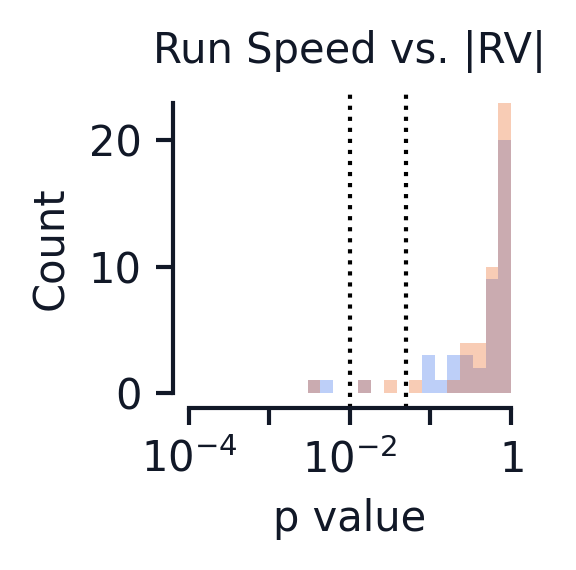

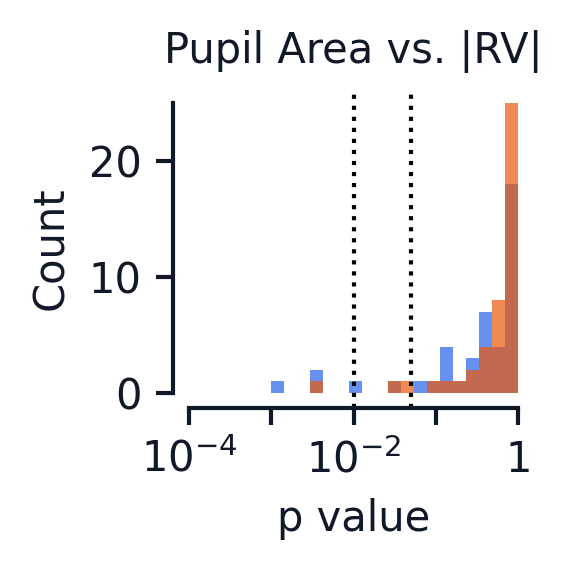

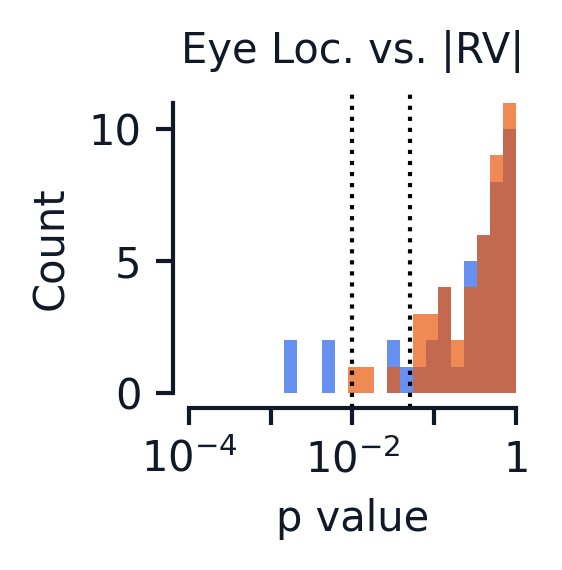

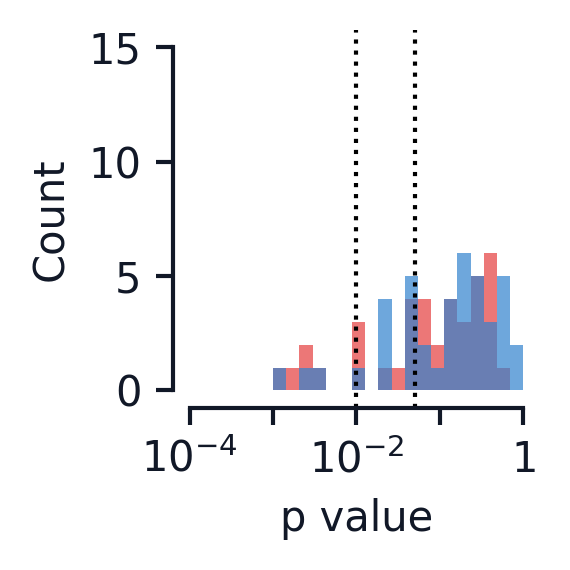

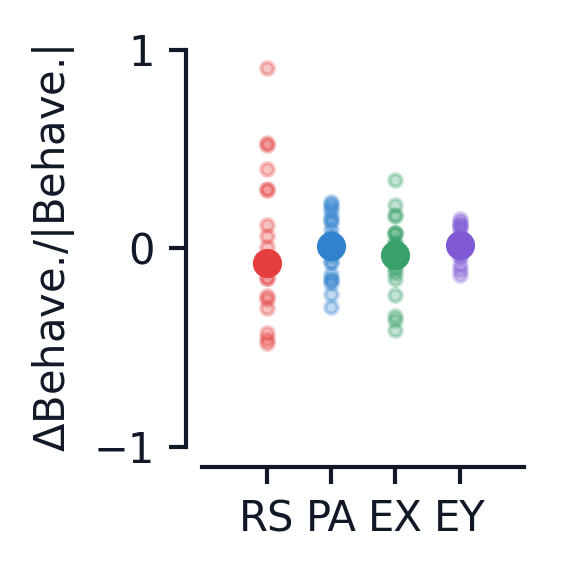

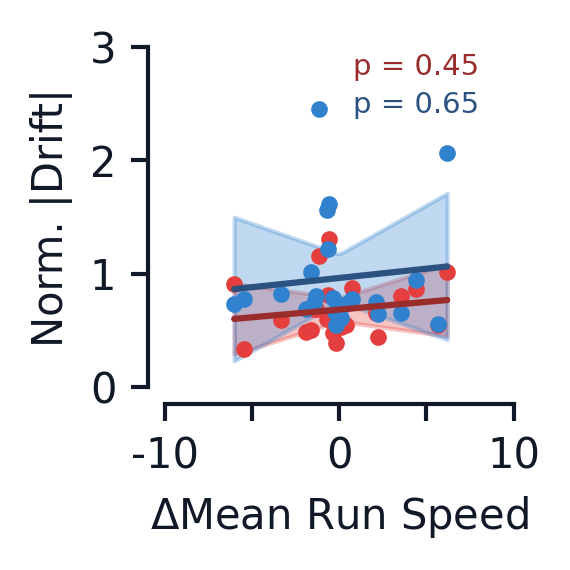

In [74]:
fig1, ax1 = plt.subplots(1, 1, figsize=(2,2))
fig2, ax2 = plt.subplots(1, 1, figsize=(2,2))
fig3, ax3 = plt.subplots(1, 1, figsize=(2,2))
fig4, ax4 = plt.subplots(1, 1, figsize=(2,2))

fig5, ax5 = plt.subplots(1, 1, figsize=(2,2))
fig6, ax6 = plt.subplots(1, 1, figsize=(2,2))

bins = 10**(np.linspace(-3, 0, 20))
print('Bins:', bins)

# bar_colors = [c_vals[3] if len(ps) == 1 else c_vals_l[3] for ps in p1s]

for type_idx in range(2):
    ax1.hist(speed_ps[:, type_idx], bins=bins, alpha=0.3, stacked=True)
    ax1.set_xscale('log')
    ax1.set_title('Run Speed vs. |RV|')

    ax2.hist(pupil_area_ps[:, type_idx], bins=bins, alpha=0.7, stacked=True)
    ax2.set_xscale('log')
    ax2.set_title('Pupil Area vs. |RV|')

    ax3.hist(eye_loc_ps[:, type_idx], bins=bins, alpha=0.7, stacked=True)
    ax3.set_xscale('log')
    ax3.set_title('Eye Loc. vs. |RV|')

    ax4.hist(all_behave_ps[:, type_idx], bins=bins, alpha=0.7, stacked=True,
             color=c_vals[type_idx])
    ax4.set_xscale('log')
    # ax4.set_title('Behavior vs. |RV|')

ax4.set_ylim((0, 15))
ax4.set_yticks((0, 5, 10, 15))

for ax in (ax1, ax2, ax3, ax4,):
    ax.axvline(0.05, color='k', linestyle='dotted', linewidth=1.0)
    ax.axvline(0.01, color='k', linestyle='dotted', linewidth=1.0)
    ax.set_xlabel('p value')
    ax.set_ylabel('Count')
    
    ax.set_xlim((0.0001, 1.0))
    ax.set_xticks((1e-4, 1e-3, 1e-2, 1e-1, 1e0))
    ax.set_xticklabels(('$10^{-4}$', None, '$10^{-2}$', None, '$1$'))

    # jetplot.breathe(ax=ax)

for behave_idx in range(behavior_pair_diffs_norm.shape[-1]):

    ax5.scatter(behave_idx * np.ones_like(behavior_pair_diffs_norm[:, behave_idx]),
                behavior_pair_diffs_norm[:, behave_idx], marker='.',
                color=c_vals[behave_idx], zorder=-1, alpha=0.3)
    ax5.scatter(behave_idx,
                np.mean(behavior_pair_diffs_norm[:, behave_idx]),
                color=c_vals[behave_idx], zorder=1, marker='o')
    

ax5.set_xlim((-1, 4))
ax5.set_xticks((0, 1, 2, 3))
ax5.set_xticklabels(('RS', 'PA', 'EX', 'EY'))

ax5.set_ylabel('$\Delta$Behave./|Behave.|')
ax5.set_ylim((-1, 1))
ax5.set_yticks((-1, 0, 1))

# Change in run speed versus drift magnitude
for type_idx in range(n_types): # Hit/Miss
    p_val = regress_and_plot_1d(behavior_pair_diffs[:, 0], drift_distance_ratio[:, type_idx],
                                ax6, type_idx, '')
    ax6.text(0.7, 0.9-type_idx*0.1, 'p = {:.2f}'.format(p_val), 
        horizontalalignment='center', verticalalignment='center', 
        color=c_vals_d[type_idx], fontsize=7, transform=ax6.transAxes)
    
ax6.set_xlabel('$\Delta$Mean Run Speed')
ax6.set_ylabel('Norm. |Drift|')

ax6.set_xlim((-10, 10))
ax6.set_xticks((-10, -5, 0, 5, 10))
ax6.set_xticklabels((-10, None, 0, None, 10))
ax6.set_ylim((0, 3.0))
ax6.set_yticks((0, 1, 2, 3))


for ax in (ax1, ax2, ax3, ax4, ax5, ax6):
    jetplot.breathe(ax=ax)

This gets behavioral summary and plots a lot of stuff. Good for visualization of a single mouse, but not used to process lots of mice data at once.

In [82]:
print(behavior_ids)
ed_idx = 0
behavior_session = cache.get_behavior_session(behavior_ids[ed_idx])
print(behavior_session.list_data_attributes_and_methods())

root_path = '/content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/'
# root_path = '/content/drive/MyDrive/neuro_research/'

plot_data = True

load_summary_data = True
load_behavioral_data = True
save_behavioral_data = False

behavior_specs = {
    'rel_time_start': 0.150, #0.150,
    'rel_time_end': 0.750, #0.750,
    # The following are not used in getting behavioral data, but are needed to load correct files
    'summary_value': 'mean', # 'max' or 'mean' or 'bin'
    'engaged_filter': True,
    'get_no_changes': False, # No change data
    'eye_data': True, 
}

dff_vals_experiments = []
speeds_experiments = []
pupil_area_experiments = []
eye_pos_experiments = []

# for ed_idx in range(len(experiment_ids)):

speeds_experiment = []
pupil_area_experiment = []
eye_pos_experiment = []

# These are all gathered over hits and misses
speed_timestamps_exp = []
eye_timestamps_exp = []
speeds_exp = []
pupil_area_exp = []
eye_pos_exp = []
# Mean quantities over response windows
mean_speed_timestamps_exp = []
mean_eye_timestamps_exp = []
mean_speeds_exp = [] # Mean speed over each response window
mean_pupil_area_exp = []
mean_eye_pos_exp = []

behavior_specs['experiment_id'] = experiment_ids[ed_idx]
behavior_session = cache.get_behavior_session(behavior_ids[ed_idx])

# Load in the engaged trial ids and dff values
if load_summary_data:
    save_string = get_save_string_summary(behavior_specs)
    path = root_path + save_string + '.pickle'
    
    if os.path.exists(path):
        print('Loading from path:', path)
        dff_values_load, _, _, engage_filters_load = load_data_summary(root_path, behavior_specs)
        dff_vals_experiments.append(dff_values_load)
        eng_trial_ids, not_eng_trial_ids = engage_filters_load
    else:
        print('Loaded data not found at: ', path)
else:
    experiment_dataset = experiment_datasets[ed_idx]
    eng_trial_ids, not_eng_trial_ids, trial_ids = get_engaged_trials(experiment_dataset)
    raise ValueError('This wont load in dff summaries.')

if behavior_specs['eye_data']: # Need to load in experimental data in this case
    experiment_dataset = experiment_datasets[ed_idx]
else:
    experiment_dataset = None


for type_idx in range(2): # Iterates over hits and misses

    mean_speeds_exp_type = []
    mean_pupil_area_exp_type = []
    mean_eye_pos_exp_type = []

    query_string = 'trials_id in @eng_trial_ids[{}]'.format(type_idx)
    for trial_idx, (_, trial) in enumerate(behavior_session.trials.query(
        query_string).iterrows()):

        start_time = float(trial['change_time']) + behavior_specs['rel_time_start']
        end_time = float(trial['change_time']) + behavior_specs['rel_time_end']

        behavior_outs = get_behavioral_summary(behavior_session, experiment_dataset, start_time, end_time, behavior_specs)
        if behavior_specs['eye_data']:
            (speed_timestamps_trial, speeds_trial, eye_timestamps_trial,
                eye_pos_x_trial, eye_pos_y_trial, pupil_area_trial) = behavior_outs
        
            eye_timestamps_exp.append(np.array(eye_timestamps_trial))
            pupil_area_exp.append(np.array(pupil_area_trial))
            eye_pos_exp.append(np.array((eye_pos_x_trial, eye_pos_y_trial)))

            mean_eye_timestamps_exp.append(np.mean(np.array(eye_timestamps_trial)))
            mean_pupil_area_exp.append(np.mean(np.array(pupil_area_trial)))
            mean_eye_pos_exp.append(np.mean(np.array((eye_pos_x_trial, eye_pos_y_trial)), axis=-1))

            mean_pupil_area_exp_type.append(np.mean(np.array(pupil_area_trial)))
            mean_eye_pos_exp_type.append(np.mean(np.array((eye_pos_x_trial, eye_pos_y_trial)), axis=-1))

        else:
            speed_timestamps_trial, speeds_trial = behavior_outs

        speed_timestamps_exp.append(np.array(speed_timestamps_trial))
        speeds_exp.append(np.array(speeds_trial))
        mean_speed_timestamps_exp.append(np.mean(np.array(speed_timestamps_trial)))
        mean_speeds_exp.append(np.mean(np.array(speeds_trial)))
        # This si what is actually passed on for further analysis
        mean_speeds_exp_type.append(np.mean(np.array(speeds_trial)))

    assert len(eng_trial_ids[type_idx]) == len(mean_speeds_exp_type)
    if behavior_specs['eye_data']:
        assert len(eng_trial_ids[type_idx]) == len(mean_pupil_area_exp_type)
        assert len(eng_trial_ids[type_idx]) == len(mean_eye_pos_exp_type)
        pupil_area_experiment.append(np.array(mean_pupil_area_exp_type))
        eye_pos_experiment.append(np.array(mean_eye_pos_exp_type))
    speeds_experiment.append(np.array(mean_speeds_exp_type))

speed_timestamps_exp = np.concatenate(speed_timestamps_exp)
speeds_exp = np.concatenate(speeds_exp)

speeds_experiments.append(speeds_experiment)

print('Engaged trials\n  Run speed - mean: {:.3f}, std: {:.3f}'.format(np.mean(speeds_exp), np.std(speeds_exp)))
if behavior_specs['eye_data']:
    eye_timestamps_exp = np.concatenate(eye_timestamps_exp)
    pupil_area_exp = np.concatenate(pupil_area_exp)
    eye_pos_exp = np.concatenate(eye_pos_exp, axis=-1).T

    pupil_area_experiments.append(pupil_area_experiment)
    eye_pos_experiments.append(eye_pos_experiment)

    print('  Pupil area - mean: {:.3f}, std: {:.3f}'.format(np.mean(pupil_area_exp), np.std(pupil_area_exp)))
    print('  Eye pos - x mean: {:.3f}, x std: {:.3f}, y mean: {:.3f}, y std: {:.3f}'.format(
        np.mean(eye_pos_exp[:, 0]), np.std(eye_pos_exp[:, 0]), np.mean(eye_pos_exp[:, 1]), np.std(eye_pos_exp[:, 1])))

print('Engaged trials (avg over response window)\n  Run speed - mean: {:.3f}, std: {:.3f}'.format(np.mean(mean_speeds_exp), np.std(mean_speeds_exp)))

if behavior_specs['eye_data']:
    print('  Pupil area - mean: {:.3f}, std: {:.3f}'.format(np.mean(mean_pupil_area_exp), np.std(mean_pupil_area_exp)))
    mean_eye_pos_exp = np.array(mean_eye_pos_exp) 
    print('  Eye pos - x mean: {:.3f}, x std: {:.3f}, y mean: {:.3f}, y std: {:.3f}'.format(
        np.mean(mean_eye_pos_exp[:, 0]), np.std(mean_eye_pos_exp[:, 0]), np.mean(mean_eye_pos_exp[:, 1]), np.std(mean_eye_pos_exp[:, 1])))

running_sample = behavior_session.running_speed

print('Full session\n  Run speed - mean: {:.3f}, std: {:.3f}'.format(np.mean(running_sample['speed']), np.std(running_sample['speed'])))

[1047986643, 1050263298]
['behavior_session_id', 'eye_tracking', 'eye_tracking_rig_geometry', 'get_performance_metrics', 'get_reward_rate', 'get_rolling_performance_df', 'licks', 'metadata', 'raw_running_speed', 'rewards', 'running_speed', 'stimulus_presentations', 'stimulus_templates', 'stimulus_timestamps', 'task_parameters', 'trials']
Loading from path: /content/drive/MyDrive/neuro_research/visual_change_drift/summary_data/mean_summary_1048044013_engaged_150to750ms.pickle
Engaged trials
  Run speed - mean: 14.643, std: 13.271
  Pupil area - mean: 5218.203, std: 463.082
  Eye pos - x mean: 410.808, x std: 1.452, y mean: 198.001, y std: 1.715
Engaged trials (avg over response window)
  Run speed - mean: 14.643, std: 10.723
  Pupil area - mean: 5218.446, std: 436.560
  Eye pos - x mean: 410.808, x std: 0.926, y mean: 198.001, y std: 1.040
Full session
  Run speed - mean: 20.132, std: 19.636


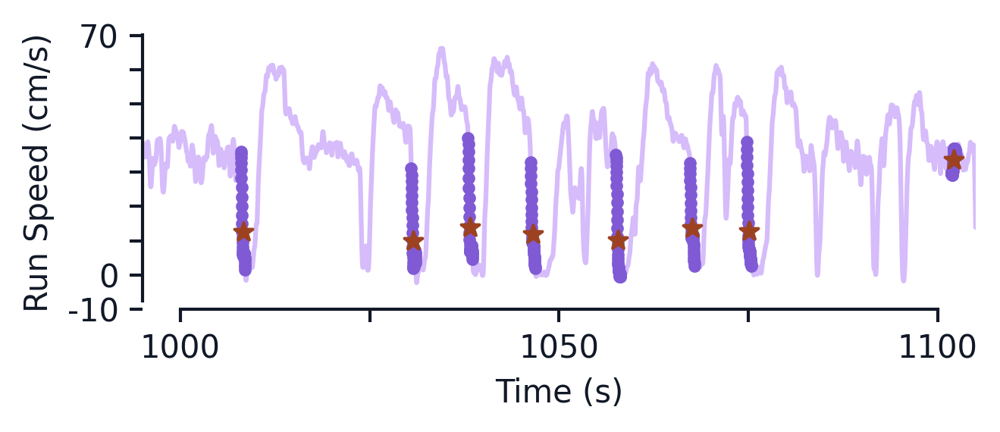

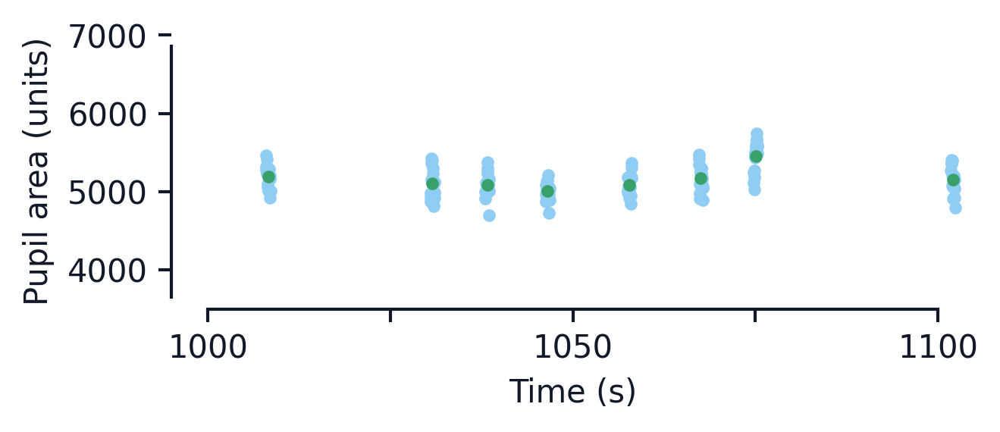

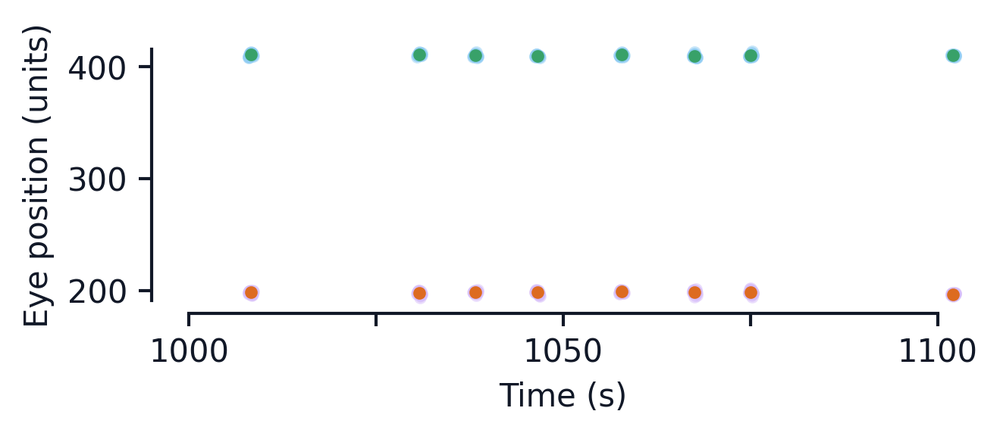

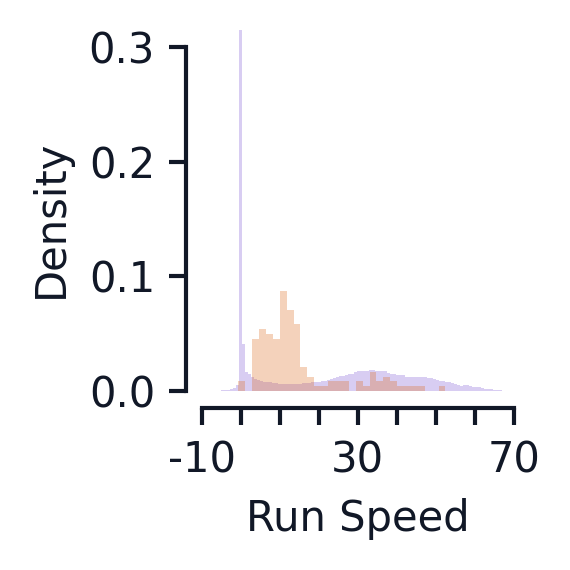

In [94]:
if behavior_specs['eye_data']:
    fig1, ax1 = plt.subplots(1, 1, figsize=(4.5, 2))
    fig2, ax2 = plt.subplots(1, 1, figsize=(4.5, 2))
    fig3, ax3 = plt.subplots(1, 1, figsize=(4.5, 2))
    axs = (ax1, ax2, ax3,)
else:   
    fig, ax1 = plt.subplots(1, 1, figsize=(12,6))
    axs = (ax1,)

ax1.plot(running_sample['timestamps'], running_sample['speed'], color=c_vals_l[3], zorder=0)
ax1.scatter(speed_timestamps_exp, speeds_exp, color=c_vals[3], zorder=1, marker='.')
ax1.scatter(mean_speed_timestamps_exp, mean_speeds_exp, color=c_vals_d[4], zorder=2, marker='*')
ax1.set_ylabel('Running Speed (cm/s)')

if behavior_specs['eye_data']:
    ax2.scatter(eye_timestamps_exp, pupil_area_exp, color=c_vals_l[1], zorder=1, marker='.')
    ax2.scatter(mean_eye_timestamps_exp, mean_pupil_area_exp, color=c_vals[2], zorder=2, marker='.')
    ax2.set_ylabel('Pupil area (units)')
    
    ax3.scatter(eye_timestamps_exp, eye_pos_exp[:, 0], color=c_vals_l[1], zorder=1, marker='.', alpha=0.5)
    ax3.scatter(np.array(mean_eye_timestamps_exp), mean_eye_pos_exp[:, 0], color=c_vals[2], zorder=2, marker='.')
    ax3.scatter(eye_timestamps_exp, eye_pos_exp[:, 1], color=c_vals_l[3], zorder=1, marker='.', alpha=0.5)
    ax3.scatter(np.array(mean_eye_timestamps_exp), mean_eye_pos_exp[:, 1], color=c_vals[4], zorder=2, marker='.')
    ax3.set_ylabel('Eye position (units)')

for ax in axs:
    ax.set_xlim((1000, 1100))
    ax.set_xlabel('Time (s)')
    ax.set_xticks((1000, 1025, 1050, 1075, 1100,))
    ax.set_xticklabels((1000, None, 1050, None, 1100))

    jetplot.breathe(ax=ax)

ax1.set_ylabel('Run Speed (cm/s)')
ax1.set_ylim((-10, 70))
ax1.set_yticks((-10, 0, 10, 20, 30, 40, 50, 60, 70))
ax1.set_yticklabels((-10, 0, None, None, None, None, None, None, 70))

fig4, ax4 = plt.subplots(1, 1, figsize=(2,2))

ax4.hist(running_sample['speed'], bins=100, alpha=0.3, density=True,
        color=c_vals[3])
ax4.hist(mean_speeds_exp, bins=30, alpha=0.3, density=True,
        color=c_vals[4])

ax4.set_xlabel('Run Speed')
ax4.set_ylabel('Density')

ax4.set_xlim((-10, 70))
ax4.set_xticks((-10, 0, 10, 20, 30, 40, 50, 60, 70))
ax4.set_xticklabels((-10, None, None, None, 30, None, None, None, 70))
ax4.set_ylim((0, 0.3))
ax4.set_yticks((0, 0.1, 0.2, 0.3))
jetplot.breathe(ax=ax4)

No handles with labels found to put in legend.


Running speed fit:
  1d regress - Slope: 2.31e-02 (se: 1.02e-02), r: 0.22 p: 2.64e-02
Pupil area fit:
  1d regress - Slope: -1.22e-04 (se: 1.00e-04), r: -0.12 p: 2.25e-01
Eye location fit:
  2d regress - p: 5.20e-01
All behave fit:
  4d regress - p: 6.44e-02
Running speed fit:
  1d regress - Slope: -8.53e-03 (se: 5.13e-03), r: -0.30 p: 1.07e-01
Pupil area fit:
  1d regress - Slope: -3.72e-05 (se: 9.23e-05), r: -0.07 p: 6.90e-01
Eye location fit:
  2d regress - p: 5.01e-01
All behave fit:
  4d regress - p: 8.55e-02


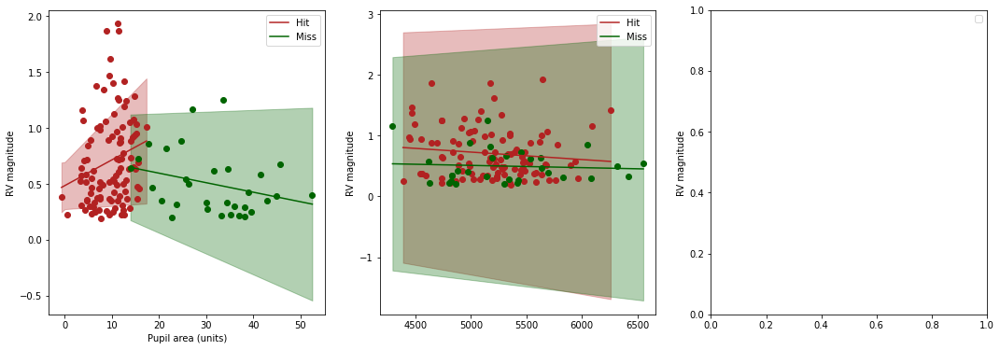

In [ ]:
import scipy.stats
from sklearn.linear_model import LinearRegression
from scipy.stats import linregress

if behavior_specs['eye_data']:
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,6))
    axs = (ax1, ax2, ax3)
else:
    fig, ax1, = plt.subplots(1, 1, figsize=(6,6))
    axs = (ax1,)

type_names = ('Hit', 'Miss')

exp_idx = 0

for type_idx in range(2):
    dff_mags = np.linalg.norm(dff_vals_experiments[exp_idx][type_idx], axis=-1)
    
    print('Running speed fit:')
    regress_and_plot_1d(speeds_experiments[exp_idx][type_idx], dff_mags,
                        ax1, type_idx, type_names[type_idx])

    if behavior_specs['eye_data']:
        print('Pupil area fit:')
        regress_and_plot_1d(pupil_area_experiments[exp_idx][type_idx], dff_mags,
                        ax2, type_idx, type_names[type_idx])

        reg, p = regress_multid(eye_pos_experiments[exp_idx][type_idx], dff_mags)
        print('Eye location fit:')
        print('  2d regress - p: {:.2e}'.format(p))

        # Concatanate everything together
        behave_matrix = np.concatenate((
            speeds_experiments[exp_idx][type_idx][:, np.newaxis],
            pupil_area_experiments[exp_idx][type_idx][:, np.newaxis],
            eye_pos_experiments[exp_idx][type_idx]
        ), axis=-1)

        reg, p = regress_multid(behave_matrix, dff_mags)
        print('All behave fit:')
        print('  4d regress - p: {:.2e}'.format(p))

ax1.set_xlabel('Run speed (cm/s)')
for ax in axs:
    ax.set_ylabel('RV magnitude')
    ax.legend()

if behavior_specs['eye_data']:
    ax1.set_xlabel('Pupil area (units)')

## Testing Some Random Baselines

In [ ]:
# What are the baselines for subspace percentages?

trials = 1000

dim0 = 23
dim1 = 9
n = 123

overlaps = np.zeros((trials,))
percs = np.zeros((trials, 2)) #(0 in 1, 1 in 0)

for trial_idx in range(trials):
    vecs0 = np.random.rand(n, dim0)
    vecs1 = np.random.rand(n, dim1)

    rank0 = np.linalg.matrix_rank(vecs0)
    rank1 = np.linalg.matrix_rank(vecs1)

    assert rank0 == dim0
    assert rank1 == dim1

    u0, s0, _ = np.linalg.svd(vecs0)
    u1, s1, _ = np.linalg.svd(vecs1)

    overlaps[trial_idx] = subspace_overlap(vecs0, vecs1)
    percs[trial_idx, 0] = subspace_perc(u1[:, :dim1], u0[:, :dim0])
    percs[trial_idx, 1] = subspace_perc(u0[:, :dim0], u1[:, :dim1])

print('Overlaps: {:.3f} (std {:.3f})'.format(
    overlaps.mean(), overlaps.std()
))

print('Perc, 0 in 1: {:.3f} (std {:.3f}), 1 in 0: {:.3f} (std {:.3f})'.format(
    percs[:, 0].mean(), percs[:, 0].std(), percs[:, 1].mean(), percs[:, 1].std()
))

Overlaps: 0.000 (std 0.000)
Perc, 0 in 1: 0.281 (std 0.011), 1 in 0: 0.483 (std 0.017)


In [ ]:
overlaps

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

## Final Plot Stuff

In [7]:
!python -m pip install git+https://github.com/nirum/jetplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/nirum/jetplot to /tmp/pip-req-build-067anffq
  Running command git clone -q https://github.com/nirum/jetplot /tmp/pip-req-build-067anffq
  Created wheel for jetplot: filename=jetplot-0.5.0-py3-none-any.whl size=15083 sha256=ff54d9e21531a8a542cbde567d0b32d740379d469dc08453b7c3130657e47b8e
  Stored in directory: /tmp/pip-ephem-wheel-cache-bjphghqi/wheels/d6/cc/1a/e4ac81d12b484cdd54e3c32836bee518ea4f7d35d56e6038a8
Successfully built jetplot


In [8]:
import jetplot

print('Jetpack version:', jetplot.__version__)

Jetpack version: 0.5.0


In [9]:
from matplotlib import rcParams

rcParams.update({
    'lines.linewidth': 1.5,
    'lines.linestyle': '-',
    'lines.marker': None,
    'lines.markeredgewidth': 0.,
    'lines.markersize': 6.,
    'lines.antialiased': True,
    'lines.solid_joinstyle': 'round',
    'lines.solid_capstyle': 'round',

    'patch.linewidth': 1.,
    'patch.facecolor': '#cccccc',
    'patch.edgecolor': 'none',
    'patch.antialiased': True,

    'font.size': 10,
    'text.usetex': False,
    'mathtext.default': 'regular',

    'axes.linewidth': 1.0,
    'axes.grid': False,
    'axes.titlesize': 10,
    'axes.labelsize': 10,
    'axes.labelweight': 'normal',
    'axes.axisbelow': True,
    'axes.formatter.use_mathtext': False,
    'axes.xmargin': 0.,
    'axes.ymargin': 0.,
    'polaraxes.grid': True,

    'xtick.direction': 'out',
    'xtick.labelsize': 10.,
    'xtick.major.size': 4.,
    'xtick.minor.size': 2.,
    'xtick.major.width': 1.,
    'xtick.minor.width': 1.,

    'ytick.direction': 'out',
    'ytick.labelsize': 10.,
    'ytick.major.size': 4.,
    'ytick.minor.size': 2.,
    'ytick.major.width': 1.,
    'ytick.minor.width': 1.,

    'grid.linestyle': 'dotted',
    'grid.alpha': 0.5,
    'grid.linewidth': 1.0,

    'legend.frameon': False,
    'legend.fancybox': True,
    'legend.fontsize': 10.,
    'legend.loc': 'best',

    'figure.figsize': (5, 3),
    'figure.dpi': 300,
    'figure.autolayout': True,

    'image.cmap': 'viridis',
    'image.interpolation': None,
    'image.aspect': 'equal',

    'savefig.format': 'pdf',
    'savefig.bbox': 'tight',
    'savefig.pad_inches': 0.1,
    'pdf.fonttype': 42,
})

In [10]:
c_vals = ['#e53e3e', '#3182ce', '#38a169', '#805ad5','#dd6b20', '#319795', '#718096', '#d53f8c', '#d69e2e',]
c_vals_l = ['#feb2b2', '#90cdf4', '#9ae6b4', '#d6bcfa', '#fbd38d', '#81e6d9', '#e2e8f0', '#fbb6ce', '#faf089',]
c_vals_d = ['#9b2c2c', '#2c5282', '#276749', '#553c9a', '#9c4221', '#285e61', '#2d3748', '#97266d', '#975a16',]

ordered_map = list(jetplot.colors.cmap_colors('RdYlGn', 7))

## Old Analysis

#### dF/F Full Curve Analysis

This analysis looks at the entire dF/F curve, often averaging it either across trials and/or cell IDs

In [ ]:
def get_dff_values(start_time, end_time, change_time):
    """ For a given start and end time, return the dff values as well as the 
    corresponding image index
    """

    time_diff = end_time - start_time

    trial_dff_traces = experiment_dataset.tidy_dff_traces.query('timestamps >= {} and timestamps <= {} '.format(start_time, end_time))
    # trial_dff_traces_before = experiment_dataset.tidy_dff_traces.query('timestamps >= {} and timestamps <= {} '.format(start_time - 0.750, end_time - 0.750))
    n_dff_vals = trial_dff_traces.query('cell_specimen_id == @cell_specimen_ids[0]')['dff'].shape[0]
    
    dff_values = np.zeros((cell_specimen_ids.shape[0], n_dff_vals))
    rel_timestamps = np.zeros((cell_specimen_ids.shape[0], n_dff_vals))

    # This should only give one stimuli
    stimuli = experiment_dataset.stimulus_presentations.query('stop_time >= {} and stop_time <= {}'.format(
        change_time - 0.25, change_time + 0.5))
    if len(stimuli) > 1:
        print('Stimuli length:', len(stimuli))
    image_name = stimuli['image_name'].iloc[0]
    image_idx = image_idx_dict_experiments[ed_idx][image_name]

    for cell_specimen_id_idx, cell_specimen_id in enumerate(cell_specimen_ids):
        rel_timestamp_cell = trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['timestamps'] - start_time
        dff_trace_cell = trial_dff_traces.query('cell_specimen_id == @cell_specimen_id')['dff']
        # dff_trace_cell_before = trial_dff_traces_before.query('cell_specimen_id == @cell_specimen_id')['dff']

        dff_values[cell_specimen_id_idx] = dff_trace_cell
        rel_timestamps[cell_specimen_id_idx] = rel_timestamp_cell

    return dff_values, rel_timestamps, image_idx

def detect_img_changes(start_time, end_time):
    """ Detects if multiple image changes occurs in a given time window """
    
    change_idxs = np.where(np.logical_and(change_times >= start_time, change_times <= end_time))[0]
    if len(change_idxs) > 1:
        print('Change idxs:', change_idxs, ' - End time: {} -> {}'.format(end_time, change_times[change_idxs[1]]))
        end_time = change_times[change_idxs[1]]
        # raise ValueError('Multiple changes in window!')

    return start_time, end_time

dff_vals_experiments = []
dff_by_image_experiments = []
time_by_image_experiments = []
rel_timestamps_experiments = []

max_dff_length = 200

# rel_time_start = -2*0.750
rel_time_start = 0
rel_time_end = 5*0.750

for ed_idx, experiment_dataset in enumerate(experiment_datasets):
    
    print('Experiment number:', ed_idx)
    eng_trial_ids = eng_trial_ids_experiment[ed_idx]
    unique_images = unique_images_experiments[ed_idx]
    
    # Creates an array of times when the image changed
    change_times = experiment_dataset.trials['change_time'].unique()
    change_times.sort()
    change_times = change_times[:-1] # Remove the nan

    cell_specimen_ids = experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique()
    dff_vals = [np.empty((len(eng_trial_ids[0]), cell_specimen_ids.shape[0], max_dff_length)),
                np.empty((len(eng_trial_ids[1]), cell_specimen_ids.shape[0], max_dff_length)),
                np.empty((len(eng_trial_ids[2]), cell_specimen_ids.shape[0], max_dff_length)),
                np.empty((len(eng_trial_ids[3]), cell_specimen_ids.shape[0], max_dff_length))]
    for idx in range(4):
        dff_vals[idx][:] = np.nan
    rel_timestamps = [np.copy(dff_val) for dff_val in dff_vals]

    dff_by_image = [[] for _ in range(len(unique_images))]
    time_by_image = [[] for _ in range(len(unique_images))]

    # trial = experiment_dataset.trials.query('hit').sample()
    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        'hit == True and trials_id in @eng_trial_ids[0]').iterrows()):

        start_time = float(trial['change_time']) + rel_time_start
        end_time = float(trial['change_time']) + rel_time_end
        
        start_time, end_time = detect_img_changes(start_time, end_time)

        dff_values, rel_timestamp, image_idx = get_dff_values(
            start_time, end_time, float(trial['change_time']))
        if dff_values.shape[1] > max_dff_length:
            raise ValueError('dff value length exceeded max length')
        dff_vals[0][trial_idx, :, :dff_values.shape[1]] = dff_values
        rel_timestamps[0][trial_idx, :, :dff_values.shape[1]] = rel_timestamp
        dff_by_image[image_idx].append(dff_values)
        time_by_image[image_idx].append(float(trial['change_time']))

    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        'miss == True and trials_id in @eng_trial_ids[1]').iterrows()):
        
        start_time = float(trial['change_time']) + rel_time_start
        end_time = float(trial['change_time']) + rel_time_end
        
        start_time, end_time = detect_img_changes(start_time, end_time)
        
        dff_values, rel_timestamp, image_idx = get_dff_values(
            start_time, end_time, float(trial['change_time']))
        dff_vals[1][trial_idx, :, :dff_values.shape[1]] = dff_values
        rel_timestamps[1][trial_idx, :, :dff_values.shape[1]] = rel_timestamp
        # dff_by_image[image_idx].append(dff_values)

    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        'false_alarm == True and trials_id in @eng_trial_ids[2]').iterrows()):
        
        start_time = float(trial['change_time']) + rel_time_start
        end_time = float(trial['change_time']) + rel_time_end

        start_time, end_time = detect_img_changes(start_time, end_time)
        
        dff_values, rel_timestamp, image_idx = get_dff_values(
            start_time, end_time, float(trial['change_time']))
        dff_vals[2][trial_idx, :, :dff_values.shape[1]] = dff_values
        rel_timestamps[2][trial_idx, :, :dff_values.shape[1]] = rel_timestamp
        # dff_by_image[image_idx].append(dff_values))

    for trial_idx, (_, trial) in enumerate(experiment_dataset.trials.query(
        'correct_reject == True and trials_id in @eng_trial_ids[3]').iterrows()):
        
        start_time = float(trial['change_time']) + rel_time_start
        end_time = float(trial['change_time']) + rel_time_end

        start_time, end_time = detect_img_changes(start_time, end_time)
        
        dff_values, rel_timestamp, image_idx = get_dff_values(
            start_time, end_time, float(trial['change_time']))
        dff_vals[3][trial_idx, :, :dff_values.shape[1]] = dff_values
        rel_timestamps[3][trial_idx, :, :dff_values.shape[1]] = rel_timestamp
        # dff_by_image[image_idx].append(dff_values)

    for image_idx, dff_image in enumerate(dff_by_image):
        temp_array = np.empty((len(dff_by_image[image_idx]), cell_specimen_ids.shape[0], max_dff_length))
        temp_array[:] = np.nan
        for example_idx in range(len(dff_by_image[image_idx])):
            temp_array[example_idx, :, :dff_by_image[image_idx][example_idx].shape[1]] = dff_by_image[image_idx][example_idx]
        dff_by_image[image_idx] = temp_array
        print('Image idx {} array size: {}'.format(image_idx, dff_by_image[image_idx].shape))

    dff_vals_experiments.append(dff_vals)
    dff_by_image_experiments.append(dff_by_image)
    time_by_image_experiments.append(time_by_image)
    rel_timestamps_experiments.append(rel_timestamps)


Experiment number: 0
Image idx 0 array size: (25, 196, 200)
Image idx 1 array size: (22, 196, 200)
Image idx 2 array size: (19, 196, 200)
Image idx 3 array size: (23, 196, 200)
Image idx 4 array size: (22, 196, 200)
Image idx 5 array size: (16, 196, 200)
Image idx 6 array size: (20, 196, 200)
Image idx 7 array size: (24, 196, 200)
Image idx 8 array size: (0, 196, 200)
Experiment number: 1
Image idx 0 array size: (15, 212, 200)
Image idx 1 array size: (15, 212, 200)
Image idx 2 array size: (7, 212, 200)
Image idx 3 array size: (14, 212, 200)
Image idx 4 array size: (15, 212, 200)
Image idx 5 array size: (11, 212, 200)
Image idx 6 array size: (9, 212, 200)
Image idx 7 array size: (13, 212, 200)
Image idx 8 array size: (0, 212, 200)


Average across different trials and cell_ids

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: Mean of empty slice


Text(0, 0.5, 'Average dF/F')

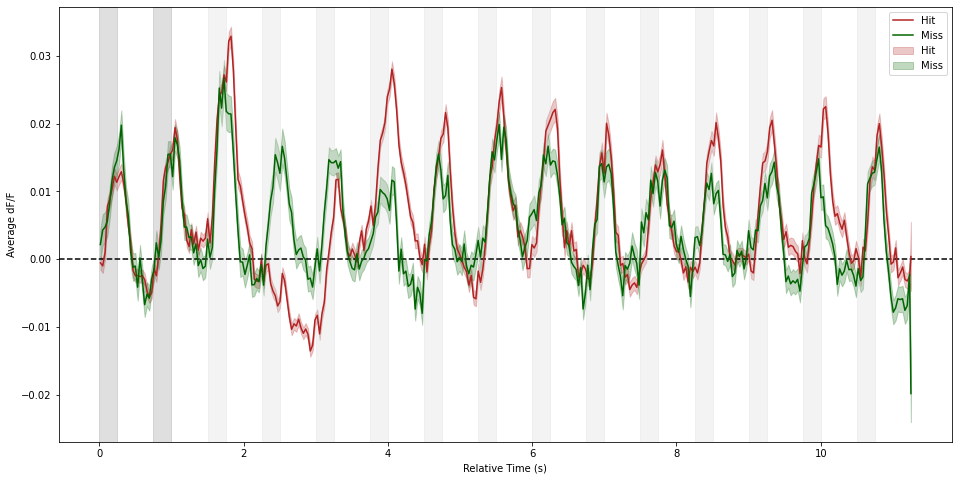

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(16,8))

avg_dff_respose = [[] for _ in range(4)]
avg_rel_timestamp = [[] for _ in range(4)]


ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

for idx in range(2):
    dff_vals = np.reshape(dff_vals_experiments[0][idx], (-1, dff_vals_experiments[0][idx].shape[-1]))
    avg_dff_respose[idx] = np.nanmean(dff_vals, axis=0)
    avg_dff_se = np.nanstd(dff_vals, axis=0)/np.sqrt(np.count_nonzero(~np.isnan(dff_vals), axis=0))
    avg_rel_timestamp[idx] = np.nanmean(np.nanmean(rel_timestamps_experiments[0][idx], axis=0), axis=0)
    

    plt.plot(avg_rel_timestamp[idx], avg_dff_respose[idx], color=c_vals[idx], label=plot_labels[idx])
    plt.fill_between(avg_rel_timestamp[idx], avg_dff_respose[idx]-avg_dff_se, avg_dff_respose[idx]+avg_dff_se,
                     color=c_vals[idx], label=plot_labels[idx], alpha=0.25)

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')

Look to see if there is any difference as a function of timing of the trial in a given session



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice


(1.0, 4.0)

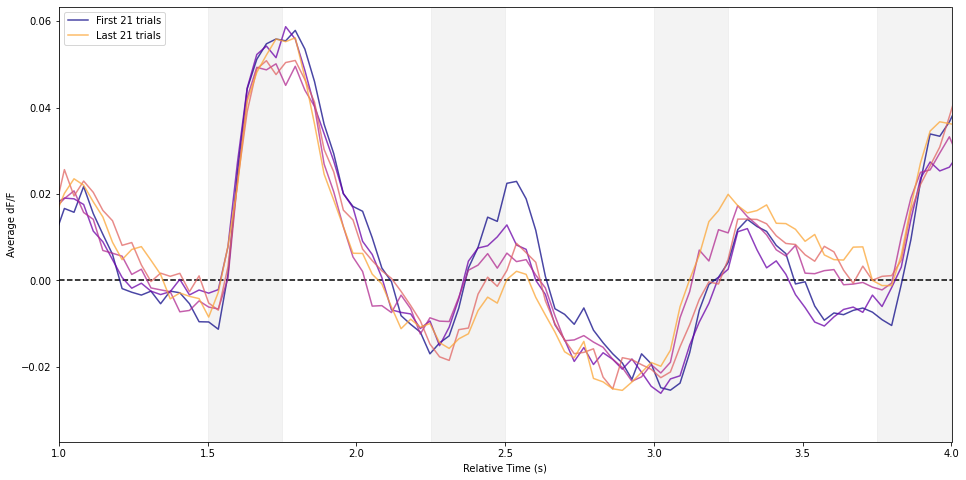

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(16,8))

avg_dff_respose = [[] for _ in range(4)]
avg_rel_timestamp = [[] for _ in range(4)]


ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
cmap = plt.cm.get_cmap('plasma')


for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

# Plots the average over cells AND trials
for idx in range(1):
    
    avg_rel_timestamp[idx] = np.nanmean(np.nanmean(rel_timestamps_experiments[0][idx], axis=0), axis=0)

    # # Plots the average (with se bars)
    # dff_vals = np.reshape(dff_vals_experiments[0][idx], (-1, dff_vals_experiments[0][idx].shape[-1]))
    # avg_dff_respose[idx] = np.nanmean(dff_vals, axis=0)
    # plt.plot(avg_rel_timestamp[idx], avg_dff_respose[idx], color=c_vals[idx], label=plot_labels[idx])
    # plt.fill_between(avg_rel_timestamp[idx], avg_dff_respose[idx]-avg_dff_se, avg_dff_respose[idx]+avg_dff_se,
    #                  color=c_vals[idx], label=plot_labels[idx], alpha=0.25)

    # Plots the average over cells for a few trials
    dff_vals_trial = np.nanmean(dff_vals_experiments[0][idx], axis=1) 

    trials_to_avg = 21
    n_avgs = dff_vals_trial.shape[0]//trials_to_avg
    for i in range(n_avgs):
        if i == 0:
            label_val = f'First {trials_to_avg} trials'
        elif i == n_avgs - 1:
            label_val = f'Last {trials_to_avg} trials'
        else:
            label_val = None
        mean_dff = np.nanmean(dff_vals_trial[i*trials_to_avg:(i+1)*trials_to_avg], axis=0)
        plt.plot(avg_rel_timestamp[idx], mean_dff, color=cmap(i/n_avgs),  
                 alpha=0.75, label=label_val)

    # for plt_idx in range(5):
    #     plt.plot(avg_rel_timestamp[idx], dff_vals_trial[plt_idx], color=c_vals[1+plt_idx], 
    #              label='Trail:'+str(plt_idx), alpha=0.5)

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
ax.set_xlim([1, 4])

Average response as a function of image

IndexError: ignored

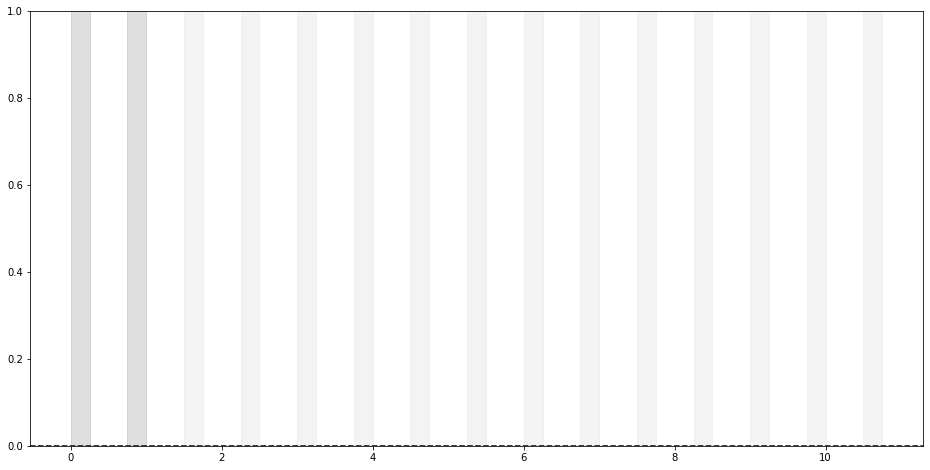

In [ ]:
# Average across different trials and cell_ids
fig, ax = plt.subplots(1, 1, figsize=(16,8))

avg_dff_respose = [[] for _ in range(len(unique_images))]
ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

for idx in range(len(unique_images)-1):
    dff_vals = np.reshape(dff_by_image_experiments[0][idx], (-1, dff_by_image_experiments[0][idx].shape[-1]))
    avg_dff_respose[idx] = np.nanmean(dff_vals, axis=0)
    avg_dff_se = np.nanstd(dff_vals, axis=0)/np.sqrt(np.count_nonzero(~np.isnan(dff_vals), axis=0))
    avg_rel_timestamp = np.nanmean(np.nanmean(rel_timestamps_experiments[0][0], axis=0), axis=0)
    
    plt.plot(avg_rel_timestamp, avg_dff_respose[idx], color=c_vals[idx], label=unique_images[idx])
    plt.fill_between(avg_rel_timestamp, avg_dff_respose[idx]-avg_dff_se, avg_dff_respose[idx]+avg_dff_se,
                     color=c_vals[idx], alpha=0.25)

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
ax.set_xlim([1, 4])

###### Calculate important cells for a given image

Let's look at some particular image responses and see if they are the same across many trials.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipyker

(1.0, 4.0)

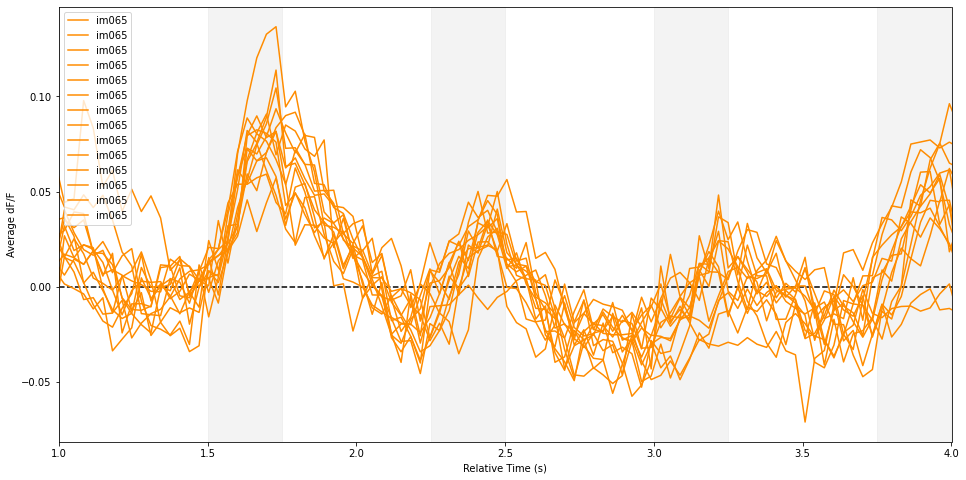

In [ ]:
idx = 3

# Average across different trials and cell_ids
fig, ax = plt.subplots(1, 1, figsize=(16,8))

ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

for trial_idx in range(dff_by_image_experiments[0][idx].shape[0]):
    avg_dff_respose = np.nanmean(dff_by_image_experiments[0][idx][trial_idx], axis=0)
    avg_rel_timestamp = np.nanmean(np.nanmean(rel_timestamps_experiments[0][0], axis=0), axis=0)

    plt.plot(avg_rel_timestamp, avg_dff_respose, color=c_vals[idx], label=unique_images[idx])

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
ax.set_xlim([1, 4])

4
3


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
No handles with labels found to put in legend.


Text(0, 0.5, 'Average dF/F')

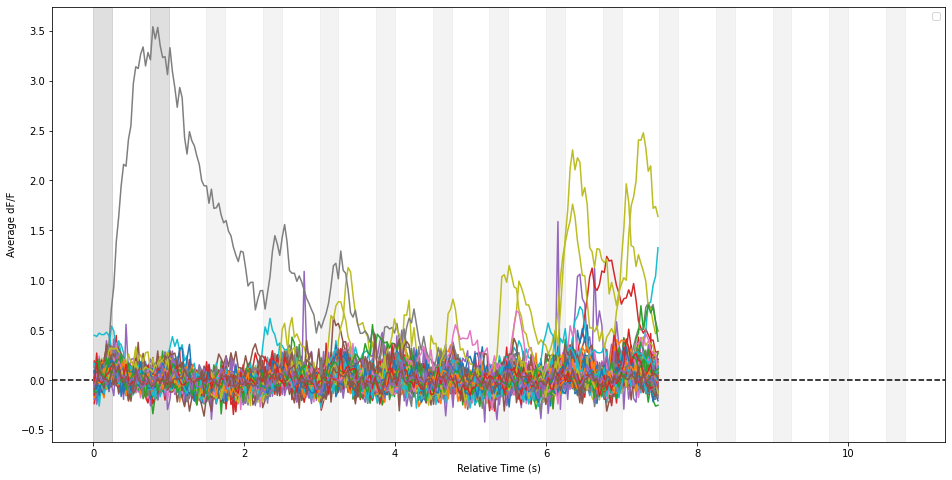

In [ ]:
idx = np.random.randint(len(unique_images)-1)
trial_idx = np.random.randint(dff_by_image_experiments[0][idx].shape[0])
print(idx)
print(trial_idx)

# Average across different trials and cell_ids
fig, ax = plt.subplots(1, 1, figsize=(16,8))

ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

avg_rel_timestamp = np.nanmean(np.nanmean(rel_timestamps_experiments[0][0], axis=0), axis=0)
for cell_idx in range(dff_by_image_experiments[0][idx][trial_idx].shape[0]):
    plt.plot(avg_rel_timestamp, dff_by_image_experiments[0][idx][trial_idx, cell_idx])

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
# ax.set_xlim([1, 4])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: Mean of empty slice
No handles with labels found to put in legend.


Top idxs (4) : [117, 78, 158, 33]


Text(0, 0.5, 'Average dF/F')

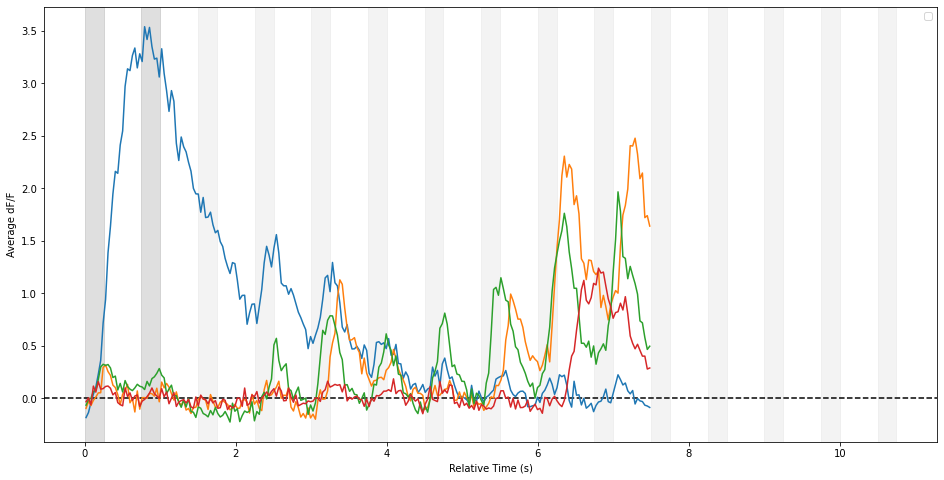

In [ ]:
n_top = 3
mean_vals = np.zeros((len(cell_specimen_ids),))
top_criteria = "Threshold"

for cell_idx in range(dff_by_image_experiments[0][idx][trial_idx].shape[0]):
    mean_vals[cell_idx] = np.nanmean(dff_by_image_experiments[0][idx][trial_idx, cell_idx])
    # mean_vals[cell_idx] = np.nanmax(dff_by_image_experiments[0][idx][trial_idx, cell_idx])

mean_vals_copy = np.copy(mean_vals)
top_idxs = []
top_means = []

if top_criteria == "Fixed": 
    for _ in range(n_top_trial):
        top_idx = np.argmax(mean_vals_copy)
        top_idxs.append(top_idx)
        top_means.append(mean_vals[top_idx])
        mean_vals_copy[top_idx] = -1 * np.inf
elif top_criteria == "Threshold":
    top_idx = np.argmax(mean_vals_copy)
    highest_mean = mean_vals[top_idx]
    # print('Highest mean:', highest_mean)
    while mean_vals[top_idx] > 0.1 * highest_mean and len(top_idxs) < 10:
        top_idxs.append(top_idx)
        top_means.append(mean_vals[top_idx])
        
        mean_vals_copy[top_idx] = -1 * np.inf
        top_idx = np.argmax(mean_vals_copy)

print('Top idxs ({}) :'.format(len(top_idxs)), top_idxs)

# Average across different trials and cell_ids
fig, ax = plt.subplots(1, 1, figsize=(16,8))

ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

avg_rel_timestamp = np.nanmean(np.nanmean(rel_timestamps_experiments[0][0], axis=0), axis=0)
for cell_idx in top_idxs:
    plt.plot(avg_rel_timestamp, dff_by_image_experiments[0][idx][trial_idx, cell_idx])

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
# ax.set_xlim([1, 4])

In [ ]:
idx = 3
n_top_trial = 5
top_criteria = "Threshold" # "Fixed" or "Threshold"

top_trial_idxs = []

for trial_idx in range(dff_by_image_experiments[0][idx].shape[0]):
    
    mean_vals = np.zeros((len(cell_specimen_ids),))
    for cell_idx in range(dff_by_image_experiments[0][idx][trial_idx].shape[0]):
        mean_vals[cell_idx] = np.nanmean(dff_by_image_experiments[0][idx][trial_idx, cell_idx])
        # mean_vals[cell_idx] = np.nanmax(dff_by_image_experiments[0][idx][trial_idx, cell_idx])

    mean_vals_copy = np.copy(mean_vals)
    top_idxs = []
    top_means = []

    if top_criteria == "Fixed": 
        for _ in range(n_top_trial):
            top_idx = np.argmax(mean_vals_copy)
            top_idxs.append(top_idx)
            top_means.append(mean_vals[top_idx])
            mean_vals_copy[top_idx] = -1 * np.inf
    elif top_criteria == "Threshold":
        top_idx = np.argmax(mean_vals_copy)
        highest_mean = mean_vals[top_idx]
        while mean_vals[top_idx] > 0.1 * highest_mean:
            top_idxs.append(top_idx)
            top_means.append(mean_vals[top_idx])
            
            mean_vals_copy[top_idx] = -1 * np.inf
            top_idx = np.argmax(mean_vals_copy) # Next potential top_idx


    print(f'Trial: {trial_idx} \t Top Cell IDs: {top_idxs}')
    print(f'\t\t Top Means:', ['{:0.2f}'.format(i) for i in top_means])

    top_trial_idxs.append(top_idxs)

Trial: 0 	 Top Cell IDs: [73, 8, 70]
		 Top Means: ['0.33', '0.14', '0.09']
Trial: 1 	 Top Cell IDs: [62, 73, 70, 8, 74]
		 Top Means: ['0.22', '0.18', '0.09', '0.09', '0.04']
Trial: 2 	 Top Cell IDs: [62, 73, 8, 70, 54, 57, 93, 88]
		 Top Means: ['0.31', '0.14', '0.12', '0.07', '0.06', '0.05', '0.04', '0.03']
Trial: 3 	 Top Cell IDs: [73, 20, 48, 15, 8, 86, 97, 70, 12, 89]
		 Top Means: ['0.19', '0.16', '0.09', '0.08', '0.06', '0.06', '0.04', '0.04', '0.03', '0.03']
Trial: 4 	 Top Cell IDs: [8, 78, 73, 70, 93, 12, 17, 97]
		 Top Means: ['0.17', '0.12', '0.08', '0.03', '0.03', '0.03', '0.03', '0.02']
Trial: 5 	 Top Cell IDs: [73, 93, 8, 70, 89, 74, 24, 88, 33, 97, 12, 46, 109, 78]
		 Top Means: ['0.12', '0.12', '0.12', '0.04', '0.03', '0.03', '0.02', '0.02', '0.02', '0.02', '0.02', '0.02', '0.02', '0.01']
Trial: 6 	 Top Cell IDs: [57, 93, 73, 12, 8, 70, 97, 74, 89, 88]
		 Top Means: ['0.19', '0.10', '0.09', '0.09', '0.07', '0.03', '0.03', '0.02', '0.02', '0.02']
Trial: 7 	 Top Cell IDs

In [ ]:
n_top = 8

n_trials = dff_by_image_experiments[0][idx].shape[0]
top_trial_idxs_flat = np.array([item for sublist in top_trial_idxs for item in sublist]) # Flatten
# np.array(top_trial_idxs).flatten()
top_cell_perc = np.zeros((len(cell_specimen_ids), ))

for cell_idx in range(len(cell_specimen_ids)):
    top_cell_perc[cell_idx] = np.count_nonzero(top_trial_idxs_flat == cell_idx)/n_trials
    # print(f'Cell idx: {cell_idx} - perc: {top_cell_perc[cell_idx]}')

top_cell_perc_copy = np.copy(top_cell_perc)
top_idxs = []
top_percs = []
for _ in range(n_top):
    top_idx = np.argmax(top_cell_perc_copy)
    top_idxs.append(top_idx)
    top_percs.append(top_cell_perc[top_idx])
    print(f'Top idx: {top_idx} Percentage: {top_cell_perc[top_idx]:.1f}')

    top_cell_perc_copy[top_idx] = -1 * np.inf

Top idx: 8 Percentage: 1.0
Top idx: 70 Percentage: 0.9
Top idx: 73 Percentage: 0.9
Top idx: 97 Percentage: 0.6
Top idx: 12 Percentage: 0.4
Top idx: 17 Percentage: 0.4
Top idx: 57 Percentage: 0.4
Top idx: 62 Percentage: 0.4


Random idxs: [110  37 101  40]
(14, 113, 500)
(1582, 500)
(14, 4, 500)
(56, 500)
Scale value: 0.035398230088495575
Scale time sizes: 1582.0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: Mean of empty slice


Text(0, 0.5, 'Average dF/F')

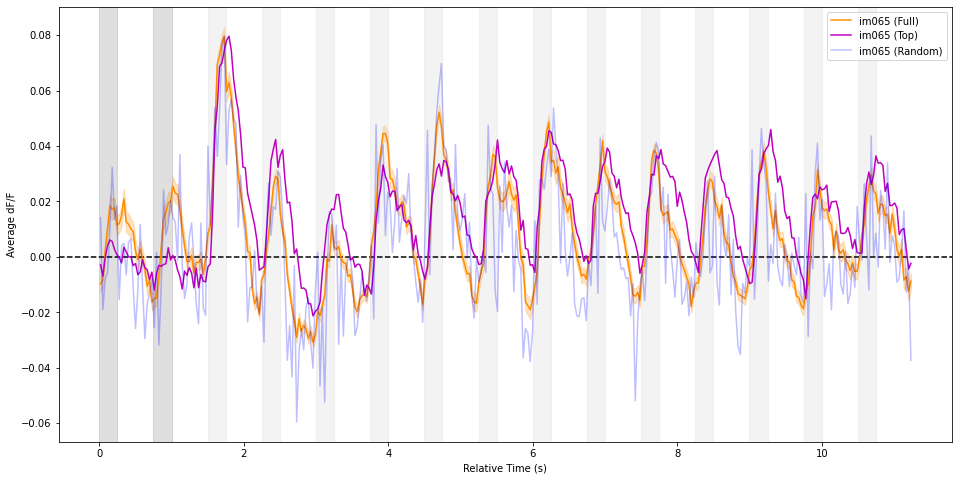

In [ ]:
# How much do these top indexes reconstruct the average response?
fig, ax = plt.subplots(1, 1, figsize=(16,8))

random_idxs = np.random.choice(np.arange(len(cell_specimen_ids)), size=n_top, replace=False)
print('Random idxs:', random_idxs)

avg_dff_respose = [[] for _ in range(len(unique_images))]
ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

# Full response
print(dff_by_image_experiments[0][idx][:, :, :].shape)
dff_vals = np.reshape(dff_by_image_experiments[0][idx], (-1, dff_by_image_experiments[0][idx].shape[-1]))
print(dff_vals.shape)
avg_dff_respose[idx] = np.nanmean(dff_vals, axis=0)
avg_dff_se = np.nanstd(dff_vals, axis=0)/np.sqrt(np.count_nonzero(~np.isnan(dff_vals), axis=0))
avg_rel_timestamp = np.nanmean(np.nanmean(rel_timestamps_experiments[0][0], axis=0), axis=0)

plt.plot(avg_rel_timestamp, avg_dff_respose[idx], color=c_vals[idx], label=unique_images[idx]+' (Full)')
plt.fill_between(avg_rel_timestamp, avg_dff_respose[idx]-avg_dff_se, avg_dff_respose[idx]+avg_dff_se,
                    color=c_vals[idx], alpha=0.25)

# Top cells response

max_val = np.max(avg_dff_respose[idx][~np.isnan(avg_dff_respose[idx])])
max_idx = np.where(avg_dff_respose[idx] == max_val)[0][0]

print(dff_by_image_experiments[0][idx][:, top_idxs, :].shape)
dff_vals = np.reshape(dff_by_image_experiments[0][idx][:, top_idxs, :], (-1, dff_by_image_experiments[0][idx].shape[-1]))
print(dff_vals.shape)
print('Scale value:', (len(top_idxs)/len(cell_specimen_ids)))
print('Scale time sizes:', dff_vals.shape[0]*1/(len(top_idxs)/len(cell_specimen_ids)))
# avg_dff_respose[idx] = np.nanmean(dff_vals, axis=0) * (len(top_idxs)/len(cell_specimen_ids))

avg_dff_respose_top = np.nanmean(dff_vals, axis=0)
# avg_dff_respose_top = avg_dff_respose_top * avg_dff_respose[idx][max_idx] / avg_dff_respose_top[max_idx]
max_val_top = np.max(avg_dff_respose_top[~np.isnan(avg_dff_respose_top)])
avg_dff_respose_top = avg_dff_respose_top * max_val/max_val_top

plt.plot(avg_rel_timestamp, avg_dff_respose_top, color=c_vals[idx+1], label=unique_images[idx]+' (Top)')

# Random cells response
dff_vals = np.reshape(dff_by_image_experiments[0][idx][:, random_idxs, :], (-1, dff_by_image_experiments[0][idx].shape[-1]))
# avg_dff_respose[idx] = np.nanmean(dff_vals, axis=0) * (len(top_idxs)/len(cell_specimen_ids))

avg_dff_respose_rand = np.nanmean(dff_vals, axis=0)
# avg_dff_respose_top = avg_dff_respose_top * avg_dff_respose[idx][max_idx] / avg_dff_respose_top[max_idx]
max_val_rand = np.max(avg_dff_respose_rand[~np.isnan(avg_dff_respose_rand)])
avg_dff_respose_rand = avg_dff_respose_rand * max_val/max_val_rand


plt.plot(avg_rel_timestamp, avg_dff_respose_rand, color=c_vals[idx-1], 
         label=unique_images[idx]+' (Random)', alpha = 0.25)

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
# ax.set_xlim([1, 4])

In [ ]:
def find_excited_cells(dff_by_image):
    """ 
    Looks at dF/F data to find which cell_idxs are excited across
    all trials of a given image
    
     """

    image_count = len(dff_by_image)-1
    n_unique_cells = dff_by_image[0].shape[1] 

    perc_img = np.zeros((image_count, n_unique_cells,))
    count_img = np.zeros((image_count, n_unique_cells,))

    cell_idxs = np.arange(n_unique_cells,)

    mean_percs = []

    for idx in range(image_count):
        top_trial_idxs = []
        trials = dff_by_image[idx].shape[0]
        n_trials = 0 # Number of accepted trials

        # print(f'---- Image idx: {idx} (Trials: {trials}) ----')
        if trials < 4:
            print(f"Image {idx} rejected because of low trial count.")
            image_count -= 1
            continue

        for trial_idx in range(dff_by_image[idx].shape[0]):
            
            mean_vals = np.zeros((n_unique_cells,))
            for cell_idx in range(dff_by_image[idx][trial_idx].shape[0]):
                mean_vals[cell_idx] = np.nanmean(dff_by_image[idx][trial_idx, cell_idx])
                # mean_vals[cell_idx] = np.nanmax(dff_by_image[idx][trial_idx, cell_idx])

            mean_vals_copy = np.copy(mean_vals)
            top_idxs = []
            top_means = []
            
            if top_criteria == "Fixed": 
                for _ in range(n_top_trial):
                    top_idx = np.argmax(mean_vals_copy)
                    top_idxs.append(top_idx)
                    top_means.append(mean_vals[top_idx])
                    mean_vals_copy[top_idx] = -1 * np.inf
            elif top_criteria == "Threshold":
                top_idx = np.argmax(mean_vals_copy)
                highest_mean = mean_vals[top_idx]
                # print('Highest mean:', highest_mean)
                while mean_vals[top_idx] > 0.1 * highest_mean and len(top_idxs) < 10:
                    top_idxs.append(top_idx)
                    top_means.append(mean_vals[top_idx])
                    
                    mean_vals_copy[top_idx] = -1 * np.inf
                    top_idx = np.argmax(mean_vals_copy) # Next potential top_idx
            # print('Top Cell ID #:', len(top_idxs))
            # print(f'Trial: {trial_idx} - Top Cell IDs: {top_idxs}')
            
            # Reject trials where there are too many top_idxs
            # if len(top_idxs) < 20:
            top_trial_idxs.append(top_idxs)
            n_trials += 1

        if n_trials == 0:
            print(f"Image {idx} rejected because of no trials accepted.")
            image_count -= 1
            continue

        # print(f'Trials kept: {n_trials}/{trials}')

        top_trial_idxs_flat = np.array([item for sublist in top_trial_idxs for item in sublist]) # Flatten
        top_cell_perc = np.zeros((n_unique_cells,))

        for cell_idx in range(n_unique_cells):
            top_cell_perc[cell_idx] = np.count_nonzero(top_trial_idxs_flat == cell_idx)/n_trials
            # print(f'Cell idx: {cell_idx} - perc: {top_cell_perc[cell_idx]}')

        top_cell_perc_copy = np.copy(top_cell_perc)
        
        top_idxs = []
        top_percs = []
        if top_criteria == "Fixed": 
            for _ in range(n_top):
                top_idx = np.argmax(top_cell_perc_copy)
                top_idxs.append(top_idx)
                top_percs.append(top_cell_perc[top_idx])
                # print(f'\t Top idx: {top_idx} Percentage: {top_cell_perc[top_idx]:.2f}')
                perc_img[idx, top_idx] = top_cell_perc[top_idx]
                count_img[idx, top_idx] += 1

                top_cell_perc_copy[top_idx] = -1 * np.inf
        
        elif top_criteria == "Threshold":
                top_idx = np.argmax(top_cell_perc_copy)
                while top_cell_perc[top_idx] > perc_thresh:
                    top_idxs.append(top_idx)
                    top_percs.append(top_cell_perc[top_idx])
                    # print(f'\t Top idx: {top_idx} Percentage: {top_cell_perc[top_idx]:.2f}')
                    perc_img[idx, top_idx] = top_cell_perc[top_idx]
                    count_img[idx, top_idx] += 1

                    top_cell_perc_copy[top_idx] = -1 * np.inf
                    top_idx = np.argmax(top_cell_perc_copy) # Next potential top_idx
        
        mean_percs.append(np.mean(top_percs)) 
        # print(f'Count: {len(top_idxs)} \t Avg: {np.mean(top_percs):.2f}')

    return perc_img, count_img

Plot the excited cell_idxs (one separate plot for each experiment)

---- Image idx: 0 (Trials: 16) ----
Trials kept: 16/16
Count: 2 	 Avg: 0.50
---- Image idx: 1 (Trials: 11) ----
Trials kept: 11/11
Count: 4 	 Avg: 0.61
---- Image idx: 2 (Trials: 11) ----
Trials kept: 11/11
Count: 3 	 Avg: 0.82
---- Image idx: 3 (Trials: 14) ----
Trials kept: 14/14
Count: 6 	 Avg: 0.74
---- Image idx: 4 (Trials: 15) ----
Trials kept: 15/15
Count: 2 	 Avg: 0.70
---- Image idx: 5 (Trials: 16) ----
Trials kept: 16/16
Count: 5 	 Avg: 0.81
---- Image idx: 6 (Trials: 4) ----
Trials kept: 4/4
Count: 9 	 Avg: 0.69
---- Image idx: 7 (Trials: 18) ----
Trials kept: 18/18
Count: 3 	 Avg: 0.70
----- Data Across Images -----

Avg Count/Img: 4.25         	 (Perc Thresh: 0.4)
Nonzero IDs: 24/113 	Avg Count/ID: 1.42
---- Image idx: 0 (Trials: 14) ----
Trials kept: 14/14
Count: 3 	 Avg: 0.62
---- Image idx: 1 (Trials: 14) ----
Trials kept: 14/14
Count: 4 	 Avg: 0.82
---- Image idx: 2 (Trials: 11) ----
Trials kept: 11/11
Count: 1 	 Avg: 1.00
---- Image idx: 3 (Trials: 13) ----
Trials kep

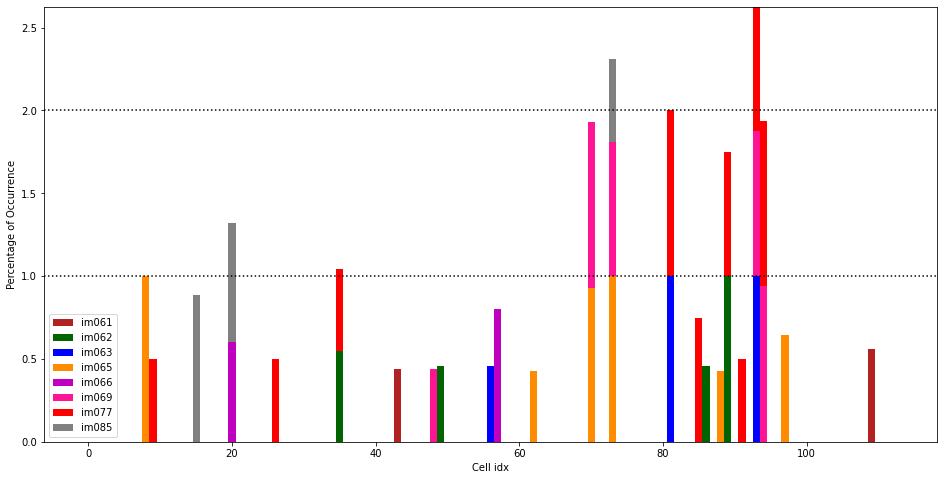

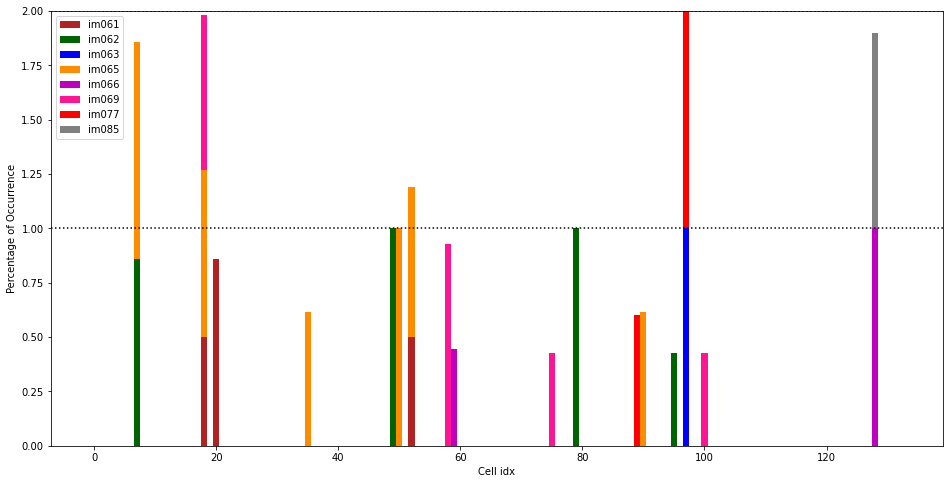

In [ ]:
n_top_trial = 10
n_top = 25
top_criteria = "Threshold" # "Fixed" or "Threshold"
perc_thresh = 0.4

for ed_idx, experiment_dataset in enumerate(experiment_datasets):

    fig, ax = plt.subplots(1, 1, figsize=(16,8))

    cell_specimen_ids = experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique()
    cell_idxs = np.arange(len(cell_specimen_ids))
    image_count = len(dff_by_image_experiments[ed_idx])-1 #  no 'omitted' 

    perc_totals = np.zeros((len(cell_specimen_ids),))
    count_totals = np.zeros((len(cell_specimen_ids),))

    perc_img, count_img = find_excited_cells(dff_by_image_experiments[ed_idx])

    max_perc = np.max(np.sum(perc_img, axis=0))
    for i in range(int(np.floor(max_perc))):
        ax.axhline(i+1, color='k', linestyle='dotted')

    for idx in range(image_count):

        ax.bar(cell_idxs, perc_img[idx], 1.0, bottom=perc_totals,
        label=unique_images[idx], color=c_vals[idx])
        
        perc_totals = perc_totals + perc_img[idx]
        count_totals = count_totals + count_img[idx]

    print('----- Data Across Images -----\n')
    print(f'Avg Count/Img: {np.sum(count_totals)/image_count:.2f} \
        \t (Perc Thresh: {perc_thresh})')
    non_zero_ids = np.sum(count_totals > 0)
    print(f'Nonzero IDs: {non_zero_ids}/{len(cell_specimen_ids)} \tAvg Count/ID: {np.sum(count_totals)/non_zero_ids:.2f}')

    ax.legend()
    ax.set_xlabel('Cell idx')
    ax.set_ylabel('Percentage of Occurrence')

Plot the excited cell_idxs for two experiments, but plots by cell ID rather than cell index, so the two can be better compared

----- Data Across Images -----

Avg Count/Img: 4.38         	 (Perc Thresh: 0.4)
Nonzero IDs: 27/196 	Avg Count/ID: 1.30
----- Data Across Images -----

Avg Count/Img: 5.88         	 (Perc Thresh: 0.4)
Nonzero IDs: 31/212 	Avg Count/ID: 1.52


/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


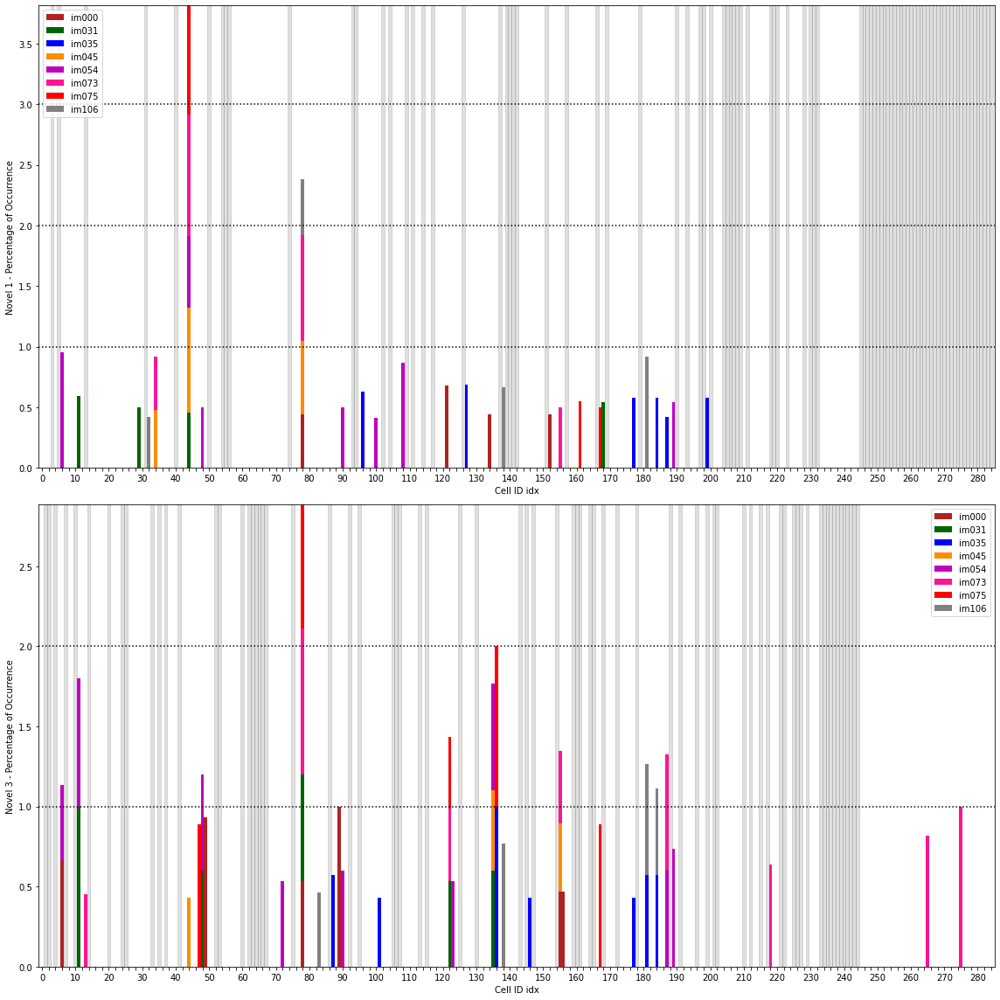

In [ ]:
if len(experiment_datasets) > 2:
    raise ValueError('Comparison only implmented for two datasets')

experiment_names = ['Novel 1', 'Novel 3']

n_top_trial = 10
n_top = 25
top_criteria = "Threshold" # "Fixed" or "Threshold"
perc_thresh = 0.4

unique_cell_ids_list = list(unique_cell_ids.keys())
unique_cell_ids_list.sort()

fig, ax = plt.subplots(2, 1, figsize=(16,16))

for ed_idx, experiment_dataset in enumerate(experiment_datasets):

    cell_specimen_ids = experiment_dataset.tidy_dff_traces['cell_specimen_id'].unique()
    cell_idxs = np.arange(len(unique_cell_ids_list), dtype=np.int32)
    cell_idxs_omitted = np.copy(cell_idxs)

    n_unique_cells = len(unique_cell_ids.keys())
    image_count = len(dff_by_image_experiments[ed_idx])-1

    perc_totals = np.zeros((n_unique_cells,))
    count_totals = np.zeros((n_unique_cells,))
    perc_img_unique = np.zeros((image_count, n_unique_cells,))
    count_img_unique = np.zeros((image_count, n_unique_cells,))

    perc_img, count_img = find_excited_cells(dff_by_image_experiments[ed_idx])

    max_perc = np.max(np.sum(perc_img, axis=0))
    for i in range(int(np.floor(max_perc))):
        ax[ed_idx].axhline(i+1, color='k', linestyle='dotted')

    # Maps experiment idx in unique_cell_idxs
    for cell_idx, cell_id in enumerate(cell_specimen_ids):
        unique_cell_idx = unique_cell_ids_list.index(cell_id)
        perc_img_unique[:, unique_cell_idx] = perc_img[:, cell_idx]
        count_img_unique[:, unique_cell_idx] = count_img[:, cell_idx]
        
        # cell_idxs_omitted = np.delete(cell_idxs_omitted, unique_cell_idx == cell_idxs_omitted)
        # print('Cell idx:', cell_idx, 'unique idx:', unique_cell_idx, 'len cell omitted:', cell_idxs_omitted.shape)

    # for omitted_idx in cell_idxs_omitted:
    #     ax.axvspan(omitted_idx-0.5, omitted_idx+0.5, color='grey', alpha=0.25)
    for cell_idx in cell_idxs:
        if unique_cell_ids_list[cell_idx] not in cell_specimen_ids:
            ax[ed_idx].axvspan(cell_idx-0.5, cell_idx+0.5, color='grey', alpha=0.25)
    
    
    unique_cell_idxs = np.zeros((len(unique_cell_ids.keys()),))

    for idx in range(image_count):

        ax[ed_idx].bar(cell_idxs, perc_img_unique[idx], 1.0, bottom=perc_totals,
        label=unique_images[idx], color=c_vals[idx])
        
        perc_totals = perc_totals + perc_img_unique[idx]
        count_totals = count_totals + count_img_unique[idx]

    print('----- Data Across Images -----\n')
    print(f'Avg Count/Img: {np.sum(count_totals)/image_count:.2f} \
        \t (Perc Thresh: {perc_thresh})')
    non_zero_ids = np.sum(count_totals > 0)
    print(f'Nonzero IDs: {non_zero_ids}/{len(cell_specimen_ids)} \tAvg Count/ID: {np.sum(count_totals)/non_zero_ids:.2f}')

    ax[ed_idx].legend()
    ax[ed_idx].set_xlabel('Cell ID idx')
    ax[ed_idx].set_ylabel(experiment_names[ed_idx] + ' - Percentage of Occurrence')

    ax[ed_idx].set_xlim([-1, len(unique_cell_ids_list)])
    ax[ed_idx].set_xticks(np.arange(0, len(unique_cell_ids_list), 2))
    ax[ed_idx].set_xticklabels([i if i%10==0 else None for i in range(0, len(unique_cell_ids_list), 2)])

fig.tight_layout()

PCA across time and trials

(16, 113, 500)
(8000, 113)
PCA: [0.03989736 0.03242753 0.02870512 0.02095977 0.01747644] PR: 86.7226133677711
(11, 113, 500)
(5500, 113)
PCA: [0.03969841 0.02682769 0.02030974 0.01765305 0.01715185] PR: 90.81529776081759
(11, 113, 500)
(5500, 113)
PCA: [0.21622026 0.07918614 0.04992156 0.0313619  0.02740417] PR: 16.23638011258962
(14, 113, 500)
(7000, 113)
PCA: [0.10306971 0.06928747 0.06501949 0.04477912 0.03704627] PR: 34.61984257686926
(15, 113, 500)
(7500, 113)
PCA: [0.18895197 0.07620369 0.064937   0.04271822 0.03587946] PR: 18.673779243573584
(16, 113, 500)
(8000, 113)
PCA: [0.13100658 0.05295291 0.04554418 0.03751881 0.02681895] PR: 33.487037067706645
(4, 113, 500)
(2000, 113)
PCA: [0.10944832 0.06555337 0.03676031 0.03404551 0.02779865] PR: 38.8354054041132
(18, 113, 500)
(9000, 113)
PCA: [0.40320009 0.08854727 0.05367626 0.04673478 0.02966771] PR: 5.584060766632184


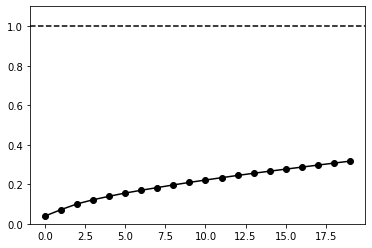

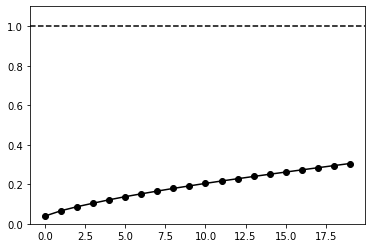

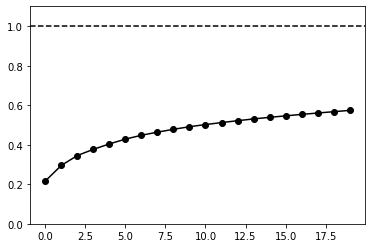

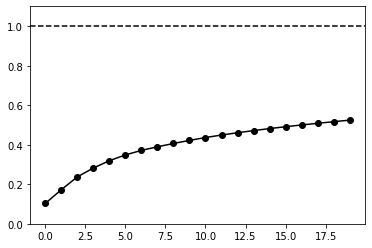

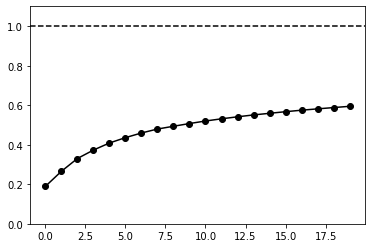

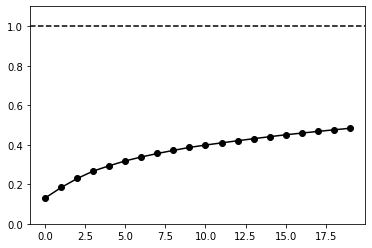

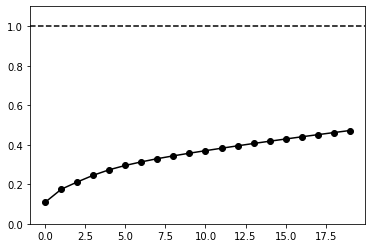

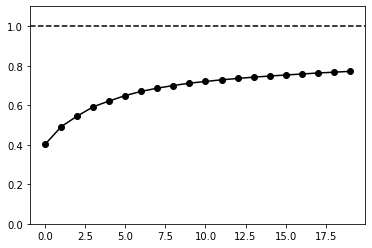

In [ ]:
dff_by_image_pca = [[] for _ in range(len(unique_images))]

for idx in range(len(unique_images)-1):
    print(dff_by_image_experiments[0][idx].shape)
    dff_vals = np.reshape(dff_by_image_experiments[0][idx], (-1, dff_by_image_experiments[0][idx].shape[1]))
    print(dff_vals.shape)

    dff_val_nonan_idxs = []
    for i, dff_val in enumerate(dff_vals):
        if not np.isnan(dff_val).any():
            dff_val_nonan_idxs.append(i)
    dff_val_nonan = dff_vals[dff_val_nonan_idxs]

    pc_dims = 5
    n_feat_space = np.min(dff_vals.shape)
    # Finds percentage of variance explained by top pc_dims of PCA
    pca_full = PCA(n_components=n_feat_space)
    dff_val_nonan_pca = pca_full.fit_transform(dff_val_nonan)

    dff_vals[dff_val_nonan_idxs] = dff_val_nonan_pca

    dff_by_image_pca[idx] = dff_vals.reshape(dff_by_image_experiments[0][idx].shape)

    explained_var = pca_full.explained_variance_ratio_
    print('PCA:', explained_var[:pc_dims], 'PR:', participation_ratio_vector(pca_full.explained_variance_))
    total_exvar = []
    for i in range(n_feat_space-1):
        total_exvar.append(np.sum(explained_var[:i+1]))
    plt.figure()
    plt.plot(total_exvar[:20], 'k-o')
    plt.axhline(1.0, color='k', linestyle='dashed')
    plt.ylim([0.0, 1.1])

In [ ]:
    print(dff_by_image_experiments[0][idx].shape)
    dff_vals = np.nanmean(dff_by_image_experiments[0][idx], axis=0).T
    print(dff_vals.shape)

    dff_val_nonan_idxs = []
    for i, dff_val in enumerate(dff_vals):
        if not np.isnan(dff_val).any():
            dff_val_nonan_idxs.append(i)
    dff_val_nonan = dff_vals[dff_val_nonan_idxs]

    print(dff_val_nonan.shape)

(18, 113, 500)
(500, 113)
(349, 113)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  


(16, 113, 500)
(500, 113)
PCA: [0.08069706 0.03912697 0.02867913 0.02492905 0.02375402] PR: 53.68524754906215
(11, 113, 500)
(500, 113)
PCA: [0.14879144 0.04997152 0.02428285 0.02230319 0.02184617] PR: 29.897581720849303
(11, 113, 500)
(500, 113)
PCA: [0.46072552 0.19909445 0.02115496 0.01387856 0.01038278] PR: 3.938625592487845
(14, 113, 500)
(500, 113)
PCA: [0.24140383 0.12129576 0.07651567 0.06159396 0.04744185] PR: 11.18509794349904
(15, 113, 500)
(500, 113)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


PCA: [0.48071443 0.12809582 0.02175133 0.01498587 0.01159085] PR: 3.9991201895201365
(16, 113, 500)
(500, 113)
PCA: [0.19795418 0.12846887 0.08097529 0.07529226 0.03317934] PR: 13.756685063581253
(4, 113, 500)
(500, 113)
PCA: [0.15959402 0.05954312 0.04304765 0.03278463 0.02461127] PR: 25.319298345732253
(18, 113, 500)
(500, 113)
PCA: [0.48783254 0.23056442 0.04893448 0.0179765  0.01506836] PR: 3.391667257902443


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


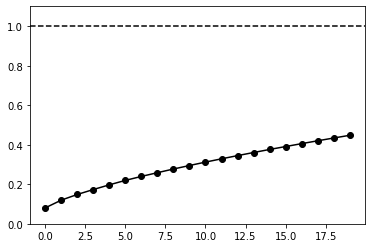

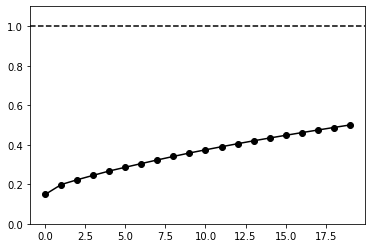

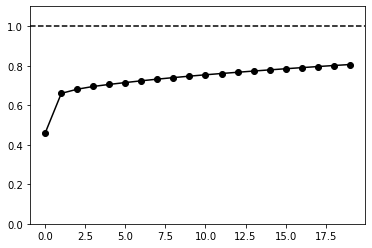

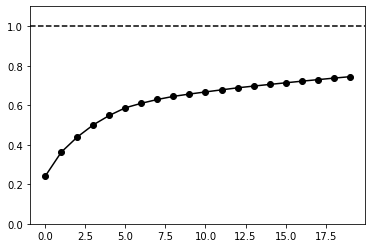

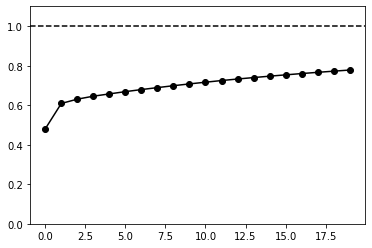

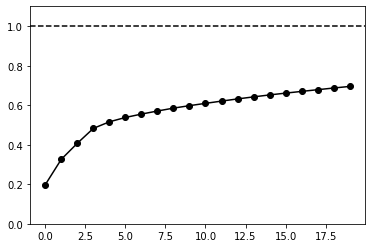

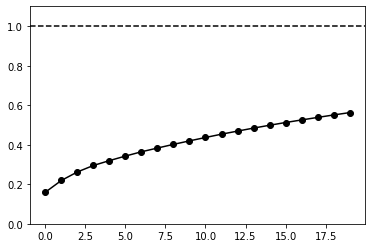

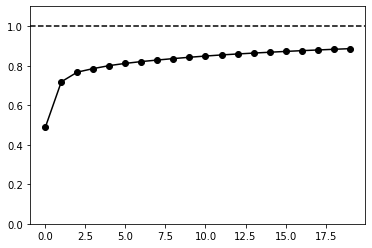

In [ ]:
# This one averages across trials before doing PCA in an attempt to average
# out some additional variation.
dff_by_image_pca = [[] for _ in range(len(unique_images))]

for idx in range(len(unique_images)-1):
    print(dff_by_image_experiments[0][idx].shape)
    dff_vals = np.nanmean(dff_by_image_experiments[0][idx], axis=0).T
    print(dff_vals.shape)

    dff_val_nonan_idxs = []
    for i, dff_val in enumerate(dff_vals):
        if not np.isnan(dff_val).any():
            dff_val_nonan_idxs.append(i)
    dff_val_nonan = dff_vals[dff_val_nonan_idxs]

    pc_dims = 5
    n_feat_space = np.min(dff_val_nonan.shape)
    # Finds percentage of variance explained by top pc_dims of PCA
    pca_full = PCA(n_components=n_feat_space)
    dff_val_nonan_pca = pca_full.fit_transform(dff_val_nonan)

    dff_vals[dff_val_nonan_idxs] = dff_val_nonan_pca

    dff_by_image_pca[idx] = dff_vals.T

    explained_var = pca_full.explained_variance_ratio_
    print('PCA:', explained_var[:pc_dims], 'PR:', participation_ratio_vector(pca_full.explained_variance_))
    total_exvar = []
    for i in range(n_feat_space-1):
        total_exvar.append(np.sum(explained_var[:i+1]))
    plt.figure()
    plt.plot(total_exvar[:20], 'k-o')
    plt.axhline(1.0, color='k', linestyle='dashed')
    plt.ylim([0.0, 1.1])

(1.0, 4.0)

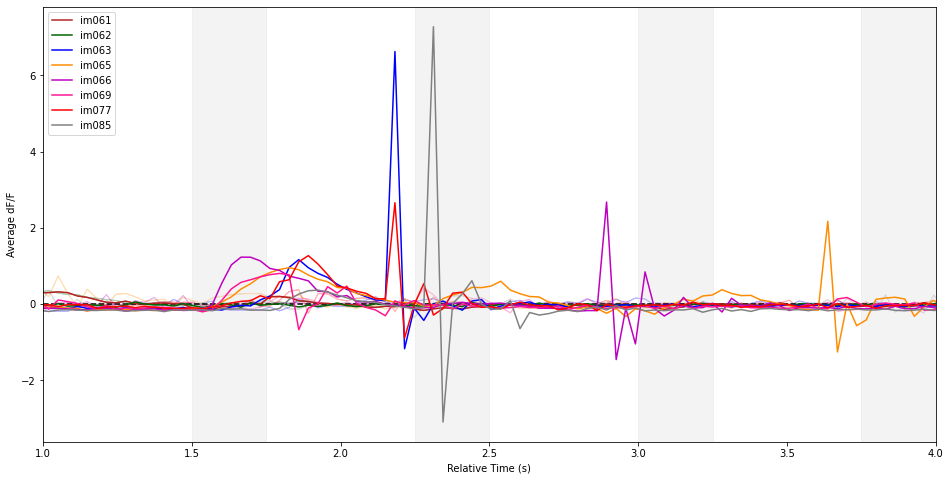

In [ ]:
# Average across different trials and cell_ids
fig, ax = plt.subplots(1, 1, figsize=(16,8))

avg_dff_respose = [[] for _ in range(len(unique_images))]
ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

for idx in range(len(unique_images)-1):
    # avg_dff_respose = np.nanmean(dff_by_image_pca[idx], axis=0)
    avg_dff_respose = dff_by_image_pca[idx]

    plt.plot(avg_rel_timestamp, avg_dff_respose[0], color=c_vals[idx], label=unique_images[idx])
    plt.fill_between(avg_rel_timestamp, avg_dff_respose[idx]-avg_dff_se, avg_dff_respose[idx]+avg_dff_se,
                     color=c_vals[idx], alpha=0.25)

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')
ax.set_xlim([1, 4])

In [ ]:
for idx in range(len(unique_images)-1):
    dff_vals = np.reshape(dff_by_image_experiments[0][idx], (-1, dff_by_image_experiments[0][idx].shape[1]))

Let's return to looking at population level data, informed by the averages we found above.

In [ ]:
idx = 0 # Corresponds to hits
print('Shape of dff vals:', dff_vals_experiments[0][idx].shape)
print('   Trials:', dff_vals_experiments[0][idx].shape[0])
print('   Cell Ids:', dff_vals_experiments[0][idx].shape[1])
print('   Time stamps:', dff_vals_experiments[0][idx].shape[0])

Shape of dff vals: (105, 113, 500)
   Trials: 105
   Cell Ids: 113
   Time stamps: 500


0.05405213441588994
55


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys


Text(0, 0.5, 'Average dF/F')

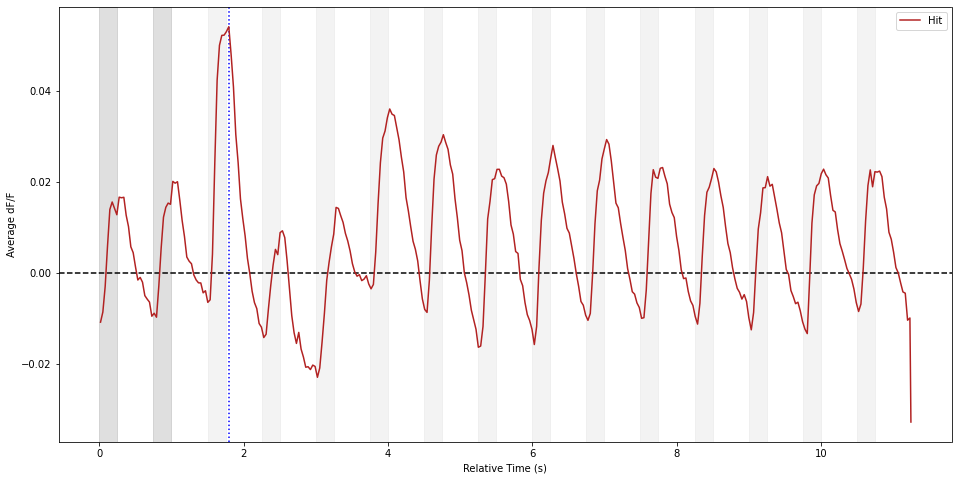

In [ ]:
# Average across different trials and cell_ids
fig, ax = plt.subplots(1, 1, figsize=(16,8))

# Average across trials and cell_ids:
dff_vals = np.reshape(dff_vals_experiments[0][idx], (-1, dff_vals_experiments[0][idx].shape[-1]))
avg_dff_respose = np.nanmean(dff_vals, axis=0)
avg_rel_timestamp = np.nanmean(np.nanmean(rel_timestamps_experiments[0][idx], axis=0), axis=0)

max_val = np.max(avg_dff_respose[~np.isnan(avg_dff_respose)])
print('Max response value:', max_val)
max_idx = np.where(avg_dff_respose == max_val)[0][0]
print('Max response idx:', max_idx)
ax.axvline(avg_rel_timestamp[max_idx], color='b', linestyle='dotted')

ax.axhline(0.0, color='k', linestyle='dashed')
n_images = 15
image_colors = ['grey', 'grey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 
                'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey', 'lightgrey',
                'lightgrey', 'lightgrey', 'lightgrey',]
for i in range(n_images):
    ax.axvspan(i * 0.75, i * 0.75 + 0.25, color=image_colors[i], alpha=0.25)

plt.plot(avg_rel_timestamp, avg_dff_respose, color=c_vals[idx], label=plot_labels[idx])

ax.legend()
ax.set_xlabel('Relative Time (s)')
ax.set_ylabel('Average dF/F')

In [ ]:
pad = 10
dff_pop_vals = dff_vals_experiments[0][idx][:, :, max_idx-pad:max_idx+pad+1]
dff_shape = dff_pop_vals.shape
print(dff_shape) 

dff_pop_vals_all = dff_pop_vals.reshape((dff_shape[0]*dff_shape[2], dff_shape[1]))
print(dff_pop_vals_all.shape)

(105, 113, 21)
(2205, 113)


PCA: [0.15962744 0.08277182 0.06510488 0.05245341 0.04452415] PR: 21.27018621022269


(0.0, 1.1)

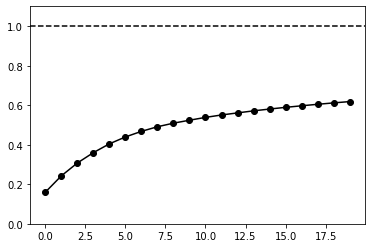

In [ ]:
from sklearn.decomposition import PCA

def participation_ratio_vector(C):
    """Computes the participation ratio of a vector of variances."""
    return np.sum(C) ** 2 / np.sum(C*C)

pc_dims = 5
n_feat_space = np.min(dff_pop_vals_all.shape)
# Finds percentage of variance explained by top pc_dims of PCA
pca_full = PCA(n_components=n_feat_space)
dff_pop_vals_all_pca = pca_full.fit_transform(dff_pop_vals_all)
dff_pop_vals_pca = np.zeros((dff_shape[0], n_feat_space, dff_shape[2]))
for i in range(dff_shape[2]):
    dff_pop_vals_pca[:, :, i] = pca_full.transform(dff_pop_vals[:, :, i])
    
explained_var = pca_full.explained_variance_ratio_
print('PCA:', explained_var[:pc_dims], 'PR:', participation_ratio_vector(pca_full.explained_variance_))
total_exvar = []
for i in range(n_feat_space-1):
  total_exvar.append(np.sum(explained_var[:i+1]))
plt.figure()
plt.plot(total_exvar[:20], 'k-o')
plt.axhline(1.0, color='k', linestyle='dashed')
plt.ylim([0.0, 1.1])

No handles with labels found to put in legend.


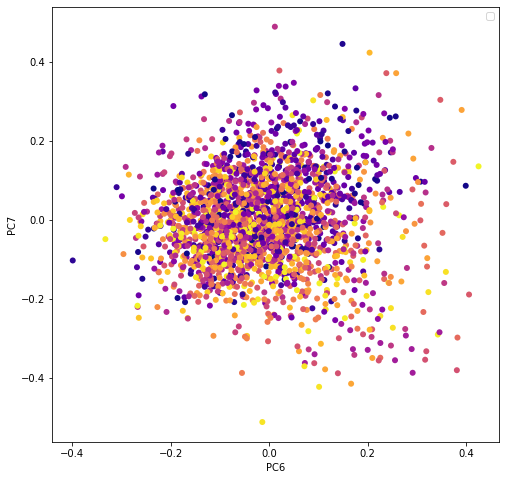

In [ ]:
pc0 = 6
pc1 = 7
n_trials = dff_pop_vals_pca.shape[0]
cmap_vals = [cmap(i/n_trials) for i in range(n_trials)]

fig, ax = plt.subplots(1, 1, figsize=(8,8))
for i in range(dff_shape[2]):
    ax.scatter(dff_pop_vals_pca[:, pc0, i], dff_pop_vals_pca[:, pc1, i], linewidth=0,
                marker='o', alpha=1.0, color=cmap_vals)
ax.set_xlabel('PC'+str(pc0))
ax.set_ylabel('PC'+str(pc1))
ax.legend()

###### Drift in a single session

This is the simple way to measure drift in a single session

Min images: 9, Max images: 18
Img 0 - Minimum dF/F vals: 18
Img 1 - Minimum dF/F vals: 18
Img 2 - Minimum dF/F vals: 18
Img 3 - Minimum dF/F vals: 18
Img 4 - Minimum dF/F vals: 18
Img 5 - Minimum dF/F vals: 18
Img 6 - Minimum dF/F vals: 18
Img 7 - Minimum dF/F vals: 18


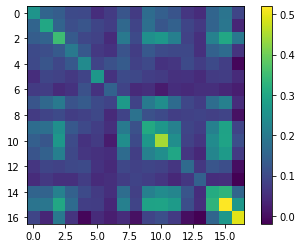

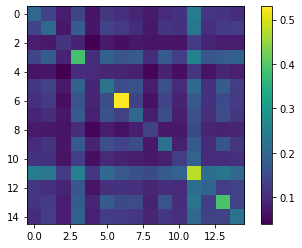

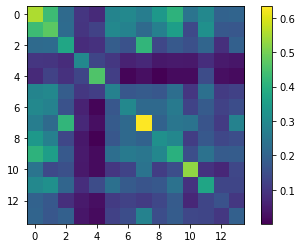

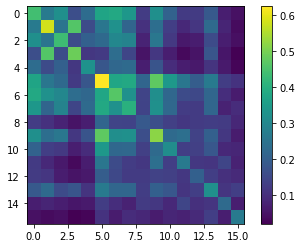

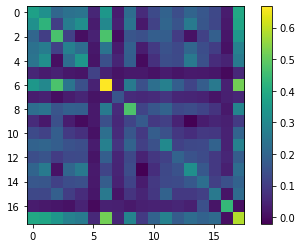

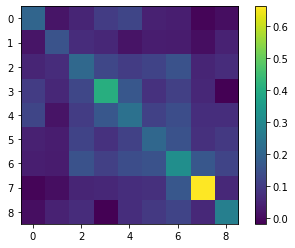

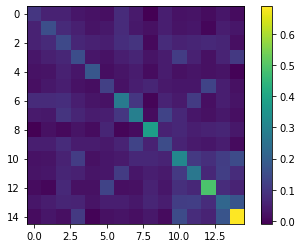

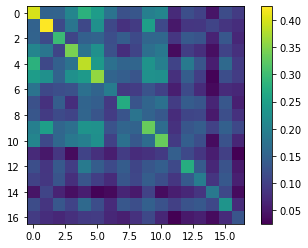

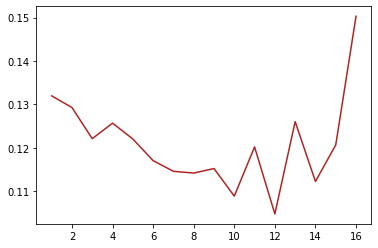

In [ ]:
type_idx = 0
ed_idx = 0
shared = False

n_images = [dff_by_image_experiments[ed_idx][img_idx].shape[0] for img_idx in range(8)]
min_images = np.min(n_images)
max_images = np.max(n_images)
print(f'Min images: {min_images}, Max images: {max_images}')

min_dff_vals = [] 
for img_idx in range(8):
    n_not_nan = []
    for idx in range(dff_by_image_experiments[ed_idx][img_idx].shape[0]):
        # Number of nans is the same for each cell, so just look at the first one
        n_not_nan.append(np.sum(~np.isnan(dff_by_image_experiments[ed_idx][img_idx][idx, 0])))

    min_dff_vals.append(np.min(n_not_nan))
    print(f'Img {img_idx} - Minimum dF/F vals:', np.min(n_not_nan))

min_dff_val = np.min(min_dff_vals)

time_corrs = [[] for _ in range(min_dff_val)]

for img_idx in range(8):
    img_corrs = np.zeros((n_images[img_idx], n_images[img_idx], min_dff_val, min_dff_val))
    for idx1 in range(n_images[img_idx]):
        for idx2 in range(n_images[img_idx]):
            if shared:
                dff1 = dff_by_image_experiments[ed_idx][img_idx][idx1, shared_cell_idxs[ed_idx], :min_dff_val].T
                dff2 = dff_by_image_experiments[ed_idx][img_idx][idx2, shared_cell_idxs[ed_idx], :min_dff_val].T
            else:
                dff1 = dff_by_image_experiments[ed_idx][img_idx][idx1, :, :min_dff_val].T
                dff2 = dff_by_image_experiments[ed_idx][img_idx][idx2, :, :min_dff_val].T

            img_corrs[idx1, idx2] = get_corr_coeff(dff1, dff2)

    avg_corrs_img = np.mean(np.mean(img_corrs, axis=-1), axis=-1)

    for i in range(n_images[img_idx]):
        for j in range(n_images[img_idx]):
            time_corrs[np.abs(i-j)].append(avg_corrs_img[i, j])

    plt.imshow(avg_corrs_img)
    plt.colorbar()
    plt.show()

# full_avg_corr = np.mean(avg_corrs, axis=0)

# plt.imshow(full_avg_corr)
# plt.colorbar()
# plt.show()

mean_corrs = [np.mean(corr_vals) for corr_vals in time_corrs]
# for idx, corr_vals in enumerate(time_corrs[1:]):
#         plt.plot((idx+1)*np.ones((len(corr_vals),)), corr_vals, color=c_vals_l[ed_idx],
#                 linewidth=0, marker='.')

# plt.plot(np.arange(1, max_images), mean_corrs[1:], color=c_vals[ed_idx],
#          label=experiment_names[ed_idx])
plt.plot(np.arange(1, max_images-1), mean_corrs[1:-1], color=c_vals[ed_idx],
         label=experiment_names[ed_idx])
plt.show()

This is the more complicated way to measure drift in a single session. 

*   Instead of using just # of images as a difference measure, it uses time bins. This properly accounts for the fact images aren't shown at regular intervals.
*   This also can bin dF/F values, taking the mean in a given time window. This is a more robust measure of the neuron values and is more analagous to what has been done in previous studies on representational drift

Img 0 - Count: 25, Minimum dF/F vals: 116
Img 1 - Count: 22, Minimum dF/F vals: 116
Img 2 - Count: 19, Minimum dF/F vals: 116
Img 3 - Count: 23, Minimum dF/F vals: 116
Img 4 - Count: 22, Minimum dF/F vals: 116
Img 5 - Count: 16, Minimum dF/F vals: 116
Img 6 - Count: 20, Minimum dF/F vals: 116
Img 7 - Count: 24, Minimum dF/F vals: 116
Image 0 bins: [ 1  1  2  3  3  3  4  4  5  5  5  6  7  8  8  9 10 11 11 12 12 13 13 13
 13]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:73: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:87: RuntimeWarning: Mean of empty slice


Image 1 bins: [ 2  2  3  4  4  5  5  6  7  7  8  8  9  9  9 10 11 11 12 13 13 13]
Image 2 bins: [ 1  2  2  2  3  3  4  5  6  8  8  8  9 10 10 11 12 12 13]
Image 3 bins: [ 0  1  1  2  3  4  4  4  6  6  6  7  7  8  8  9  9 10 11 12 12 12 13]
Image 4 bins: [ 0  1  1  2  3  4  4  4  5  6  7  7  8  9  9 10 10 11 11 12 13 13]
Image 5 bins: [ 1  2  3  4  5  5  5  7  7  9  9 10 11 11 12 13]
Image 6 bins: [ 0  1  1  2  2  3  4  4  5  5  6  6  8  8  9 11 11 11 12 13]
Image 7 bins: [ 0  0  2  3  3  3  5  6  6  7  7  7  9  9 10 10 11 11 11 12 12 12 13 13]
Img 0 - Count: 15, Minimum dF/F vals: 116
Img 1 - Count: 15, Minimum dF/F vals: 116
Img 2 - Count: 7, Minimum dF/F vals: 116
Img 3 - Count: 14, Minimum dF/F vals: 116
Img 4 - Count: 15, Minimum dF/F vals: 116
Img 5 - Count: 11, Minimum dF/F vals: 116
Img 6 - Count: 9, Minimum dF/F vals: 116
Img 7 - Count: 13, Minimum dF/F vals: 116
Image 0 bins: [ 0  1  1  2  2  3  4  4  7  7  7  8 12 13 13]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:73: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:87: RuntimeWarning: Mean of empty slice


Image 1 bins: [ 0  1  2  3  3  4  5  6  6  7 12 12 13 13 13]
Image 2 bins: [ 0  1  2  3  4 12 13]
Image 3 bins: [ 1  1  2  2  3  4  4  7  8 12 12 12 13 13]
Image 4 bins: [ 0  0  1  2  2  3  3  6  7  7 12 13 13 13 13]
Image 5 bins: [ 0  0  2  3  4  6  8 11 13 13 13]
Image 6 bins: [ 1  1  2  3  3  4  7  8 12]
Image 7 bins: [ 0  1  3  4  4  7  7  8  8  8 12 12 13]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:99: RuntimeWarning: Mean of empty slice


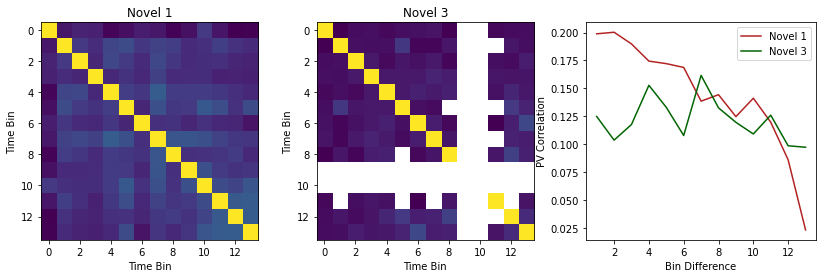

In [ ]:
def get_corr_coeff(x, y):
    x_mean = np.nanmean(x, axis=-1)[:, np.newaxis]
    y_mean = np.nanmean(y, axis=-1)[:, np.newaxis]
    # print('x_mean:', x_mean)
    # print('y_mean:', y_mean)
    x_std = np.nanstd(x, axis=-1)
    y_std = np.nanstd(y, axis=-1)
    return np.matmul(x-x_mean, (y-y_mean).T)/(x.shape[-1]*np.outer(x_std, y_std))

# Number of bins to divide the session up into
n_time_bins = 14

# Number of bins to divide the dF/F value up into 
dff_bin = False
n_dff_bins = 15

shared = False

fig, ax = plt.subplots(1, 3, figsize=(14, 4))

for ed_idx in range(2):

    eng_trial_ids = eng_trial_ids_experiment[ed_idx]

    # Sets time threshold on hits
    query_string = 'hit == True and trials_id in @eng_trial_ids[0]'
    start_time = experiment_datasets[ed_idx].trials.query(query_string).head(1)['start_time'].iloc[0]
    end_time = experiment_datasets[ed_idx].trials.query(query_string).tail(1)['start_time'].iloc[0]

    time_bins = np.linspace(start_time, end_time, n_time_bins+1)[:-1]

    min_dff_vals = []

    for img_idx in range(8):
        n_not_nan = []
        n_images = dff_by_image_experiments[ed_idx][img_idx].shape[0]
        for idx in range(n_images):
            # Number of nans is the same for each cell, so just look at the first one
            n_not_nan.append(np.sum(~np.isnan(dff_by_image_experiments[ed_idx][img_idx][idx, 0])))

        min_dff_vals.append(np.min(n_not_nan))
        print(f'Img {img_idx} - Count: {n_images}, Minimum dF/F vals:', np.min(n_not_nan))

    min_dff_val = np.min(min_dff_vals)
    
    if dff_bin: 
        dff_idxs = np.arange(min_dff_val)
        dff_bins = np.linspace(0, min_dff_val, n_dff_bins+1)[:-1]
        dff_idx_bins = np.digitize(dff_idxs, dff_bins)-1
    else: # Number of bins is simply the number of dff vals
        n_dff_bins = min_dff_val


    n_cells = dff_by_image_experiments[ed_idx][img_idx].shape[1]

    mean_img_dff_time_bin = np.empty((8, n_time_bins, n_cells, n_dff_bins))
    mean_img_dff_time_bin[:] = np.nan

    avg_corrs = np.empty((8, n_time_bins, n_time_bins))
    avg_corrs[:] = np.nan
    time_corrs = [[] for _ in range(n_time_bins)]

    for img_idx in range(8):
        time_bins_img = np.digitize(time_by_image_experiments[ed_idx][img_idx], time_bins) - 1
        print(f'Image {img_idx} bins:', time_bins_img)
        dff_vals = dff_by_image_experiments[ed_idx][img_idx][:, :, :min_dff_val]
        if dff_bin:
            bin_means = np.array([np.nanmean(dff_vals[:, :, dff_idx_bins == i], axis=-1) for i in range(0, n_dff_bins)])
            dff_vals = np.transpose(bin_means, axes=(1, 2, 0))

        for time_bin in range(n_time_bins):
            # print(f'  Time bin {time_bin} count:', np.sum(time_bins_img == time_bin))
            mean_img_dff_time_bin[img_idx, time_bin] = np.nanmean(dff_vals[time_bins_img == time_bin, :, :], axis=0)

        img_corrs = np.zeros((n_time_bins, n_time_bins, n_dff_bins, n_dff_bins))
        for idx1 in range(n_time_bins):
            for idx2 in range(n_time_bins):
                if shared:
                    dff1 = mean_img_dff_time_bin[img_idx, idx1, shared_cell_idxs[ed_idx], :].T
                    dff2 = mean_img_dff_time_bin[img_idx, idx2, shared_cell_idxs[ed_idx], :].T
                else:
                    dff1 = mean_img_dff_time_bin[img_idx, idx1, :, :].T
                    dff2 = mean_img_dff_time_bin[img_idx, idx2, :, :].T
                img_corrs[idx1, idx2] = get_corr_coeff(dff1, dff2)

        img_corrs_diag = np.array([img_corrs[:, :, i, i] for i in range(n_dff_bins)])
        avg_corrs_img = np.nanmean(img_corrs_diag, axis=0)
        avg_corrs[img_idx] = avg_corrs_img

        for i in range(n_time_bins):
            for j in range(n_time_bins):
                if ~np.isnan(avg_corrs_img[i, j]):
                    time_corrs[np.abs(i-j)].append(avg_corrs_img[i, j])

        # plt.imshow(avg_corrs_img)
        # plt.colorbar()
        # plt.show()

    ax[ed_idx].imshow(np.nanmean(avg_corrs, axis=0))
    ax[ed_idx].set_xlabel('Time Bin')
    ax[ed_idx].set_ylabel('Time Bin')
    ax[ed_idx].set_title(experiment_names[ed_idx])

    mean_corrs = [np.nanmean(corr_vals) for corr_vals in time_corrs]
    # for idx, corr_vals in enumerate(time_corrs[1:]):
    #         plt.plot((idx+1)*np.ones((len(corr_vals),)), corr_vals, color=c_vals_l[ed_idx],
    #                 linewidth=0, marker='.')

    plt.plot(np.arange(1, n_time_bins), mean_corrs[1:], color=c_vals[ed_idx],
             label=experiment_names[ed_idx])
    # ax[2].plot(np.arange(1, n_time_bins-2), mean_corrs[1:-2], color=c_vals[ed_idx],
    #         label=experiment_names[ed_idx])

ax[2].set_xlabel('Bin Difference')
ax[2].set_ylabel('PV Correlation')
ax[2].legend()

Min images: 4, Max images: 18


NameError: ignored

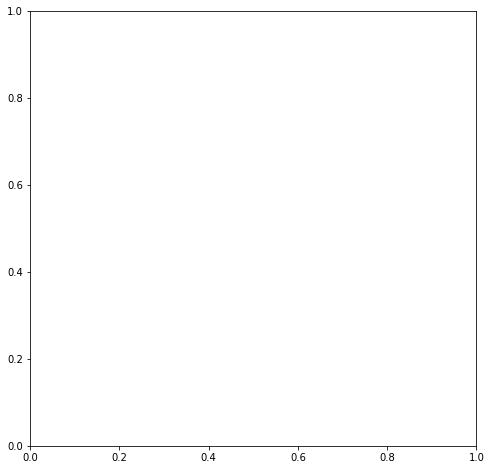

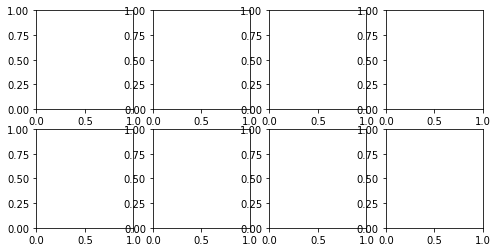

In [ ]:
def get_corr_coeff(x, y):
    x_mean = np.mean(x, axis=-1)[:, np.newaxis]
    y_mean = np.mean(y, axis=-1)[:, np.newaxis]
    x_std = np.std(x, axis=-1)
    y_std = np.std(y, axis=-1)

    return np.matmul(x-x_mean, (y-y_mean).T)/(x.shape[-1]*np.outer(x_std, y_std))

type_idx = 0
ed_idx = 0
fig, ax = plt.subplots(1, 1, figsize=(8,8))

n_images = [dff_by_image_experiments[ed_idx][img_idx].shape[0] for img_idx in range(8)]
min_images = np.min(n_images)
max_images = np.max(n_images)
print(f'Min images: {min_images}, Max images: {max_images}')

img_corrs = np.zeros((8, min_images, min_images))

time_corrs = [[] for _ in range(max_images)]

fig2, ax2 = plt.subplots(2, 4, figsize=(8,4))
for img_idx in range(8):
    corrs = get_corr_coeff(
                dff_by_image_experiments[ed_idx][img_idx][:, shared_cell_idxs[ed_idx]],
                dff_by_image_experiments[ed_idx][img_idx][:, shared_cell_idxs[ed_idx]])
    ax2[img_idx // 4, img_idx % 4].imshow(corrs)
    ax2[img_idx // 4, img_idx % 4].set_title(f'Img: {img_idx}')
    img_corrs[img_idx] = corrs[:min_images, :min_images]

    for i in range(corrs.shape[0]):
        for j in range(corrs.shape[0]):
            time_corrs[np.abs(i-j)].append(corrs[i, j])

# fig, ax = plt.subplots(1, 1, figsize=(8,8))
# ax.imshow(get_corr_coeff(dff_vals_experiments[ed_idx][type_idx],
#                          dff_vals_experiments[ed_idx][type_idx],))

mean_corrs = [np.mean(corr_vals) for corr_vals in time_corrs]
# for idx, corr_vals in enumerate(time_corrs[1:]):
#     ax.plot((idx+1)*np.ones((len(corr_vals),)), corr_vals, color=c_vals_l[ed_idx],
#             linewidth=0, marker='.')

# ax.plot(np.arange(1, max_images), mean_corrs[1:], color=c_vals[ed_idx],
#         label=experiment_names[ed_idx])
    
    
# ax.set_xlabel('Images Difference')
# ax.set_ylabel('PV Correlation')
# ax.legend()

### Comparison of response to new images

In [ ]:
# Collect all ophys experiments in a table
experiment_table = cache.get_ophys_experiment_table()
# Here are all of the unique session types
print('Unique session types:', np.sort(experiment_table['session_type'].unique()))
equipment_names = experiment_table['equipment_name'].unique()
print('Unique equipment names:', equipment_names)
mouse_ids = experiment_table['mouse_id'].unique()
print('Number of unique mice:', len(mouse_ids))

Unique session types: ['OPHYS_1_images_A' 'OPHYS_1_images_B' 'OPHYS_1_images_G'
 'OPHYS_2_images_A_passive' 'OPHYS_2_images_B_passive'
 'OPHYS_2_images_G_passive' 'OPHYS_3_images_A' 'OPHYS_3_images_B'
 'OPHYS_3_images_G' 'OPHYS_4_images_A' 'OPHYS_4_images_B'
 'OPHYS_4_images_H' 'OPHYS_5_images_A_passive' 'OPHYS_5_images_B_passive'
 'OPHYS_5_images_H_passive' 'OPHYS_6_images_A' 'OPHYS_6_images_B'
 'OPHYS_6_images_H']
Unique equipment names: ['MESO.1' 'CAM2P.4' 'CAM2P.3' 'CAM2P.5']
Number of unique mice: 107


In [ ]:
equipment_mouse_ids = {equipment_name :[] for equipment_name in equipment_names}
for mouse_id in mouse_ids:
    mouse_id_equipment_name = experiment_table.query('mouse_id == @mouse_id').iloc[0, 0]
    equipment_mouse_ids[mouse_id_equipment_name].append(mouse_id)

for equipment_name in equipment_mouse_ids:
    print(f'Equipment {equipment_name} - Number of mice: {len(equipment_mouse_ids[equipment_name])}',)

Equipment MESO.1 - Number of mice: 19
Equipment CAM2P.4 - Number of mice: 24
Equipment CAM2P.3 - Number of mice: 27
Equipment CAM2P.5 - Number of mice: 12


In [ ]:
n_mice = 10
# np.random.seed(5)
np.random.seed(14)
equipment_name = 'CAM2P.4'
mouse_test_ids = np.random.choice(equipment_mouse_ids[equipment_name], n_mice)
print('Mouse ID:', mouse_test_ids)

Mouse ID: [489066 539518 425496 533161 447663 523927 523927 436662 468866 524274]


In [ ]:
mouse_id = 448900
experiment_table.query('mouse_id == @mouse_id')

,equipment_name,full_genotype,mouse_id,reporter_line,driver_line,sex,age_in_days,cre_line,indicator,session_number,prior_exposures_to_session_type,prior_exposures_to_image_set,prior_exposures_to_omissions,ophys_session_id,behavior_session_id,ophys_container_id,project_code,imaging_depth,targeted_structure,date_of_acquisition,session_type,file_id
ophys_experiment_id,,,,,,,,,,,,,,,,,,,,,,
869969393,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,122.0,Slc17a7-IRES2-Cre,GCaMP6s,5.0,0,1.0,4,869118259,869303255,863992815,VisualBehavior,175,VISp,2019-05-16 15:49:11.000000,OPHYS_5_images_B_passive,870677160
873154932,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,127.0,Slc17a7-IRES2-Cre,GCaMP6s,1.0,1,20.0,6,872551243,872621004,863992815,VisualBehavior,175,VISp,2019-05-21 15:34:57.000000,OPHYS_1_images_A,873396232
873968820,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,128.0,Slc17a7-IRES2-Cre,GCaMP6s,1.0,2,21.0,7,873653940,873846349,863992815,VisualBehavior,175,VISp,2019-05-22 19:09:19.000000,OPHYS_1_images_A,874234035
875045489,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,129.0,Slc17a7-IRES2-Cre,GCaMP6s,2.0,1,22.0,8,874323406,874533721,863992815,VisualBehavior,175,VISp,2019-05-23 17:21:26.000000,OPHYS_2_images_A_passive,875773963
877018118,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,134.0,Slc17a7-IRES2-Cre,GCaMP6s,3.0,1,24.0,10,876522267,876660021,863992815,VisualBehavior,175,VISp,2019-05-28 17:45:44.000000,OPHYS_3_images_A,877099747
877691075,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,135.0,Slc17a7-IRES2-Cre,GCaMP6s,6.0,1,3.0,11,877497698,877605088,863992815,VisualBehavior,175,VISp,2019-05-29 19:32:29.000000,OPHYS_6_images_B,877757771
878358326,CAM2P.4,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai94(TITL-G...,448900,Ai94(TITL-GCaMP6s),"[Slc17a7-IRES2-Cre, Camk2a-tTA]",M,136.0,Slc17a7-IRES2-Cre,GCaMP6s,6.0,2,4.0,12,877907546,878075965,863992815,VisualBehavior,175,VISp,2019-05-30 17:29:35.000000,OPHYS_6_images_B,879255318


In [ ]:
train_datasets = []
test_datasets = []

for mouse_id in mouse_test_ids:
    print('Mouse:', mouse_id)
    # Looks for specific pairs of sessions 
    if not (experiment_table.query('session_type == "OPHYS_1_images_B" and mouse_id == @mouse_id').empty or 
            experiment_table.query('session_type == "OPHYS_4_images_A" and mouse_id == @mouse_id').empty):
        experiment_id_train = experiment_table.query('session_type == "OPHYS_1_images_B" and mouse_id == @mouse_id').sample().index[0]
        experiment_id_test = experiment_table.query('session_type == "OPHYS_4_images_A" and mouse_id == @mouse_id').sample().index[0]
        print('Mouse:', mouse_id, ' - Experiment_id for OPHYS_1_images_B:', experiment_id_train)
        print('Mouse:', mouse_id, ' - Experiment_id for OPHYS_4_images_A:', experiment_id_test)
    elif not (experiment_table.query('session_type == "OPHYS_1_images_A" and mouse_id == @mouse_id').empty or 
              experiment_table.query('session_type == "OPHYS_4_images_B" and mouse_id == @mouse_id').empty):
        experiment_id_train = experiment_table.query('session_type == "OPHYS_1_images_A" and mouse_id == @mouse_id').sample().index[0]
        experiment_id_test = experiment_table.query('session_type == "OPHYS_4_images_B" and mouse_id == @mouse_id').sample().index[0]
        print('Mouse:', mouse_id, ' - Experiment_id for OPHYS_1_images_A:', experiment_id_train)
        print('Mouse:', mouse_id, ' - Experiment_id for OPHYS_4_images_B:', experiment_id_test)
    else:
        print('Mouse:', mouse_id, 'missing experiment ids')
        continue

    train_datasets.append(cache.get_behavior_ophys_experiment(experiment_id_train))
    test_datasets.append(cache.get_behavior_ophys_experiment(experiment_id_test))

Mouse: 489066
Mouse: 489066  - Experiment_id for OPHYS_1_images_B: 992868972
Mouse: 489066  - Experiment_id for OPHYS_4_images_A: 993862120


behavior_ophys_experiment_992868972.nwb: 100%|██████████| 271M/271M [00:21<00:00, 12.8MMB/s]
behavior_ophys_experiment_993862120.nwb: 100%|██████████| 276M/276M [00:15<00:00, 17.7MMB/s]
behavior_ophys_experiment_1059549281.nwb:   0%|          | 0.00/974M [00:00<?, ?MB/s]

Mouse: 539518
Mouse: 539518  - Experiment_id for OPHYS_1_images_B: 1059549281
Mouse: 539518  - Experiment_id for OPHYS_4_images_A: 1060759278


behavior_ophys_experiment_1059549281.nwb: 100%|██████████| 974M/974M [00:49<00:00, 19.6MMB/s]
behavior_ophys_experiment_1060759278.nwb: 100%|██████████| 997M/997M [00:50<00:00, 19.8MMB/s]
behavior_ophys_experiment_806455766.nwb:   0%|          | 0.00/1.51G [00:00<?, ?MB/s]

Mouse: 425496
Mouse: 425496  - Experiment_id for OPHYS_1_images_A: 806455766
Mouse: 425496  - Experiment_id for OPHYS_4_images_B: 808621034


behavior_ophys_experiment_806455766.nwb: 100%|██████████| 1.51G/1.51G [01:18<00:00, 19.3MMB/s]
behavior_ophys_experiment_808621034.nwb: 100%|██████████| 1.80G/1.80G [01:26<00:00, 20.7MMB/s]
behavior_ophys_experiment_1047025008.nwb:   0%|          | 0.00/836M [00:00<?, ?MB/s]

Mouse: 533161
Mouse: 533161  - Experiment_id for OPHYS_1_images_B: 1047025008
Mouse: 533161  - Experiment_id for OPHYS_4_images_A: 1048044013


behavior_ophys_experiment_1047025008.nwb: 100%|██████████| 836M/836M [00:43<00:00, 19.4MMB/s]
behavior_ophys_experiment_1048044013.nwb: 100%|██████████| 936M/936M [00:46<00:00, 20.2MMB/s]
behavior_ophys_experiment_859147033.nwb:   0%|          | 0.00/980M [00:00<?, ?MB/s]

Mouse: 447663
Mouse: 447663  - Experiment_id for OPHYS_1_images_A: 859147033
Mouse: 447663  - Experiment_id for OPHYS_4_images_B: 853962951


behavior_ophys_experiment_859147033.nwb: 100%|██████████| 980M/980M [00:48<00:00, 20.2MMB/s]
behavior_ophys_experiment_853962951.nwb: 100%|██████████| 572M/572M [00:28<00:00, 20.0MMB/s]
behavior_ophys_experiment_1052609309.nwb:   0%|          | 0.00/290M [00:00<?, ?MB/s]

Mouse: 523927
Mouse: 523927  - Experiment_id for OPHYS_1_images_A: 1052609309
Mouse: 523927  - Experiment_id for OPHYS_4_images_B: 1053997501


behavior_ophys_experiment_1052609309.nwb: 100%|██████████| 290M/290M [00:14<00:00, 20.2MMB/s]
behavior_ophys_experiment_1053997501.nwb: 100%|██████████| 273M/273M [00:13<00:00, 20.3MMB/s]


Mouse: 523927
Mouse: 523927  - Experiment_id for OPHYS_1_images_A: 1052609309
Mouse: 523927  - Experiment_id for OPHYS_4_images_B: 1053997501
Mouse: 436662
Mouse: 436662  - Experiment_id for OPHYS_1_images_A: 848692970
Mouse: 436662  - Experiment_id for OPHYS_4_images_B: 851056106


behavior_ophys_experiment_848692970.nwb: 100%|██████████| 1.15G/1.15G [01:15<00:00, 15.4MMB/s]
behavior_ophys_experiment_851056106.nwb: 100%|██████████| 1.37G/1.37G [01:17<00:00, 17.8MMB/s]
behavior_ophys_experiment_938003662.nwb:   0%|          | 0.00/278M [00:00<?, ?MB/s]

Mouse: 468866
Mouse: 468866  - Experiment_id for OPHYS_1_images_A: 938003662
Mouse: 468866  - Experiment_id for OPHYS_4_images_B: 950833329


behavior_ophys_experiment_938003662.nwb: 100%|██████████| 278M/278M [00:15<00:00, 17.6MMB/s]
behavior_ophys_experiment_950833329.nwb: 100%|██████████| 285M/285M [00:16<00:00, 17.2MMB/s]
behavior_ophys_experiment_1042639868.nwb:   0%|          | 0.00/308M [00:00<?, ?MB/s]

Mouse: 524274
Mouse: 524274  - Experiment_id for OPHYS_1_images_A: 1042639868
Mouse: 524274  - Experiment_id for OPHYS_4_images_B: 1044095203


behavior_ophys_experiment_1042639868.nwb: 100%|██████████| 308M/308M [00:16<00:00, 19.1MMB/s]
behavior_ophys_experiment_1044095203.nwb: 100%|██████████| 284M/284M [00:15<00:00, 18.5MMB/s]


In [ ]:
trials_dfs_train = []
trials_dfs_test = []

for mouse_idx, mouse_id in enumerate(mouse_test_ids):
    print(f'Mouse {moude_idx} idx: {mouse_id}')
    trials_dfs_train.append(train_datasets[mouse_idx].trials.merge(
        train_datasets[mouse_idx].get_rolling_performance_df().fillna(method='ffill'), # performance data is NaN on aborted trials. Fill forward to populate.
        left_index = True,
        right_index = True
    ))
    trials_dfs_test.append(test_datasets[mouse_idx].trials.merge(
        test_datasets[mouse_idx].get_rolling_performance_df().fillna(method='ffill'), # performance data is NaN on aborted trials. Fill forward to populate.
        left_index = True,
        right_index = True
    ))

Mouse: 489066
Mouse: 539518
Mouse: 425496
Mouse: 533161
Mouse: 447663
Mouse: 523927
Mouse: 523927
Mouse: 436662
Mouse: 468866
Mouse: 524274


In [ ]:
print(hit_rate_train.index.get_loc(hit_rate_train.first_valid_index()))
print(hit_rate_raw_train.index.get_loc(hit_rate_raw_train.first_valid_index()))
print(false_alarm_rate_train.index.get_loc(false_alarm_rate_train.first_valid_index()))
print(false_alarm_rate_raw_train.index.get_loc(false_alarm_rate_raw_train.first_valid_index()))
print(rolling_dprime_train.index.get_loc(rolling_dprime_train.first_valid_index()))

23
23
32
32
32


In [ ]:
start_time_hit_train

trials_id
0       0.000000
1       0.025023
2       0.150123
3       0.237694
4       0.375308
         ...    
584    59.348418
585    59.486030
586    59.636153
587    59.773765
588    59.911377
Name: start_time, Length: 589, dtype: float64

In [ ]:
mouse_test_ids

array([489066, 539518, 425496, 533161, 447663, 523927, 523927, 436662,
       468866, 524274])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:65: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:72: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:73: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:77: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:78: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:79: RuntimeWarning: Mean of empty slice
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:80: RuntimeWarning: Mean of em

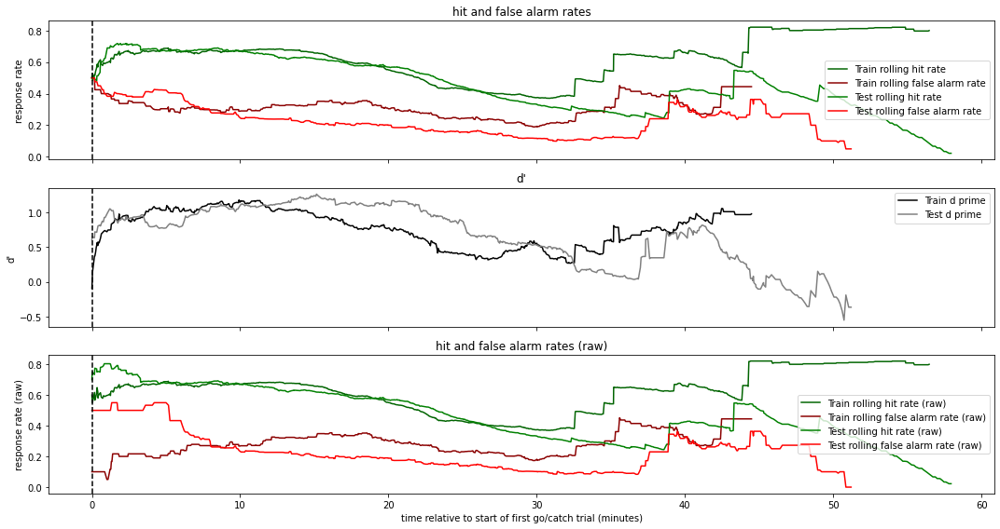

In [ ]:
mouse_id_plot = mouse_test_ids

time_lengths_train = []
time_lengths_test = []
for mouse_id in mouse_id_plot:
    time_lengths_train.append(trials_dfs_train[list(mouse_test_ids).index(mouse_id)].shape[0])
    time_lengths_test.append(trials_dfs_test[list(mouse_test_ids).index(mouse_id)].shape[0])
max_time_idx_train = np.argmax(time_lengths_train)
max_time_idx_test = np.argmax(time_lengths_test)
max_time_train = trials_dfs_train[list(mouse_test_ids).index(mouse_id_plot[max_time_idx_train])]['start_time']
max_time_test = trials_dfs_test[list(mouse_test_ids).index(mouse_id_plot[max_time_idx_test])]['start_time']
max_time_train = (max_time_train-max_time_train[0])/60.
max_time_test = (max_time_test-max_time_test[0])/60.


hit_rates_train = np.empty((len(mouse_id_plot), max_time_train.shape[0]))
hit_rates_train[:] = np.nan
hit_rates_test = np.empty((len(mouse_id_plot), max_time_test.shape[0]))
hit_rates_test[:] = np.nan
false_alarm_rates_train = np.copy(hit_rates_train)
false_alarm_rates_test = np.copy(hit_rates_test)

dprimes_train = np.copy(hit_rates_train)
dprimes_test = np.copy(hit_rates_test)

hit_rates_raw_train = np.copy(hit_rates_train)
false_alarm_rates_raw_train = np.copy(hit_rates_train)
hit_rates_raw_test = np.copy(hit_rates_test)
false_alarm_rates_raw_test = np.copy(hit_rates_test)

for mouse_id_idx, mouse_id in enumerate(mouse_id_plot):

    trial_df_train = trials_dfs_train[list(mouse_test_ids).index(mouse_id)]
    trial_df_test = trials_dfs_test[list(mouse_test_ids).index(mouse_id)]
    
    first_hit_idx_train = trial_df_train['hit_rate'].index.get_loc(trial_df_train['hit_rate'].first_valid_index())
    first_false_alarm_idx_train = trial_df_train['false_alarm_rate'].index.get_loc(trial_df_train['false_alarm_rate'].first_valid_index())
    first_hit_idx_test = trial_df_test['hit_rate'].index.get_loc(trial_df_test['hit_rate'].first_valid_index())
    first_false_alarm_idx_test = trial_df_test['false_alarm_rate'].index.get_loc(trial_df_test['false_alarm_rate'].first_valid_index())
    first_dprime_idx_train = np.max([first_hit_idx_train, first_false_alarm_idx_train])
    first_dprime_idx_test = np.max([first_hit_idx_test, first_false_alarm_idx_test])

    start_time_hit_train = (trial_df_train['start_time'][first_hit_idx_train:] - trial_df_train['start_time'][first_hit_idx_train])/60.
    start_time_false_alarm_train = (trial_df_train['start_time'][first_false_alarm_idx_train:] - trial_df_train['start_time'][first_false_alarm_idx_train])/60.
    start_time_hit_test = (trial_df_test['start_time'][first_hit_idx_test:] - trial_df_test['start_time'][first_hit_idx_test])/60.
    start_time_false_alarm_test = (trial_df_test['start_time'][first_false_alarm_idx_test:] - trial_df_test['start_time'][first_false_alarm_idx_test])/60.
    start_time_dprime_train = (trial_df_train['start_time'][first_dprime_idx_train:] - trial_df_train['start_time'][first_dprime_idx_train])/60.
    start_time_dprime_test = (trial_df_test['start_time'][first_dprime_idx_test:] - trial_df_test['start_time'][first_dprime_idx_test])/60.

    # DOES IT MAKE SENSE TO PLOT BOTH OF THESE ON THE SAME PLOT WITH DIFFERENT START TIMES?
    hit_rates_train[mouse_id_idx, :trial_df_train['hit_rate'][first_hit_idx_train:].shape[0]] = trial_df_train['hit_rate'][first_hit_idx_train:]
    false_alarm_rates_train[mouse_id_idx, :trial_df_train['false_alarm_rate'][first_false_alarm_idx_train:].shape[0]] = trial_df_train['false_alarm_rate'][first_false_alarm_idx_train:]
    hit_rates_test[mouse_id_idx, :trial_df_test['hit_rate'][first_hit_idx_test:].shape[0]] = trial_df_test['hit_rate'][first_hit_idx_test:]
    false_alarm_rates_test[mouse_id_idx, :trial_df_test['false_alarm_rate'][first_false_alarm_idx_test:].shape[0]] = trial_df_test['false_alarm_rate'][first_false_alarm_idx_test:]

    dprimes_train[mouse_id_idx, :trial_df_train['rolling_dprime'][first_dprime_idx_train:].shape[0]] = trial_df_train['rolling_dprime'][first_dprime_idx_train:]
    dprimes_test[mouse_id_idx, :trial_df_test['rolling_dprime'][first_dprime_idx_test:].shape[0]] = trial_df_test['rolling_dprime'][first_dprime_idx_test:]

    hit_rates_raw_train[mouse_id_idx, :trial_df_train['hit_rate_raw'][first_hit_idx_train:].shape[0]] = trial_df_train['hit_rate_raw'][first_hit_idx_train:]
    false_alarm_rates_raw_train[mouse_id_idx, :trial_df_train['false_alarm_rate_raw'][first_false_alarm_idx_train:].shape[0]] = trial_df_train['false_alarm_rate_raw'][first_false_alarm_idx_train:]
    hit_rates_raw_test[mouse_id_idx, :trial_df_test['hit_rate_raw'][first_hit_idx_test:].shape[0]] = trial_df_test['hit_rate_raw'][first_hit_idx_test:]
    false_alarm_rates_raw_test[mouse_id_idx, :trial_df_test['false_alarm_rate_raw'][first_false_alarm_idx_test:].shape[0]] = trial_df_test['false_alarm_rate_raw'][first_false_alarm_idx_test:]

fig, ax = plt.subplots(3, 1, figsize = (15,8), sharex=True)
ax[0].plot(max_time_train, np.nanmean(hit_rates_train, axis=0), color='darkgreen')
ax[0].plot(max_time_train, np.nanmean(false_alarm_rates_train, axis=0), color='darkred')
ax[0].plot(max_time_test, np.nanmean(hit_rates_test, axis=0), color='green')
ax[0].plot(max_time_test, np.nanmean(false_alarm_rates_test, axis=0), color='red')

ax[0].legend(['Train rolling hit rate', 'Train rolling false alarm rate', 'Test rolling hit rate', 'Test rolling false alarm rate'])

ax[1].plot(max_time_train, np.nanmean(dprimes_train, axis=0), color='black')
ax[1].plot(max_time_test, np.nanmean(dprimes_test, axis=0), color='grey')

ax[1].legend(['Train d prime', 'Test d prime'])

ax[2].plot(max_time_train, np.nanmean(hit_rates_raw_train, axis=0), color='darkgreen')
ax[2].plot(max_time_train, np.nanmean(false_alarm_rates_raw_train, axis=0), color='darkred')
ax[2].plot(max_time_test, np.nanmean(hit_rates_raw_test, axis=0), color='green')
ax[2].plot(max_time_test, np.nanmean(false_alarm_rates_raw_test, axis=0), color='red')

ax[2].legend(['Train rolling hit rate (raw)', 'Train rolling false alarm rate (raw)', 'Test rolling hit rate (raw)', 'Test rolling false alarm rate (raw)'])

for i in range(3):
    ax[i].axvline(0.0, color='k', linestyle='dashed')  

ax[2].set_xlabel('time relative to start of first go/catch trial (minutes)')

ax[0].set_ylabel('response rate')
ax[1].set_ylabel("d'")
ax[2].set_ylabel('response rate (raw)')
ax[0].set_title('hit and false alarm rates')
ax[1].set_title("d'")
ax[2].set_title('hit and false alarm rates (raw)')

fig.tight_layout()